In [1]:
# -*- coding: utf-8 -*-
"""
Created on Thu Sep  1 09:37:30 2022
@author: IaniroA
modified by Aleksander A. Rebane 10.01.2026
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize, root, least_squares,differential_evolution, Bounds, brentq
# from sympy import *   

# import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

from datetime import datetime
from tqdm import tqdm
# from Bio import Entrez, SeqIO
import pickle
# import csv

# Get the current date
today = datetime.now()

# Format the date as "YYMMDD"
date_string = today.strftime("%y%m%d")

%matplotlib inline

mbsa = 66.4
mpeg100 = 100
mpeg20 = 20
mpeg35 = 35
mpeg8 = 8
mpeg6 = 6
mpeg4 = 4
mpeg48_wt = 5.3

mpegQ8 = (8/(14.8/3))**(1/0.6379)*mpeg100
mpegQ10 = (10/(14.8/3))**(1/0.6379)*mpeg100
mpegQ16 = (16/(14.8/3))**(1/0.6379)*mpeg100

rbsa = 3.0e-9

rpeg4K = 1.9e-9
rpeg6K = 2.45e-9
rpeg8K = 3.1e-9
rpeg20K = 5.4e-9
rpeg35K = 7.8e-9
rpeg100K = 14.8e-9
rpegQ8 = 24e-9
rpegQ10 = 32e-9
rpegQ16 = 48e-9

# print(mpegQ16_GFP)
# print(mpegQ8)
# print(mpegQ16)
# print(3-1/0.6379)

Nav = 6.022e23 # avogadro

# Load data

In [2]:
data_4K_pH7_200mM_MA3 = np.loadtxt('../data/PEG_4K_BSA_Data.csv', delimiter=',')
data_6K_pH7_200mM_SD = np.loadtxt('../data/PEG_6K_BSA_Data.csv', delimiter=',')
data_8K_pH7_200mM_SD = np.loadtxt('../data/PEG_8K_BSA_Data.csv', delimiter=',')
data_20K_pH7_200mM = np.loadtxt('../data/PEG_20K_BSA_Data.csv', delimiter=',')
data_35K_pH7_200mM = np.loadtxt('../data/PEG_35K_BSA_Data.csv', delimiter=',')
data_100K_pH7_200mM = np.loadtxt('../data/PEG_100K_BSA_Data.csv', delimiter=',')

data_2K8K_pH7_200mM_n_MW = np.loadtxt('../data/PEG_8K_2K_Mn6K_BSA_Data.csv', delimiter=',')
data_2K8K_pH7_200mM_n_MW8K = np.loadtxt('../data/PEG_8K_2K_8Konly_BSA_Data.csv', delimiter=',')
data_2K35K_pH7_200mM_n = np.loadtxt('../data/PEG_35K_2K_Mn6K_BSA_Data.csv', delimiter=',')
data_2K35K_pH7_200mM_35only = np.loadtxt('../data/PEG_35K_2K_35Konly_BSA_Data.csv', delimiter=',')

data_35K_GFP = np.loadtxt('../data/PEG_35K_GFP_Data.csv', delimiter=',')
data_20K_GFP = np.loadtxt('../data/PEG_20K_GFP_Data.csv', delimiter=',')


# Pickle

## Load pickled variables

In [3]:
# Load the saved variables

with open('../pickles/260424_output.pkl', 'rb') as f:
    loaded_variables = pickle.load(f)

# Access variables
gfvt4K_200mM_Z0 = loaded_variables['gfvt4K_200mM_Z0']
gfvt6K_200mM_Z0 = loaded_variables['gfvt6K_200mM_Z0']
gfvt8K_200mM_Z0 = loaded_variables['gfvt8K_200mM_Z0']
gfvt20K_200mM_Z0 = loaded_variables['gfvt20K_200mM_Z0']
gfvt35K_200mM_Z0 = loaded_variables['gfvt35K_200mM_Z0']
gfvt100K_200mM_Z0 = loaded_variables['gfvt100K_200mM_Z0']

gfvt4K_200mM_Z0_FVT = loaded_variables['gfvt4K_200mM_Z0_FVT']
gfvt6K_200mM_Z0_FVT = loaded_variables['gfvt6K_200mM_Z0_FVT']
gfvt8K_200mM_Z0_FVT = loaded_variables['gfvt8K_200mM_Z0_FVT']
gfvt20K_200mM_Z0_FVT = loaded_variables['gfvt20K_200mM_Z0_FVT']
gfvt35K_200mM_Z0_FVT = loaded_variables['gfvt35K_200mM_Z0_FVT']
gfvt100K_200mM_Z0_FVT = loaded_variables['gfvt100K_200mM_Z0_FVT']
gfvt100K_200mM_Z0_FVT_ex = loaded_variables['gfvt100K_200mM_Z0_FVT_ex']

gfvt4K_200mM_Z0_theta = loaded_variables['gfvt4K_200mM_Z0_theta']
gfvt6K_200mM_Z0_theta = loaded_variables['gfvt6K_200mM_Z0_theta']
gfvt8K_200mM_Z0_theta = loaded_variables['gfvt8K_200mM_Z0_theta']
gfvt20K_200mM_Z0_theta = loaded_variables['gfvt20K_200mM_Z0_theta']
gfvt35K_200mM_Z0_theta = loaded_variables['gfvt35K_200mM_Z0_theta']
gfvt100K_200mM_Z0_theta = loaded_variables['gfvt100K_200mM_Z0_theta']

gfvt6p7K_200mM_Z0 = loaded_variables['gfvt6p7K_200mM_Z0']
gfvt7p3K_200mM_Z0 = loaded_variables['gfvt7p3K_200mM_Z0']
gfvt25K_200mM_Z0 = loaded_variables['gfvt25K_200mM_Z0']

gfvtQ8_200mM_Z0 = loaded_variables['gfvtQ8_200mM_Z0']
gfvtQ10_200mM_Z0 = loaded_variables['gfvtQ10_200mM_Z0']
gfvtQ16_200mM_Z0 = loaded_variables['gfvtQ16_200mM_Z0']

gfvt4K_200mM_Z0_full = loaded_variables['gfvt4K_200mM_Z0_full']
gfvt6K_200mM_Z0_full = loaded_variables['gfvt6K_200mM_Z0_full']
gfvt8K_200mM_Z0_full = loaded_variables['gfvt8K_200mM_Z0_full']
gfvt20K_200mM_Z0_full = loaded_variables['gfvt20K_200mM_Z0_full']
gfvt35K_200mM_Z0_full = loaded_variables['gfvt35K_200mM_Z0_full']
gfvt100K_200mM_Z0_full = loaded_variables['gfvt100K_200mM_Z0_full']
gfvtQ8_200mM_Z0_full = loaded_variables['gfvtQ8_200mM_Z0_full']
gfvtQ10_200mM_Z0_full = loaded_variables['gfvtQ10_200mM_Z0_full']
gfvtQ16_200mM_Z0_full = loaded_variables['gfvtQ16_200mM_Z0_full']

gfvt4K_GFP_real = loaded_variables['gfvt4K_GFP_real']
gfvt6K_GFP_real = loaded_variables['gfvt6K_GFP_real']
gfvt8K_GFP_real = loaded_variables['gfvt8K_GFP_real']
gfvt20K_GFP_real = loaded_variables['gfvt20K_GFP_real']
gfvt35K_GFP_real = loaded_variables['gfvt35K_GFP_real']
gfvt100K_GFP_real = loaded_variables['gfvt100K_GFP_real']

gfvt4K_GFP = loaded_variables['gfvt4K_GFP'] 
gfvt6K_GFP = loaded_variables['gfvt6K_GFP']
gfvt8K_GFP = loaded_variables['gfvt8K_GFP']
gfvt20K_GFP = loaded_variables['gfvt20K_GFP']
gfvt35K_GFP = loaded_variables['gfvt35K_GFP']
gfvt100K_GFP = loaded_variables['gfvt100K_GFP']
gfvtQ8_GFP = loaded_variables['gfvtQ8_GFP']
gfvtQ10_GFP = loaded_variables['gfvtQ10_GFP']
gfvtQ16_GFP = loaded_variables['gfvtQ16_GFP']

gfvt4K_GFP1p8 = loaded_variables['gfvt4K_GFP1p8']
gfvt4K_GFP1p8_real = loaded_variables['gfvt4K_GFP1p8_real']
gfvt6K_GFP1p8 = loaded_variables['gfvt6K_GFP1p8']
gfvt6K_GFP1p8_real = loaded_variables['gfvt6K_GFP1p8_real']
gfvt8K_GFP1p8 = loaded_variables['gfvt8K_GFP1p8']
gfvt8K_GFP1p8_real = loaded_variables['gfvt8K_GFP1p8_real']
gfvt20K_GFP1p8 = loaded_variables['gfvt20K_GFP1p8']
gfvt20K_GFP1p8_real = loaded_variables['gfvt20K_GFP1p8_real']
gfvt35K_GFP1p8 = loaded_variables['gfvt35K_GFP1p8']
gfvt35K_GFP1p8_real = loaded_variables['gfvt35K_GFP1p8_real']
gfvt100K_GFP1p8 = loaded_variables['gfvt100K_GFP1p8']
gfvt100K_GFP1p8_real = loaded_variables['gfvt100K_GFP1p8_real']
gfvtQ8_GFP1p8 = loaded_variables['gfvtQ8_GFP1p8']
gfvtQ10_GFP1p8 = loaded_variables['gfvtQ10_GFP1p8']
gfvtQ16_GFP1p8 = loaded_variables['gfvtQ16_GFP1p8']
gfvt7p3K_200mM_Z0_full = loaded_variables['gfvt7p3K_200mM_Z0_full']
gfvt25K_200mM_Z0_full = loaded_variables['gfvt25K_200mM_Z0_full']

## Save variable into pickle

In [77]:
# Create a dictionary with the variables you want to save
variables_to_save = {
    'gfvt4K_200mM_Z0': gfvt4K_200mM_Z0,
    'gfvt6K_200mM_Z0': gfvt6K_200mM_Z0,
    'gfvt8K_200mM_Z0': gfvt8K_200mM_Z0,
    'gfvt20K_200mM_Z0': gfvt20K_200mM_Z0,
    'gfvt35K_200mM_Z0': gfvt35K_200mM_Z0,
    'gfvt100K_200mM_Z0': gfvt100K_200mM_Z0,
    'gfvt4K_200mM_Z0_FVT' : gfvt4K_200mM_Z0_FVT,
    'gfvt6K_200mM_Z0_FVT' : gfvt6K_200mM_Z0_FVT,
    'gfvt8K_200mM_Z0_FVT' : gfvt8K_200mM_Z0_FVT,
    'gfvt20K_200mM_Z0_FVT' : gfvt20K_200mM_Z0_FVT,
    'gfvt35K_200mM_Z0_FVT' : gfvt35K_200mM_Z0_FVT,
    'gfvt100K_200mM_Z0_FVT' : gfvt100K_200mM_Z0_FVT,
    'gfvt100K_200mM_Z0_FVT_ex' : gfvt100K_200mM_Z0_FVT_ex,
    'gfvt4K_200mM_Z0_theta' : gfvt4K_200mM_Z0_theta,
    'gfvt6K_200mM_Z0_theta' : gfvt4K_200mM_Z0_theta,
    'gfvt8K_200mM_Z0_theta' : gfvt8K_200mM_Z0_theta,
    'gfvt20K_200mM_Z0_theta' : gfvt20K_200mM_Z0_theta,
    'gfvt35K_200mM_Z0_theta' : gfvt35K_200mM_Z0_theta,
    'gfvt100K_200mM_Z0_theta' : gfvt100K_200mM_Z0_theta,
    'gfvt6p7K_200mM_Z0' : gfvt6p7K_200mM_Z0,
    'gfvt7p3K_200mM_Z0' : gfvt7p3K_200mM_Z0, 
    'gfvt25K_200mM_Z0' : gfvt25K_200mM_Z0,
    'gfvtQ10_200mM_Z0' : gfvtQ10_200mM_Z0,
    'gfvtQ8_200mM_Z0' : gfvtQ8_200mM_Z0,
    'gfvtQ16_200mM_Z0' : gfvtQ16_200mM_Z0,
    'gfvt4K_200mM_Z0_full' : gfvt4K_200mM_Z0_full,
    'gfvt6K_200mM_Z0_full' : gfvt6K_200mM_Z0_full,
    'gfvt8K_200mM_Z0_full' : gfvt8K_200mM_Z0_full,
    'gfvt20K_200mM_Z0_full' : gfvt20K_200mM_Z0_full,
    'gfvt35K_200mM_Z0_full' : gfvt35K_200mM_Z0_full,
    'gfvt100K_200mM_Z0_full' : gfvt100K_200mM_Z0_full,
    'gfvtQ8_200mM_Z0_full' : gfvtQ8_200mM_Z0_full,
    'gfvtQ10_200mM_Z0_full' : gfvtQ10_200mM_Z0_full,
    'gfvtQ16_200mM_Z0_full' : gfvtQ16_200mM_Z0_full,
    'gfvt4K_GFP_real' : gfvt4K_GFP_real,
    'gfvt6K_GFP_real' : gfvt6K_GFP_real,
    'gfvt8K_GFP_real' : gfvt8K_GFP_real,
    'gfvt20K_GFP_real' : gfvt20K_GFP_real,
    'gfvt35K_GFP_real' : gfvt35K_GFP_real,
    'gfvt100K_GFP_real' : gfvt100K_GFP_real,
    'gfvtQ16_GFP' : gfvtQ16_GFP,
    'gfvt4K_GFP' : gfvt4K_GFP,
    'gfvt6K_GFP' : gfvt6K_GFP,
    'gfvt8K_GFP' : gfvt8K_GFP,
    'gfvt20K_GFP' : gfvt20K_GFP,
    'gfvt35K_GFP' : gfvt35K_GFP,
    'gfvt100K_GFP' : gfvt100K_GFP,
    'gfvtQ8_GFP' : gfvtQ8_GFP,
    'gfvtQ10_GFP' : gfvtQ10_GFP,
    'gfvtQ16_GFP' : gfvtQ16_GFP,
    'gfvt4K_GFP1p8' : gfvt4K_GFP1p8,
    'gfvt4K_GFP1p8_real' : gfvt4K_GFP1p8_real,
    'gfvt6K_GFP1p8' : gfvt6K_GFP1p8,
    'gfvt6K_GFP1p8_real' : gfvt6K_GFP1p8_real,
    'gfvt8K_GFP1p8' : gfvt8K_GFP1p8,
    'gfvt8K_GFP1p8_real' : gfvt8K_GFP1p8_real,
    'gfvt20K_GFP1p8' : gfvt20K_GFP1p8,
    'gfvt20K_GFP1p8_real' : gfvt20K_GFP1p8_real,
    'gfvt35K_GFP1p8' : gfvt35K_GFP1p8,
    'gfvt35K_GFP1p8_real' : gfvt35K_GFP1p8_real,
    'gfvt100K_GFP1p8' : gfvt100K_GFP1p8,
    'gfvt100K_GFP1p8_real' : gfvt100K_GFP1p8_real,
    'gfvtQ8_GFP1p8' : gfvtQ8_GFP1p8,
    'gfvtQ10_GFP1p8' : gfvtQ10_GFP1p8,
    'gfvtQ16_GFP1p8' : gfvtQ16_GFP1p8,
    'gfvt7p3K_200mM_Z0_full' : gfvt7p3K_200mM_Z0_full,
    'gfvt25K_200mM_Z0_full' : gfvt25K_200mM_Z0_full
}

# Save to a file
with open('../pickles/' + date_string + '_output.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)

print(f'Variables saved to ../pickles/{date_string}_output.pkl')

Variables saved to ../pickles/260424_output.pkl


# Functions for plotting binodals

## molplot_dat_err_csv() - Plotting binodals with error bars

In [4]:
def molplot_dat_err_csv(data, plabel, pcolor, mbsa=0, mpeg=0, n_tie=False, plot_tot=False, ax=None, show_legend=False):
    
    if mbsa == 0 or mpeg == 0:
        

        BN_BSA_tot = data[:,0]
        BN_BSA_tot_err = data[:,1]
        BN_BSA_sup = data[:,2]
        BN_BSA_sup_err = data[:,3]
        BN_BSA_drop = data[:,4]
        BN_BSA_drop_err = data[:,5]

        BN_PEG_tot = data[:,6]
        BN_PEG_tot_err = data[:,7]
        BN_PEG_sup = data[:,8]
        BN_PEG_sup_err = data[:,9]
        BN_PEG_drop = data[:,10]
        BN_PEG_drop_err = data[:,11]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]
        
    else:

        BN_BSA_tot = data[:,0]/mbsa
        BN_BSA_tot_err = data[:,1]/mbsa
        BN_BSA_sup = data[:,2]/mbsa
        BN_BSA_sup_err = data[:,3]/mbsa
        BN_BSA_drop = data[:,4]/mbsa
        BN_BSA_drop_err = data[:,5]/mbsa

        BN_PEG_tot = data[:,6]/mpeg
        BN_PEG_tot_err = data[:,7]/mpeg
        BN_PEG_sup = data[:,8]/mpeg
        BN_PEG_sup_err = data[:,9]/mpeg
        BN_PEG_drop = data[:,10]/mpeg
        BN_PEG_drop_err = data[:,11]/mpeg

        CP_BSA = data[:,12]/mbsa
        CP_BSA_err = data[:,13]/mbsa
        CP_PEG = data[:,14]/mpeg
        CP_PEG_err = data[:,15]/mpeg
    
    if ax:
        # Plot with adjusted cap thickness
        ax.errorbar(BN_BSA_sup, BN_PEG_sup, xerr=BN_BSA_sup_err, yerr=BN_PEG_sup_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        ax.errorbar(BN_BSA_drop, BN_PEG_drop, xerr=BN_BSA_drop_err, yerr=BN_PEG_drop_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1)
        ax.errorbar(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
        
        if plot_tot:
            ax.errorbar(BN_BSA_tot, BN_PEG_tot, xerr=BN_BSA_tot_err, yerr=BN_PEG_tot_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        
        if show_legend:
            ax.legend(loc=(1.1,0), fontsize='x-large')
        
        if n_tie:
            
            n_idx = len(BN_BSA_sup)
            
            for idx in range(0, n_idx):
                ax.plot([BN_BSA_sup[idx], BN_BSA_drop[idx]], [BN_PEG_sup[idx], BN_PEG_drop[idx]], '--', color = pcolor)
    else:
        # Plot with adjusted cap thickness
        plt.errorbar(BN_BSA_sup, BN_PEG_sup, xerr=BN_BSA_sup_err, yerr=BN_PEG_sup_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        plt.errorbar(BN_BSA_drop, BN_PEG_drop, xerr=BN_BSA_drop_err, yerr=BN_PEG_drop_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1)
        plt.errorbar(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
        
        if plot_tot:
            plt.errorbar(BN_BSA_tot, BN_PEG_tot, xerr=BN_BSA_tot_err, yerr=BN_PEG_tot_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        
        # plt.scatter(b_bsa[:,0],b_peg[:,0], s=100, c=pcolor, marker='o', label=plabel + ' binodal')
        # plt.scatter(c_bsa,c_peg, s=240, c=pcolor, marker='X', label=plabel + ' critical point')
        plt.legend(loc=(1.1,0), fontsize='x-large')
        
        if n_tie:
            
            n_idx = len(BN_BSA_sup)
            
            for idx in range(0, n_idx):
                plt.plot([BN_BSA_sup[idx], BN_BSA_drop[idx]], [BN_PEG_sup[idx], BN_PEG_drop[idx]], '--', color = pcolor)
    
    return

## molplot_dat_err_csv_phi() - Plotting binodals with error bars

In [8]:
def molplot_dat_err_csv_phi(data, plabel, pcolor, gfvt_out, ax=None, mbsa=0, mpeg=0, n_tie=False, plot_tot=False, gamma=1/(3-1/0.6379), show_legend=False):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    q=Rpol_in/Rpr_in
    # qq=q**-1.3
    
    if gamma == 0:
        qq=1
    else:
        qq=q**-(1/gamma)

    mbsa = mbsa_in
    mpeg = mpeg_in
    
    if mbsa == 0 or mpeg == 0:
        
        BN_BSA_tot = data[:,0]
        BN_BSA_tot_err = data[:,1]
        BN_BSA_sup = data[:,2]
        BN_BSA_sup_err = data[:,3]
        BN_BSA_drop = data[:,4]
        BN_BSA_drop_err = data[:,5]

        BN_PEG_tot = data[:,6]*qq
        BN_PEG_tot_err = data[:,7]*qq
        BN_PEG_sup = data[:,8]*qq
        BN_PEG_sup_err = data[:,9]*qq
        BN_PEG_drop = data[:,10]*qq
        BN_PEG_drop_err = data[:,11]*qq

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]*qq
        CP_PEG_err = data[:,15]*qq
        
    else:
        
        BN_BSA_tot = data[:,0]/mbsa/phix_bsa
        BN_BSA_tot_err = data[:,1]/mbsa/phix_bsa
        BN_BSA_sup = data[:,2]/mbsa/phix_bsa
        BN_BSA_sup_err = data[:,3]/mbsa/phix_bsa
        BN_BSA_drop = data[:,4]/mbsa/phix_bsa
        BN_BSA_drop_err = data[:,5]/mbsa/phix_bsa

        BN_PEG_tot = data[:,6]/mpeg/phix_peg*qq
        BN_PEG_tot_err = data[:,7]/mpeg/phix_peg*qq
        BN_PEG_sup = data[:,8]/mpeg/phix_peg*qq
        BN_PEG_sup_err = data[:,9]/mpeg/phix_peg*qq
        BN_PEG_drop = data[:,10]/mpeg/phix_peg*qq
        BN_PEG_drop_err = data[:,11]/mpeg/phix_peg*qq

        CP_BSA = data[:,12]/mbsa/phix_bsa
        CP_BSA_err = data[:,13]/mbsa/phix_bsa
        CP_PEG = data[:,14]/mpeg/phix_peg*qq
        CP_PEG_err = data[:,15]/mpeg/phix_peg*qq

    if ax:
        # Plot with adjusted cap thickness
        ax.errorbar(BN_BSA_sup, BN_PEG_sup, xerr=BN_BSA_sup_err, yerr=BN_PEG_sup_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        ax.errorbar(BN_BSA_drop, BN_PEG_drop, xerr=BN_BSA_drop_err, yerr=BN_PEG_drop_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1)
        ax.errorbar(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
        
        if plot_tot:
            ax.errorbar(BN_BSA_tot, BN_PEG_tot, xerr=BN_BSA_tot_err, yerr=BN_PEG_tot_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        
        # ax.scatter(b_bsa[:,0],b_peg[:,0], s=100, c=pcolor, marker='o', label=plabel + ' binodal')
        # ax.scatter(c_bsa,c_peg, s=240, c=pcolor, marker='X', label=plabel + ' critical point')
        if show_legend:
            ax.legend(loc=(1.1,0), fontsize='x-large')
        
        if n_tie:
            n_idx = len(BN_BSA_sup)
            
            for idx in range(0, n_idx):
                ax.plot([BN_BSA_sup[idx], BN_BSA_drop[idx]], [BN_PEG_sup[idx], BN_PEG_drop[idx]], '--', color = pcolor)
    else:
        # Plot with adjusted cap thickness
        plt.errorbar(BN_BSA_sup, BN_PEG_sup, xerr=BN_BSA_sup_err, yerr=BN_PEG_sup_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        plt.errorbar(BN_BSA_drop, BN_PEG_drop, xerr=BN_BSA_drop_err, yerr=BN_PEG_drop_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1)
        plt.errorbar(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
        
        if plot_tot:
            plt.errorbar(BN_BSA_tot, BN_PEG_tot, xerr=BN_BSA_tot_err, yerr=BN_PEG_tot_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
        
        # plt.scatter(b_bsa[:,0],b_peg[:,0], s=100, c=pcolor, marker='o', label=plabel + ' binodal')
        # plt.scatter(c_bsa,c_peg, s=240, c=pcolor, marker='X', label=plabel + ' critical point')
        plt.legend(loc=(1.1,0), fontsize='x-large')
        
        if n_tie:
            
            n_idx = len(BN_BSA_sup)
            
            for idx in range(0, n_idx):
                plt.plot([BN_BSA_sup[idx], BN_BSA_drop[idx]], [BN_PEG_sup[idx], BN_PEG_drop[idx]], '--', color = pcolor)
    
    return

## molplot() - Plotting GFVT binodals

In [18]:
def molplot(gfvt_out, plabel, pcolor, crit_color=False,  FVT_color=False, n_tie=0, mbsa=0, mpeg=0, ax=None, show_legend=False, mass=False, plim=500):
    
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    q = Rpol_in/Rpr_in;

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    idx = np.abs(np.array(PEG_Sup) - plim).argmin()

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx

    # ax[0].plot(b_PEG_A,qx_Drop_p, '-', color = pcolor, ms = 2, label=full_label + ' d/R')
    # ax[0].plot(b_PEG_B,qx_Sup_p, '-', color = pcolor, ms = 2)
    
    # ax[1].plot(b_bsa_A,qx_Drop_p, '-', color = pcolor, ms = 2, label=full_label + ' d/R')
    # ax[1].plot(b_bsa_B,qx_Sup_p, '-', color = pcolor, ms = 2)

    # PEG_space = np.linspace(0,70,1000);
    # c_space = [p*mpeg for p in PEG_space]
    # print(mpeg)
    # d_space = [qxf(q, pol/phixpeg, solvent)/q for pol in PEG_space]
    
    if mass==False:
    
        b_bsa_A = BSA_Drop
        b_bsa_B = BSA_Sup
        b_PEG_A = PEG_Drop
        b_PEG_B = PEG_Sup

        c_bsa, c_PEG = cp
        # tp_bsa1, tp_bsa2, tp_bsa3, tp_PEG1, tp_PEG2, tp_PEG3 = tp
        
    else:
        if mbsa == 0:
            mbsa=mbsa_in
        if mpeg == 0:
            mpeg=mpeg_in
            
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa
        # b_PEG_A = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qx*Rpr_in)**3*6.022e23) for cpeg, qx in zip(PEG_Drop, qx_Drop_p)]
        # b_PEG_B = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qx*Rpr_in)**3*6.022e23) for cpeg, qx in zip(PEG_Sup, qx_Sup_p)]

        # b_PEG_A = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qxf(q, cpeg/phix_peg, solvent)*Rpr_in)**3*6.022e26) for cpeg, qx in zip(PEG_Drop, qx_Drop_p)]
        # b_PEG_B = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qxf(q, cpeg/phix_peg, solvent)*Rpr_in)**3*6.022e26) for cpeg, qx in zip(PEG_Sup, qx_Sup_p)]

        b_PEG_A = PEG_Drop*mpeg
        b_PEG_B = PEG_Sup*mpeg

        c_bsa = cp[0]*mbsa
        c_PEG = cp[1]*mpeg

        tp_bsa1 = tp[0]*mbsa 
        tp_bsa2 = tp[1]*mbsa
        tp_bsa3 = tp[2]*mbsa
        tp_PEG1 = tp[3]*mpeg
        tp_PEG2 = tp[4]*mpeg 
        tp_PEG3 = tp[5]*mpeg

        # b_bsa_A = BSA_Drop/phix_bsa/(0.7530E-3)
        # b_bsa_B = BSA_Sup/phix_bsa/(0.7530E-3)
        # b_PEG_A = PEG_Drop/phix_peg/(1.28E-1)
        # b_PEG_B = PEG_Sup/phix_peg/(1.28E-1)

    if ax:
        ax.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        ax.plot(b_bsa_A[idx:], b_PEG_A[idx:], '-', color = pcolor, linewidth=10, alpha=0.4)
        ax.plot(b_bsa_B[idx:], b_PEG_B[idx:], '-', color = pcolor, linewidth=10, alpha=0.4)

        if crit_color and len(cp_list)>0:

            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            _, _, _, _, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                ax.plot(Pr_Crit_clist, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                ax.scatter(Pr_Crit_clist[-1], Pol_Crit_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')
                ax.plot(Pr_tp1, Pol_tp1, '-', color = crit_color, markersize=6, label=full_label + ' triple line 1')
                ax.plot(Pr_tp2, Pol_tp2, '-', color = crit_color, markersize=6, label=full_label + ' triple line 2')
                ax.plot(Pr_tp3, Pol_tp3, '-', color = crit_color, markersize=6, label=full_label + ' triple line 3')
        
        if FVT_color:
            ax.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
            n_idx = len(b_bsa_A)
    
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        ax.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical point')

    else:                                          
        plt.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        plt.plot(b_bsa_A[idx:], b_PEG_A[idx:], '-', color = pcolor, linewidth=10, alpha=0.4)
        plt.plot(b_bsa_B[idx:], b_PEG_B[idx:], '-', color = pcolor, linewidth=10, alpha=0.4)

        if crit_color and len(cp_list)>0:

            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            _, _, _, _, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                plt.plot(Pr_Crit_clist, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                plt.scatter(Pr_Crit_clist[-1], Pol_Crit_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')
                plt.plot(Pr_tp1, Pol_tp1, '-', color = crit_color, markersize=6, label=full_label + ' triple line 1')
                plt.plot(Pr_tp2, Pol_tp2, '-', color = crit_color, markersize=6, label=full_label + ' triple line 2')
                plt.plot(Pr_tp3, Pol_tp3, '-', color = crit_color, markersize=6, label=full_label + ' triple line 3')
            # else:
                # plt.plot(Pr_Crit_clist*mbsa, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
            
        if FVT_color:
            plt.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        # if len(gfvt_out[6])>0:
            
        #     if mbsa == 0 or mpeg == 0:
                
        #         c_bsa = gfvt_out[6]
        #         c_peg = gfvt_out[7]
                
        #         if plot_FVT:
        #             c_bsa_fix = gfvt_out[14]
        #             c_peg_fix = gfvt_out[15]
                
        #     else:
                
        #         c_bsa = gfvt_out[6]*mbsa
        #         c_peg = gfvt_out[7]*mpeg
                
        #         if plot_FVT:
        #             c_bsa_fix = gfvt_out[14]*mbsa
        #             c_peg_fix = gfvt_out[15]*mpeg
            
        # plt.plot(c_bsa, c_peg, '--', color = pcolor, ms = 10, label=full_label + ' critical line')
        plt.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical point')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG1, tp_PEG2, tp_PEG3], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
            
        #     if plot_FVT:
        #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
        #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_phi() - Plotting GFVT binodals

In [10]:
def molplot_phi(gfvt_out, plabel, pcolor, ax=None, crit_color=False,  FVT_color=False, n_tie=0, mbsa=0, mpeg=0, gamma=1/(3-1/0.6379), show_legend=False, mass=False):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    q=Rpol_in/Rpr_in
    # qq=q**-1.3
    
    qq=q**-(1/gamma)

    if mass==False:
    
        b_bsa_A = BSA_Drop/phix_bsa
        b_bsa_B = BSA_Sup/phix_bsa
        b_PEG_A = qq*PEG_Drop/phix_peg
        b_PEG_B = qq*PEG_Sup/phix_peg

        c_bsa = cp[0]/phix_bsa
        c_PEG = qq*cp[1]/phix_peg

        tp_bsa1 = tp[0]/phix_bsa 
        tp_bsa2 = tp[1]/phix_bsa
        tp_bsa3 = tp[2]/phix_bsa
        tp_PEG1 = qq*tp[3]/phix_peg
        tp_PEG2 = qq*tp[4]/phix_peg 
        tp_PEG3 = qq*tp[5]/phix_peg
        
    else:
        if mbsa == 0:
            mbsa=mbsa_in
        if mpeg == 0:
            mpeg=mpeg_in
            
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa
        b_PEG_A = qq*PEG_Drop*mpeg
        b_PEG_B = qq*PEG_Sup*mpeg

        c_bsa = qq*cp[0]*mbsa
        c_PEG = qq*cp[1]*mpeg

        tp_bsa1 = qq*tp[0]/phix_bsa*mbsa
        tp_bsa2 = qq*tp[1]/phix_bsa*mbsa
        tp_bsa3 = qq*tp[2]/phix_bsa*mbsa
        tp_PEG1 = qq*tp[3]/phix_peg*mpeg
        tp_PEG2 = qq*tp[4]/phix_peg*mpeg 
        tp_PEG3 = qq*tp[5]/phix_peg*mpeg

    if ax:
        ax.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
    
        if crit_color and len(cp_list)>0:
            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            q_tlist, _, _, phix_peg_tlist, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                ax.plot([pr/phix_bsa for pr in Pr_Crit_clist], [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_Crit_clist, phix_peg_clist, q_clist)], '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                ax.scatter(Pr_Crit_clist[-1]/phix_bsa, q_clist[-1]**(-1/gamma)*Pol_Crit_clist[-1]/phix_peg_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')

                ax.plot(Pr_tp1/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp1, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 1')
                ax.plot(Pr_tp2/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp2, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 2')
                ax.plot(Pr_tp3/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp3, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 3')

        if FVT_color:
            ax.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        ax.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical')

    else:
        
        plt.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
    
        if crit_color and len(cp_list)>0:
            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            q_tlist, _, _, phix_peg_tlist, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                plt.plot([pr/phix_bsa for pr in Pr_Crit_clist], [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_Crit_clist, phix_peg_clist, q_clist)], '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                plt.scatter(Pr_Crit_clist[-1]/phix_bsa, q_clist[-1]**(-1/gamma)*Pol_Crit_clist[-1]/phix_peg_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')

                plt.plot(Pr_tp1/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp1, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 1')
                plt.plot(Pr_tp2/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp2, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 2')
                plt.plot(Pr_tp3/phix_bsa, [qqr**(-1/gamma)*pol/phix_peg_q for pol, phix_peg_q, qqr in zip(Pol_tp3, phix_peg_tlist, q_tlist)], color = crit_color, label=full_label + ' triple line 3')

        if FVT_color:
            plt.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        # plt.plot(c_bsa, c_peg, '--', color = pcolor, ms = 10, label=full_label + ' critical line')
        plt.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG1, tp_PEG2, tp_PEG3], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
            
        #     if plot_FVT:
        #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
        #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_phiR() - Plotting GFVT binodals

In [11]:
def molplot_phiR(gfvt_out, plabel, pcolor, crit_color=False,  FVT_color=False, n_tie=0, ax=None, show_legend=False):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    q=Rpol_in/Rpr_in
    # qq=q**-1.3
    # , gamma=(3-1/0.6379)
    # qq=q**-gamma

    b_bsa_A = BSA_Drop/phix_bsa
    b_bsa_B = BSA_Sup/phix_bsa

    c_bsa, c_PEG = outguess_c

    tp_bsa1, tp_bsa2, tp_bsa3, tp_PEG = outguess_tp
   
    q = Rpol_in/Rpr_in

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
            qrcep = 0.388
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            # qcep = 0.3208
            qrcep = 0.337
        elif solvent == 'RG':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            dq = q/(1 + 3.95*Phi_pol**1.54)**(1/2)
            qx = (1 + 3*dq + 2.73*dq**2 - 0.0975*dq**3)**(1/3) - 1
            qrcep = 0.388
        else:
            dPidPhiP = 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    def alpha(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        return (1 - Phi)*beta0

    y_a_L = np.linspace(c_PEG, tp_PEG,2000)

    if solvent == 'good':
        gamma = 0.77
        c2 = 1.62
        qq=q**(-1/gamma)
        
        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.865*(q**-2 + 3.95*y**(2*gamma))**-0.44 for y in Y0_a_L]
        
    else:
        gamma = 1
        c2 = 4.10
        qq=q**(-1/gamma)

        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.938*(q**-2 + 6.02*y**(2*gamma))**-0.45 for y in Y0_a_L]

    bsa_a_L = [(c_bsa + (tp_bsa2 - c_bsa)*((Pv - Pv_a_L[0])/(Pv_a_L[-1] - Pv_a_L[0]))**0.4) for Pv in Pv_a_L]
    bsa_a_G = [(c_bsa + (tp_bsa1 - c_bsa)*((qa - q_a_G[0])/(q_a_G[-1] - q_a_G[0]))**0.25) for qa in q_a_G]

    b_PEG_A = [PhiR*a*qq*phix_peg for a, PhiR in zip(a_Drop, phi_R)]
    b_PEG_B = [PhiR*a*qq*phix_peg for a, PhiR in zip(a_Sup, phi_R)]

    phi_a_L = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg for Phi_pol, Phi in zip(Y0_a_L, bsa_a_L)]
    phi_a_G = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg for Phi_pol, Phi in zip(Y0_a_L, bsa_a_G)]

    Phibsa_a_L = [(c_bsa + (tp_bsa2 - c_bsa)*((Pv - Pv_a_L[0])/(Pv_a_L[-1] - Pv_a_L[0]))**0.4)*phix_bsa for Pv in Pv_a_L]
    Phibsa_a_G = [(c_bsa + (tp_bsa1 - c_bsa)*((qa - q_a_G[0])/(q_a_G[-1] - q_a_G[0]))**0.25)*phix_bsa for qa in q_a_G]

    if ax:
        ax.plot(BSA_Drop/phix_bsa,  qq*phi_R, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(BSA_Sup/phix_bsa, qq*phi_R, '-', color = pcolor, ms = 2)
    
        if FVT_color:
            ax.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
    
        if n_tie>0:
            
            n_idx = len(b_bsa_A)
    
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        ax.scatter(c_bsa, qq*c_PEG, color=crit_color, s = 300, label=full_label + ' critical point')
        # ax.scatter(c_bsa,c_PEG*qq, s=300, color=pcolor, marker='*', label=full_label + ' critical')
        # ax.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG*qq, tp_PEG*qq, tp_PEG*qq], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
        ax.plot(bsa_a_L, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Liquid')
        ax.plot(bsa_a_G, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Gas')
        # ax.plot(Phibsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        # ax.plot(Phibsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
    else:
        plt.plot(BSA_Drop/phix_bsa,  qq*phi_R, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(BSA_Sup/phix_bsa, qq*phi_R, '-', color = pcolor, ms = 2)
    
        if FVT_color:
            plt.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
    
        if n_tie>0:
            
            n_idx = len(b_bsa_A)
    
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        plt.scatter(c_bsa, qq*c_PEG, color=crit_color, s = 300, label=full_label + ' critical point')
        # plt.scatter(c_bsa,c_PEG*qq, s=300, color=pcolor, marker='*', label=full_label + ' critical')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG*qq, tp_PEG*qq, tp_PEG*qq], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
        plt.plot(bsa_a_L, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Liquid')
        plt.plot(bsa_a_G, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Gas')
        # plt.plot(Phibsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        # plt.plot(Phibsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
        
    #     if plot_FVT:
    #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
    #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

In [12]:
def molplot_tp_crit(gfvt_out, plabel, pcolor, crit_color=False,  FVT_color=False, n_tie=0, mbsa=0, mpeg=0, ax=None, show_legend=False, mass=False):
    
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    q = Rpol_in/Rpr_in;

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx

    # ax[0].plot(b_PEG_A,qx_Drop_p, '-', color = pcolor, ms = 2, label=full_label + ' d/R')
    # ax[0].plot(b_PEG_B,qx_Sup_p, '-', color = pcolor, ms = 2)
    
    # ax[1].plot(b_bsa_A,qx_Drop_p, '-', color = pcolor, ms = 2, label=full_label + ' d/R')
    # ax[1].plot(b_bsa_B,qx_Sup_p, '-', color = pcolor, ms = 2)

    # PEG_space = np.linspace(0,70,1000);
    # c_space = [p*mpeg for p in PEG_space]
    # print(mpeg)
    # d_space = [qxf(q, pol/phixpeg, solvent)/q for pol in PEG_space]
    
    if mass==False:
    
        b_bsa_A = BSA_Drop
        b_bsa_B = BSA_Sup
        b_PEG_A = PEG_Drop
        b_PEG_B = PEG_Sup

        c_bsa, c_PEG = cp
        tp_bsa1, tp_bsa2, tp_bsa3, tp_PEG1, tp_PEG2, tp_PEG3 = tp
        
    else:
        if mbsa == 0:
            mbsa=mbsa_in
        if mpeg == 0:
            mpeg=mpeg_in
            
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa
        # b_PEG_A = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qx*Rpr_in)**3*6.022e23) for cpeg, qx in zip(PEG_Drop, qx_Drop_p)]
        # b_PEG_B = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qx*Rpr_in)**3*6.022e23) for cpeg, qx in zip(PEG_Sup, qx_Sup_p)]

        # b_PEG_A = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qxf(q, cpeg/phix_peg, solvent)*Rpr_in)**3*6.022e26) for cpeg, qx in zip(PEG_Drop, qx_Drop_p)]
        # b_PEG_B = [cpeg/phix_peg*mpeg/(4/3*np.pi*(qxf(q, cpeg/phix_peg, solvent)*Rpr_in)**3*6.022e26) for cpeg, qx in zip(PEG_Sup, qx_Sup_p)]

        b_PEG_A = PEG_Drop*mpeg
        b_PEG_B = PEG_Sup*mpeg

        c_bsa = cp[0]*mbsa
        c_PEG = cp[1]*mpeg

        tp_bsa1 = tp[0]*mbsa 
        tp_bsa2 = tp[1]*mbsa
        tp_bsa3 = tp[2]*mbsa
        tp_PEG1 = tp[3]*mpeg
        tp_PEG2 = tp[4]*mpeg 
        tp_PEG3 = tp[5]*mpeg

        # b_bsa_A = BSA_Drop/phix_bsa/(0.7530E-3)
        # b_bsa_B = BSA_Sup/phix_bsa/(0.7530E-3)
        # b_PEG_A = PEG_Drop/phix_peg/(1.28E-1)
        # b_PEG_B = PEG_Sup/phix_peg/(1.28E-1)

    if ax:
        ax.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)

        if crit_color and len(cp_list)>0:

            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            _, _, _, _, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                ax.plot(Pr_Crit_clist, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                ax.scatter(Pr_Crit_clist[-1], Pol_Crit_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')
                ax.plot(Pr_tp1, Pol_tp1, '-', color = crit_color, markersize=6, label=full_label + ' triple line 1')
                ax.plot(Pr_tp2, Pol_tp2, '-', color = crit_color, markersize=6, label=full_label + ' triple line 2')
                ax.plot(Pr_tp3, Pol_tp3, '-', color = crit_color, markersize=6, label=full_label + ' triple line 3')
        
        if FVT_color:
            ax.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
            n_idx = len(b_bsa_A)
    
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        ax.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical point')

    else:                                          
        plt.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)

        if crit_color and len(cp_list)>0:

            q_clist, Rpr_clist, Rpol_clist, phix_peg_clist, crit1_clist, crit2_clist, Pr_Crit_clist, Pol_Crit_clist = cp_list.T
            _, _, _, _, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3 = tp_list.T

            if mbsa == 0 or mpeg == 0:
                plt.plot(Pr_Crit_clist, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
                plt.scatter(Pr_Crit_clist[-1], Pol_Crit_clist[-1], color = crit_color, marker='o', s = 100, label=full_label + ' critical line')
                plt.plot(Pr_tp1, Pol_tp1, '-', color = crit_color, markersize=6, label=full_label + ' triple line 1')
                plt.plot(Pr_tp2, Pol_tp2, '-', color = crit_color, markersize=6, label=full_label + ' triple line 2')
                plt.plot(Pr_tp3, Pol_tp3, '-', color = crit_color, markersize=6, label=full_label + ' triple line 3')
            # else:
                # plt.plot(Pr_Crit_clist*mbsa, Pol_Crit_clist, '--', color = crit_color, ms = 2, label=full_label + ' critical line')
            
        if FVT_color:
            plt.plot(b_bsa_A_fix,b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix,b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
        
        # if len(gfvt_out[6])>0:
            
        #     if mbsa == 0 or mpeg == 0:
                
        #         c_bsa = gfvt_out[6]
        #         c_peg = gfvt_out[7]
                
        #         if plot_FVT:
        #             c_bsa_fix = gfvt_out[14]
        #             c_peg_fix = gfvt_out[15]
                
        #     else:
                
        #         c_bsa = gfvt_out[6]*mbsa
        #         c_peg = gfvt_out[7]*mpeg
                
        #         if plot_FVT:
        #             c_bsa_fix = gfvt_out[14]*mbsa
        #             c_peg_fix = gfvt_out[15]*mpeg
            
        # plt.plot(c_bsa, c_peg, '--', color = pcolor, ms = 10, label=full_label + ' critical line')
        plt.scatter(c_bsa,c_PEG, s=300, color=pcolor, marker='*', label=full_label + ' critical point')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG1, tp_PEG2, tp_PEG3], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
            
        #     if plot_FVT:
        #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
        #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_phi_analytical

In [13]:
def molplot_phi_analytical(gfvt_out, plabel, pcolor, ax=None, crit_color=False,  FVT_color=False, n_tie=0, show_legend=False):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    q=Rpol_in/Rpr_in
    # qq=q**-1.3
    # , gamma=(3-1/0.6379)
    # qq=q**-gamma

    b_bsa_A = BSA_Drop/phix_bsa
    b_bsa_B = BSA_Sup/phix_bsa
    b_PEG_A = PEG_Drop/phix_peg
    b_PEG_B = PEG_Sup/phix_peg

    c_bsa, c_PEG = outguess_c

    tp_bsa1, tp_bsa2, tp_bsa3, tp_PEG = outguess_tp


    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
            qrcep = 0.388
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            # qcep = 0.3208
            qrcep = 0.337
        elif solvent == 'RG':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            dq = q/(1 + 3.95*Phi_pol**1.54)**(1/2)
            qx = (1 + 3*dq + 2.73*dq**2 - 0.0975*dq**3)**(1/3) - 1
            qrcep = 0.388
        else:
            dPidPhiP = 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    def alpha(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        return (1 - Phi)*beta0

    y_a_L = np.linspace(c_PEG, tp_PEG,2000)

    if solvent == 'good':
        gamma = 0.77
        c2 = 1.62
        qq=q**(-1/gamma)
        
        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.865*(q**-2 + 3.95*y**(2*gamma))**-0.44 for y in Y0_a_L]
        
    else:
        gamma = 1
        c2 = 4.10
        qq=q**(-1/gamma)

        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.938*(q**-2 + 6.02*y**(2*gamma))**-0.45 for y in Y0_a_L]

    bsa_a_L = [(c_bsa + (tp_bsa2 - c_bsa)*((Pv - Pv_a_L[0])/(Pv_a_L[-1] - Pv_a_L[0]))**0.4) for Pv in Pv_a_L]
    bsa_a_G = [(c_bsa + (tp_bsa1 - c_bsa)*((qa - q_a_G[0])/(q_a_G[-1] - q_a_G[0]))**0.25) for qa in q_a_G]

    # b_PEG_A = [PhiR*a*qq for a, PhiR in zip(a_Drop, phi_R)]
    # b_PEG_B = [PhiR*a*qq for a, PhiR in zip(a_Sup, phi_R)]

    phi_a_L = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol for Phi_pol, Phi in zip(y_a_L, bsa_a_L)]
    phi_a_G = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol for Phi_pol, Phi in zip(y_a_L, bsa_a_G)]

    # Phibsa_a_L = [(c_bsa + (tp_bsa2 - c_bsa)*((Pv - Pv_a_L[0])/(Pv_a_L[-1] - Pv_a_L[0]))**0.4)*phix_bsa for Pv in Pv_a_L]
    # Phibsa_a_G = [(c_bsa + (tp_bsa1 - c_bsa)*((qa - q_a_G[0])/(q_a_G[-1] - q_a_G[0]))**0.25)*phix_bsa for qa in q_a_G]

    if ax:
        ax.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        
        if FVT_color:
            ax.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        ax.plot(bsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        ax.plot(bsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
            
    else:
        plt.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        
        if FVT_color:
            plt.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        # plt.scatter(c_bsa, qq*c_PEG, color=crit_color, s = 300, label=full_label + ' critical point')
        # plt.scatter(c_bsa,c_PEG*qq, s=300, color=pcolor, marker='*', label=full_label + ' critical')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG*qq, tp_PEG*qq, tp_PEG*qq], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
        # plt.plot(bsa_a_L, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Liquid')
        # plt.plot(bsa_a_G, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Gas')
        plt.plot(bsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        plt.plot(bsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
            
        #     if plot_FVT:
        #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
        #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_analytical

In [14]:
def molplot_analytical(gfvt_out, plabel, pcolor, ax=None, crit_color=False,  mbsa=0, mpeg=0, FVT_color=False, n_tie=0, show_legend=False, mass=False):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    q = Rpol_in/Rpr_in;

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'
    
    c_bsa, c_PEG = guess_c

    tp_bsa1, tp_bsa2, tp_bsa3, tp_PEG = outguess_tp


    if mass==False:
    
        b_bsa_A = BSA_Drop
        b_bsa_B = BSA_Sup
        b_PEG_A = PEG_Drop
        b_PEG_B = PEG_Sup

        c_bsaA, c_PEGA = cp
        tp_bsaA, tp_bsaB, tp_bsaC, tp_PEGA, tp_PEGB, tp_PEGC = tp

    else:
        if mbsa == 0:
            mbsa=mbsa_in
        if mpeg == 0:
            mpeg=mpeg_in
            
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa

        b_PEG_A = PEG_Drop*mpeg
        b_PEG_B = PEG_Sup*mpeg

        c_bsaA = cp[0]*mbsa
        c_PEGA = cp[1]*mpeg

        tp_bsaA = tp[0]*mbsa 
        tp_bsaB = tp[1]*mbsa
        tp_bsaC = tp[2]*mbsa
        tp_PEGA = tp[3]*mpeg
        tp_PEGB = tp[4]*mpeg 
        tp_PEGC = tp[5]*mpeg

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
            qrcep = 0.388
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            # qcep = 0.3208
            qrcep = 0.337
        elif solvent == 'RG':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            dq = q/(1 + 3.95*Phi_pol**1.54)**(1/2)
            qx = (1 + 3*dq + 2.73*dq**2 - 0.0975*dq**3)**(1/3) - 1
            qrcep = 0.388
        else:
            dPidPhiP = 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    def alpha(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        return (1 - Phi)*beta0

    y_a_L = np.linspace(c_PEG, tp_PEG,2000)

    if solvent == 'good':
        gamma = 0.77
        c2 = 1.62
        qq=q**(-1/gamma)
        
        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.865*(q**-2 + 3.95*y**(2*gamma))**-0.44 for y in Y0_a_L]
        
    else:
        gamma = 1
        c2 = 4.10
        qq=q**(-1/gamma)

        Y0_a_L = [y*qq for y in y_a_L]
        Pv_a_L = [q**(1/gamma - 3)*y + c2*y**(3*gamma) for y in Y0_a_L]
        q_a_G = [0.938*(q**-2 + 6.02*y**(2*gamma))**-0.45 for y in Y0_a_L]

    phi_bsa_a_L = [(c_bsa + (tp_bsa2 - c_bsa)*((Pv - Pv_a_L[0])/(Pv_a_L[-1] - Pv_a_L[0]))**0.4) for Pv in Pv_a_L]
    phi_bsa_a_G = [(c_bsa + (tp_bsa1 - c_bsa)*((qa - q_a_G[0])/(q_a_G[-1] - q_a_G[0]))**0.25) for qa in q_a_G]

    if mass==False:
    
        b_bsa_A = BSA_Drop
        b_bsa_B = BSA_Sup
        b_PEG_A = PEG_Drop
        b_PEG_B = PEG_Sup

        c_bsaA, c_PEGA = cp
        tp_bsaA, tp_bsaB, tp_bsaC, tp_PEGA, tp_PEGB, tp_PEGC = tp

        phi_a_L = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg for Phi_pol, Phi in zip(y_a_L, phi_bsa_a_L)]
        phi_a_G = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg for Phi_pol, Phi in zip(y_a_L, phi_bsa_a_G)]

        bsa_a_L = [Phi*phix_bsa for Phi in phi_bsa_a_L]
        bsa_a_G = [Phi*phix_bsa for Phi in phi_bsa_a_G]

    else:
        if mbsa == 0:
            mbsa=mbsa_in
        if mpeg == 0:
            mpeg=mpeg_in
            
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa

        b_PEG_A = PEG_Drop*mpeg
        b_PEG_B = PEG_Sup*mpeg

        c_bsaA = cp[0]*mbsa
        c_PEGA = cp[1]*mpeg

        tp_bsaA = tp[0]*mbsa 
        tp_bsaB = tp[1]*mbsa
        tp_bsaC = tp[2]*mbsa
        tp_PEGA = tp[3]*mpeg
        tp_PEGB = tp[4]*mpeg 
        tp_PEGC = tp[5]*mpeg

        phi_a_L = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg*mpeg for Phi_pol, Phi in zip(y_a_L, phi_bsa_a_L)]
        phi_a_G = [alpha(Phi, Phi_pol, q, solvent)*Phi_pol*phix_peg*mpeg for Phi_pol, Phi in zip(y_a_L, phi_bsa_a_G)]

        bsa_a_L = [Phi*phix_bsa*mbsa for Phi in phi_bsa_a_L]
        bsa_a_G = [Phi*phix_bsa*mbsa for Phi in phi_bsa_a_G]

    if ax:
        ax.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        ax.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        
        if FVT_color:
            ax.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            ax.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                ax.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    ax.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        ax.plot(bsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        ax.plot(bsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
        
    else:
        plt.plot(b_bsa_A, b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
        plt.plot(b_bsa_B, b_PEG_B, '-', color = pcolor, ms = 2)
        
        if FVT_color:
            plt.plot(b_bsa_A_fix, b_PEG_A_fix, '-', color = FVT_color, ms = 2, label=full_label + ' FVT binodal')
            plt.plot(b_bsa_B_fix, b_PEG_B_fix, '-', color = FVT_color, ms = 2)
        
        if n_tie>0:
        
            n_idx = len(b_bsa_A)
        
            for idx in range(0,n_idx,n_tie):
                plt.plot([b_bsa_A[idx], b_bsa_B[idx]], [b_PEG_A[idx], b_PEG_B[idx]], '--', color = pcolor)
                if FVT_color:
                    plt.plot([b_bsa_A_fix[idx], b_bsa_B_fix[idx]], [b_PEG_A_fix[idx], b_PEG_B_fix[idx]], '-.', color = FVT_color)
            
        # plt.scatter(c_bsa, qq*c_PEG, color=crit_color, s = 300, label=full_label + ' critical point')
        # plt.scatter(c_bsa,c_PEG*qq, s=300, color=pcolor, marker='*', label=full_label + ' critical')
        # plt.scatter([tp_bsa1, tp_bsa2, tp_bsa3],[tp_PEG*qq, tp_PEG*qq, tp_PEG*qq], s=300, color=pcolor, marker='o', label=full_label + ' triple point')
        # plt.plot(bsa_a_L, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Liquid')
        # plt.plot(bsa_a_G, y_a_L*qq, '--', color=crit_color, label=full_label + ' analytical Gas')
        plt.plot(bsa_a_L, phi_a_L, '--', color=crit_color, label=full_label + ' analytical Liquid')
        plt.plot(bsa_a_G, phi_a_G, '--', color=crit_color, label=full_label + ' analytical Gas')
            
        #     if plot_FVT:
        #         plt.plot(c_bsa_fix, c_peg_fix, '-.', color = pcolor2, ms = 10, label=full_label + ' FVT critical line')
        #         plt.scatter(c_bsa_fix[0],c_peg_fix[0], s=300, color=pcolor2, marker='*', label=full_label + ' FVT critical endpoint')
    if show_legend:
        plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_FVT()

In [15]:
def molplot_FVT(fvt_out, plabel, pcolor, mbsa=0, mpeg=0):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, Pi_listD_fix, P0_Drop_fix, Pp_list_fix, Mu_listD_fix, Mu0_listD_fix, Pi_listS_fix, P0_Sup_fix, Mu_listS_fix, Mu0_listS_fix, params = fvt_out
    Rpr_in, Rpol_in, mbsa_, mpeg_, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg = params

    q = Rpol_in/Rpr_in;
    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm, q = {q:.2f}'
    
    if mbsa == 0 or mpeg == 0:
    
        b_bsa_A = BSA_Drop
        b_bsa_B = BSA_Sup
        b_PEG_A = PEG_Drop
        b_PEG_B = PEG_Sup
        
    else:
    
        b_bsa_A = BSA_Drop*mbsa
        b_bsa_B = BSA_Sup*mbsa
        b_PEG_A = PEG_Drop*mpeg
        b_PEG_B = PEG_Sup*mpeg
        
    plt.plot(b_bsa_A,b_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    plt.plot(b_bsa_B,b_PEG_B, '-', color = pcolor, ms = 2)
    plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## molplot_FVT_phi()

In [16]:
def molplot_FVT_phi(fvt_out, plabel, pcolor, mbsa=0, mpeg=0):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, Pi_listD_fix, P0_Drop_fix, Pp_list_fix, Mu_listD_fix, Mu0_listD_fix, Pi_listS_fix, P0_Sup_fix, Mu_listS_fix, Mu0_listS_fix, params = fvt_out
    Rpr_in, Rpol_in, mbsa_, mpeg_, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg = params
    q = Rpol_in/Rpr_in;
    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm, q = {q:.2f}'

    def abc(q):
        a_fix = 3*q+3*q**2+q**3
        b_fix = 9/2*q**2+3*q**3
        c_fix = 3*q**3
        return [a_fix, b_fix, c_fix]

    def alpha_fix(Phi, q):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix =  abc(q)
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        return (1-Phi)*np.exp(-Q_fix)

    a_fix, b_fix, c_fix =  abc(q)
    
    b_bsa_A = BSA_Drop/phix_bsa
    b_bsa_B = BSA_Sup/phix_bsa
    b_PEG_A = PEG_Drop/phix_peg
    b_PEG_B = PEG_Sup/phix_peg

    Q_BSA_A1 = [1/a for fPEG, Phi, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    Q_BSA_B1 = [1/a for fPEG, Phi, a in zip(PEG_Sup, b_bsa_B, a_Sup)]

    # Q_BSA_A = [a_fix*(Phi/(1 - Phi))+b_fix*(Phi/(1 - Phi))**2+c_fix*(Phi/(1 - Phi))**3 for fPEG, Phi, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    # Q_BSA_B = [a_fix*(Phi/(1 - Phi))+b_fix*(Phi/(1 - Phi))**2+c_fix*(Phi/(1 - Phi))**3 for fPEG, Phi, a in zip(PEG_Sup, b_bsa_B, a_Sup)]
    

    # c_BSA_A = [fBSA*((Rpol_in+Rpr_in))**3 for fPEG, fBSA, a in zip(PEG_Drop, BSA_Drop, a_Drop)]
    # c_BSA_B = [fBSA*((Rpol_in+Rpr_in))**3 for fPEG, fBSA, a in zip(PEG_Sup, BSA_Sup, a_Sup)]
    
    # c_PEG_A1 = [fPEG*Rpol_in**-3*(Rpol_in/Rpr_in)**2.41 for fPEG, fBSA, a, Q in zip(b_PEG_A, b_bsa_A, a_Drop,Q_BSA_A)]
    # c_PEG_B1 = [fPEG*Rpol_in**-3*(Rpol_in/Rpr_in)**2.41 for fPEG, fBSA, a, Q in zip(b_PEG_B, b_bsa_B, a_Sup,Q_BSA_B)]

    c_PEG_A1 = [fPEG*(Rpol_in/Rpr_in)**-0.57 for fPEG, fBSA, a in zip(b_PEG_A, b_bsa_A, a_Drop)]
    c_PEG_B1 = [fPEG*(Rpol_in/Rpr_in)**-0.57 for fPEG, fBSA, a in zip(b_PEG_B, b_bsa_B, a_Sup)]
    
    # c_PEG_A = [fPEG*(Rpol_in/Rpr_in)**2.28 for fPEG, fBSA, a, Q in zip(PEG_Drop, b_bsa_A, a_Drop,Q_BSA_A)]
    # c_PEG_B = [fPEG*(Rpol_in/Rpr_in)**2.28 for fPEG, fBSA, a, Q in zip(PEG_Sup, b_bsa_B, a_Sup,Q_BSA_B)]

    # a_BSA_A = [(1-a)*Rpr_in**3 for fPEG, fBSA, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    # a_BSA_B = [(1-a)*Rpr_in**3 for fPEG, fBSA, a in zip(PEG_Sup, b_bsa_B, a_Sup)]

    # plt.plot(BSA_Drop, phi_R*q**-0.33, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(BSA_Sup, phi_R*q**-0.33, '-', color = pcolor, ms = 2)

    # plt.plot(b_bsa_A*((Rpol_in+Rpr_in)/Rpr_in)**3, c_PEG_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(b_bsa_B*((Rpol_in+Rpr_in)/Rpr_in)**3, c_PEG_B, '-', color = pcolor, ms = 2)

    plt.plot(Q_BSA_A1, c_PEG_A1, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    plt.plot(Q_BSA_B1, c_PEG_B1, '-', color = pcolor, ms = 2)

    # plt.plot(Q_BSA_A, c_PEG_A, '--', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(Q_BSA_B, c_PEG_B, '--', color = pcolor, ms = 2)


    # plt.plot(b_bsa_A, q**-0.33*phi_R, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(b_bsa_B, q**-0.33*phi_R, '-', color = pcolor, ms = 2)

    plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

## aplot_FVT()

NameError: name 'gfvt4K_200mM_Z0_FVT' is not defined

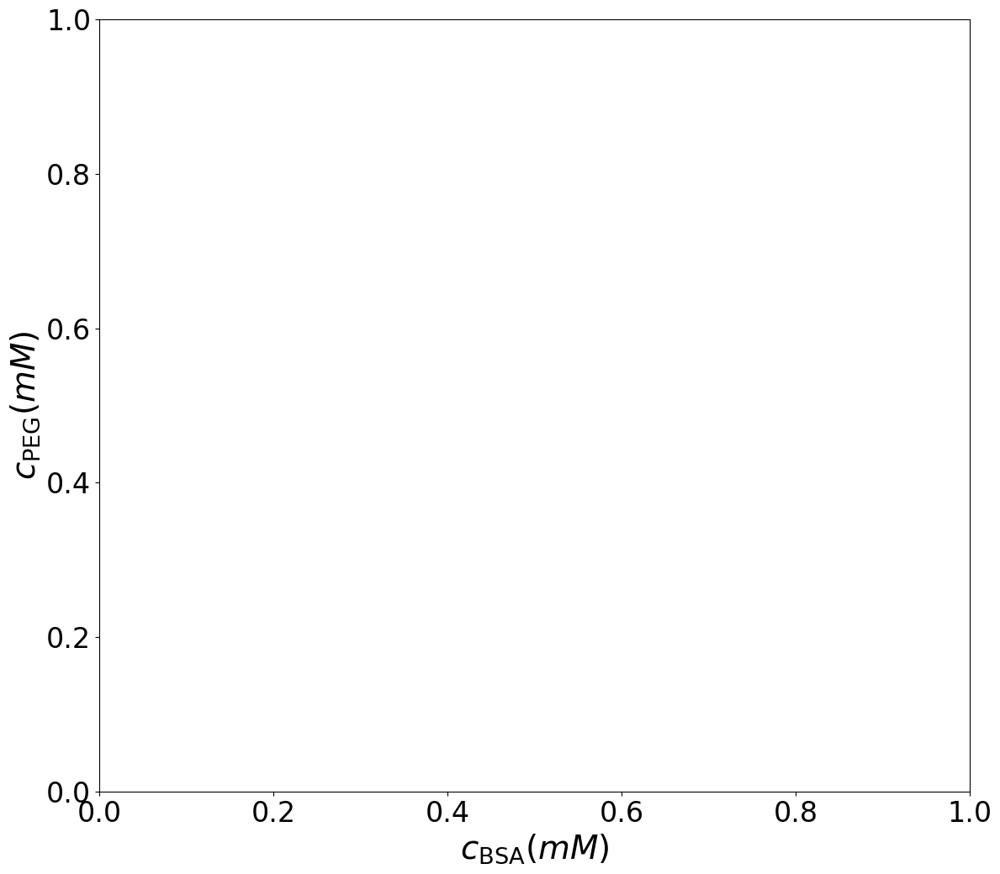

In [17]:
def aplot_FVT(fvt_out, plabel, pcolor, mbsa=0, mpeg=0):

    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, Pi_listD_fix, P0_Drop_fix, Pp_list_fix, Mu_listD_fix, Mu0_listD_fix, Pi_listS_fix, P0_Sup_fix, Mu_listS_fix, Mu0_listS_fix, params = fvt_out
    Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg = params
    q = Rpol_in/Rpr_in;
    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm, q = {q:.2f}'

    def abc(q):
        a_fix = 3*q+3*q**2+q**3
        b_fix = 9/2*q**2+3*q**3
        c_fix = 3*q**3
        return [a_fix, b_fix, c_fix]

    def alpha_fix(Phi, q):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix =  abc(q)
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        return (1-Phi)*np.exp(-Q_fix)

    a_fix, b_fix, c_fix =  abc(q)
    
    b_bsa_A = BSA_Drop/phix_bsa
    b_bsa_B = BSA_Sup/phix_bsa
    b_PEG_A = PEG_Drop/phix_peg
    b_PEG_B = PEG_Sup/phix_peg

    a_BSA_A = [(1-a)*Rpr_in**3 for fPEG, fBSA, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    a_BSA_B = [(1-a)*Rpr_in**3 for fPEG, fBSA, a in zip(PEG_Sup, b_bsa_B, a_Sup)]

    Q_BSA_A = [a_fix*(Phi/(1 - Phi))+b_fix*(Phi/(1 - Phi))**2+c_fix*(Phi/(1 - Phi))**3 for fPEG, Phi, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    Q_BSA_B = [a_fix*(Phi/(1 - Phi))+b_fix*(Phi/(1 - Phi))**2+c_fix*(Phi/(1 - Phi))**3 for fPEG, Phi, a in zip(PEG_Sup, b_bsa_B, a_Sup)]
    
    c_BSA_A = [Phi*((Rpol_in+Rpr_in)/Rpr_in)**3 for fPEG, Phi, a in zip(PEG_Drop, b_bsa_A, a_Drop)]
    c_BSA_B = [Phi*((Rpol_in+Rpr_in)/Rpr_in)**3 for fPEG, Phi, a in zip(PEG_Sup, b_bsa_B, a_Sup)]
    
    c_PEG_A = [fPEG*((Rpol_in+Rpr_in))**6 for fPEG, fBSA, a, Q in zip(PEG_Drop, b_bsa_A, a_Drop,Q_BSA_A)]
    c_PEG_B = [fPEG*((Rpol_in+Rpr_in))**6 for fPEG, fBSA, a, Q in zip(PEG_Sup, b_bsa_B, a_Sup,Q_BSA_B)]
    
        
    # plt.plot(BSA_Drop, phi_R*q**-0.33, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(BSA_Sup, phi_R*q**-0.33, '-', color = pcolor, ms = 2)

    # plt.plot(b_bsa_A*((Rpol_in+Rpr_in))**3, c_PEG_A, '--', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(b_bsa_B*((Rpol_in+Rpr_in))**3, c_PEG_B, '--', color = pcolor, ms = 2)

    plt.plot(BSA_Drop, Q_BSA_A, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    plt.plot(BSA_Sup, Q_BSA_B, '-', color = pcolor, ms = 2)

    plt.plot(BSA_Drop, c_BSA_A, '--', color = pcolor, ms = 2, label=full_label + ' binodal')
    plt.plot(BSA_Sup, c_BSA_B, '--', color = pcolor, ms = 2)

    # plt.plot(b_bsa_A, q**-0.33*phi_R, '-', color = pcolor, ms = 2, label=full_label + ' binodal')
    # plt.plot(b_bsa_B, q**-0.33*phi_R, '-', color = pcolor, ms = 2)

    plt.legend(loc=(1.1,0),fontsize='x-large')
    
    return

figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.xlim(0,0.5)
# plt.ylim(0,1.6)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

aplot_FVT(gfvt4K_200mM_Z0_FVT, f'FVT 4K, pH 7, 200 mM KCl, ', 'orange', 'red')
aplot_FVT(gfvt6K_200mM_Z0_FVT, f'FVT 6K, pH 7, 200 mM KCl, ', 'black', 'red')
aplot_FVT(gfvt8K_200mM_Z0_FVT, f'FVT 8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
aplot_FVT(gfvt20K_200mM_Z0_FVT, f'FVT 20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
aplot_FVT(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
aplot_FVT(gfvt100K_200mM_Z0_FVT, f'FVT 100K, pH 7, 200 mM KCl, ', 'purple', 'red')

# GFVT()

In [18]:
#%%  IMPORT DATA
#concentrations are in mM = mol/m^3

#%%   GENERALIZED FREE VOLUME THEORY (grand canonical approach) 
# note that Phi pol is the polymer volume fraction in the reservoir divided by the polymer overlapping concentration 
# GFVT_es(3.0e-9, 1.85e-9, mbsa, mpeg48_wt, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, False, 0, mcp_calc, mcs_calc)
# GFVT_es(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, critical, Za_in, mcp_in, mcs_in)
def GFVT(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, guess_c, critical=False):

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    q = Rpol_in/Rpr_in;

    print(f'q = {q:.2f}, Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm')

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    hp = 6.626e-34 #plank
    kb = 1.38e-23 #boltzmann
    Nav = 6.022e23 # avogadro
    Rb = 8.314
    TC = 22
    T = 273.15 + TC # temperature
    Lam = hp/(2*np.pi*mbsa*1000*kb*T/Nav)**(1/2) #de broglie wavelength

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        elif solvent == 'RG':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            dq = q/(1 + 3.95*Phi_pol**1.54)**(1/2)
            qx = (1 + 3*dq + 2.73*dq**2 - 0.0975*dq**3)**(1/3) - 1
        else:
            dPidPhiP = 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    def beta_1(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        return -beta0*Q1
        
    def beta_2(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        beta1 = beta_1(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        Q2 = 2*b + 6*c*y
        return -beta0*Q2 - beta1*Q1        

    def beta_3(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        beta1 = beta_1(Phi, Phi_pol, q, solvent)
        beta2 = beta_2(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        Q2 = 2*b + 6*c*y
        Q3 = 6*c
        return -beta0*Q3 - 2*beta1*Q2 - beta2*Q1

    def alpha(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        return (1 - Phi)*beta0

    def Mu0f(Phi, Lam, vc):
        return np.log(Lam**3/vc) + np.log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential

    def Mu0s(Phi, Lam, vc):
        Phicp=0.741
        # return 2.1306 + 3/(1/Phi - 1/Phicp) -3*np.log(1/Phi - 1/Phicp) # polymer free chemical potential
        return np.log(Lam**3/vc) + 2.1178 + 3*np.log(Phi/(1 - Phi/Phicp)) + 3/(1 - Phi/Phicp)

    def P0f(Phi):
        return (Phi + Phi**2 + Phi**3 - Phi**4)/(1 - Phi)**3 # polymer free osmotic pressure

    def P0s(Phi):
        y = Phi/(1-Phi)
        ycp = 2.853
        Phicp=0.741
        # return 3/(1/y - 1/ycp) # polymer free osmotic pressure
        return 3*Phi/(1 - Phi/Phicp)

    def P0f1(Phi):
        y = Phi/(1-Phi)
        return (1 + y)**-2 + 8*y + 6*y**2 # polymer free osmotic pressure

    def P0f2(Phi):
        y = Phi/(1-Phi)
        return -2*(1 + y)**-3 + 8 + 12*y # polymer free osmotic pressure

    def _grid_to(Phi_pol, step=1e-4, min_nodes=2):
        # choose number of intervals so that we always hit Phi_pol exactly
        n_int = max(int(np.ceil(Phi_pol/step)), 1)   # at least one interval
        n = max(n_int + 1, min_nodes)               # #points = #intervals + 1
        return np.linspace(0.0, float(Phi_pol), n)

    #%% CHEMICAL POTENTIAL AND OSMOTIC PRESSURE
    # note this implementation is needed to solve numerically the nasty integral, impossible to solve analytically
    
    def Muf(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        M = g*dPidPhiP
        int_Mu = np.trapz(M, Phi_poln)
        Mu0 = Mu0f(Phi, Lam, vbsa)
        out = int_Mu + Mu0
        return out.item()
    
    def Pif(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        M = h*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P0 = P0f(Phi)
        out = P0 + int_Pi
        return out.item()

    def Pif1(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        beta2 = beta_2(Phi, Phi_poln, q, solvent)
        M = -y*beta2*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P01 = P0f1(Phi)
        out = P01 + int_Pi  
        return out.item()

    def Pif2(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        beta2 = beta_2(Phi, Phi_poln, q, solvent)
        beta3 = beta_3(Phi, Phi_poln, q, solvent)
        M = -(beta2 + y*beta3)*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P02 = P0f2(Phi)
        out = P02 + int_Pi
        return out.item()

    def Mus(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        M = g*dPidPhiP
        int_Mu = np.trapz(M, Phi_poln)
        Mu0 = Mu0s(Phi, Lam, vbsa)
        out = int_Mu + Mu0
        return out.item()
    
    def Pis(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        M = h*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P0 = P0s(Phi)
        out = P0 + int_Pi
        return out.item()
    
    def hfunc(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        return h
    
    def gfunc(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        return g

    #%%  Phase diagram calculations

    # phix = (v2/6.022e23)/(4/3*np.pi*Rpol**3) #ratio between slvent free and hydrated molecular volumes 
    
    Pr_Drop_p = np.empty(N_steps)
    Pol_Drop_p = np.empty(N_steps) 
    a_Drop_p = np.empty(N_steps)
    qx_Drop_p = np.empty(N_steps)
    
    dPidPhiP_Drop_p = np.empty(N_steps)
    
    Pr_Sup_p = np.empty(N_steps) 
    Pol_Sup_p = np.empty(N_steps)
    
    a_Sup_p = np.empty(N_steps)
    
    qx_Sup_p = np.empty(N_steps)
    dPidPhiP_Sup_p = np.empty(N_steps)

    phi_R = np.empty(N_steps)

    P0_Drop = np.empty(N_steps)
    P0_Sup = np.empty(N_steps)
    
    Pi_Drop = np.empty(N_steps)
    Pi_Sup = np.empty(N_steps)

    Pp_Drop = np.empty(N_steps)
    Pp_Sup = np.empty(N_steps)

    Mu_Drop = np.empty(N_steps)
    Mu_Sup = np.empty(N_steps)

    MuR_Drop = np.empty(N_steps)
    MuR_Sup = np.empty(N_steps)
    Mu0_Drop = np.empty(N_steps)
    Mu0_Sup = np.empty(N_steps)

    g_Drop = np.empty(N_steps)
    g_Sup = np.empty(N_steps)
    h_Drop = np.empty(N_steps)
    h_Sup = np.empty(N_steps)
    
    cp_list = np.empty((N_steps, 8))
    tp_list = np.empty((0, 14))

    def fcrit(variabs):
        fout1 = Pif1(variabs[0], variabs[1], q, solvent)
        fout2 = Pif2(variabs[0], variabs[1], q, solvent)
        return [fout1, fout2]
    
    sol = least_squares(fcrit,(guess_c[0], guess_c[1]), bounds=((1e-16,1e-16),(1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
    
    crit1 = float(sol.x[0])
    crit2 = float(sol.x[1])
    
    outguess_c = [crit1, crit2]

    Pr_Crit = crit1*phix_bsa
    Pol_Crit = alpha(crit1, crit2, q, solvent)*crit2*phix_peg
    cp = [Pr_Crit, Pol_Crit];
    
    print(f'BSA_crit = {crit1:.4f}, PEG_crit = {crit2:.4f}')
    print(f'[BSA]_crit = {Pr_Crit:.2f} mM, [PEG]_crit = {Pol_Crit:.2f} mM\n')

    def ftp(variabs):
        f1 = Muf(variabs[0], variabs[3], q, solvent) - Muf(variabs[1], variabs[3], q, solvent)
        f2 = Muf(variabs[1], variabs[3], q, solvent) - Mus(variabs[2], variabs[3], q, solvent)
        f3 = Pif(variabs[0], variabs[3], q, solvent) - Pif(variabs[1], variabs[3], q, solvent)
        f4 = Pif(variabs[1], variabs[3], q, solvent) - Pis(variabs[2], variabs[3], q, solvent)
        return [f1, f2, f3, f4]
    
    # print(f'guess: (1e-4, {crit1+0.4:.4f}, 0.7, {crit2:.4f}), bounds: ((1e-16,{crit1:.4f},{crit1:.4f},1e-16),({crit1:.4f},1,1,500))')

    tp_sol = least_squares(ftp,(1e-4, outguess_c[0]+0.4, 0.7, outguess_c[1]), bounds=((1e-16,outguess_c[0],outguess_c[0],1e-16),(outguess_c[0],1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
    
    tp1 = float(tp_sol.x[0])
    tp2 = float(tp_sol.x[1])
    tp3 = float(tp_sol.x[2])
    tp4 = float(tp_sol.x[3])
    
    outguess_tp = [tp1, tp2, tp3, tp4]

    g1 = tp1
    g2 = tp3

    Pr_tp1 = tp1*phix_bsa
    Pr_tp2 = tp2*phix_bsa
    Pr_tp3 = tp3*phix_bsa
    Pol_tp1 = alpha(tp1, tp4, q, solvent)*tp4*phix_peg
    Pol_tp2 = alpha(tp2, tp4, q, solvent)*tp4*phix_peg
    Pol_tp3 = alpha(tp3, tp4, q, solvent)*tp4*phix_peg
    tp = [Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3];
    
    print(f'BSA_tp_G = {tp1:.4f}, BSA_tp_L = {tp2:.4f}, BSA_tp_S = {tp3:.4f}, PEG_tp = {tp4:.4f}')
    print(f'[BSA]_tp_G = {Pr_tp1:.2f} mM, [BSA]_tp_L = {Pr_tp2:.2f} mM, [BSA]_tp_S = {Pr_tp3:.2f} mM, [PEG]_tp_G = {Pol_tp1:.2f} mM, [PEG]_tp_L = {Pol_tp2:.2f} mM, [PEG]_tp_S = {Pol_tp3:.2f} mM\n')

    PhiP_min = crit2
    PhiP_max = tp4

    if critical:
        if solvent =='good':
            qrcep = 0.388
        elif solvent == 'theta':
            # qcep = 0.3208
            qrcep = 0.337
        elif solvent == 'RG':
            qrcep = 0.388
        else:
            qrcep = 0.1

        Qlist = np.flip(np.linspace(qrcep,10,N_steps))

        # main_bar = tqdm(enumerate(Qlist), desc="Calculating Critical and Triple Lines", total=len(Qlist),unit="step", position=0, leave=True)
        # status_bar = tqdm(total=0, position=1, bar_format="{desc}", leave=True)

        for idx, qr in tqdm(enumerate(Qlist), desc="Calculating Critical and Triple Lines", total=len(Qlist),unit="step"):

            # tqdm.write(f"q = {qr:.4f} > qrcep = {qrcep:.3f}")
            
            Rpol_qr = qr*Rpr_in

            phix_peg_qr = 1/(4/3*np.pi*Rpol_qr**3*6.022e23)

            def fcrit(variabs):
                fout1 = Pif1(variabs[0], variabs[1], qr, solvent)
                fout2 = Pif2(variabs[0], variabs[1], qr, solvent)
                return [fout1, fout2]

            sol = least_squares(fcrit,(crit1, crit2), bounds=((1e-16,1e-16),(1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)

            crit1 = float(sol.x[0])
            crit2 = float(sol.x[1])

            Pr_Crit_t = crit1*phix_bsa
            Pol_Crit_t = alpha(crit1, crit2, qr, solvent)*crit2*phix_peg_qr

            cp_list[idx] = [qr, Rpr_in, Rpol_qr, phix_peg_qr, crit1, crit2, Pr_Crit_t, Pol_Crit_t]

            if qr > qrcep:

                def ftp(variabs):
                    f1 = Muf(variabs[0], variabs[3], qr, solvent) - Muf(variabs[1], variabs[3], qr, solvent)
                    f2 = Muf(variabs[1], variabs[3], qr, solvent) - Mus(variabs[2], variabs[3], qr, solvent)
                    f3 = Pif(variabs[0], variabs[3], qr, solvent) - Pif(variabs[1], variabs[3], qr, solvent)
                    f4 = Pif(variabs[1], variabs[3], qr, solvent) - Pis(variabs[2], variabs[3], qr, solvent)
                    return [f1, f2, f3, f4]

                # print(f'crit1 = {crit1:.4f}, crit2 = {crit2:.4f}')
                # print(f'x0: (1e-15, {crit1+0.5:.4f}, 0.7, {crit2:.4f}), bounds: ((1e-16,{crit1:.4f},{crit1:.4f},1e-16),({crit1:.4f},1,1,500))')

                tp_sol = least_squares(ftp,(tp1, tp2, tp3, tp4), bounds=((1e-16,crit1,crit1,1e-16),(crit1,1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)

                # print(f'x0: (1e-15, {outguess_c[0]+0.5:.4f}, 0.7, {outguess_c[1]:.4f}), bounds: ((1e-16,{outguess_c[0]:.4f},{outguess_c[0]:.4f},1e-16),({outguess_c[0]:.4f},1,1,500))')
                
                # tp_sol = least_squares(ftp,(1e-15, outguess_c[0]+0.5, 0.7, outguess_c[1]), bounds=((1e-16,outguess_c[0],outguess_c[0],1e-16),(outguess_c[0],1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
        
                tp1 = float(tp_sol.x[0])
                tp2 = float(tp_sol.x[1])
                tp3 = float(tp_sol.x[2])
                tp4 = float(tp_sol.x[3])

                Pr_tp1 = tp1*phix_bsa
                Pr_tp2 = tp2*phix_bsa
                Pr_tp3 = tp3*phix_bsa
                Pol_tp1 = alpha(tp1, tp4, qr, solvent)*tp4*phix_peg_qr
                Pol_tp2 = alpha(tp2, tp4, qr, solvent)*tp4*phix_peg_qr
                Pol_tp3 = alpha(tp3, tp4, qr, solvent)*tp4*phix_peg_qr

                tp_list = np.vstack([tp_list, [qr, Rpr_in, Rpol_qr, phix_peg_qr, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3]])
            
    else:
        cp_list = []
        tp_list = []


    PhiP = np.linspace(PhiP_min, PhiP_max, N_steps)
    
    def fu(x, i, q, Mpr, solvent):
        f_1 = Muf(x[0], i, q, solvent) - Muf(x[1], i, q, solvent)
        f_2 = Pif(x[0], i, q, solvent) - Pif(x[1], i, q, solvent)
        return [f_1,f_2]

    j=0
    
    for i in tqdm(np.flip(PhiP), desc="Calculating Binodal", unit="step"):
        def f(variabs):
            f1 = Muf(variabs[0], i, q, solvent) - Muf(variabs[1], i, q, solvent)
            f2 = Pif(variabs[0], i, q, solvent) - Pif(variabs[1], i, q, solvent)
            return [f1, f2]
        
        sol = least_squares(f,(g1,g2), bounds=((1e-16,1e-16),(0.9999999999999999999,0.9999999999999999999)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
        
        g1 = float(sol.x[0])
        g2 = float(sol.x[1])

        # if j == 0:
        #     print(g1)
        #     print(g2)
        
        Pr_Sup_p[j] = float(g1)*phix_bsa
        Pr_Drop_p[j] = float(g2)*phix_bsa
        
        a1, b1, c1, y1, dPidPhiP1 = Qsf(g1, i, q, solvent)
        a2, b2, c2, y2, dPidPhiP1 = Qsf(g2, i, q, solvent)
        
        Qs1 = a1*y1 + b1*y1**2 + c1*y1**3
        Qs2 = a2*y2 + b2*y2**2 + c2*y2**3
        
        alpha1 = (1 - g1)*np.exp(-Qs1) # free volume fraction, needed to calculate the pol vol. fraction in the two phases
        alpha2 = (1 - g2)*np.exp(-Qs2)
        
        Pol_Sup_p[j] = alpha1*i*phix_peg # volume fraction of pol in phase A
        Pol_Drop_p[j] = alpha2*i*phix_peg # volume fraction of pol in phase B
        
        a_Sup_p[j] = alpha1
        a_Drop_p[j] = alpha2
        
        phi_R[j] = i
        
        qx_Sup_p[j], dPidPhiP_Sup_p = qxf(q, alpha1*i*phix_peg, solvent)
        qx_Drop_p[j], dPidPhiP_Drop_p = qxf(q, alpha2*i*phix_peg, solvent)
        
        qx_Sup_p[j], dPidPhiP_Sup_p = qxf(q, i, solvent)
        qx_Drop_p[j], dPidPhiP_Drop_p = qxf(q, i, solvent)

        Pi_Drop[j] = (Pif(g2, i, q, solvent))*phix_bsa*Rb*T
        Pi_Sup[j] = (Pif(g1, i, q, solvent))*phix_bsa*Rb*T
            
        Mu_Drop[j] = Muf(g2, i, q, solvent)
        Mu_Sup[j] = Muf(g1, i, q, solvent)
        
        P0_Drop[j] = P0f(g2)*phix_bsa*Rb*T
        P0_Sup[j] = P0f(g1)*phix_bsa*Rb*T

        Pp_Drop[j] = (Pif(g2, i, q, solvent)-P0f(g2))*phix_bsa*Rb*T
        Pp_Sup[j] = (Pif(g1, i, q, solvent)-P0f(g1))*phix_bsa*Rb*T
                       
        Mu0_Drop[j] = Mu0f(g2, Lam, vbsa)
        Mu0_Sup[j] = Mu0f(g1, Lam, vbsa)

        MuR_Drop[j] = Muf(g2, i, q, solvent) - Mu0f(g2, Lam, vbsa)
        MuR_Sup[j] = Muf(g1, i, q, solvent) - Mu0f(g1, Lam, vbsa)

        g_Drop[j] = gfunc(g2, i, q, solvent)
        g_Sup[j] = gfunc(g1, i, q, solvent)

        h_Drop[j] = hfunc(g2, i, q, solvent)
        h_Sup[j] = hfunc(g1, i, q, solvent)

        j+=1
    
    #
    #molar concentration in mol/m^3 = mmol/L multiplied by molar volume in m^3/mol
    
    # Vmpr = (4/3*np.pi*Rpr**3*6.022e23)
    # Vmpol = v2

    params = [Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg]
     
    return [phi_R, Pr_Drop_p, Pol_Drop_p, a_Drop_p, Pr_Sup_p, Pol_Sup_p, a_Sup_p, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params]

# RFVT()

In [22]:
#%%   ROD FREE VOLUME THEORY
# Translated from the Mathematica notebook "up to 6.3 for fig8.10a.nb".
# RFVT keeps the GFVT output layout, but replaces the pressure and
# chemical-potential functions with the isotropic/nematic rod expressions.
def RFVT(Rpr_in, rod_length, Rpol_in, mbsa, mpeg, solvent, N_steps, guess_B, guess_c, critical=False, rod_aspect_ratio=20.0):

    Nav = 6.022e23
    Rb = 8.314
    TC = 22
    T = 273.15 + TC

    # Rpr_in is interpreted as the rod radius; the Mathematica q is 2 Rg / D.
    rod_diameter = 2*Rpr_in
    rod_aspect_ratio=rod_length/rod_diameter
    gamma = 1 + rod_length/rod_diameter

    vpr = (np.pi/4*rod_length*rod_diameter**2 + np.pi/6*rod_diameter**3)*Nav
    vpeg = (4/3*np.pi*Rpol_in**3*Nav)

    q = 2*Rpol_in/rod_diameter

    print(
        f'q = {q:.2f}, L/D = {rod_aspect_ratio:.2f}, '
        f'D = {rod_diameter*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'
    )

    phix_bsa = 1/vpr
    phix_peg = 1/vpeg

    eps_phi = 1e-12
    den = 3*gamma - 1

    def _clip_phi(phi):
        return float(np.clip(phi, eps_phi, 1 - eps_phi))

    def _diff_step(phi):
        phi = _clip_phi(phi)
        return min(1e-5, 0.25*max(phi, 1e-8), 0.25*max(1 - phi, 1e-8))

    def _d1_phi(func, phi):
        phi = _clip_phi(phi)
        h = _diff_step(phi)
        lo = max(eps_phi, phi - h)
        hi = min(1 - eps_phi, phi + h)
        if hi == lo:
            return 0.0
        return (func(hi) - func(lo))/(hi - lo)

    def _d2_phi(func, phi):
        phi = _clip_phi(phi)
        h = _diff_step(phi)
        lo = max(eps_phi, phi - h)
        hi = min(1 - eps_phi, phi + h)
        if lo == phi or hi == phi:
            return 0.0
        return (func(hi) - 2*func(phi) + func(lo))/(h**2)

    def y(phi):
        phi = _clip_phi(phi)
        return phi/(1 - phi)

    def kappa(phi):
        yy = y(phi)
        return (36/np.pi)*((gamma - 1)**4/den**2)*(yy + (2*gamma/den)*yy**2)**2

    def rho(phi):
        return 4/np.sqrt(np.pi*kappa(phi))

    def sigma(phi):
        return np.log(kappa(phi)) - 1

    def polymer_prefactor(q_value):
        return den/(2*q_value**3)

    def aN0(phi):
        return 3 + (3*(gamma - 1)**2/den)*rho(phi)

    def bN0(phi):
        return (
            12*gamma*(2*gamma - 1)/den**2
            + (12*gamma*(gamma - 1)**2/den**2)*rho(phi)
        )

    def presN0(phi):
        yy = y(phi)
        return yy + aN0(phi)*yy**2 + bN0(phi)*yy**3

    def muN0(phi):
        yy = y(phi)
        return (
            np.log(yy)
            + sigma(phi)
            + (1 + 2*aN0(phi))*yy
            + (aN0(phi) + 1.5*bN0(phi))*yy**2
            + bN0(phi)*yy**3
        )

    def aI0(phi):
        return 3 + 3*(gamma - 1)**2/den

    def bI0(phi):
        return (
            12*gamma*(2*gamma - 1)/den**2
            + 12*gamma*(gamma - 1)**2/den**2
        )

    def presI0(phi):
        yy = y(phi)
        return yy + aI0(phi)*yy**2 + bI0(phi)*yy**3

    def muI0(phi):
        yy = y(phi)
        return (
            np.log(yy)
            + (1 + 2*aI0(phi))*yy
            + (aI0(phi) + 1.5*bI0(phi))*yy**2
            + bI0(phi)*yy**3
        )

    def aI(phi, q_value):
        return (
            (6*gamma/den)*q_value
            + (3*(gamma + 1)/den)*q_value**2
            + (2/den)*q_value**3
        )

    def bI(phi, q_value):
        return (
            0.5*(6*gamma/den)**2*q_value**2
            + (6/den + 6*(gamma - 1)**2/den**2)*q_value**3
        )

    def cI(phi, q_value):
        return (
            (2/den)
            * (12*gamma*(2*gamma - 1)/den**2 + 12*gamma*(gamma - 1)**2/den**2)
            * q_value**3
        )

    def qqI(phi, q_value):
        yy = y(phi)
        return aI(phi, q_value)*yy + bI(phi, q_value)*yy**2 + cI(phi, q_value)*yy**3

    def alphaI(phi, q_value):
        phi = _clip_phi(phi)
        return (1 - phi)*np.exp(-qqI(phi, q_value))

    def dalphaI(phi, q_value):
        return _d1_phi(lambda x: alphaI(x, q_value), phi)

    def presI(phi, phipr, q_value):
        return presI0(phi) + phipr*polymer_prefactor(q_value)*(alphaI(phi, q_value) - _clip_phi(phi)*dalphaI(phi, q_value))

    def muI(phi, phipr, q_value):
        return muI0(phi) - phipr*dalphaI(phi, q_value)*polymer_prefactor(q_value)

    def aN(phi, q_value):
        return aI(phi, q_value)

    def bN(phi, q_value):
        return (
            0.5*(6*gamma/den)**2*q_value**2
            + (6/den + (6*(gamma - 1)**2/den**2)*rho(phi))*q_value**3
        )

    def cN(phi, q_value):
        return (
            (2/den)
            * (12*gamma*(2*gamma - 1)/den**2 + (12*gamma*(gamma - 1)**2/den**2)*rho(phi))
            * q_value**3
        )

    def qqN(phi, q_value):
        yy = y(phi)
        return aN(phi, q_value)*yy + bN(phi, q_value)*yy**2 + cN(phi, q_value)*yy**3

    def alphaN(phi, q_value):
        phi = _clip_phi(phi)
        return (1 - phi)*np.exp(-qqN(phi, q_value))

    def dalphaN(phi, q_value):
        return _d1_phi(lambda x: alphaN(x, q_value), phi)

    def presN(phi, phipr, q_value):
        return presN0(phi) + phipr*polymer_prefactor(q_value)*(alphaN(phi, q_value) - _clip_phi(phi)*dalphaN(phi, q_value))

    def muN(phi, phipr, q_value):
        return muN0(phi) - phipr*dalphaN(phi, q_value)*polymer_prefactor(q_value)

    def qxf(q_value, Phi_pol, solvent):
        return q_value, polymer_prefactor(q_value)

    def alpha(Phi, Phi_pol, q_value, solvent):
        return alphaI(Phi, q_value)

    def alpha_phase(Phi, q_value, phase):
        if phase == 'N':
            return alphaN(Phi, q_value)
        return alphaI(Phi, q_value)

    #%% CHEMICAL POTENTIAL AND OSMOTIC PRESSURE
    def Muf(Phi, Phi_pol, q_value, solvent):
        return float(muI(Phi, Phi_pol, q_value))

    def Pif(Phi, Phi_pol, q_value, solvent):
        return float(presI(Phi, Phi_pol, q_value))

    def Pif1(Phi, Phi_pol, q_value, solvent):
        return float(_d1_phi(lambda x: presI(x, Phi_pol, q_value), Phi))

    def Pif2(Phi, Phi_pol, q_value, solvent):
        return float(_d2_phi(lambda x: presI(x, Phi_pol, q_value), Phi))

    def Mus(Phi, Phi_pol, q_value, solvent):
        return float(muN(Phi, Phi_pol, q_value))

    def Pis(Phi, Phi_pol, q_value, solvent):
        return float(presN(Phi, Phi_pol, q_value))

    def P0f(Phi):
        return float(presI0(Phi))

    def P0s(Phi):
        return float(presN0(Phi))

    def Mu0f(Phi):
        return float(muI0(Phi))

    def Mu0s(Phi):
        return float(muN0(Phi))

    def hfunc(Phi, Phi_pol, q_value, solvent):
        return float(polymer_prefactor(q_value)*(alphaI(Phi, q_value) - _clip_phi(Phi)*dalphaI(Phi, q_value)))

    def gfunc(Phi, Phi_pol, q_value, solvent):
        return float(-polymer_prefactor(q_value)*dalphaI(Phi, q_value))

    #%%  Phase diagram calculations
    Pr_Drop_p = np.empty(N_steps)
    Pol_Drop_p = np.empty(N_steps)
    a_Drop_p = np.empty(N_steps)
    qx_Drop_p = np.empty(N_steps)

    dPidPhiP_Drop_p = np.empty(N_steps)

    Pr_Sup_p = np.empty(N_steps)
    Pol_Sup_p = np.empty(N_steps)

    a_Sup_p = np.empty(N_steps)

    qx_Sup_p = np.empty(N_steps)
    dPidPhiP_Sup_p = np.empty(N_steps)

    phi_R = np.empty(N_steps)

    P0_Drop = np.empty(N_steps)
    P0_Sup = np.empty(N_steps)

    Pi_Drop = np.empty(N_steps)
    Pi_Sup = np.empty(N_steps)

    Pp_Drop = np.empty(N_steps)
    Pp_Sup = np.empty(N_steps)

    Mu_Drop = np.empty(N_steps)
    Mu_Sup = np.empty(N_steps)

    MuR_Drop = np.empty(N_steps)
    MuR_Sup = np.empty(N_steps)
    Mu0_Drop = np.empty(N_steps)
    Mu0_Sup = np.empty(N_steps)

    g_Drop = np.empty(N_steps)
    g_Sup = np.empty(N_steps)
    h_Drop = np.empty(N_steps)
    h_Sup = np.empty(N_steps)

    cp_list = np.empty((N_steps, 8))
    tp_list = np.empty((0, 14))

    def fcrit(variabs):
        fout1 = Pif1(variabs[0], variabs[1], q, solvent)
        fout2 = Pif2(variabs[0], variabs[1], q, solvent)
        return [fout1, fout2]

    sol = least_squares(fcrit, (guess_c[0], guess_c[1]), bounds=((1e-16, 1e-16), (1, 500)), jac='2-point', gtol=3e-16, ftol=3e-16, xtol=3e-16)

    crit1 = float(sol.x[0])
    crit2 = float(sol.x[1])

    outguess_c = [crit1, crit2]

    Pr_Crit = crit1*phix_bsa
    Pol_Crit = alphaI(crit1, q)*crit2*phix_peg
    cp = [Pr_Crit, Pol_Crit]

    print(f'Rod I-I crit = {crit1:.4f}, polymer reservoir = {crit2:.4f}')
    print(f'[Rod]_crit = {Pr_Crit:.2f} mM, [PEG]_crit = {Pol_Crit:.2f} mM\n')

    # def ftp(variabs):
    #     f1 = Muf(variabs[0], variabs[3], q, solvent) - Muf(variabs[1], variabs[3], q, solvent)
    #     f2 = Muf(variabs[1], variabs[3], q, solvent) - Mus(variabs[2], variabs[3], q, solvent)
    #     f3 = Pif(variabs[0], variabs[3], q, solvent) - Pif(variabs[1], variabs[3], q, solvent)
    #     f4 = Pif(variabs[1], variabs[3], q, solvent) - Pis(variabs[2], variabs[3], q, solvent)
    #     return [f1, f2, f3, f4]

    # tp_guess = (
    #     1e-4,
    #     min(outguess_c[0] + 0.4, 0.95),
    #     min(max(outguess_c[0] + 0.45, outguess_c[0]), 0.98),
    #     outguess_c[1],
    # )
    # tp_sol = least_squares(ftp, tp_guess, bounds=((1e-16, outguess_c[0], outguess_c[0], 1e-16), (outguess_c[0], 1, 1, 500)), jac='2-point', gtol=3e-16, ftol=3e-16, xtol=3e-16)

    # tp1 = float(tp_sol.x[0])
    # tp2 = float(tp_sol.x[1])
    # tp3 = float(tp_sol.x[2])
    # tp4 = float(tp_sol.x[3])

    # outguess_tp = [tp1, tp2, tp3, tp4]
    outguess_tp = []
    g1 = guess_B[0]
    g2 = guess_B[1]

    # g1 = tp1
    # g2 = tp2

    # Pr_tp1 = tp1*phix_bsa
    # Pr_tp2 = tp2*phix_bsa
    # Pr_tp3 = tp3*phix_bsa
    # Pol_tp1 = alphaI(tp1, q)*tp4*phix_peg
    # Pol_tp2 = alphaI(tp2, q)*tp4*phix_peg
    # Pol_tp3 = alphaN(tp3, q)*tp4*phix_peg
    # tp = [Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3]

    # print(f'Rod tp_I1 = {tp1:.4f}, tp_I2 = {tp2:.4f}, tp_N = {tp3:.4f}, polymer reservoir = {tp4:.4f}')
    # print(f'[Rod]_tp_I1 = {Pr_tp1:.2f} mM, [Rod]_tp_I2 = {Pr_tp2:.2f} mM, [Rod]_tp_N = {Pr_tp3:.2f} mM, [PEG]_tp_I1 = {Pol_tp1:.2f} mM, [PEG]_tp_I2 = {Pol_tp2:.2f} mM, [PEG]_tp_N = {Pol_tp3:.2f} mM\n')

    PhiP_min = crit2
    # PhiP_max = tp4
    PhiP_max = 2

    if critical:
        qrcep = 0.1
        Qlist = np.flip(np.linspace(qrcep, 10, N_steps))

        for idx, qr in tqdm(enumerate(Qlist), desc="Calculating RFVT Critical and Triple Lines", total=len(Qlist), unit="step"):
            Rpol_qr = qr*Rpr_in
            phix_peg_qr = 1/(4/3*np.pi*Rpol_qr**3*Nav)

            def fcrit_q(variabs):
                fout1 = Pif1(variabs[0], variabs[1], qr, solvent)
                fout2 = Pif2(variabs[0], variabs[1], qr, solvent)
                return [fout1, fout2]

            sol = least_squares(fcrit_q, (crit1, crit2), bounds=((1e-16, 1e-16), (1, 500)), jac='2-point', gtol=3e-16, ftol=3e-16, xtol=3e-16)

            crit1 = float(sol.x[0])
            crit2 = float(sol.x[1])

            Pr_Crit_t = crit1*phix_bsa
            Pol_Crit_t = alphaI(crit1, qr)*crit2*phix_peg_qr

            cp_list[idx] = [qr, Rpr_in, Rpol_qr, phix_peg_qr, crit1, crit2, Pr_Crit_t, Pol_Crit_t]

            # def ftp_q(variabs):
            #     f1 = Muf(variabs[0], variabs[3], qr, solvent) - Muf(variabs[1], variabs[3], qr, solvent)
            #     f2 = Muf(variabs[1], variabs[3], qr, solvent) - Mus(variabs[2], variabs[3], qr, solvent)
            #     f3 = Pif(variabs[0], variabs[3], qr, solvent) - Pif(variabs[1], variabs[3], qr, solvent)
            #     f4 = Pif(variabs[1], variabs[3], qr, solvent) - Pis(variabs[2], variabs[3], qr, solvent)
            #     return [f1, f2, f3, f4]

            # tp_sol = least_squares(ftp_q, (tp1, tp2, tp3, tp4), bounds=((1e-16, crit1, crit1, 1e-16), (crit1, 1, 1, 500)), jac='2-point', gtol=3e-16, ftol=3e-16, xtol=3e-16)

            # tp1 = float(tp_sol.x[0])
            # tp2 = float(tp_sol.x[1])
            # tp3 = float(tp_sol.x[2])
            # tp4 = float(tp_sol.x[3])

            # Pr_tp1 = tp1*phix_bsa
            # Pr_tp2 = tp2*phix_bsa
            # Pr_tp3 = tp3*phix_bsa
            # Pol_tp1 = alphaI(tp1, qr)*tp4*phix_peg_qr
            # Pol_tp2 = alphaI(tp2, qr)*tp4*phix_peg_qr
            # Pol_tp3 = alphaN(tp3, qr)*tp4*phix_peg_qr

            # tp_list = np.vstack([tp_list, [qr, Rpr_in, Rpol_qr, phix_peg_qr, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3]])

    else:
        cp_list = []
        tp_list = []

    PhiP = np.linspace(PhiP_min, PhiP_max, N_steps)

    j = 0

    for i in tqdm(np.flip(PhiP), desc="Calculating RFVT I-I Binodal", unit="step"):
        def f(variabs):
            f1 = Muf(variabs[0], i, q, solvent) - Muf(variabs[1], i, q, solvent)
            f2 = Pif(variabs[0], i, q, solvent) - Pif(variabs[1], i, q, solvent)
            return [f1, f2]

        sol = least_squares(f, (g1, g2), bounds=((1e-16, 1e-16), (0.9999999999999999999, 0.9999999999999999999)), jac='2-point', gtol=3e-16, ftol=3e-16, xtol=3e-16)

        g1 = float(sol.x[0])
        g2 = float(sol.x[1])

        Pr_Sup_p[j] = g1*phix_bsa
        Pr_Drop_p[j] = g2*phix_bsa

        alpha1 = alphaI(g1, q)
        alpha2 = alphaI(g2, q)

        Pol_Sup_p[j] = alpha1*i*phix_peg
        Pol_Drop_p[j] = alpha2*i*phix_peg

        a_Sup_p[j] = alpha1
        a_Drop_p[j] = alpha2

        phi_R[j] = i

        qx_Sup_p[j], dPidPhiP_Sup_p[j] = qxf(q, i, solvent)
        qx_Drop_p[j], dPidPhiP_Drop_p[j] = qxf(q, i, solvent)

        Pi_Drop[j] = Pif(g2, i, q, solvent)*phix_bsa*Rb*T
        Pi_Sup[j] = Pif(g1, i, q, solvent)*phix_bsa*Rb*T

        Mu_Drop[j] = Muf(g2, i, q, solvent)
        Mu_Sup[j] = Muf(g1, i, q, solvent)

        P0_Drop[j] = P0f(g2)*phix_bsa*Rb*T
        P0_Sup[j] = P0f(g1)*phix_bsa*Rb*T

        Pp_Drop[j] = (Pif(g2, i, q, solvent) - P0f(g2))*phix_bsa*Rb*T
        Pp_Sup[j] = (Pif(g1, i, q, solvent) - P0f(g1))*phix_bsa*Rb*T

        Mu0_Drop[j] = Mu0f(g2)
        Mu0_Sup[j] = Mu0f(g1)

        MuR_Drop[j] = Muf(g2, i, q, solvent) - Mu0f(g2)
        MuR_Sup[j] = Muf(g1, i, q, solvent) - Mu0f(g1)

        g_Drop[j] = gfunc(g2, i, q, solvent)
        g_Sup[j] = gfunc(g1, i, q, solvent)

        h_Drop[j] = hfunc(g2, i, q, solvent)
        h_Sup[j] = hfunc(g1, i, q, solvent)

        j += 1

    tp=[]
    params = [Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, globals().get('guess_b', None), TC, phix_bsa, phix_peg]

    return [phi_R, Pr_Drop_p, Pol_Drop_p, a_Drop_p, Pr_Sup_p, Pol_Sup_p, a_Sup_p, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params]


## GFVT_full()

In [21]:
#%%  IMPORT DATA
#concentrations are in mM = mol/m^3

#%%   GENERALIZED FREE VOLUME THEORY (grand canonical approach) 
# note that Phi pol is the polymer volume fraction in the reservoir divided by the polymer overlapping concentration 
# GFVT_es(3.0e-9, 1.85e-9, mbsa, mpeg48_wt, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, False, 0, mcp_calc, mcs_calc)
# GFVT_es(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, critical, Za_in, mcp_in, mcs_in)
def GFVT_full(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, guess_c, PhiP_max=1, critical=False):

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    q = Rpol_in/Rpr_in;

    print(f'q = {q:.2f}, Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm')

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    hp = 6.626e-34 #plank
    kb = 1.38e-23 #boltzmann
    Nav = 6.022e23 # avogadro
    Rb = 8.314
    TC = 22
    T = 273.15 + TC # temperature
    Lam = hp/(2*np.pi*mbsa*1000*kb*T/Nav)**(1/2) #de broglie wavelength

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        elif solvent == 'RG':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            dq = q/(1 + 3.95*Phi_pol**1.54)**(1/2)
            qx = (1 + 3*dq + 2.73*dq**2 - 0.0975*dq**3)**(1/3) - 1
        else:
            dPidPhiP = 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    def beta_1(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        return -beta0*Q1
        
    def beta_2(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        beta1 = beta_1(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        Q2 = 2*b + 6*c*y
        return -beta0*Q2 - beta1*Q1        

    def beta_3(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        beta1 = beta_1(Phi, Phi_pol, q, solvent)
        beta2 = beta_2(Phi, Phi_pol, q, solvent)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Q1 = a + 2*b*y + 3*c*y**2
        Q2 = 2*b + 6*c*y
        Q3 = 6*c
        return -beta0*Q3 - 2*beta1*Q2 - beta2*Q1

    def alpha(Phi, Phi_pol, q, solvent):
        beta0 = beta_0(Phi, Phi_pol, q, solvent)
        return (1 - Phi)*beta0

    def Mu0f(Phi, Lam, vc):
        return np.log(Lam**3/vc) + np.log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential

    def Mu0s(Phi, Lam, vc):
        Phicp=0.741
        # return 2.1306 + 3/(1/Phi - 1/Phicp) -3*np.log(1/Phi - 1/Phicp) # polymer free chemical potential
        return np.log(Lam**3/vc) + 2.1178 + 3*np.log(Phi/(1 - Phi/Phicp)) + 3/(1 - Phi/Phicp)

    def P0f(Phi):
        return (Phi + Phi**2 + Phi**3 - Phi**4)/(1 - Phi)**3 # polymer free osmotic pressure

    def P0s(Phi):
        y = Phi/(1-Phi)
        ycp = 2.853
        Phicp=0.741
        # return 3/(1/y - 1/ycp) # polymer free osmotic pressure
        return 3*Phi/(1 - Phi/Phicp)

    def P0f1(Phi):
        y = Phi/(1-Phi)
        return (1 + y)**-2 + 8*y + 6*y**2 # polymer free osmotic pressure

    def P0f2(Phi):
        y = Phi/(1-Phi)
        return -2*(1 + y)**-3 + 8 + 12*y # polymer free osmotic pressure

    def _grid_to(Phi_pol, step=1e-4, min_nodes=2):
        # choose number of intervals so that we always hit Phi_pol exactly
        n_int = max(int(np.ceil(Phi_pol/step)), 1)   # at least one interval
        n = max(n_int + 1, min_nodes)               # #points = #intervals + 1
        return np.linspace(0.0, float(Phi_pol), n)

    #%% CHEMICAL POTENTIAL AND OSMOTIC PRESSURE
    # note this implementation is needed to solve numerically the nasty integral, impossible to solve analytically
    
    def Muf(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        M = g*dPidPhiP
        int_Mu = np.trapz(M, Phi_poln)
        Mu0 = Mu0f(Phi, Lam, vbsa)
        out = int_Mu + Mu0
        return out.item()
    
    def Pif(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        M = h*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P0 = P0f(Phi)
        out = P0 + int_Pi
        return out.item()

    def Pif1(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        beta2 = beta_2(Phi, Phi_poln, q, solvent)
        M = -y*beta2*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P01 = P0f1(Phi)
        out = P01 + int_Pi  
        return out.item()

    def Pif2(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        beta2 = beta_2(Phi, Phi_poln, q, solvent)
        beta3 = beta_3(Phi, Phi_poln, q, solvent)
        M = -(beta2 + y*beta3)*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P02 = P0f2(Phi)
        out = P02 + int_Pi
        return out.item()

    def Mus(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        M = g*dPidPhiP
        int_Mu = np.trapz(M, Phi_poln)
        Mu0 = Mu0s(Phi, Lam, vbsa)
        out = int_Mu + Mu0
        return out.item()
    
    def Pis(Phi, Phi_pol, q, solvent):
        Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_poln, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        M = h*dPidPhiP
        int_Pi = np.trapz(M, Phi_poln)
        P0 = P0s(Phi)
        out = P0 + int_Pi
        return out.item()
    
    def hfunc(Phi, Phi_pol, q, solvent):
        # Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        h = np.exp(-Qs)*(1 +a*y + 2*y**2*b + 3*c*y**3)
        return h

    def gfunc(Phi, Phi_pol, q, solvent):
        # Phi_poln = _grid_to(Phi_pol, 1e-3)
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        g = np.exp(-Qs)*(1 + (1 + y)*(a + 2*y*b +3*c*y**2))
        return g

    #%%  Phase diagram calculations

    # phix = (v2/6.022e23)/(4/3*np.pi*Rpol**3) #ratio between slvent free and hydrated molecular volumes 
    
    Pr_Drop_p = np.empty(N_steps)
    Pol_Drop_p = np.empty(N_steps) 
    a_Drop_p = np.empty(N_steps)
    qx_Drop_p = np.empty(N_steps)
    
    dPidPhiP_Drop_p = np.empty(N_steps)
    
    Pr_Sup_p = np.empty(N_steps) 
    Pol_Sup_p = np.empty(N_steps)
    
    a_Sup_p = np.empty(N_steps)
    
    qx_Sup_p = np.empty(N_steps)
    dPidPhiP_Sup_p = np.empty(N_steps)

    phi_R = np.empty(N_steps)

    P0_Drop = np.empty(N_steps)
    P0_Sup = np.empty(N_steps)
    
    Pi_Drop = np.empty(N_steps)
    Pi_Sup = np.empty(N_steps)

    Pp_Drop = np.empty(N_steps)
    Pp_Sup = np.empty(N_steps)

    Mu_Drop = np.empty(N_steps)
    Mu_Sup = np.empty(N_steps)

    MuR_Drop = np.empty(N_steps)
    MuR_Sup = np.empty(N_steps)
    Mu0_Drop = np.empty(N_steps)
    Mu0_Sup = np.empty(N_steps)
    
    g_Drop = np.empty(N_steps)
    g_Sup = np.empty(N_steps)
    h_Drop = np.empty(N_steps)
    h_Sup = np.empty(N_steps)
    
    cp_list = np.empty((N_steps, 8))
    tp_list = np.empty((0, 14))

    def fcrit(variabs):
        fout1 = Pif1(variabs[0], variabs[1], q, solvent)
        fout2 = Pif2(variabs[0], variabs[1], q, solvent)
        return [fout1, fout2]
    
    sol = least_squares(fcrit,(guess_c[0], guess_c[1]), bounds=((1e-16,1e-16),(1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
    
    crit1 = float(sol.x[0])
    crit2 = float(sol.x[1])
    
    outguess_c = [crit1, crit2]

    Pr_Crit = crit1*phix_bsa
    Pol_Crit = alpha(crit1, crit2, q, solvent)*crit2*phix_peg
    cp = [Pr_Crit, Pol_Crit];
    
    print(f'BSA_crit = {crit1:.4f}, PEG_crit = {crit2:.4f}')
    print(f'[BSA]_crit = {Pr_Crit:.2f} mM, [PEG]_crit = {Pol_Crit:.2f} mM\n')

    def ftp(variabs):
        f1 = Muf(variabs[0], variabs[3], q, solvent) - Muf(variabs[1], variabs[3], q, solvent)
        f2 = Muf(variabs[1], variabs[3], q, solvent) - Mus(variabs[2], variabs[3], q, solvent)
        f3 = Pif(variabs[0], variabs[3], q, solvent) - Pif(variabs[1], variabs[3], q, solvent)
        f4 = Pif(variabs[1], variabs[3], q, solvent) - Pis(variabs[2], variabs[3], q, solvent)
        return [f1, f2, f3, f4]
    
    # print(f'guess: (1e-4, {crit1+0.4:.4f}, 0.7, {crit2:.4f}), bounds: ((1e-16,{crit1:.4f},{crit1:.4f},1e-16),({crit1:.4f},1,1,500))')

    tp_sol = least_squares(ftp,(1e-4, outguess_c[0]+0.4, 0.7, outguess_c[1]), bounds=((1e-16,outguess_c[0],outguess_c[0],1e-16),(outguess_c[0],1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
    
    tp1 = float(tp_sol.x[0])
    tp2 = float(tp_sol.x[1])
    tp3 = float(tp_sol.x[2])
    tp4 = float(tp_sol.x[3])
    
    outguess_tp = [tp1, tp2, tp3, tp4]

    g1 = tp1
    g2 = tp3

    Pr_tp1 = tp1*phix_bsa
    Pr_tp2 = tp2*phix_bsa
    Pr_tp3 = tp3*phix_bsa
    Pol_tp1 = alpha(tp1, tp4, q, solvent)*tp4*phix_peg
    Pol_tp2 = alpha(tp2, tp4, q, solvent)*tp4*phix_peg
    Pol_tp3 = alpha(tp3, tp4, q, solvent)*tp4*phix_peg
    tp = [Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3];
    
    print(f'BSA_tp_G = {tp1:.4f}, BSA_tp_L = {tp2:.4f}, BSA_tp_S = {tp3:.4f}, PEG_tp = {tp4:.4f}')
    print(f'[BSA]_tp_G = {Pr_tp1:.2f} mM, [BSA]_tp_L = {Pr_tp2:.2f} mM, [BSA]_tp_S = {Pr_tp3:.2f} mM, [PEG]_tp_G = {Pol_tp1:.2f} mM, [PEG]_tp_L = {Pol_tp2:.2f} mM, [PEG]_tp_S = {Pol_tp3:.2f} mM\n')

    PhiP_min = crit2
    # PhiP_max = tp4

    if critical:
        if solvent =='good':
            qrcep = 0.388
        elif solvent == 'theta':
            # qcep = 0.3208
            qrcep = 0.337
        elif solvent == 'RG':
            qrcep = 0.388
        else:
            qrcep = 0.1

        Qlist = np.flip(np.linspace(qrcep,10,N_steps))

        # main_bar = tqdm(enumerate(Qlist), desc="Calculating Critical and Triple Lines", total=len(Qlist),unit="step", position=0, leave=True)
        # status_bar = tqdm(total=0, position=1, bar_format="{desc}", leave=True)

        for idx, qr in tqdm(enumerate(Qlist), desc="Calculating Critical and Triple Lines", total=len(Qlist),unit="step"):

            # tqdm.write(f"q = {qr:.4f} > qrcep = {qrcep:.3f}")
            
            Rpol_qr = qr*Rpr_in

            phix_peg_qr = 1/(4/3*np.pi*Rpol_qr**3*6.022e23)

            def fcrit(variabs):
                fout1 = Pif1(variabs[0], variabs[1], qr, solvent)
                fout2 = Pif2(variabs[0], variabs[1], qr, solvent)
                return [fout1, fout2]

            sol = least_squares(fcrit,(crit1, crit2), bounds=((1e-16,1e-16),(1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)

            crit1 = float(sol.x[0])
            crit2 = float(sol.x[1])

            Pr_Crit_t = crit1*phix_bsa
            Pol_Crit_t = alpha(crit1, crit2, qr, solvent)*crit2*phix_peg_qr

            cp_list[idx] = [qr, Rpr_in, Rpol_qr, phix_peg_qr, crit1, crit2, Pr_Crit_t, Pol_Crit_t]

            if qr > qrcep:

                def ftp(variabs):
                    f1 = Muf(variabs[0], variabs[3], qr, solvent) - Muf(variabs[1], variabs[3], qr, solvent)
                    f2 = Muf(variabs[1], variabs[3], qr, solvent) - Mus(variabs[2], variabs[3], qr, solvent)
                    f3 = Pif(variabs[0], variabs[3], qr, solvent) - Pif(variabs[1], variabs[3], qr, solvent)
                    f4 = Pif(variabs[1], variabs[3], qr, solvent) - Pis(variabs[2], variabs[3], qr, solvent)
                    return [f1, f2, f3, f4]

                # print(f'crit1 = {crit1:.4f}, crit2 = {crit2:.4f}')
                # print(f'x0: (1e-15, {crit1+0.5:.4f}, 0.7, {crit2:.4f}), bounds: ((1e-16,{crit1:.4f},{crit1:.4f},1e-16),({crit1:.4f},1,1,500))')

                tp_sol = least_squares(ftp,(tp1, tp2, tp3, tp4), bounds=((1e-16,crit1,crit1,1e-16),(crit1,1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)

                # print(f'x0: (1e-15, {outguess_c[0]+0.5:.4f}, 0.7, {outguess_c[1]:.4f}), bounds: ((1e-16,{outguess_c[0]:.4f},{outguess_c[0]:.4f},1e-16),({outguess_c[0]:.4f},1,1,500))')
                
                # tp_sol = least_squares(ftp,(1e-15, outguess_c[0]+0.5, 0.7, outguess_c[1]), bounds=((1e-16,outguess_c[0],outguess_c[0],1e-16),(outguess_c[0],1,1,500)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
        
                tp1 = float(tp_sol.x[0])
                tp2 = float(tp_sol.x[1])
                tp3 = float(tp_sol.x[2])
                tp4 = float(tp_sol.x[3])

                Pr_tp1 = tp1*phix_bsa
                Pr_tp2 = tp2*phix_bsa
                Pr_tp3 = tp3*phix_bsa
                Pol_tp1 = alpha(tp1, tp4, qr, solvent)*tp4*phix_peg_qr
                Pol_tp2 = alpha(tp2, tp4, qr, solvent)*tp4*phix_peg_qr
                Pol_tp3 = alpha(tp3, tp4, qr, solvent)*tp4*phix_peg_qr

                tp_list = np.vstack([tp_list, [qr, Rpr_in, Rpol_qr, phix_peg_qr, tp1, tp2, tp3, tp4, Pr_tp1, Pr_tp2, Pr_tp3, Pol_tp1, Pol_tp2, Pol_tp3]])
            
    else:
        cp_list = []
        tp_list = []


    PhiP = np.linspace(PhiP_min, PhiP_max, N_steps)
    
    def fu(x, i, q, Mpr, solvent):
        f_1 = Muf(x[0], i, q, solvent) - Muf(x[1], i, q, solvent)
        f_2 = Pif(x[0], i, q, solvent) - Pif(x[1], i, q, solvent)
        return [f_1,f_2]

    j=0
    
    for i in tqdm(np.flip(PhiP), desc="Calculating Binodal", unit="step"):
        def f(variabs):
            f1 = Muf(variabs[0], i, q, solvent) - Muf(variabs[1], i, q, solvent)
            f2 = Pif(variabs[0], i, q, solvent) - Pif(variabs[1], i, q, solvent)
            return [f1, f2]
        
        sol = least_squares(f,(g1,g2), bounds=((1e-16,1e-16),(0.9999999999999999999,0.9999999999999999999)), jac = '2-point', gtol = 3e-16, ftol = 3e-16,xtol = 3e-16)
        
        g1 = float(sol.x[0])
        g2 = float(sol.x[1])

        # if j == 0:
        #     print(g1)
        #     print(g2)
        
        Pr_Sup_p[j] = float(g1)*phix_bsa
        Pr_Drop_p[j] = float(g2)*phix_bsa
        
        a1, b1, c1, y1, dPidPhiP1 = Qsf(g1, i, q, solvent)
        a2, b2, c2, y2, dPidPhiP1 = Qsf(g2, i, q, solvent)
        
        Qs1 = a1*y1 + b1*y1**2 + c1*y1**3
        Qs2 = a2*y2 + b2*y2**2 + c2*y2**3
        
        alpha1 = (1 - g1)*np.exp(-Qs1) # free volume fraction, needed to calculate the pol vol. fraction in the two phases
        alpha2 = (1 - g2)*np.exp(-Qs2)
        
        Pol_Sup_p[j] = alpha1*i*phix_peg # volume fraction of pol in phase A
        Pol_Drop_p[j] = alpha2*i*phix_peg # volume fraction of pol in phase B
        
        a_Sup_p[j] = alpha1
        a_Drop_p[j] = alpha2
        
        phi_R[j] = i
        
        qx_Sup_p[j], dPidPhiP_Sup_p = qxf(q, alpha1*i*phix_peg, solvent)
        qx_Drop_p[j], dPidPhiP_Drop_p = qxf(q, alpha2*i*phix_peg, solvent)
        
        qx_Sup_p[j], dPidPhiP_Sup_p = qxf(q, i, solvent)
        qx_Drop_p[j], dPidPhiP_Drop_p = qxf(q, i, solvent)

        Pi_Drop[j] = (Pif(g2, i, q, solvent))*phix_bsa*Rb*T
        Pi_Sup[j] = (Pif(g1, i, q, solvent))*phix_bsa*Rb*T
            
        Mu_Drop[j] = Muf(g2, i, q, solvent)
        Mu_Sup[j] = Muf(g1, i, q, solvent)
        
        P0_Drop[j] = P0f(g2)*phix_bsa*Rb*T
        P0_Sup[j] = P0f(g1)*phix_bsa*Rb*T

        Pp_Drop[j] = (Pif(g2, i, q, solvent)-P0f(g2))*phix_bsa*Rb*T
        Pp_Sup[j] = (Pif(g1, i, q, solvent)-P0f(g1))*phix_bsa*Rb*T
                       
        Mu0_Drop[j] = Mu0f(g2, Lam, vbsa)
        Mu0_Sup[j] = Mu0f(g1, Lam, vbsa)

        MuR_Drop[j] = Muf(g2, i, q, solvent) - Mu0f(g2, Lam, vbsa)
        MuR_Sup[j] = Muf(g1, i, q, solvent) - Mu0f(g1, Lam, vbsa)

        g_Drop[j] = gfunc(g2, i, q, solvent)
        g_Sup[j] = gfunc(g1, i, q, solvent)

        h_Drop[j] = hfunc(g2, i, q, solvent)
        h_Sup[j] = hfunc(g1, i, q, solvent)

        j+=1
    
    #
    #molar concentration in mol/m^3 = mmol/L multiplied by molar volume in m^3/mol
    
    # Vmpr = (4/3*np.pi*Rpr**3*6.022e23)
    # Vmpol = v2

    params = [Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg]
     
    return [phi_R, Pr_Drop_p, Pol_Drop_p, a_Drop_p, Pr_Sup_p, Pol_Sup_p, a_Sup_p, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params]

# EV_plot()

q=0.55
q=0.67
q=0.8
q=1.13
q=1.37
q=1.83
q=0.55
q=0.67
q=0.8
q=1.13
q=1.37
q=1.83


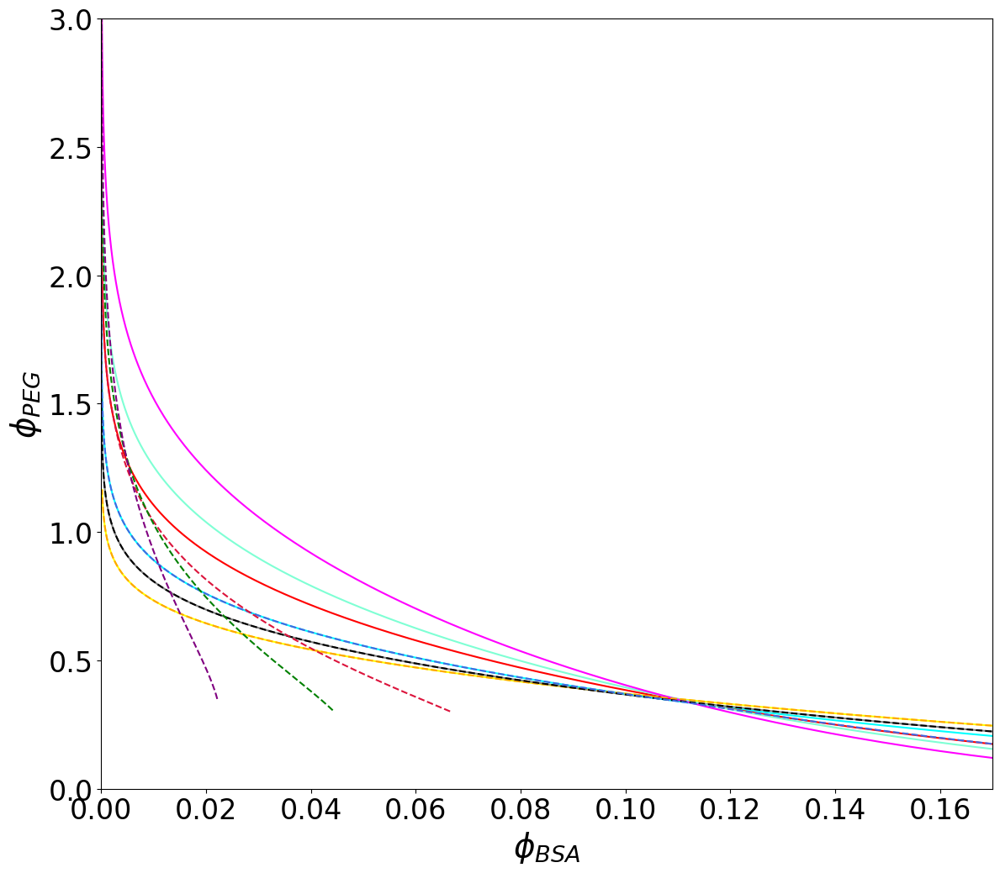

In [22]:
#%%  IMPORT DATA
#concentrations are in mM = mol/m^3

#%%   GENERALIZED FREE VOLUME THEORY (grand canonical approach) 
# note that Phi pol is the polymer volume fraction in the reservoir divided by the polymer overlapping concentration 
# GFVT_es(3.0e-9, 1.85e-9, mbsa, mpeg48_wt, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, False, 0, mcp_calc, mcs_calc)
# GFVT_es(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, critical, Za_in, mcp_in, mcs_in)
def EV_plot(Rpr_in, Rpol_in, N_steps, PhiP_min, PhiP_max, pcolor):

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    q = Rpol_in/Rpr_in;
    # q=0.6
    print(f'q={q}')
    ksi = 1 + q

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    Pinu = np.arange(PhiP_min, PhiP_max, 1e-3)
    N_steps = len(Pinu)
    Phig = np.empty(N_steps)
    Phip = np.empty(N_steps)

    def alpha(Phi, Phi_pol_R, q, solvent):
        beta0 = beta_0(Phi, Phi_pol_R, q, solvent)
        return (1 - Phi)*beta0

    for i, P in enumerate(Pinu):
        Phi_bsa = np.exp(3.65*P**0.8 - P*ksi**3 + np.heaviside(1 - P, 0.5)*np.log(P))*phix_bsa
        # Phi_bsa = 6.27*P**3*np.exp(P*(1.35-ksi**3))*phix_bsa
        Phig[i] = Phi_bsa
        phi_R = P*q**3
        Phip[i] = phi_R*alpha(Phi_bsa, phi_R, q, 'good')*phix_peg
        # Phip[i] = P*phi_R

    plt.plot(Phig, Phip, '--', color = pcolor, ms = 2)                                                           
                                             
    return

def EV_plot_Atha(Rpr_in, Rpol_in, N_steps, PhiP_min, PhiP_max, pcolor):

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    q = Rpol_in/Rpr_in;
    # q=0.6
    print(f'q={q}')
    ksi = 1 + q

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    Pinu = np.arange(PhiP_min, PhiP_max, 1e-3)
    N_steps = len(Pinu)
    Phig = np.empty(N_steps)
    Phip = np.empty(N_steps)

    def alpha(Phi, Phi_pol_R, q, solvent):
        beta0 = beta_0(Phi, Phi_pol_R, q, solvent)
        return (1 - Phi)*beta0

    for i, P in enumerate(Pinu):
        Phi_bsa = np.exp(3.65*P**0.8 - P*ksi**3 + np.heaviside(1 - P, 0.5)*np.log(P))*phix_bsa
        # Phi_bsa = 6.27*P**3*np.exp(P*(1.35-ksi**3))*phix_bsa
        Phig[i] = Phi_bsa
        phi_R = P*q**3
        Phip[i] = phi_R*alpha(Phi_bsa, phi_R, q, 'good')*phix_peg
        # Phip[i] = P*phi_R

    plt.semilogy(Phip, Phig, '--', color = pcolor, ms = 2)                                                           
                                             
    return

def EV_plot_q(q, N_steps, PhiP_min, PhiP_max, pcolor):

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    print(f'q={q}')
    ksi = 1 + q

    Pinu = np.arange(PhiP_min, PhiP_max, 1e-3)
    N_steps = len(Pinu)
    Phig = np.empty(N_steps)
    Phip = np.empty(N_steps)

    def alpha(Phi, Phi_pol_R, q, solvent):
        beta0 = beta_0(Phi, Phi_pol_R, q, solvent)
        return (1 - Phi)*beta0

    for i, P in enumerate(Pinu):
        Phi_bsa = np.exp(3.65*P**0.8 - P*ksi**3 + np.heaviside(1 - P, 0.5)*np.log(P))
        # Phi_bsa = 6.27*P**3*np.exp(P*(1.35-ksi**3))*phix_bsa
        Phig[i] = Phi_bsa
        phi_R = P*q**3
        Phip[i] = phi_R*alpha(Phi_bsa, phi_R, q, 'good')
        # Phip[i] = P#*phi_R

    plt.plot(Phig, Phip, '--', color = pcolor, ms = 2)                                                           
                                             
    return

def EV_plot_q_noHS(q, N_steps, PhiP_min, PhiP_max, pcolor):

    def qxf(q, Phi_pol, solvent):
        if solvent =='good':
            dPidPhiP = (1 + 3.73*Phi_pol**1.31)/q**3
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        elif solvent == 'theta':
            dPidPhiP = (1 + 12.3*Phi_pol**2)/q**3
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        else:
            dPidPhiP= 1 
            qx = q
        return qx, dPidPhiP
    
    def Qsf(Phi, Phi_pol, q, solvent):
        y = Phi/(1-Phi)
        qx, dPidPhiP = qxf(q, Phi_pol, solvent)
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3 
        return a, b, c, y, dPidPhiP

    def beta_0(Phi, Phi_pol, q, solvent):
        a, b, c, y, dPidPhiP = Qsf(Phi, Phi_pol, q, solvent)
        Qs = a*y + b*y**2 + c*y**3
        return np.exp(-Qs)

    print(f'q={q}')
    ksi = 1 + q

    Pinu = np.arange(PhiP_min, PhiP_max, 1e-3)
    N_steps = len(Pinu)
    Phig = np.empty(N_steps)
    Phip = np.empty(N_steps)

    def alpha(Phi, Phi_pol_R, q, solvent):
        beta0 = beta_0(Phi, Phi_pol_R, q, solvent)
        return (1 - Phi)*beta0

    for i, P in enumerate(Pinu):
        Phi_bsa = np.exp(3.65*P**0.8 - P*ksi**3)
        # Phi_bsa = 6.27*P**3*np.exp(P*(1.35-ksi**3))*phix_bsa
        Phig[i] = Phi_bsa
        phi_R = P*q**3
        Phip[i] = phi_R*alpha(Phi_bsa, phi_R, q, 'good')
        # Phip[i] = P#*phi_R

    plt.plot(Phig, Phip, '-', color = pcolor, ms = 2)                                                           
                                             
    return

figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.plot(x1,y1,'magenta',ms = 3)
# plt.plot(x2,y2, 'magenta',ms = 3)

plt.xlim(0,0.17)
plt.ylim(0,3)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_{PEG}$',fontsize = 28)
plt.tight_layout()

EV_plot_q_noHS(0.55, 10, 1.5, 7, 'yellow')
EV_plot_q_noHS(0.67, 10, 1, 7, 'gray')
EV_plot_q_noHS(0.8, 10, 0.5, 7, 'cyan')
EV_plot_q_noHS(1.13, 10, 0.3, 7, 'red')
EV_plot_q_noHS(1.37, 10, 0.16, 7, 'aquamarine')
EV_plot_q_noHS(1.83, 10, 0.07, 7, 'magenta')

EV_plot_q(0.55, 10, 1.5, 7, 'orange')
EV_plot_q(0.67, 10, 1, 7, 'black')
EV_plot_q(0.8, 10, 0.5, 7, 'royalblue')
EV_plot_q(1.13, 10, 0.3, 7, 'crimson')
EV_plot_q(1.37, 10, 0.16, 7, 'green')
EV_plot_q(1.83, 10, 0.07, 7, 'purple')



# FVT()

## normal

In [23]:
#%%  IMPORT DATA
#concentrations are in mM = mol/m^3

#%%   GENERALIZED FREE VOLUME THEORY (grand canonical approach) 
# note that Phi pol is the polymer volume fraction in the reservoir divided by the polymer overlapping concentration 
# GFVT_es(3.0e-9, 1.85e-9, mbsa, mpeg48_wt, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, False, 0, mcp_calc, mcs_calc)
# GFVT_es(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, critical, Za_in, mcp_in, mcs_in)
def FVT(Rpr_in, Rpol_in, mbsa, mpeg, N_steps, PhiP_min, PhiP_max, guess_c, guess_b):

    g1, g2 = guess_b
    crit1, crit2 = guess_c

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    # q = Rpol_in/Rpr_in;

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    hp = 6.626e-34 #plank
    kb = 1.38e-23 #boltzmann
    Nav = 6.022e23 # avogadro
    Rb = 8.314
    TC = 22
    T = 273.15 + TC # temperature
    Lam = hp/(2*np.pi*mbsa*1000*kb*T/Nav)**(1/2) #de broglie wavelength

    q = Rpol_in/Rpr_in

    def abc(q):
        a_fix = 3*q+3*q**2+q**3
        b_fix = 9/2*q**2+3*q**3
        c_fix = 3*q**3
        return [a_fix, b_fix, c_fix]
        
    # def Qs_fix(Phi, coeffs):

    #     y = Phi/(1 - Phi)
    
    #     a_fix, b_fix, c_fix = coeffs
        
    #     Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
    #     Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
    #     Q2_fix = 2*b_fix+6*c_fix*y
    #     Q3_fix = 6*c_fix

    #     return [Q_fix, Q1_fix, Q2_fix, Q3_fix]

    # def beta_fix(Qs):
    #     Q_fix, Q1_fix, Q2_fix, Q3_fix = Qs
        
    #     beta_fix = exp(-Q_fix)
    #     beta1_fix = -beta_fix*Q1_fix
    #     beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
    #     beta3_fix = -beta_fix*Q3_fix - 2*beta1_fix*Q2_fix - beta2_fix*Q1_fix

    #     return [beta_fix, beta1_fix, beta2_fix, beta3_fix]

    def alpha_fix(Phi, q):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix =  abc(q)
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        return (1-Phi)*np.exp(-Q_fix)

    def g_fix(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs
        
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix

        return beta_fix - (1+y)*beta1_fix
        
    def h_fix(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        
        return beta_fix - y*beta1_fix

    def h_fix1(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        Q2_fix = 2*b_fix+6*c_fix*y
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
        
        return - y*beta2_fix

    def h_fix2(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        Q2_fix = 2*b_fix+6*c_fix*y
        Q3_fix = 6*c_fix
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
        beta3_fix = -beta_fix*Q3_fix - 2*beta1_fix*Q2_fix - beta2_fix*Q1_fix
        
        return - beta2_fix - y*beta3_fix

    # Mu0 = np.log(Lam**3/vbsa)+ log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential
    # P0 = Phi + 4*y**2 + 2*y**3 # polymer free osmotic pressure
    
    def Mu0f(Phi, Lam, vc):
        return np.log(Lam**3/vc)+ np.log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential

    def P0f(Phi):
        y = Phi/(1 - Phi)
        return Phi + 4*y**2 + 2*y**3 # polymer free osmotic pressure


    def P0_1(Phi):
        y = Phi/(1 - Phi)
        return (1 + y)**-2 + 8*y + 6*y**2
        
    def P0_2(Phi):
        y = Phi/(1 - Phi)
        return -2*(1 + y)**-3 + 8 + 12*y
        

    #%% CHEMICAL POTENTIAL AND OSMOTIC PRESSURE
    # note this implementation is needed to solve numerically the nasty integral, impossible to solve analytically

    def Mu_fix(Phin, q):
        coeffs = abc(q)
        gf1 = g_fix(Phin[0], coeffs)
        gf2 = g_fix(Phin[1], coeffs)
        M01 = Mu0f(Phin[0], Lam, vbsa)
        M02 = Mu0f(Phin[1], Lam, vbsa)
        return (M01-M02)/(gf2-gf1)
    
    def Pi_fix(Phin, q):
        coeffs = abc(q)
        hf1 = h_fix(Phin[0], coeffs)
        hf2 = h_fix(Phin[1], coeffs)
        P01 = P0f(Phin[0])
        P02 = P0f(Phin[1])
        return (P01-P02)/(hf2-hf1)

    def Pi1_fix(Phin, q):
        hf1 = h_fix1(Phin[0], coeffs)
        P01 = P0_1(Phin[0])
        return P01 + hf1*Phin[1]*q**-3

    def Pi2_fix(Phin, q):
        hf2 = h_fix2(Phin[0], coeffs)
        P02 = P0_2(Phin[0])
        return P02 + hf2*Phin[1]*q**-3

    #%%  Phase diagram calculations

    # phix = (v2/6.022e23)/(4/3*np.pi*Rpol**3) #ratio between slvent free and hydrated molecular volumes 
    
    # PhiP = np.linspace(PhiP_min, PhiP_max, N_steps)
    
    Pr_Drop_fix = np.empty(N_steps)
    Pol_Drop_fix = np.empty(N_steps) 
    Pr_Sup_fix = np.empty(N_steps) 
    Pol_Sup_fix = np.empty(N_steps)
    Pr_Crit_fix_list = np.empty(N_steps)
    Pol_Crit_fix_list = np.empty(N_steps)
    Mu_listD_fix = np.empty(N_steps)
    Mu_listS_fix = np.empty(N_steps)
    Pi_listD_fix = np.empty(N_steps)
    Pi_listS_fix = np.empty(N_steps)
    Pp_list_fix = np.empty(N_steps)
    h_listD_fix = np.empty(N_steps)
    g_listD_fix = np.empty(N_steps)
    h_listS_fix = np.empty(N_steps)
    g_listS_fix = np.empty(N_steps)
    PhiR_list_fix = np.empty(N_steps)
    aPhiD_list_fix = np.empty(N_steps)
    aPhiS_list_fix = np.empty(N_steps)
    a_listD_fix = np.empty(N_steps)
    a_listS_fix = np.empty(N_steps)
    Mu0_listD_fix = np.empty(N_steps)
    Mu0_listS_fix = np.empty(N_steps)
    P0_Drop_fix = np.empty(N_steps)
    P0_Sup_fix = np.empty(N_steps)

    phi_R = np.empty(N_steps)

    coeffs = abc(q)

    def ffcrit(variabs, q):
        ffout1 = Pi1_fix(variabs, q)
        ffout2 = Pi2_fix(variabs, q)
        return [ffout1, ffout2]

    sol = root(ffcrit, (crit1, crit2), args=(q), method = 'hybr')

    print(sol.x)
    crit1_fix = float(sol.x[0])
    crit2_fix = float(sol.x[1])

    Pr_Crit_fix = crit1_fix*phix_bsa
    Pol_Crit_fix = float(alpha_fix(crit1_fix,q)*crit2_fix*phix_peg)

    print(f'BSA_crit = {crit1_fix:.4f}, PEG_crit = {crit2_fix:.4f}')
    print(f'[BSA_crit]fix = {Pr_Crit_fix:.2f} mM, [PEG_crit]fix = {Pol_Crit_fix:.2f} mM\n')

    Phic = np.linspace(0.0001,crit1_fix,N_steps)
    
    j=0

    for i in tqdm(np.flip(Phic), desc="Calculating FVT binodal", unit="step"):
        
        def ff(variabs):
            fout = Mu_fix([variabs, i], q)-Pi_fix([variabs, i], q)
            return float(fout)
        
        sol = brentq(ff, 1e-15, 1-1e-15)
        pol = Pi_fix([sol, i],q)*q**3

        Pr_Drop_fix[j] = sol*phix_bsa
        Pr_Sup_fix[j] = i*phix_bsa
        Pol_Drop_fix[j] = float(alpha_fix(sol,q)*pol*phix_peg) # volume fraction of pol in phase A
        Pol_Sup_fix[j] = float(alpha_fix(i,q)*pol*phix_peg) # volume fraction of pol in phase A
        a_listD_fix[j] = float(alpha_fix(sol,q))
        a_listS_fix[j] = float(alpha_fix(i,q))

        P0_Drop_fix[j] = P0f(sol)
        P0_Sup_fix[j] = P0f(i)
        Pi_listD_fix[j] = P0f(sol) + h_fix(sol, coeffs)*Pi_fix([sol, i], q)*phix_bsa*Rb*T
        Pi_listS_fix[j] = P0f(i) + h_fix(i, coeffs)*Pi_fix([sol, i], q)*phix_bsa*Rb*T
        Pp_list_fix[j] = Pi_fix([sol, i], q)*phix_bsa*Rb*T
        h_listD_fix[j] = h_fix(sol, coeffs)
        h_listS_fix[j] = h_fix(i, coeffs)

        Mu_listD_fix[j] = Mu0f(sol, Lam, vbsa) + g_fix(sol, coeffs)*Pi_fix([sol, i], q)    
        Mu_listS_fix[j] = Mu0f(i, Lam, vbsa) + g_fix(i, coeffs)*Pi_fix([sol, i], q)
        g_listD_fix[j] = g_fix(sol, coeffs)
        g_listS_fix[j] = g_fix(i, coeffs)
        PhiR_list_fix[j] = pol
        aPhiD_list_fix[j] = float(alpha_fix(sol,q)*pol)
        aPhiS_list_fix[j] = float(alpha_fix(i,q)*pol)
        Mu0_listD_fix[j] = Mu0f(sol, Lam, vbsa)
        Mu0_listS_fix[j] = Mu0f(i, Lam, vbsa)

        j +=1 
    
    #%%
    #molar concentration in mol/m^3 = mmol/L multiplied by molar volume in m^3/mol
    
    # Vmpr = (4/3*np.pi*Rpr**3*6.022e23)
    # Vmpol = v2

    # params = [Rpr_in, Rpol_in, mbsa, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg]
    params = [Rpr_in, Rpol_in, mbsa, mpeg, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg] #need mpeg
           
    return [PhiR_list_fix, Pr_Drop_fix, Pol_Drop_fix, a_listD_fix, Pr_Sup_fix, Pol_Sup_fix, a_listS_fix, Pi_listD_fix, P0_Drop_fix, Pp_list_fix, Mu_listD_fix, Mu0_listD_fix, Pi_listS_fix, P0_Sup_fix, Mu_listS_fix, Mu0_listS_fix, params]

## exclusion limit

In [24]:
#%%  IMPORT DATA
#concentrations are in mM = mol/m^3

#%%   GENERALIZED FREE VOLUME THEORY (grand canonical approach) 
# note that Phi pol is the polymer volume fraction in the reservoir divided by the polymer overlapping concentration 
# GFVT_es(3.0e-9, 1.85e-9, mbsa, mpeg48_wt, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, False, 0, mcp_calc, mcs_calc)
# GFVT_es(Rpr_in, Rpol_in, mbsa, mpeg, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, critical, Za_in, mcp_in, mcs_in)
def FVT_exclusion(Rpr_in, Rpol_in, mbsa, mpeg, N_steps, PhiP_min, PhiP_max, guess_c, guess_b):

    g1, g2 = guess_b
    crit1, crit2 = guess_c

    vbsa = (4/3*np.pi*Rpr_in**3*6.022e23)
    vpeg = (4/3*np.pi*Rpol_in**3*6.022e23)

    # q = Rpol_in/Rpr_in;

    phix_peg = 1/vpeg
    phix_bsa= 1/vbsa

    hp = 6.626e-34 #plank
    kb = 1.38e-23 #boltzmann
    Nav = 6.022e23 # avogadro
    Rb = 8.314
    TC = 22
    T = 273.15 + TC # temperature
    Lam = hp/(2*np.pi*mbsa*1000*kb*T/Nav)**(1/2) #de broglie wavelength

    q = Rpol_in/Rpr_in

    def abc(q):
        a_fix = 3*q+3*q**2+q**3
        b_fix = 9/2*q**2+3*q**3
        c_fix = 3*q**3
        return [a_fix, b_fix, c_fix]
        
    # def Qs_fix(Phi, coeffs):

    #     y = Phi/(1 - Phi)
    
    #     a_fix, b_fix, c_fix = coeffs
        
    #     Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
    #     Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
    #     Q2_fix = 2*b_fix+6*c_fix*y
    #     Q3_fix = 6*c_fix

    #     return [Q_fix, Q1_fix, Q2_fix, Q3_fix]

    # def beta_fix(Qs):
    #     Q_fix, Q1_fix, Q2_fix, Q3_fix = Qs
        
    #     beta_fix = exp(-Q_fix)
    #     beta1_fix = -beta_fix*Q1_fix
    #     beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
    #     beta3_fix = -beta_fix*Q3_fix - 2*beta1_fix*Q2_fix - beta2_fix*Q1_fix

    #     return [beta_fix, beta1_fix, beta2_fix, beta3_fix]

    def alpha_fix(Phi, q):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix =  abc(q)
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        return (1-Phi)*np.exp(-Q_fix)

    def g_fix(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs
        
        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix

        return beta_fix - (1+y)*beta1_fix
        
    def h_fix(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        
        return beta_fix - y*beta1_fix

    def h_fix1(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        Q2_fix = 2*b_fix+6*c_fix*y
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
        
        return - y*beta2_fix

    def h_fix2(Phi, coeffs):
        y = Phi/(1 - Phi)
        a_fix, b_fix, c_fix = coeffs

        Q_fix = a_fix*y+b_fix*y**2+c_fix*y**3
        Q1_fix = a_fix+2*b_fix*y+3*c_fix*y**2
        Q2_fix = 2*b_fix+6*c_fix*y
        Q3_fix = 6*c_fix
        
        beta_fix = np.exp(-Q_fix)
        beta1_fix = -beta_fix*Q1_fix
        beta2_fix = -beta_fix*Q2_fix - beta1_fix*Q1_fix
        beta3_fix = -beta_fix*Q3_fix - 2*beta1_fix*Q2_fix - beta2_fix*Q1_fix
        
        return - beta2_fix - y*beta3_fix

    # Mu0 = np.log(Lam**3/vbsa)+ log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential
    # P0 = Phi + 4*y**2 + 2*y**3 # polymer free osmotic pressure
    
    def Mu0f(Phi, Lam, vc):
        return np.log(Lam**3/vc)+ np.log(Phi) + (3 - Phi)/(1 - Phi)**3 - 3 # polymer free chemical potential

    def P0f(Phi):
        y = Phi/(1 - Phi)
        return Phi + 4*y**2 + 2*y**3 # polymer free osmotic pressure


    def P0_1(Phi):
        y = Phi/(1 - Phi)
        return (1 + y)**-2 + 8*y + 6*y**2
        
    def P0_2(Phi):
        y = Phi/(1 - Phi)
        return -2*(1 + y)**-3 + 8 + 12*y
        

    #%% CHEMICAL POTENTIAL AND OSMOTIC PRESSURE
    # note this implementation is needed to solve numerically the nasty integral, impossible to solve analytically

    def Mu_fix(Phin, q):
        coeffs = abc(q)
        gf1 = 0
        gf2 = 1
        M01 = Mu0f(Phin[0], Lam, vbsa)
        M02 = Mu0f(Phin[1], Lam, vbsa)
        return (M01-M02)/(gf2-gf1)
    
    def Pi_fix(Phin,q):
        coeffs = abc(q)
        hf1 = 0
        hf2 = 1
        P01 = P0f(Phin[0])
        P02 = P0f(Phin[1])
        return (P01-P02)/(hf2-hf1)

    def Pi1_fix(Phin, q):
        hf1 = h_fix1(Phin[0], coeffs)
        P01 = P0_1(Phin[0])
        return P01 + hf1*Phin[1]*q**-3

    def Pi2_fix(Phin, q):
        hf2 = h_fix2(Phin[0], coeffs)
        P02 = P0_2(Phin[0])
        return P02 + hf2*Phin[1]*q**-3

    #%%  Phase diagram calculations

    # phix = (v2/6.022e23)/(4/3*np.pi*Rpol**3) #ratio between slvent free and hydrated molecular volumes 
    
    # PhiP = np.linspace(PhiP_min, PhiP_max, N_steps)
    
    Pr_Drop_fix = np.empty(N_steps)
    Pol_Drop_fix = np.empty(N_steps) 
    Pr_Sup_fix = np.empty(N_steps) 
    Pol_Sup_fix = np.empty(N_steps)
    Pr_Crit_fix_list = np.empty(N_steps)
    Pol_Crit_fix_list = np.empty(N_steps)
    Mu_listD_fix = np.empty(N_steps)
    Mu_listS_fix = np.empty(N_steps)
    Pi_listD_fix = np.empty(N_steps)
    Pi_listS_fix = np.empty(N_steps)
    Pp_list_fix = np.empty(N_steps)
    h_listD_fix = np.empty(N_steps)
    g_listD_fix = np.empty(N_steps)
    h_listS_fix = np.empty(N_steps)
    g_listS_fix = np.empty(N_steps)
    PhiR_list_fix = np.empty(N_steps)
    aPhiD_list_fix = np.empty(N_steps)
    aPhiS_list_fix = np.empty(N_steps)
    a_listD_fix = np.empty(N_steps)
    a_listS_fix = np.empty(N_steps)
    Mu0_listD_fix = np.empty(N_steps)
    Mu0_listS_fix = np.empty(N_steps)

    phi_R = np.empty(N_steps)

    coeffs = abc(q)

    def ffcrit(variabs, q):
        ffout1 = Pi1_fix(variabs, q)
        ffout2 = Pi2_fix(variabs, q)
        return [ffout1, ffout2]

    sol = root(ffcrit, (crit1, crit2), args=(q), method = 'hybr')

    print(sol.x)
    crit1_fix = float(sol.x[0])
    crit2_fix = float(sol.x[1])

    Pr_Crit_fix = crit1_fix*phix_bsa
    Pol_Crit_fix = float(alpha_fix(crit1_fix,q)*crit2_fix*phix_peg)

    print(f'BSA_crit = {crit1_fix:.4f}, PEG_crit = {crit2_fix:.4f}')
    print(f'[BSA_crit]fix = {Pr_Crit_fix:.2f} mM, [PEG_crit]fix = {Pol_Crit_fix:.2f} mM\n')

    Phic = np.linspace(crit1_fix,0.99999, N_steps)
    
    j=0

    for i in tqdm(np.flip(Phic), desc="Calculating FVT binodal", unit="step"):
        
        def ff(variabs):
            fout = Mu0f(i, Lam, vbsa)- Mu0f(variabs, Lam, vbsa)-P0f(i)
            return float(fout)
        
        sol = brentq(ff, 1e-15, 1-1e-15)
        pol = P0f(i)*q**3

        Pr_Drop_fix[j] = sol*phix_bsa
        Pr_Sup_fix[j] = i*phix_bsa
        Pol_Drop_fix[j] = float(alpha_fix(sol,q)*pol*phix_peg) # volume fraction of pol in phase A
        Pol_Sup_fix[j] = float(alpha_fix(i,q)*pol*phix_peg) # volume fraction of pol in phase A
        a_listD_fix[j] = float(alpha_fix(sol,q))
        a_listS_fix[j] = float(alpha_fix(i,q))
       
        Pi_listD_fix[j] = P0f(sol) + 0*phix_bsa*Rb*T
        Pi_listS_fix[j] = P0f(i) + 1*phix_bsa*Rb*T
        Pp_list_fix[j] = Pi_fix([sol, i], q)*phix_bsa*Rb*T
        h_listD_fix[j] = 0
        h_listS_fix[j] = 1

        Mu_listD_fix[j] = Mu0f(sol, Lam, vbsa) + g_fix(sol, coeffs)*Pi_fix([sol, i], q)    
        Mu_listS_fix[j] = Mu0f(i, Lam, vbsa) + g_fix(i, coeffs)*Pi_fix([sol, i], q)
        g_listD_fix[j] = g_fix(sol, coeffs)
        g_listS_fix[j] = g_fix(i, coeffs)
        PhiR_list_fix[j] = pol
        aPhiD_list_fix[j] = float(alpha_fix(sol,q)*pol)
        aPhiS_list_fix[j] = float(alpha_fix(i,q)*pol)
        Mu0_listD_fix[j] = Mu0f(sol, Lam, vbsa)
        Mu0_listS_fix[j] = Mu0f(i, Lam, vbsa)

        j +=1 
    
    #%%
    #molar concentration in mol/m^3 = mmol/L multiplied by molar volume in m^3/mol
    
    # Vmpr = (4/3*np.pi*Rpr**3*6.022e23)
    # Vmpol = v2

    params = [Rpr_in, Rpol_in, mbsa, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg]
    
    return [PhiR_list_fix, Pr_Drop_fix, Pol_Drop_fix, a_listD_fix, Pr_Sup_fix, Pol_Sup_fix, a_listS_fix, params]

#### Calculate

## FVT

## compare FVT and GFVT

NameError: name 'gfvt4K_200mM_Z0_FVT' is not defined

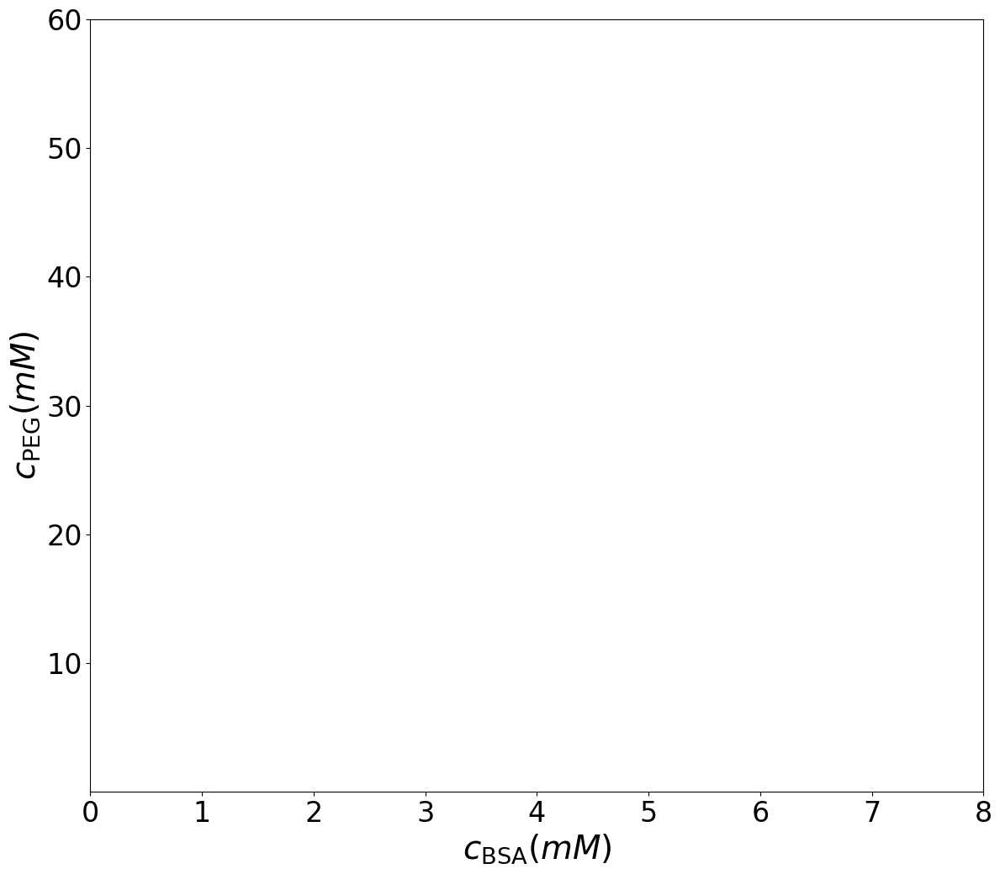

In [25]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(1e-2,60)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_FVT(gfvt4K_200mM_Z0_FVT, f'FVT 4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red')

molplot_FVT(gfvt6K_200mM_Z0_FVT, f'FVT 6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'gray', 'red')

molplot_FVT(gfvt8K_200mM_Z0_FVT, f'FVT 8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'cyan', 'red')

molplot_FVT(gfvt20K_200mM_Z0_FVT, f'FVT 20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'red', 'red')

molplot_FVT(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'lawngreen', 'red')

molplot_FVT(gfvt100K_200mM_Z0_FVT, f'FVT 100K, pH 7, 200 mM KCl, ', 'purple', 'red')
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'magenta', 'red')

# molplot_FVT(gfvt100K_200mM_Z0_FVT_ex, f'100K, pH 7, 200 mM KCl, ', 'red', 'red')

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)

# plt.yscale('log')

## molplot_FVT_phi

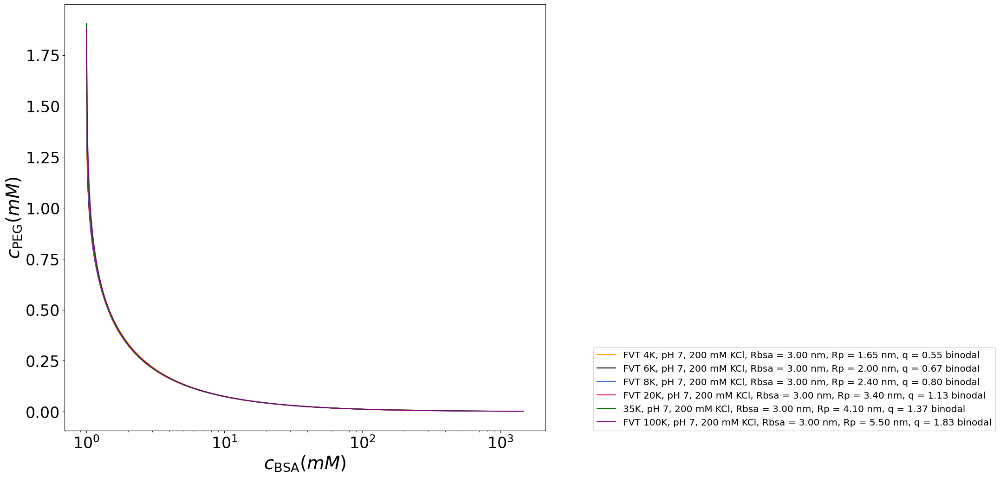

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.xlim(0,8)
# plt.ylim(0.01,10)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 1000 # number of points between PhiP_max and PhiP_min 
PhiP_max = 200# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.01 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]

# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvtQ10_200mM_Z0_FVT = FVT(3.0e-9, 10e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_FVT_phi(gfvt4K_200mM_Z0_FVT, f'FVT 4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot_FVT_phi(gfvt6K_200mM_Z0_FVT, f'FVT 6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot_FVT_phi(gfvt8K_200mM_Z0_FVT, f'FVT 8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot_FVT_phi(gfvt20K_200mM_Z0_FVT, f'FVT 20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot_FVT_phi(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot_FVT_phi(gfvt100K_200mM_Z0_FVT, f'FVT 100K, pH 7, 200 mM KCl, ', 'purple', 'red')
# molplot_FVT_phi(gfvtQ10_200mM_Z0_FVT, f'FVT Q10, pH 7, 200 mM KCl, ', 'red', 'red')

plt.xscale('log')
# plt.yscale('log')

# molplot_FVT(gfvt100K_200mM_Z0_FVT_ex, f'100K, pH 7, 200 mM KCl, ', 'red', 'red')

## Excluded Volume Limit FVT

q=0.55
q=0.67
q=0.8
q=1.13
q=1.37
q=1.83


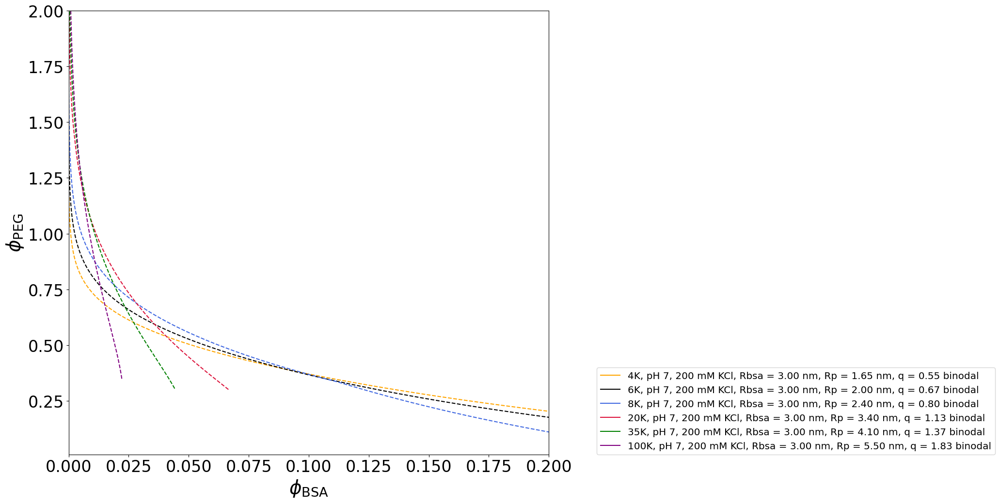

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,0.2)
plt.ylim(1e-2,2)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_FVT_phi(gfvt4K_200mM_Z0_FVT, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot_FVT_phi(gfvt6K_200mM_Z0_FVT, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot_FVT_phi(gfvt8K_200mM_Z0_FVT, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot_FVT_phi(gfvt20K_200mM_Z0_FVT, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot_FVT_phi(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot_FVT_phi(gfvt100K_200mM_Z0_FVT, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red')

EV_plot_q(0.55, 10, 1.5, 7, 'orange')
EV_plot_q(0.67, 10, 1, 7, 'black')
EV_plot_q(0.8, 10, 0.5, 7, 'royalblue')
EV_plot_q(1.13, 10, 0.3, 7, 'crimson')
EV_plot_q(1.37, 10, 0.16, 7, 'green')
EV_plot_q(1.83, 10, 0.07, 7, 'purple')

# plt.yscale('log')

## PLOT compare GFVT and FVT (mM)

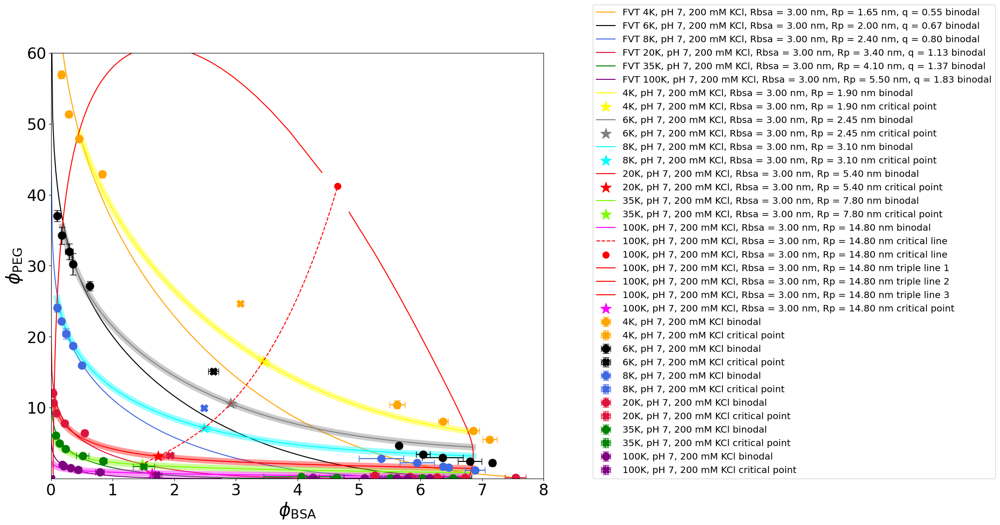

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(1e-2,60)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_FVT(gfvt4K_200mM_Z0_FVT, f'FVT 4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot_FVT(gfvt6K_200mM_Z0_FVT, f'FVT 6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot_FVT(gfvt8K_200mM_Z0_FVT, f'FVT 8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot_FVT(gfvt20K_200mM_Z0_FVT, f'FVT 20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot_FVT(gfvt35K_200mM_Z0_FVT, f'FVT 35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot_FVT(gfvt100K_200mM_Z0_FVT, f'FVT 100K, pH 7, 200 mM KCl, ', 'purple', 'red')

molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red')
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'gray', 'red')
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'cyan', 'red')
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'red', 'red')
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'lawngreen', 'red')
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'magenta', 'red')

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)

# EV_plot(3.0e-9, 1.65e-9, 10, 1.5, 7, 'orange')
# EV_plot(3.0e-9, 2.0e-9, 10, 1, 7, 'black')
# EV_plot(3.0e-9, 2.4e-9, 10, 0.5, 7, 'royalblue')
# EV_plot(3.0e-9, 3.4e-9, 10, 0.3, 7, 'crimson')
# EV_plot(3.0e-9, 4.1e-9, 10, 0.15, 7, 'green')
# EV_plot(3.0e-9, 5.5e-9, 10, 0.05, 7, 'purple')

# plt.yscale('log')

## PLOT compare GFVT and FVT (g/L)

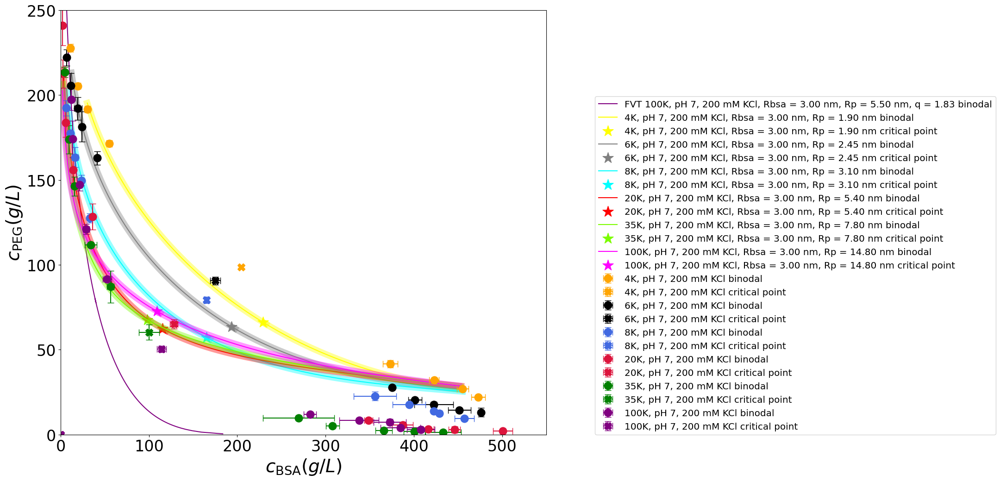

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,550)
plt.ylim(0,250)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

# molplot_FVT(gfvt4K_200mM_Z0_FVT, f'FVT 4K, pH 7, 200 mM KCl, ', 'orange', mbsa, mpeg4)
# molplot_FVT(gfvt6K_200mM_Z0_FVT, f'FVT 6K, pH 7, 200 mM KCl, ', 'black', mbsa, mpeg6)
# molplot_FVT(gfvt8K_200mM_Z0_FVT, f'FVT 8K, pH 7, 200 mM KCl, ', 'royalblue', mbsa, mpeg8)
# molplot_FVT(gfvt20K_200mM_Z0_FVT, f'FVT 20K, pH 7, 200 mM KCl, ', 'crimson', mbsa, mpeg20)
# molplot_FVT(gfvt35K_200mM_Z0_FVT, f'FVT 35K, pH 7, 200 mM KCl, ', 'green', mbsa, mpeg35)
molplot_FVT(gfvt100K_200mM_Z0_FVT, f'FVT 100K, pH 7, 200 mM KCl, ', 'purple', mbsa, mpeg100)

molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red', mass=True)
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'gray', 'red', mass=True)
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'cyan', 'red', mass=True)
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'red', 'red', mass=True)
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'lawngreen', 'red', mass=True)
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'magenta', 'red', mass=True)

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', False)

# EV_plot(3.0e-9, 1.65e-9, 10, 1.5, 7, 'orange')
# EV_plot(3.0e-9, 2.0e-9, 10, 1, 7, 'black')
# EV_plot(3.0e-9, 2.4e-9, 10, 0.5, 7, 'royalblue')
# EV_plot(3.0e-9, 3.4e-9, 10, 0.3, 7, 'crimson')
# EV_plot(3.0e-9, 4.1e-9, 10, 0.15, 7, 'green')
# EV_plot(3.0e-9, 5.5e-9, 10, 0.05, 7, 'purple')

# plt.yscale('log')

## Ingham Atha

q=0.55
q=0.6666666666666667
q=0.8


/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_96013/4166966770.py:92: RuntimeWarning: overflow encountered in exp
  return np.exp(-Qs)


q=1.1333333333333333
q=1.3666666666666667
q=1.8333333333333333


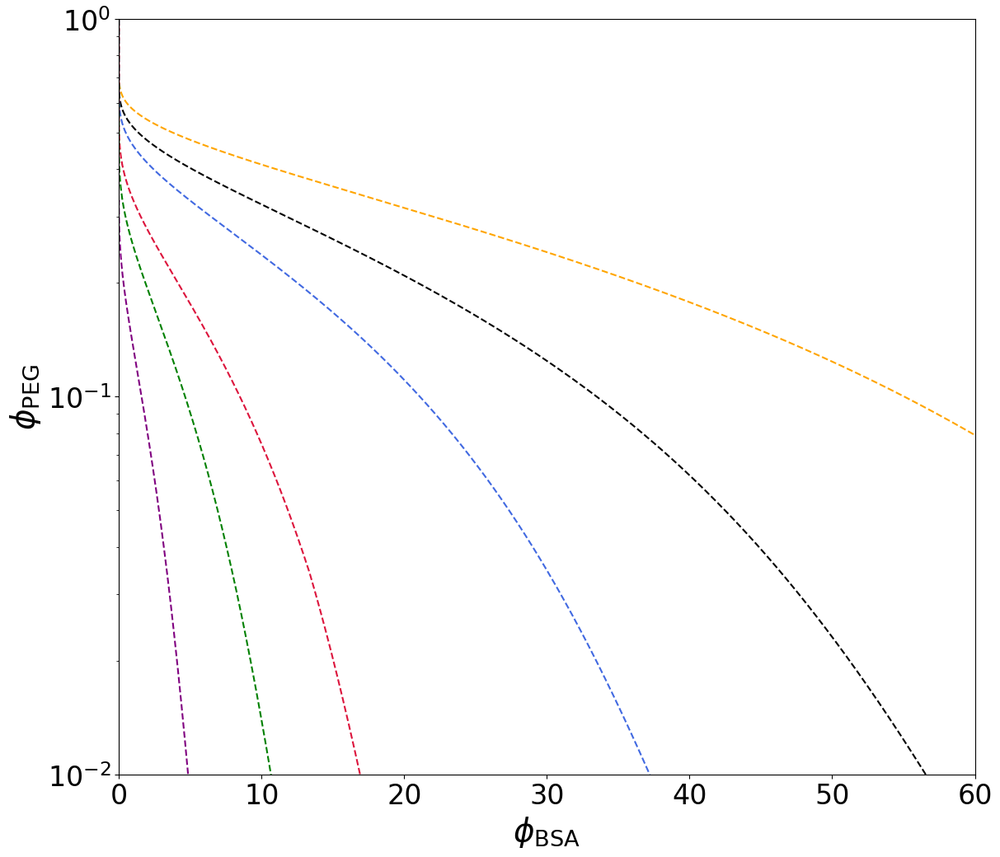

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,60)
plt.ylim(1e-2,1)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #

guess_b = [g1, g2];
guess_c = [0.1, 0.5]
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_FVT = FVT(3.0e-9, 1.65e-9, mbsa, mpeg4, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt6K_200mM_Z0_FVT = FVT(3.0e-9, 2.0e-9, mbsa, mpeg6, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = FVT(3.0e-9, 2.4e-9, mbsa, mpeg8, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt20K_200mM_Z0_FVT = FVT(3.0e-9, 3.4e-9, mbsa, mpeg20, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt35K_200mM_Z0_FVT = FVT(3.0e-9, 4.1e-9, mbsa, mpeg35, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT = FVT(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_FVT_ex = FVT_exclusion(3.0e-9, 5.5e-9, mbsa, mpeg100, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

# molplot_FVT(gfvt4K_200mM_Z0_FVT, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
# molplot_FVT(gfvt6K_200mM_Z0_FVT, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
# molplot_FVT(gfvt8K_200mM_Z0_FVT, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
# molplot_FVT(gfvt20K_200mM_Z0_FVT, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
# molplot_FVT(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
# molplot_FVT(gfvt100K_200mM_Z0_FVT, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red')

# molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red')
# molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'gray', 'red')
# molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'cyan', 'red')
# molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'red', 'red')
# molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'lawngreen', 'red')
# molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'magenta', 'red')

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
# molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
# molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)

EV_plot_Atha(3.0e-9, 1.65e-9, 10, 1.5, 7, 'orange')
EV_plot_Atha(3.0e-9, 2.0e-9, 10, 1, 7, 'black')
EV_plot_Atha(3.0e-9, 2.4e-9, 10, 0.5, 7, 'royalblue')
EV_plot_Atha(3.0e-9, 3.4e-9, 10, 0.3, 7, 'crimson')
EV_plot_Atha(3.0e-9, 4.1e-9, 10, 0.15, 7, 'green')
EV_plot_Atha(3.0e-9, 5.5e-9, 10, 0.05, 7, 'purple')

# plt.yscale('log')

## FVT_a()

ValueError: too many values to unpack (expected 25)

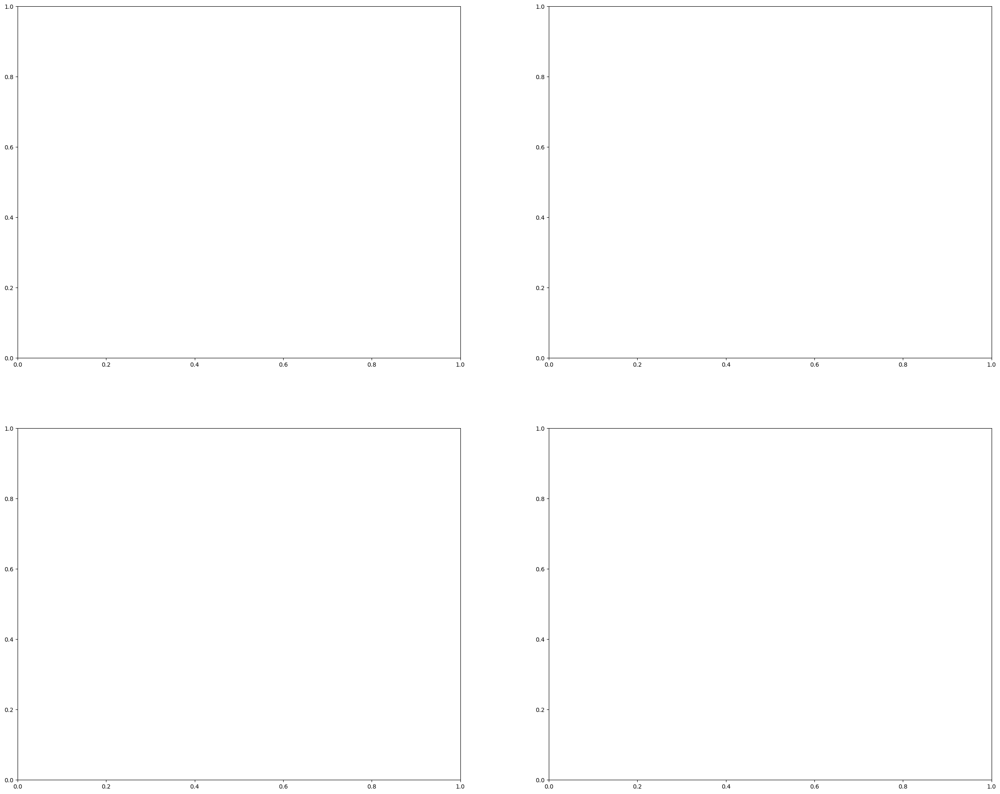

In [ ]:
def FVT_a(fvt, ax, plabel, pcolor):
    PhiR_list_fix, Pr_Drop_fix, Pol_Drop_fix, a_listD_fix, Pr_Sup_fix, Pol_Sup_fix, a_listS_fix, params = fvt

    phixbsa = params[-2];
    phixpeg = params[-1];
    rbsa = params[0];
    rpeg = params[1];

    q = rpeg/rbsa;

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + ' FVT binodal'
    print(full_label)
    
    ax[0][0].plot(Pr_Drop_fix, a_listD_fix, color = pcolor, linewidth=3)
    ax[0][0].plot(Pr_Sup_fix, a_listS_fix, color = pcolor, linewidth=3)

    ax[0][0].tick_params(axis='x', labelsize=24)
    ax[0][0].tick_params(axis='y', labelsize=24)
    ax[0][0].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
    ax[0][0].set_ylabel(r'$\alpha$',fontsize = 28)

    ax[0][1].plot(Pol_Drop_fix, a_listD_fix, color = pcolor, linewidth=3)
    ax[0][1].plot(Pol_Sup_fix, a_listS_fix, color = pcolor, linewidth=3)

    ax[0][1].tick_params(axis='x', labelsize=24)
    ax[0][1].tick_params(axis='y', labelsize=24)
    ax[0][1].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
    ax[0][1].set_ylabel(r'$\alpha$',fontsize = 28)

    ax[1][0].plot(Pr_Drop_fix/phixbsa, a_listD_fix, color = pcolor, linewidth=3)
    ax[1][0].plot(Pr_Sup_fix/phixbsa, a_listS_fix, color = pcolor, linewidth=3)

    ax[1][0].tick_params(axis='x', labelsize=24)
    ax[1][0].tick_params(axis='y', labelsize=24)
    ax[1][0].set_xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
    ax[1][0].set_ylabel(r'$\alpha$',fontsize = 28)

    ax[1][1].plot(Pol_Drop_fix/phixpeg, a_listD_fix, color = pcolor, linewidth=3)
    ax[1][1].plot(Pol_Sup_fix/phixpeg, a_listS_fix, color = pcolor, linewidth=3)

    ax[1][1].tick_params(axis='x', labelsize=24)
    ax[1][1].tick_params(axis='y', labelsize=24)
    ax[1][1].set_xlabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
    ax[1][1].set_ylabel(r'$\alpha$',fontsize = 28)
    
    plt.legend(loc=(1.1,0),fontsize='x-large')

def GFVT_a(gfvt_out, ax, plabel, pcolor):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop, dPidPhiP_Drop_p, qx_Sup, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, params = gfvt_out

    phixbsa = params[-2];
    phixpeg = params[-1];
    rbsa = params[0]*1e9;
    rpeg = params[1]*1e9;

    q = rpeg/rbsa;

    full_label = plabel + f'Rbsa = {rbsa:.2f} nm, Rpol = {rpeg:.2f} nm, q = {q:.2f}, ' + ' GFVT binodal'
    print(full_label)
    
    # ax[0][0].plot(BSA_Drop, [a*rbsa**3/(rbsa*(1+qx))**3 for cpeg, a, qx in zip(PEG_Drop, a_Drop, qx_Drop)],  '--', color = pcolor, linewidth=3)
    # ax[0][0].plot(BSA_Sup, [a/(rbsa*(1+qx))**3 for cpeg, a, qx in zip(PEG_Sup, a_Sup, qx_Sup)],  '--', color = pcolor, linewidth=3)

    ax[0][0].plot(BSA_Drop, [cpeg/phixpeg*cbsa/phixbsa for cbsa, cpeg, a, qx in zip(BSA_Drop, PEG_Drop, a_Drop, qx_Drop)],  '--', color = pcolor, linewidth=3)
    ax[0][0].plot(BSA_Sup, [cpeg/phixpeg*cbsa/phixbsa for cbsa, cpeg, a, qx in zip(BSA_Sup, PEG_Sup, a_Sup, qx_Sup)],  '--', color = pcolor, linewidth=3)

    ax[0][0].tick_params(axis='x', labelsize=24)
    ax[0][0].tick_params(axis='y', labelsize=24)
    ax[0][0].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
    ax[0][0].set_ylabel(r'$\alpha$',fontsize = 28)
    # ax[0][0].set_xlim(1e-3,10)
    # ax[0][0].set_ylim(1e-1,1)

    ax[0][1].plot(PEG_Drop, a_Drop,  '--', color = pcolor, linewidth=3)
    ax[0][1].plot(PEG_Sup, a_Sup,  '--', color = pcolor, linewidth=3)

    ax[0][1].tick_params(axis='x', labelsize=24)
    ax[0][1].tick_params(axis='y', labelsize=24)
    ax[0][1].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
    ax[0][1].set_ylabel(r'$\alpha$',fontsize = 28)

    ax[1][0].plot(BSA_Drop/phixbsa, a_Drop,  '--', color = pcolor, linewidth=3)
    ax[1][0].plot(BSA_Sup/phixbsa, a_Sup,  '--', color = pcolor, linewidth=3)

    ax[1][0].tick_params(axis='x', labelsize=24)
    ax[1][0].tick_params(axis='y', labelsize=24)
    ax[1][0].set_xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
    ax[1][0].set_ylabel(r'$\alpha$',fontsize = 28)

    ax[1][1].plot(PEG_Drop/phixpeg, a_Drop,  '--', color = pcolor, linewidth=3)
    ax[1][1].plot(PEG_Sup/phixpeg, a_Sup,  '--', color = pcolor, linewidth=3)

    ax[1][1].tick_params(axis='x', labelsize=24)
    ax[1][1].tick_params(axis='y', labelsize=24)
    ax[1][1].set_xlabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
    ax[1][1].set_ylabel(r'$\alpha$',fontsize = 28)
    
    plt.legend(loc=(1.1,0),fontsize='x-large')

fig, axes = plt.subplots(2, 2, figsize=(30, 24))
# FVT_a(gfvt4K_200mM_Z0_FVT, axes, f'4K, pH 7, 200 mM KCl, ', 'orange')
GFVT_a(gfvt4K_200mM_Z0, axes, f'4K, pH 7, 200 mM KCl, ', 'orange')
# FVT_a(gfvt6K_200mM_Z0_FVT, axes, f'6K, pH 7, 200 mM KCl, ', 'black')
GFVT_a(gfvt6K_200mM_Z0, axes, f'6K, pH 7, 200 mM KCl, ', 'black')
# FVT_a(gfvt8K_200mM_Z0_FVT, axes, f'8K, pH 7, 200 mM KCl, ', 'royalblue')
GFVT_a(gfvt8K_200mM_Z0, axes, f'8K, pH 7, 200 mM KCl, ', 'royalblue')
# FVT_a(gfvt20K_200mM_Z0_FVT, axes, f'20K, pH 7, 200 mM KCl, ', 'crimson')
GFVT_a(gfvt20K_200mM_Z0, axes, f'20K, pH 7, 200 mM KCl, ', 'crimson')
# FVT_a(gfvt35K_200mM_Z0_FVT, axes, f'35K, pH 7, 200 mM KCl, ', 'green')
GFVT_a(gfvt35K_200mM_Z0, axes, f'35K, pH 7, 200 mM KCl, ', 'green')
# FVT_a(gfvt100K_200mM_Z0_FVT, axes, f'100K, pH 7, 200 mM KCl, ', 'purple')
GFVT_a(gfvt100K_200mM_Z0, axes, f'100K, pH 7, 200 mM KCl, ', 'purple')

axes[0][0].set_yscale('log')
axes[0][0].set_xscale('log')

# exclusion limit

NameError: name 'gfvt4K_200mM_Z0' is not defined

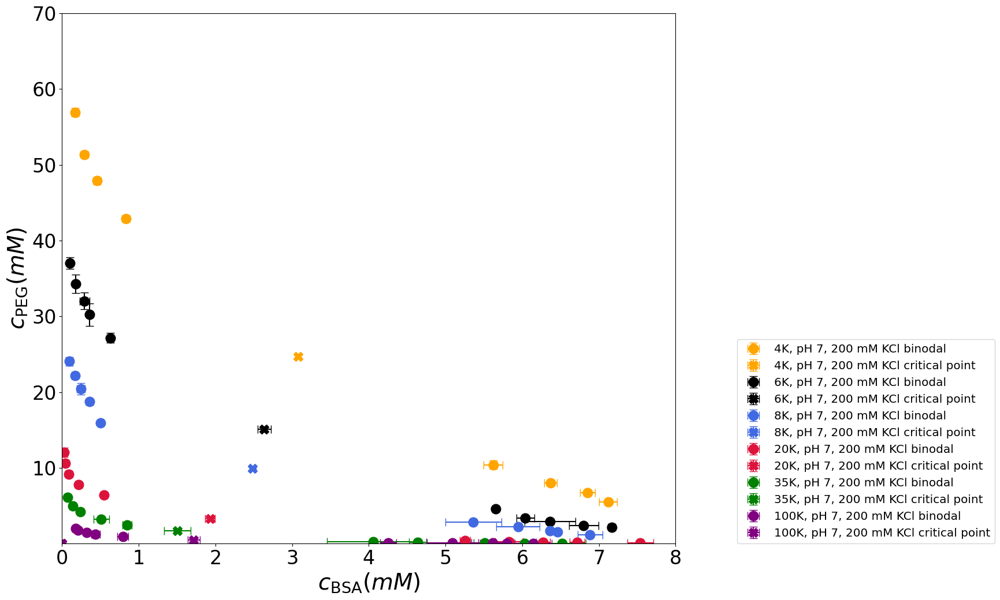

In [26]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.plot(x1,y1,'magenta',ms = 3)
# plt.plot(x2,y2, 'magenta',ms = 3)

plt.xlim(0,8)
plt.ylim(1e-2,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.3 # guess protein volume fraction in phase B
N_steps = 500 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.39 # 
solvent = 'good'

guess_b = [g1, g2];
guess_c = [0.24, 0.7];
guess_b = [1e-12, 0.8];
# guess_b = [0.0004, 0.54];
PhiP_max = 1.2#3 Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
# gfvt4K_200mM_Z0 = GFVT(3.0e-9, 1.9e-9, mbsa, mpeg4, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 2 # Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #
guess_b = [1e-4, 0.5];
# gfvt4K_200mM_Z0 = GFVT(3.0e-9, 2.45e-9, mbsa, mpeg6, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 3.0 # Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #
guess_b = [1e-4, 0.5];
# gfvt8K_200mM_Z0 = GFVT(3.0e-9, 3.1e-9, mbsa, mpeg8, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 6.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
guess_b = [1e-4, 0.5];
# gfvt20K_200mM_Z0 = GFVT(3.0e-9, 5.4e-9, mbsa, mpeg20, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 10# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
guess_b = [1e-4, 0.6];
# gfvt35K_200mM_Z0 = GFVT(3.0e-9, 7.8e-9, mbsa, mpeg35, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 24# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
# g1 = 1e-8 # guess protein volume fraction in phase A
# g2 = 1 # guess protein volume fraction in phase B
# guess_b = [1e-4, 0.5];

# gfvt100K_200mM_Z0 = GFVT(3.0e-9, 14.8e-9, mbsa, mpeg100, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)
# molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K + 35K, pH 7, 200 mM KCl', 'blue', mbsa, mpeg6, False)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW,'2K+35K Molar (35K only), pH 7, 200 mM KCl', 'cyan', mbsa,  8.57, False)

molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red')

# EV_plot(3.0e-9, 7.8e-9, 100, 2, 7, 'green')
# EV_plot(3.0e-9, 7.8e-9, 100, 1e-5, 7, 'green')

# molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'magenta', 'red')
# molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'blue', 'red')

# plt.yscale('log')

# out = np.vstack((Pr_A,Pol_A,Pr_B,Pol_B))
# np.savetxt('phase_diagram_GFVT.txt',np.transpose(out), header = 'Phi Protein in phase A,Phi polymer in phase A,Phi Protein in phase B,Phi polymer in phase B')

# GFVT Calculations

## GVFT calculations

q = 0.50, L/D = 5.00, D = 14.00 nm, Rp = 3.50 nm
Rod I-I crit = 0.2400, polymer reservoir = 0.3567
[Rod]_crit = 0.03 mM, [PEG]_crit = 1.51 mM



Calculating RFVT I-I Binodal: 100%|██████████| 100/100 [00:03<00:00, 29.39step/s]


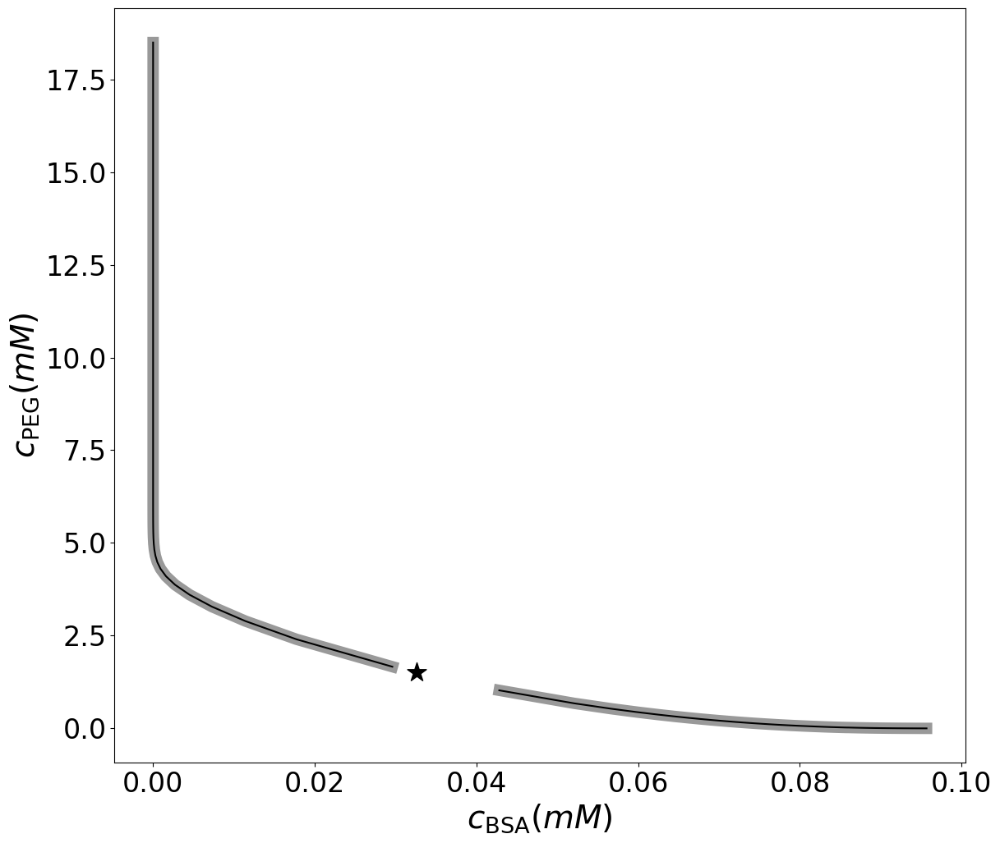

In [27]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.plot(x1,y1,'magenta',ms = 3)
# plt.plot(x2,y2, 'magenta',ms = 3)

# plt.xlim(0,8)
# plt.ylim(0,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

N_steps = 100 # number of points between PhiP_max and PhiP_min 

solvent = 'good'
guess_B = [1e-4, 0.7];
guess_c = [0.24, 0.7];

# gfvt4K_200mM_Z0 = GFVT(3.0e-9, 1.9e-9, mbsa, mpeg4, solvent, N_steps, guess_c)
# gfvt6K_200mM_Z0 = GFVT(3.0e-9, 2.45e-9, mbsa, mpeg6, solvent, N_steps, guess_c)
# gfvt8K_200mM_Z0 = GFVT(3.0e-9, 3.1e-9, mbsa, mpeg8, solvent, N_steps, guess_c)
# gfvt20K_200mM_Z0 = GFVT(3.0e-9, 5.4e-9, mbsa, mpeg20, solvent, N_steps, guess_c)
# gfvt35K_200mM_Z0 = GFVT(3.0e-9, 7.8e-9, mbsa, mpeg35, solvent, N_steps, guess_c)
# gfvt100K_200mM_Z0 = GFVT(3.0e-9, 14.8e-9, mbsa, mpeg100, solvent, N_steps, guess_c, critical=True)
# gfvtQ8_200mM_Z0 = GFVT(3.0e-9, 24e-9, mbsa, mpegQ8, solvent, N_steps, guess_c)
# gfvtQ10_200mM_Z0 = GFVT(3.0e-9, 32e-9, mbsa, mpegQ10, solvent, N_steps, guess_c)

rfvt = RFVT(7e-9, 70e-9, 3.5e-9, mbsa, mpeg35, solvent, N_steps, guess_B, guess_c)

guess_c = [0.1, 50]
# gfvtQ16_200mM_Z0 = GFVT(3.0e-9, 48e-9, mbsa, mpegQ16, solvent, N_steps, guess_c)

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
# molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
# molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)
# molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K + 35K, pH 7, 200 mM KCl', 'blue', mbsa, mpeg6, False)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW,'2K+35K Molar (35K only), pH 7, 200 mM KCl', 'cyan', mbsa,  8.57, False)

# molplot(gfvt4K_200mM_Z0, '4K, pH 7, 200 mM KCl, ', 'orange')
# molplot(gfvt6K_200mM_Z0, '6K, pH 7, 200 mM KCl, ', 'black')
# molplot(gfvt8K_200mM_Z0, '8K, pH 7, 200 mM KCl, ', 'royalblue')
# molplot(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson')
# molplot(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green')
# molplot(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple', crit_color='gray')
# molplot(gfvtQ8_200mM_Z0, 'Q8, ', 'red')
# molplot(gfvtQ10_200mM_Z0, 'Q10, ', 'magenta')
molplot(rfvt, 'I I, ', 'black')

# molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'magenta', 'red')
# molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'blue', 'red')

# plt.yscale('log')

# out = np.vstack((Pr_A,Pol_A,Pr_B,Pol_B))
# np.savetxt('phase_diagram_GFVT.txt',np.transpose(out), header = 'Phi Protein in phase A,Phi polymer in phase A,Phi Protein in phase B,Phi polymer in phase B')

## molplot_phi

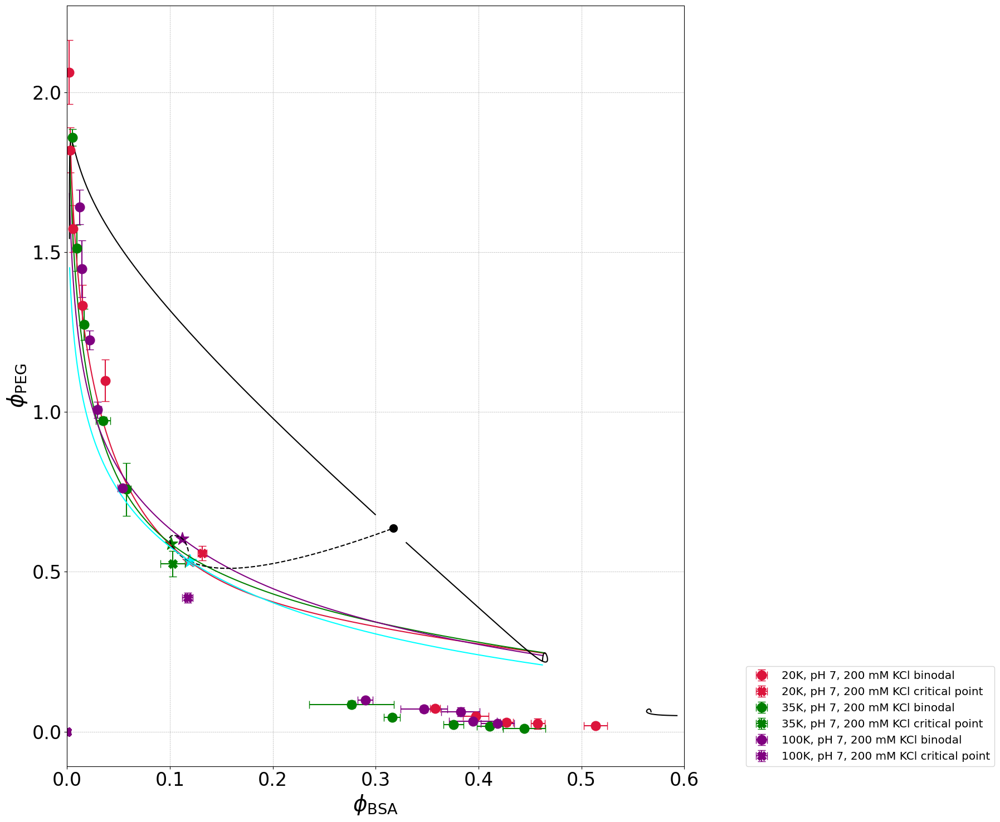

In [33]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,0.6)
# plt.ylim(0,2.5)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa=mbsa, mpeg=mpeg4)
# molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa=mbsa, mpeg=mpeg6)
# molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa=mbsa, mpeg=mpeg8)
molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa=mbsa, mpeg=mpeg35)
molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa=mbsa, mpeg=mpeg100)

# molplot_phi(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange')
# molplot_phi(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'black')
# molplot_phi(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue')
molplot_phi(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson')
molplot_phi(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green')
molplot_phi(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', crit_color='black')

# molplot_phi(gfvtQ8_200mM_Z0, f'Q=8, pH 7, 200 mM KCl, ', 'red')
# molplot_phi(gfvtQ10_200mM_Z0, f'Q=10, pH 7, 200 mM KCl, ', 'magenta')
molplot_phi(gfvtQ16_200mM_Z0, f'Q=16, pH 7, 200 mM KCl, ', 'cyan')
plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

## molplot_phiR

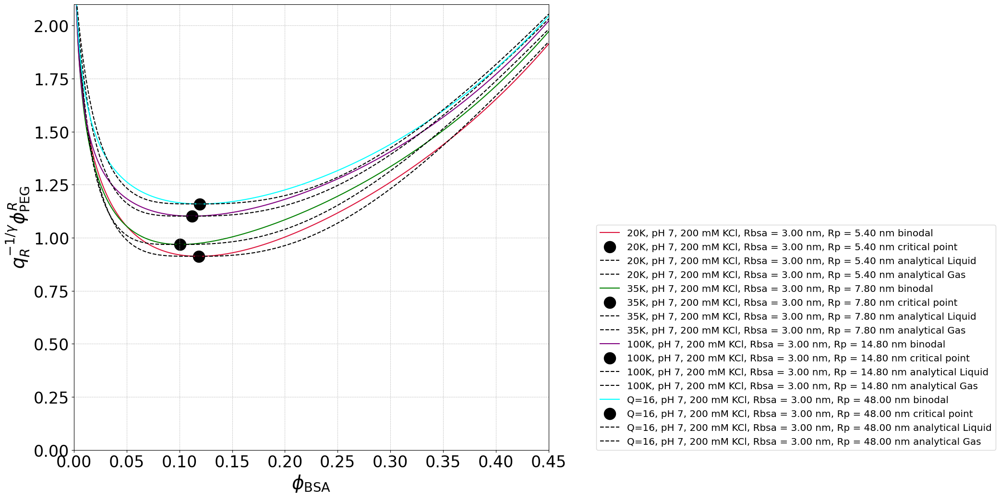

In [34]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,0.45)
plt.ylim(0,2.1)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$q_R^{-1/\gamma}\phi^R_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa, mpeg4,False)
# molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa, mpeg6, False)
# molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa, mpeg8, False)
# molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa, mpeg20, False)
# molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa, mpeg35, False)
# molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa, mpeg100, False)

# molplot_phiR(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', crit_color='red')
# molplot_phiR(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', crit_color='red')
# molplot_phiR(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', crit_color='red')
molplot_phiR(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='black')
molplot_phiR(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green', crit_color='black')
molplot_phiR(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple', crit_color='black')
# molplot_phiR(gfvtQ8_200mM_Z0_full, 'Q=8, pH 7, 200 mM KCl, ', 'red', crit_color='black')
# molplot_phiR(gfvtQ10_200mM_Z0_full, 'Q=10, pH 7, 200 mM KCl, ', 'magenta', crit_color='black')
molplot_phiR(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'cyan', crit_color='black', show_legend=True)

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

## molplot_phi_analytical

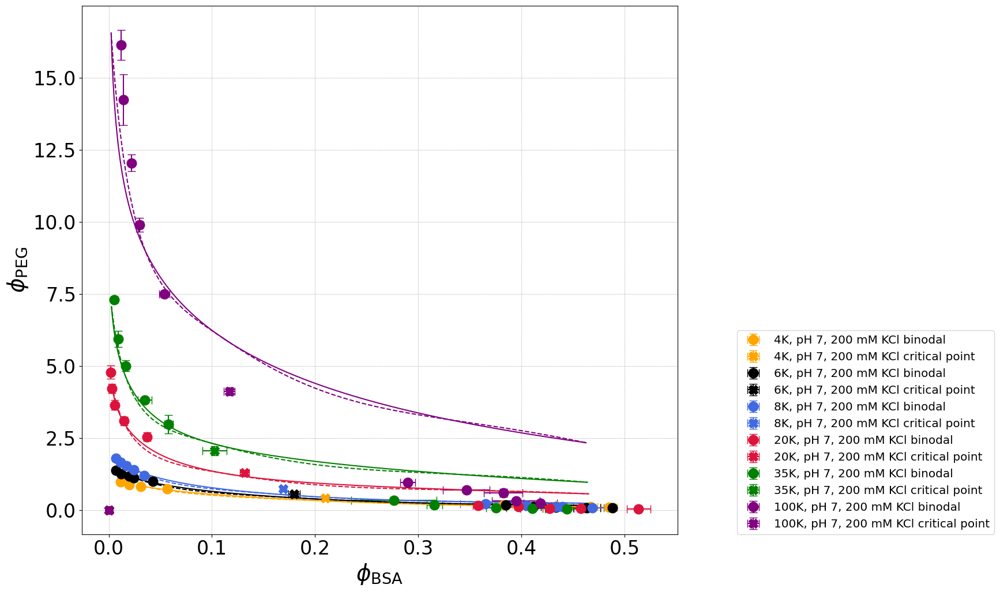

In [35]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.xlim(0,0.5)
# plt.ylim(0,2.5)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$\phi_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa=mbsa, mpeg=mpeg4, gamma=0)
molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa=mbsa, mpeg=mpeg6, gamma=0)
molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa=mbsa, mpeg=mpeg8, gamma=0)
molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa=mbsa, mpeg=mpeg20, gamma=0)
molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa=mbsa, mpeg=mpeg35, gamma=0)
molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa=mbsa, mpeg=mpeg100, gamma=0)

molplot_phi_analytical(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', crit_color='orange')
molplot_phi_analytical(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'black', crit_color='black')
molplot_phi_analytical(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', crit_color='royalblue')
molplot_phi_analytical(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='crimson')
molplot_phi_analytical(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', crit_color='green')
molplot_phi_analytical(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', crit_color='purple')
# molplot_phi_analytical(gfvtQ8_200mM_Z0, f'Q=8, pH 7, 200 mM KCl, ', 'red', crit_color='black')
# molplot_phi_analytical(gfvtQ10_200mM_Z0, f'Q=10, pH 7, 200 mM KCl, ', 'magenta', crit_color='black')
# molplot_phi_analytical(gfvtQ16_200mM_Z0, f'Q=16, pH 7, 200 mM KCl, ', 'cyan', crit_color='black')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

## molplot_analytical

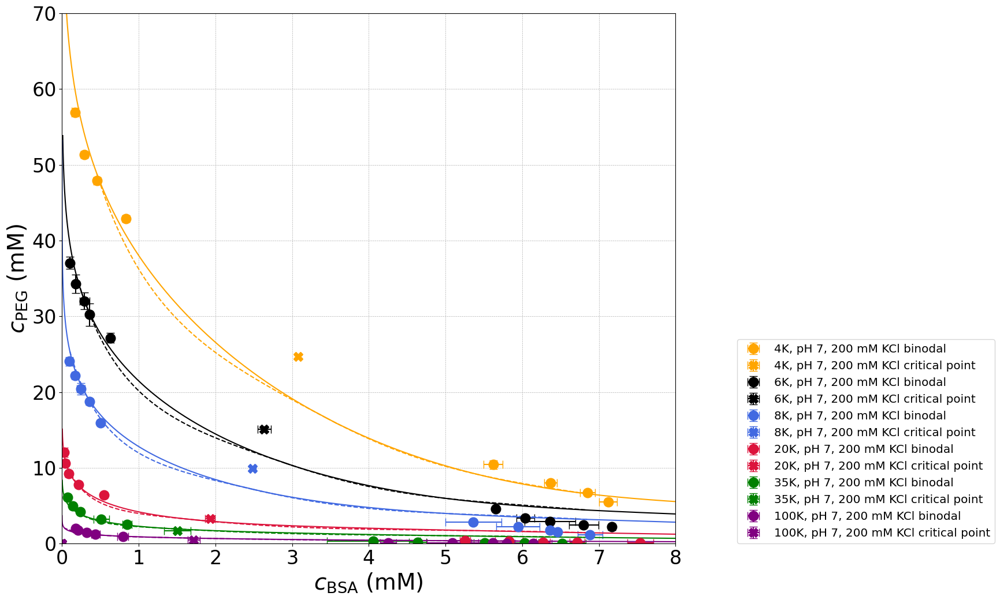

In [36]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA}$ (mM)',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG}$ (mM)',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa=mbsa, mpeg=mpeg4)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa=mbsa, mpeg=mpeg8)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa=mbsa, mpeg=mpeg35)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa=mbsa, mpeg=mpeg100)

molplot_analytical(gfvt4K_200mM_Z0_full, f'4K, pH 7, 200 mM KCl, ', 'orange', crit_color='orange')
molplot_analytical(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', crit_color='black')
molplot_analytical(gfvt8K_200mM_Z0_full, f'8K, pH 7, 200 mM KCl, ', 'royalblue', crit_color='royalblue')
molplot_analytical(gfvt20K_200mM_Z0_full, f'20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='crimson')
molplot_analytical(gfvt35K_200mM_Z0_full, f'35K, pH 7, 200 mM KCl, ', 'green', crit_color='green')
molplot_analytical(gfvt100K_200mM_Z0_full, f'100K, pH 7, 200 mM KCl, ', 'purple', crit_color='purple')
# molplot_analytical(gfvtQ8_200mM_Z0_full, f'Q=8, pH 7, 200 mM KCl, ', 'red', crit_color='black')
# molplot_analytical(gfvtQ10_200mM_Z0_full, f'Q=10, pH 7, 200 mM KCl, ', 'magenta', crit_color='black')
# molplot_analytical(gfvtQ16_200mM_Z0_full, f'Q=16, pH 7, 200 mM KCl, ', 'cyan', crit_color='black')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

## theta solvent

NameError: name 'data_4K_pH7_200mM' is not defined

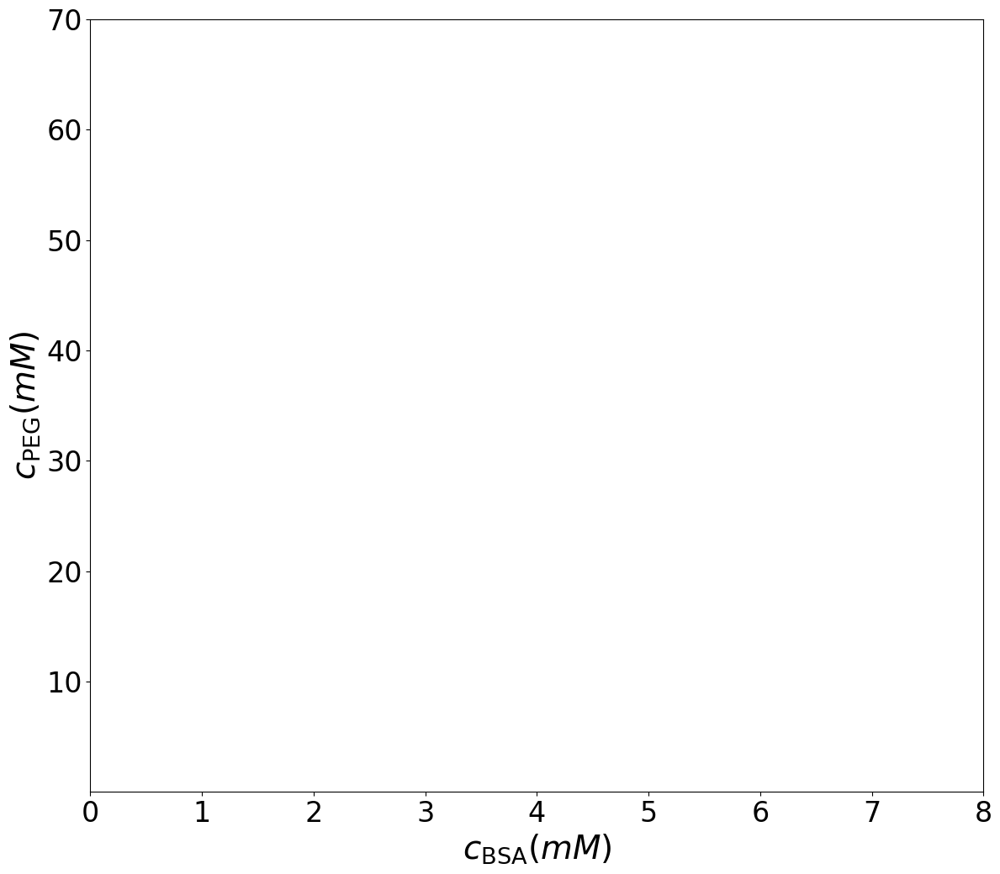

In [37]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.plot(x1,y1,'magenta',ms = 3)
# plt.plot(x2,y2, 'magenta',ms = 3)

plt.xlim(0,8)
plt.ylim(1e-2,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 500 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 

guess_b = [g1, g2];
PhiP_max = 0.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.35
# gfvt4K_200mM_Z0_theta = GFVT(3.0e-9, 1.52e-9, mbsa, mpeg4, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 1# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4
guess_c = gfvt6K_200mM_Z0_theta[-1][7]
guess_b = gfvt6K_200mM_Z0_theta[-1][8]

# gfvt6K_200mM_Z0_theta = GFVT(3.0e-9, 1.95e-9, mbsa, mpeg6, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_theta = GFVT(3.0e-9, 2.35e-9, mbsa, mpeg8, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 2.0# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4
guess_c = gfvt20K_200mM_Z0_theta[-1][7]
guess_b = gfvt20K_200mM_Z0_theta[-1][8]

# gfvt20K_200mM_Z0_theta = GFVT(3.0e-9, 3.7e-9, mbsa, mpeg20, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 2.4# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4
guess_c = gfvt100K_200mM_Z0_theta[-1][7]
guess_b = gfvt100K_200mM_Z0_theta[-1][8]

# gfvt35K_200mM_Z0_theta = GFVT(3.0e-9, 4.8e-9, mbsa, mpeg35, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt100K_200mM_Z0_theta = GFVT(3.0e-9, 7.0e-9, mbsa, mpeg100, 'theta', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
guess_b = [1e-4, 0.5];
guess_c = [0.24, 0.7];
PhiP_max = 24# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
# gfvt100K_200mM_Z0_rg = GFVT(3.0e-9, 14.8e-9, mbsa, mpeg100, 'RG', N_steps, PhiP_min, PhiP_max, guess_c, guess_b)


molplot_dat_err_csv(data_4K_pH7_200mM, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
# molplot_dat_err_csv(data_4K_pH7_200mM_MA, '4K, pH 7, 200 mM KCl', 'magenta', mbsa, mpeg4,False)
molplot_dat_err_csv(data_4K_pH7_200mM_MA2, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'magenta', mbsa, mpeg4,False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
molplot_dat_err_csv(data_20K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa, mpeg100, False)

molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red')
molplot(gfvt6K_200mM_Z0_theta, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'blue', 'red')
molplot(gfvt20K_200mM_Z0_theta, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot(gfvt35K_200mM_Z0_theta, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot(gfvt100K_200mM_Z0_theta, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red')
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'magenta', 'red')
molplot(gfvt100K_200mM_Z0_rg, f'100K, pH 7, 200 mM KCl, ', 'red', 'red')

# molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'magenta', 'red')
# molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'blue', 'red')
# plt.savefig('phase_diagram.png')

# plt.yscale('log')

#%%

# out = np.vstack((Pr_A,Pol_A,Pr_B,Pol_B))
# np.savetxt('phase_diagram_GFVT.txt',np.transpose(out), header = 'Phi Protein in phase A,Phi polymer in phase A,Phi Protein in phase B,Phi polymer in phase B')

## FVT

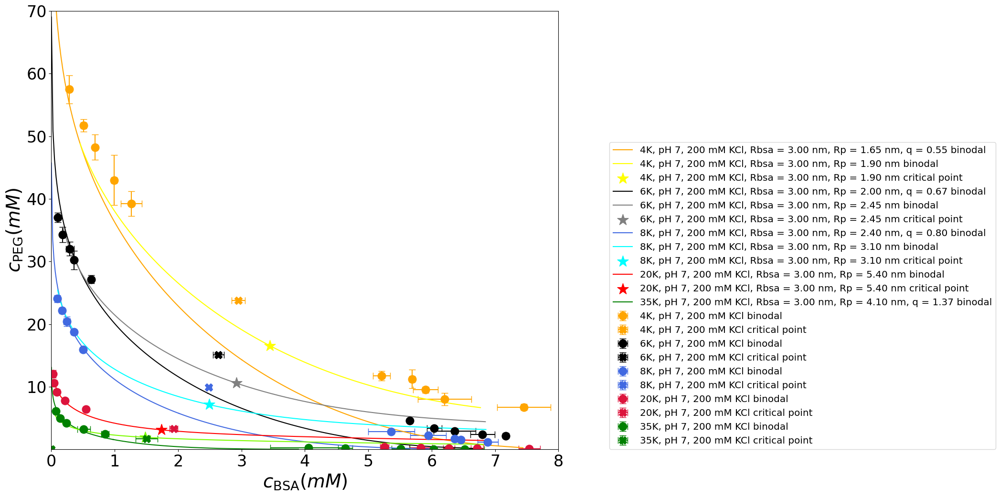

In [ ]:
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.plot(x1,y1,'magenta',ms = 3)
# plt.plot(x2,y2, 'magenta',ms = 3)

plt.xlim(0,8)
plt.ylim(1e-2,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.5 # guess protein volume fraction in phase B
N_steps = 100 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
solvent = 'theta'

guess_b = [g1, g2];
guess_c = 0;

PhiP_max = 1.4 # Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
# gfvt4K_200mM_Z0_FVT = GFVT(3.0e-9, 1.52e-9, mbsa, mpeg4, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 2.0 # Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #
# gfvt6K_200mM_Z0_FVT = GFVT(3.0e-9, 1.95e-9, mbsa, mpeg6, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
# gfvt8K_200mM_Z0_FVT = GFVT(3.0e-9, 2.35e-9, mbsa, mpeg8, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 6.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
# gfvt20K_200mM_Z0_theta = GFVT(3.0e-9, 3.4e-9, mbsa, mpeg20, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)
PhiP_max = 6.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
# gfvt35K_200mM_Z0_FVT = GFVT(3.0e-9, 4.8-9, mbsa, mpeg35, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot_dat_err_csv(data_4K_pH7_200mM, '4K, pH 7, 200 mM KCl', 'orange', mbsa, mpeg4,False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa, mpeg8, False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa, mpeg20, False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa, mpeg35, False)


molplot_FVT(gfvt4K_200mM_Z0_FVT, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'yellow', 'red')
molplot_FVT(gfvt6K_200mM_Z0_FVT, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'gray', 'red')
molplot_FVT(gfvt8K_200mM_Z0_FVT, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'cyan', 'red')
# molplot(gfvt20K_200mM_Z0_theta, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'red', 'red')
molplot_FVT(gfvt35K_200mM_Z0_FVT, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'lawngreen', 'red')

# molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'magenta', 'red')
# molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'blue', 'red')
# plt.savefig('phase_diagram.png')

# plt.yscale('log')

# out = np.vstack((Pr_A,Pol_A,Pr_B,Pol_B))
# np.savetxt('phase_diagram_GFVT.txt',np.transpose(out), header = 'Phi Protein in phase A,Phi polymer in phase A,Phi Protein in phase B,Phi polymer in phase B')

# Fig. 1

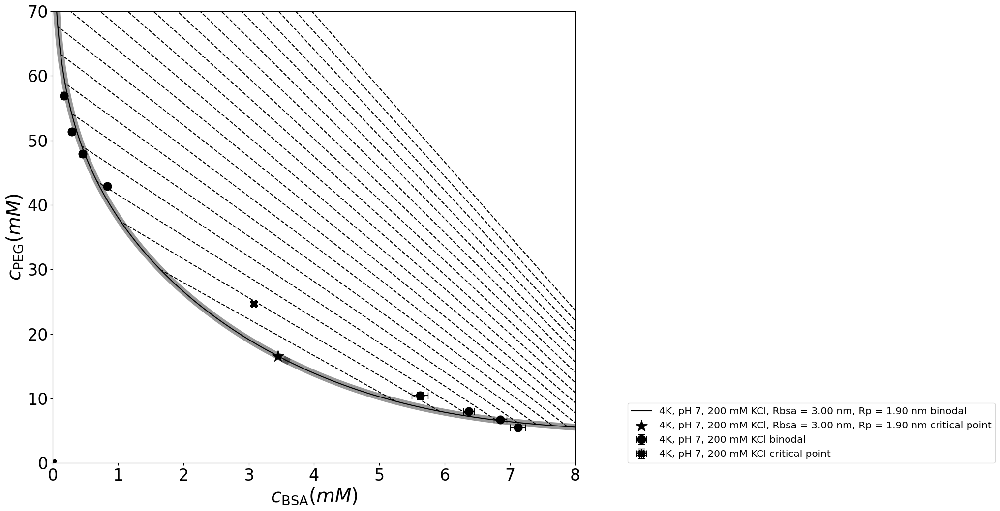

In [16]:
# figh = plt.figure(2, figsize = (20,9)) # aspect ratio for slide?
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

N_steps = 2000
guess_c = [0.24, 0.7]
# gfvt4K_200mM_Z0_full = GFVT_full(3.0e-9, 1.9e-9, mbsa, mpeg4, solvent, N_steps, guess_c, PhiP_max=2)

molplot(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'black', n_tie=100)
# molplot_dat_err_csv(data_4K_pH7_200mM, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg4)
# molplot_dat_err_csv(data_4K_pH7_200mM_MA, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg4)
# molplot_dat_err_csv(data_4K_pH7_200mM_MA2, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg4)
molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg4)

# plt.savefig(date_string+'_phase_diagram_all_tie_Z0_good_molar_Fig01.png')
# plt.savefig(date_string+'_phase_diagram_all_tie_Z0_good_molar_Fig01.eps')

# Fig. 2

## Fig. 2A - PEG MW

### Between Triple Points

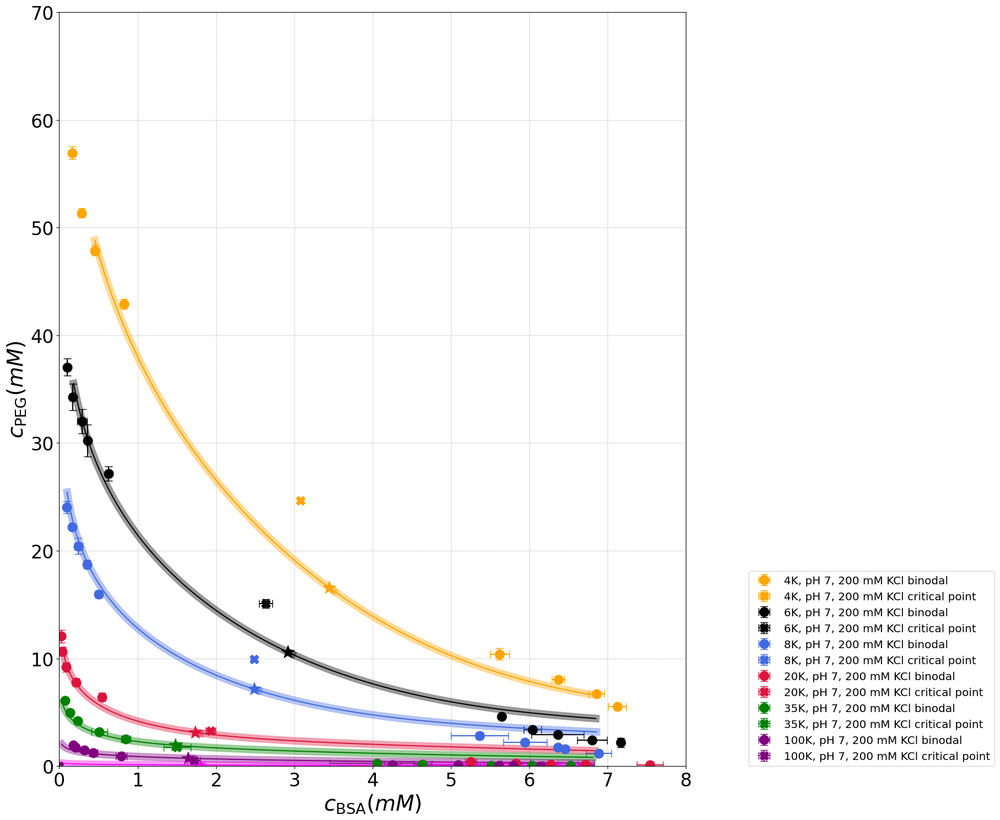

In [30]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa=mbsa, mpeg=mpeg4)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa=mbsa, mpeg=mpeg8)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa=mbsa, mpeg=mpeg35)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa=mbsa, mpeg=mpeg100)

molplot(gfvt4K_200mM_Z0, '4K, pH 7, 200 mM KCl, ', 'orange')
molplot(gfvt6K_200mM_Z0, '6K, pH 7, 200 mM KCl, ', 'black')
molplot(gfvt8K_200mM_Z0, '8K, pH 7, 200 mM KCl, ', 'royalblue')
molplot(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson')
molplot(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green')
# molplot(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple', crit_color='gray')
molplot(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple')
molplot(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'magenta')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_molar_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_molar_Fig02A.eps')

### Full range

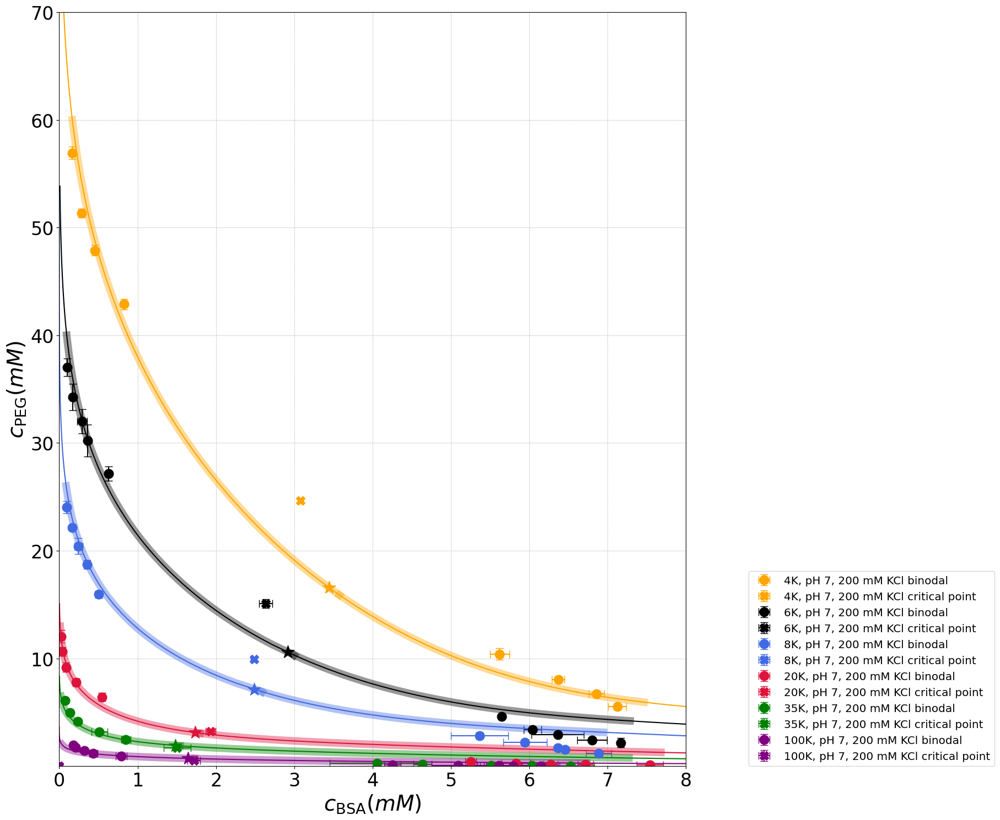

In [31]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0.01,70)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa=mbsa, mpeg=mpeg4)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa=mbsa, mpeg=mpeg8)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa=mbsa, mpeg=mpeg35)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', mbsa=mbsa, mpeg=mpeg100)

N_steps = 2000
guess_c = [0.24, 0.7]

# gfvt4K_200mM_Z0_full = GFVT_full(3.0e-9, 1.9e-9, mbsa, mpeg4, solvent, N_steps, guess_c, PhiP_max=2)
# gfvt6K_200mM_Z0_full = GFVT_full(3.0e-9, 2.45e-9, mbsa, mpeg6, solvent, N_steps, guess_c, PhiP_max=2)
# gfvt8K_200mM_Z0_full = GFVT_full(3.0e-9, 3.1e-9, mbsa, mpeg8, solvent, N_steps, guess_c, PhiP_max=4)
# gfvt20K_200mM_Z0_full = GFVT_full(3.0e-9, 5.4e-9, mbsa, mpeg20, solvent, N_steps, guess_c, PhiP_max=6)
# gfvt35K_200mM_Z0_full = GFVT_full(3.0e-9, 7.8e-9, mbsa, mpeg35, solvent, N_steps, guess_c, PhiP_max=10)
# gfvt100K_200mM_Z0_full = GFVT_full(3.0e-9, 14.8e-9, mbsa, mpeg100, solvent, N_steps, guess_c, PhiP_max=30)
# gfvtQ8_200mM_Z0_full = GFVT_full(3.0e-9, 24e-9, mbsa, mpegQ8, solvent, N_steps, guess_c, PhiP_max=50)
# gfvtQ10_200mM_Z0_full = GFVT_full(3.0e-9, 32e-9, mbsa, mpegQ10, solvent, N_steps, guess_c, PhiP_max=60)
# guess_c = [0.1, 50]
# gfvtQ16_200mM_Z0_full = GFVT_full(3.0e-9, 48e-9, mbsa, mpegQ16, solvent, N_steps, guess_c, PhiP_max=120)

# gfvt7p3K_200mM_Z0_full = GFVT_full(3.0e-9, 2.83e-9, mbsa, 7.3, solvent, N_steps, guess_c, PhiP_max=2)
# gfvt25K_200mM_Z0_full = GFVT_full(3.0e-9, 6.2e-9, mbsa, 25, solvent, N_steps, guess_c, PhiP_max=6)

molplot(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', plim=60)
molplot(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', plim=40)
molplot(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', plim=26)
molplot(gfvt20K_200mM_Z0_full, '20K, pH 7, 200 mM KCl, ', 'crimson', plim=13)
molplot(gfvt35K_200mM_Z0_full, '35K, pH 7, 200 mM KCl, ', 'green', plim=6.5)
molplot(gfvt100K_200mM_Z0_full, '100K, pH 7, 200 mM KCl, ', 'purple', plim=2)
# molplot(gfvtQ10_200mM_Z0_full, 'Q=10, pH 7, 200 mM KCl, ', 'gray')
# molplot(gfvtQ16_200mM_Z0_full, 'Q=16, pH 7, 200 mM KCl, ', 'cyan')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_molar_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_molar_Fig02A.eps')

### Mass (g/L)

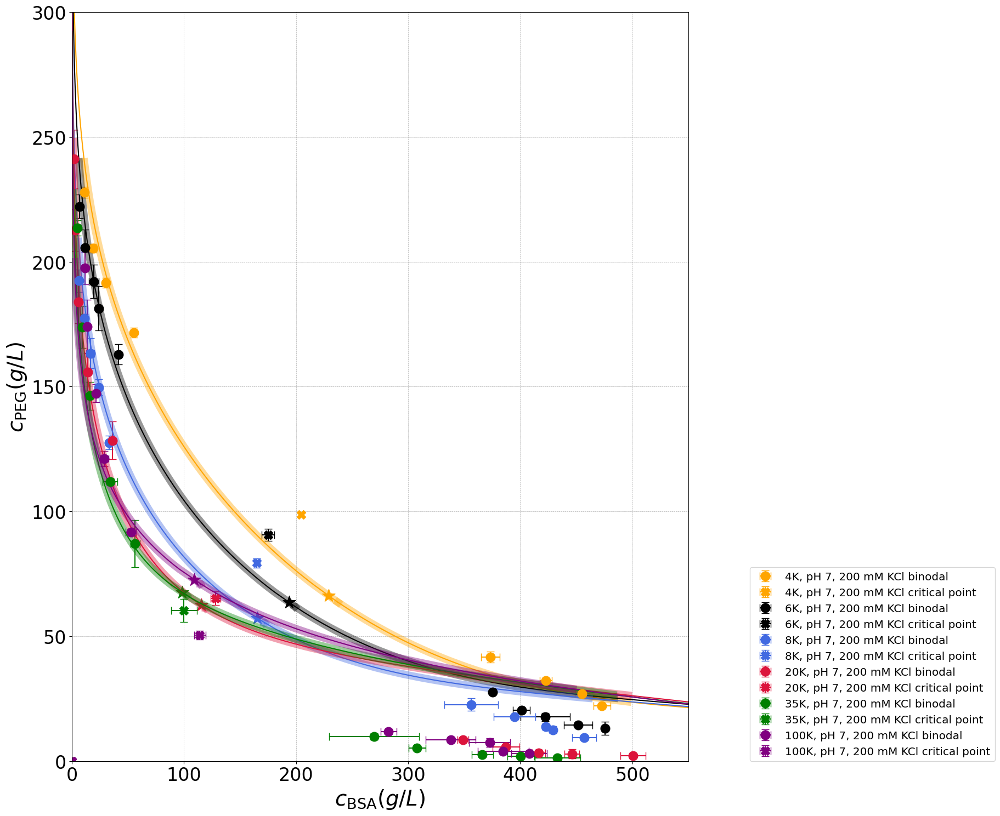

In [19]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,550)
plt.ylim(0,300)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange')
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', False)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', False)

molplot(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', mass=True, plim=60)
molplot(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', mass=True, plim=40)
molplot(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', mass=True, plim=26)
molplot(gfvt20K_200mM_Z0_full, '20K, pH 7, 200 mM KCl, ', 'crimson', mass=True, plim=12.4)
molplot(gfvt35K_200mM_Z0_full, '35K, pH 7, 200 mM KCl, ', 'green', mass=True, plim=6.5)
molplot(gfvt100K_200mM_Z0_full, '100K, pH 7, 200 mM KCl, ', 'purple', mass=True, plim=2)
# molplot(gfvtQ8_200mM_Z0, f'Q=8, pH 7, 200 mM KCl, ', 'red', mass=True)
# molplot(gfvtQ16_200mM_Z0, f'Q=16, pH 7, 200 mM KCl, ', 'magenta', mass=True)
plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

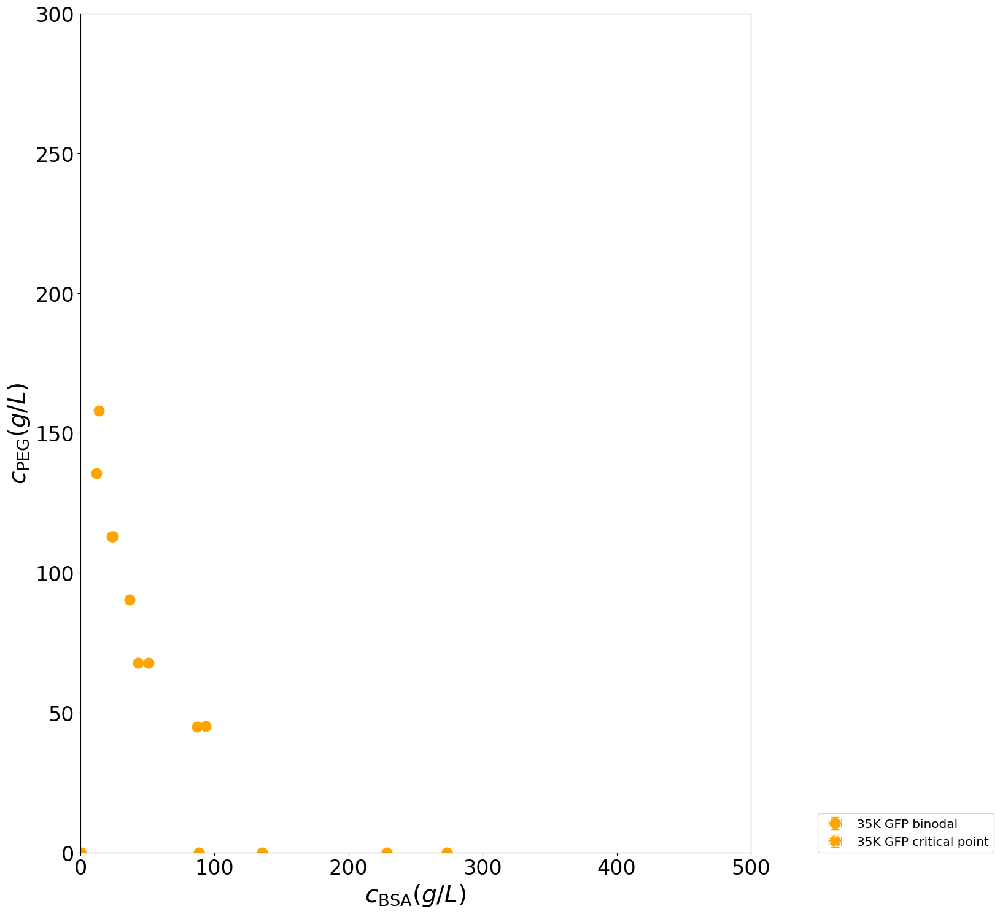

In [32]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,500)
plt.ylim(0,300)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_35K_GFP, '35K GFP', 'orange', False)


## Fig. 2B

q = 0.89, Rbsa = 3.00 nm, Rp = 2.68 nm
BSA_crit = 0.1871, PEG_crit = 0.8756
[BSA]_crit = 2.75 mM, [PEG]_crit = 9.09 mM

BSA_tp_G = 0.0097, BSA_tp_L = 0.4668, BSA_tp_S = 0.5633, PEG_tp = 1.5566
[BSA]_tp_G = 0.14 mM, [BSA]_tp_L = 6.85 mM, [BSA]_tp_S = 8.27 mM, [PEG]_tp_G = 31.38 mM, [PEG]_tp_L = 3.89 mM, [PEG]_tp_S = 1.11 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:47<00:00, 42.11step/s]


q = 0.94, Rbsa = 3.00 nm, Rp = 2.83 nm
BSA_crit = 0.1803, PEG_crit = 0.9242
[BSA]_crit = 2.65 mM, [PEG]_crit = 8.30 mM

BSA_tp_G = 0.0084, BSA_tp_L = 0.4670, BSA_tp_S = 0.5633, PEG_tp = 1.6915
[BSA]_tp_G = 0.12 mM, [BSA]_tp_L = 6.86 mM, [BSA]_tp_S = 8.27 mM, [PEG]_tp_G = 29.04 mM, [PEG]_tp_L = 3.60 mM, [PEG]_tp_S = 1.03 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:46<00:00, 42.92step/s]


q = 2.07, Rbsa = 3.00 nm, Rp = 6.20 nm
BSA_crit = 0.1097, PEG_crit = 2.3727
[BSA]_crit = 1.61 mM, [PEG]_crit = 2.60 mM

BSA_tp_G = 0.0029, BSA_tp_L = 0.4647, BSA_tp_S = 0.5656, PEG_tp = 5.2002
[BSA]_tp_G = 0.04 mM, [BSA]_tp_L = 6.82 mM, [BSA]_tp_S = 8.30 mM, [PEG]_tp_G = 8.60 mM, [PEG]_tp_L = 1.16 mM, [PEG]_tp_S = 0.33 mM



Calculating Binodal: 100%|██████████| 2000/2000 [01:36<00:00, 20.76step/s]


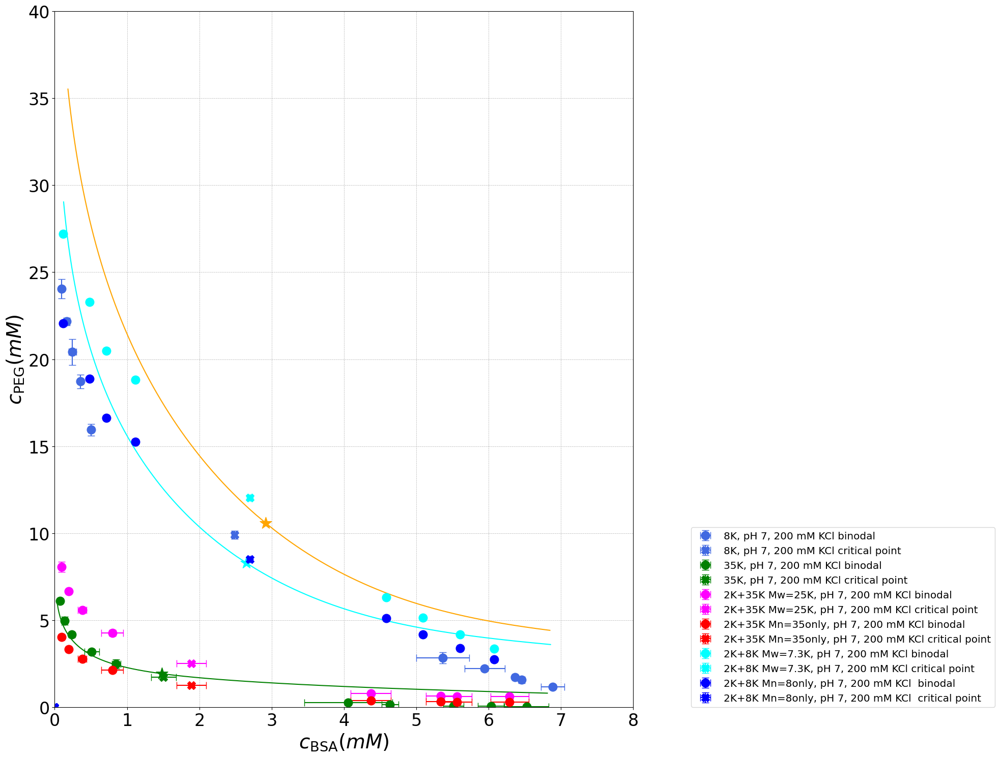

In [139]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0,40)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', mbsa=mbsa, mpeg=mpeg4)
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa=mbsa, mpeg=mpeg8)
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa=mbsa, mpeg=mpeg35)
# molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K, pH 7, 200 mM KCl', 'purple', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mw=25K, pH 7, 200 mM KCl', 'magenta', mbsa=mbsa, mpeg=25)
molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl', 'red', mbsa=mbsa, mpeg=mpeg35)

# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mn=6K, pH 7, 200 mM KCl', 'lawngreen', mbsa=mbsa, mpeg=mpeg6, False)
# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mw=6.7K, pH 7, 200 mM KCl', 'red', mbsa=mbsa, mpeg=6.7, False)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K, pH 7, 200 mM KCl', 'blue', mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan', mbsa=mbsa, mpeg=7.3)
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW8K, '2K+8K Mn=8only, pH 7, 200 mM KCl ', 'blue', mbsa=mbsa, mpeg=8)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n,'2K+8K Mn=5K, pH 7, 200 mM KCl', 'lawngreen', mbsa=mbsa,  mpeg=5, False)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n,'2K+8K Mw=6.8K, pH 7, 200 mM KCl', 'yellowgreen', mbsa=mbsa,  mpeg=6.8, False)

# data_2K8K_pH7_200mM_n = np.loadtxt('/Users/arebane/Library/CloudStorage/Dropbox/Abu Dhabi/Science/AUC/Binodals/Final/New format_PEG 2K+8K-200 mM-pH Binodal.csv', delimiter=',')
# data_2K8K_pH7_200mM_n_MW = np.loadtxt('/Users/arebane/Library/CloudStorage/Dropbox/Abu Dhabi/Science/AUC/Binodals/Final/PEG-2K8KK pH-7, 200 mM Salt.csv', delimiter=',')
# data_2K8K_pH7_200mM_n_MW8K = np.loadtxt('/Users/arebane/Library/CloudStorage/Dropbox/Abu Dhabi/Science/AUC/Binodals/Final/PEG-2K8KK pH-7, 200 mM Salt_8Kmass.csv', delimiter=',')

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.3 # guess protein volume fraction in phase B
N_steps = 2000 # number of points between PhiP_max and PhiP_min 

solvent = 'good'
guess_c = [0.24, 0.7];

gfvt6p7K_200mM_Z0 = GFVT(3.0e-9, 2.68e-9, mbsa, 6.7, solvent, N_steps, guess_c)
gfvt7p3K_200mM_Z0 = GFVT(3.0e-9, 2.83e-9, mbsa, 7.3, solvent, N_steps, guess_c)
gfvt25K_200mM_Z0 = GFVT(3.0e-9, 6.2e-9, mbsa, 25, solvent, N_steps, guess_c)

# molplot(gfvt4K_200mM_Z0, '4K, pH 7, 200 mM KCl, ', 'orange', 'red', False, mbsa=mbsa, mpeg=mpeg4)
molplot(gfvt6K_200mM_Z0, '6K, pH 7, 200 mM KCl, ', 'orange', 'red')
# molplot(gfvt6p7K_200mM_Z0, '6.7K, pH 7, 200 mM KCl, ', 'red', 'red')
molplot(gfvt7p3K_200mM_Z0, '7.3K, pH 7, 200 mM KCl, ', 'cyan', 'red')
# molplot(gfvt8K_200mM_Z0, '8K, pH 7, 200 mM KCl, ', 'royalblue', 'red', False, mbsa=mbsa, mpeg=mpeg8)
# molplot(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa=mbsa, mpeg=mpeg20)
molplot(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green', 'red')
# molplot(gfvt25K_200mM_Z0, '25K, pH 7, 200 mM KCl, ', 'magenta', 'red')

# If you have 251.3 mM final osmolarity, it should be 221.1 mM PEG 2K and 30.15 mM PEG 35K.
# I get you need 350 uL of 580 g/L 2K PEG for every 1 mL of 490 g/L 35K PEG.

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_molar_Fig02B.png')
# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_molar_Fig02B.eps')

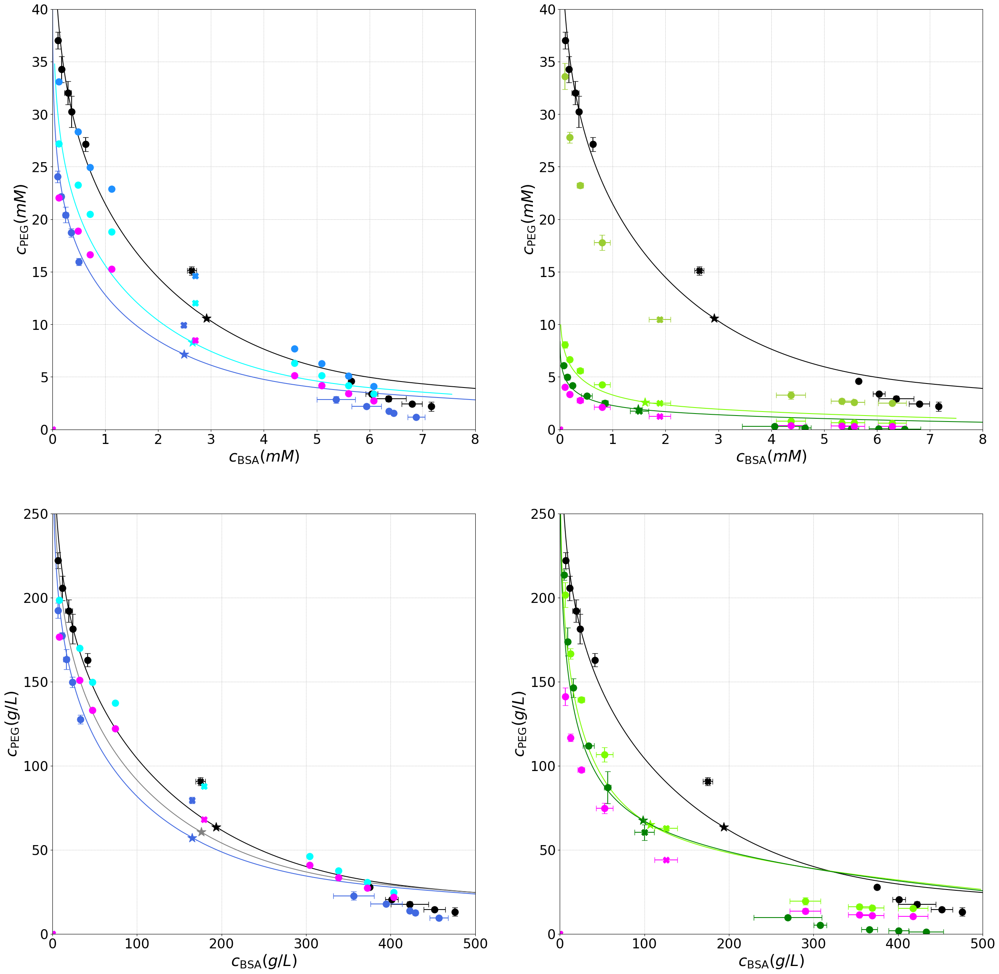

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(30, 30))

# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)

axes[0][0].set_xlim(0,8)
axes[0][0].set_ylim(0,40)
axes[0][0].tick_params(axis='x', labelsize=24)
axes[0][0].tick_params(axis='y', labelsize=24)
axes[0][0].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[0][0].set_ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[0][0].grid(True, which='both', ls='--', lw=0.5)

axes[0][1].set_xlim(0,8)
axes[0][1].set_ylim(0,40)
axes[0][1].tick_params(axis='x', labelsize=24)
axes[0][1].tick_params(axis='y', labelsize=24)
axes[0][1].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[0][1].set_ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[0][1].grid(True, which='both', ls='--', lw=0.5)


axes[1][0].set_xlim(0,500)
axes[1][0].set_ylim(0,250)
axes[1][0].tick_params(axis='x', labelsize=24)
axes[1][0].tick_params(axis='y', labelsize=24)
axes[1][0].set_xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
axes[1][0].set_ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[1][0].grid(True, which='both', ls='--', lw=0.5)

axes[1][1].set_xlim(0,500)
axes[1][1].set_ylim(0,250)
axes[1][1].tick_params(axis='x', labelsize=24)
axes[1][1].tick_params(axis='y', labelsize=24)
axes[1][1].set_xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
axes[1][1].set_ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[1][1].grid(True, which='both', ls='--', lw=0.5)

molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6, ax=axes[0][0])
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', mbsa=mbsa, mpeg=mpeg8, ax=axes[0][0])
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K, pH 7, 200 mM KCl', 'dodgerblue', mbsa=mbsa, mpeg=6, ax=axes[0][0])
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan', mbsa=mbsa, mpeg=7.3, ax=axes[0][0])
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW8K, '2K+8K Mn=8only, pH 7, 200 mM KCl ', 'magenta', mbsa=mbsa, mpeg=mpeg8, ax=axes[0][0])

molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', ax=axes[0][0])
molplot(gfvt8K_200mM_Z0_full, f'8K, pH 7, 200 mM KCl, ', 'royalblue', ax=axes[0][0])
molplot(gfvt7p3K_200mM_Z0_full, f'7.3K, pH 7, 200 mM KCl, ', 'cyan', ax=axes[0][0])

molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa=mbsa, mpeg=mpeg6, ax=axes[0][1])
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', ax=axes[0][1])
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', mbsa=mbsa, mpeg=mpeg35, ax=axes[0][1])
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K, pH 7, 200 mM KCl', 'yellowgreen', mbsa=mbsa, mpeg=6, ax=axes[0][1])
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mw=25K, pH 7, 200 mM KCl', 'lawngreen', mbsa=mbsa, mpeg=25, ax=axes[0][1])
molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl ', 'magenta', mbsa=mbsa, mpeg=mpeg35, ax=axes[0][1])

molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', ax=axes[0][1])
molplot(gfvt25K_200mM_Z0_full, f'25K, pH 7, 200 mM KCl, ', 'lawngreen', mbsa=mbsa, mpeg=25, ax=axes[0][1])
molplot(gfvt35K_200mM_Z0_full, f'35K, pH 7, 200 mM KCl, ', 'green', ax=axes[0][1])

molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', ax=axes[1][0])
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', ax=axes[1][0])
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan', ax=axes[1][0])
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW8K, '2K+8K Mn=8only, pH 7, 200 mM KCl ', 'magenta', ax=axes[1][0])

molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', mass=True, ax=axes[1][0])
molplot(gfvt8K_200mM_Z0_full, f'8K, pH 7, 200 mM KCl, ', 'royalblue', mass=True, ax=axes[1][0])
molplot(gfvt7p3K_200mM_Z0_full, f'7.3K, pH 7, 200 mM KCl, ', 'gray', mass=True, mbsa=mbsa, mpeg=7.3, ax=axes[1][0])

molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', ax=axes[1][1])
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', ax=axes[1][1])
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', ax=axes[1][1])
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K, pH 7, 200 mM KCl', 'lawngreen', ax=axes[1][1])
molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl ', 'magenta', ax=axes[1][1])

molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', mass=True, ax=axes[1][1])
molplot(gfvt25K_200mM_Z0_full, f'25K, pH 7, 200 mM KCl, ', 'lawngreen', mass=True, mbsa=mbsa, mpeg=25, ax=axes[1][1])
# molplot(gfvt20K_200mM_Z0_full, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', mass=True, mbsa=mbsa, mpeg=mpeg20, ax=axes[1][1])
molplot(gfvt35K_200mM_Z0_full, f'35K, pH 7, 200 mM KCl, ', 'green', mass=True, ax=axes[1][1])

plt.savefig(date_string+'_phase_diagram_PD_Z0_all_FigS1.png')
plt.savefig(date_string+'_phase_diagram_PD_Z0_all_FigS1.eps')

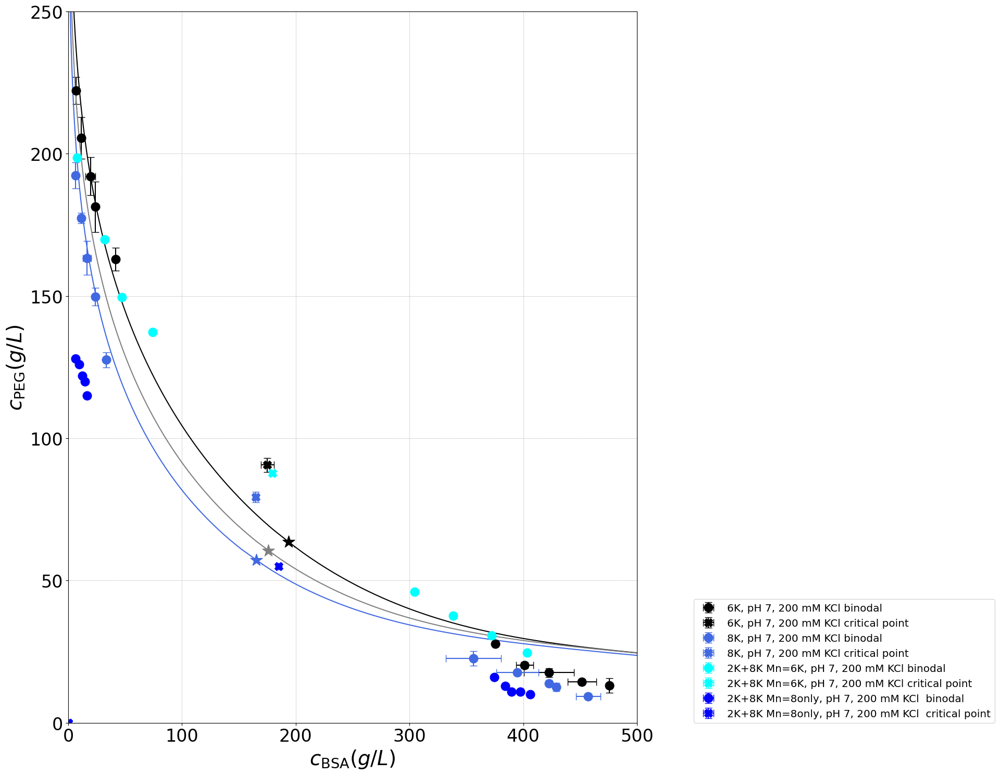

In [ ]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,500)
plt.ylim(0,250)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange')
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black')
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue')

# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson')
# molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green')

# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mn=6K Mw=6.7K, pH 7, 200 mM KCl', 'magenta')
# molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K Mw=25, pH 7, 200 mM KCl', 'purple')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K Mw=7, pH 7, 200 mM KCl', 'cyan')
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K, pH 7, 200 mM KCl', 'cyan')
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_8Konly, '2K+8K Mn=8only, pH 7, 200 mM KCl ', 'blue')

# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan', False)
# molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl', 'red')

# molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red', False, mbsa=mbsa, mpeg=mpeg4)
molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', mass=True)

molplot(gfvt8K_200mM_Z0_full, f'8K, pH 7, 200 mM KCl, ', 'royalblue', mass=True)
# molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa=mbsa, mpeg=mpeg20)
# molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', 'red', False, mbsa=mbsa, mpeg=mpeg35)
# molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red', False, mbsa=mbsa, mpeg=mpeg100)


# molplot(gfvt6p7K_200mM_Z0, f'6.7K, pH 7, 200 mM KCl, ', 'red', 'red', False, mbsa=mbsa, mpeg=6.7)
molplot(gfvt7p3K_200mM_Z0_full, f'7.3K, pH 7, 200 mM KCl, ', 'gray', mass=True, mbsa=mbsa, mpeg=7.3)

# molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red', False, mbsa=mbsa, mpeg=mpeg8)
# molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa=mbsa, mpeg=mpeg20)
# molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', mass=True)
# molplot(gfvt25K_200mM_Z0, f'25K, pH 7, 200 mM KCl, ', 'magenta', mass=True)

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_mass_Fig02B.png')
# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_mass_Fig02B.eps')

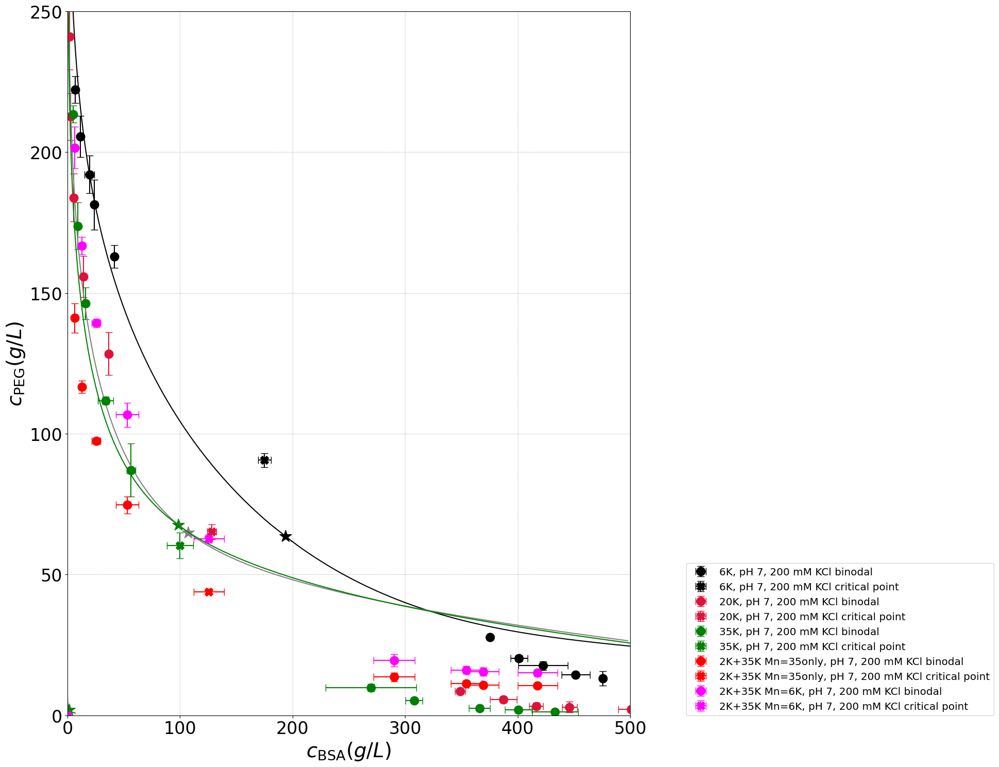

In [ ]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,500)
plt.ylim(0,250)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange')
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black')
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue')

molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson')
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green')

# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mn=6K Mw=6.7K, pH 7, 200 mM KCl', 'magenta')
# molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K Mw=25, pH 7, 200 mM KCl', 'purple')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K Mw=7, pH 7, 200 mM KCl', 'cyan')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K, pH 7, 200 mM KCl', 'cyan')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_8Konly, '2K+8K Mn=8only, pH 7, 200 mM KCl ', 'blue')

# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan', False)
molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl', 'red')
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K, pH 7, 200 mM KCl', 'magenta')

# molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red', False, mbsa=mbsa, mpeg=mpeg4)
molplot(gfvt6K_200mM_Z0_full, f'6K, pH 7, 200 mM KCl, ', 'black', mass=True)

# molplot(gfvt8K_200mM_Z0_full, f'8K, pH 7, 200 mM KCl, ', 'royalblue', mass=True)
# molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa=mbsa, mpeg=mpeg20)
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', 'red', False, mbsa=mbsa, mpeg=mpeg35)
# molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red', False, mbsa=mbsa, mpeg=mpeg100)


# molplot(gfvt6p7K_200mM_Z0, f'6.7K, pH 7, 200 mM KCl, ', 'red', 'red', False, mbsa=mbsa, mpeg=6.7)
# molplot(gfvt7p3K_200mM_Z0_full, f'7.3K, pH 7, 200 mM KCl, ', 'gray', mass=True, mbsa=mbsa, mpeg=7.3)
molplot(gfvt25K_200mM_Z0_full, f'7.3K, pH 7, 200 mM KCl, ', 'gray', mass=True, mbsa=mbsa, mpeg=25)

# molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red', False, mbsa=mbsa, mpeg=mpeg8)
# molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa=mbsa, mpeg=mpeg20)
molplot(gfvt35K_200mM_Z0_full, f'35K, pH 7, 200 mM KCl, ', 'green', mass=True)
# molplot(gfvt25K_200mM_Z0, f'25K, pH 7, 200 mM KCl, ', 'magenta', mass=True)

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_mass_Fig02B.png')
# plt.savefig(date_string+'_phase_diagram_PD_Z0_good_mass_Fig02B.eps')

## Fig. 2C - Rg scaling

Flory Exponent: 0.6379224202053759, Prefactor: 0.009712783237984987
Chi squared (power): 0.0394


[6.2070926920715594, 2.830374908809617, 2.6796779006716087]

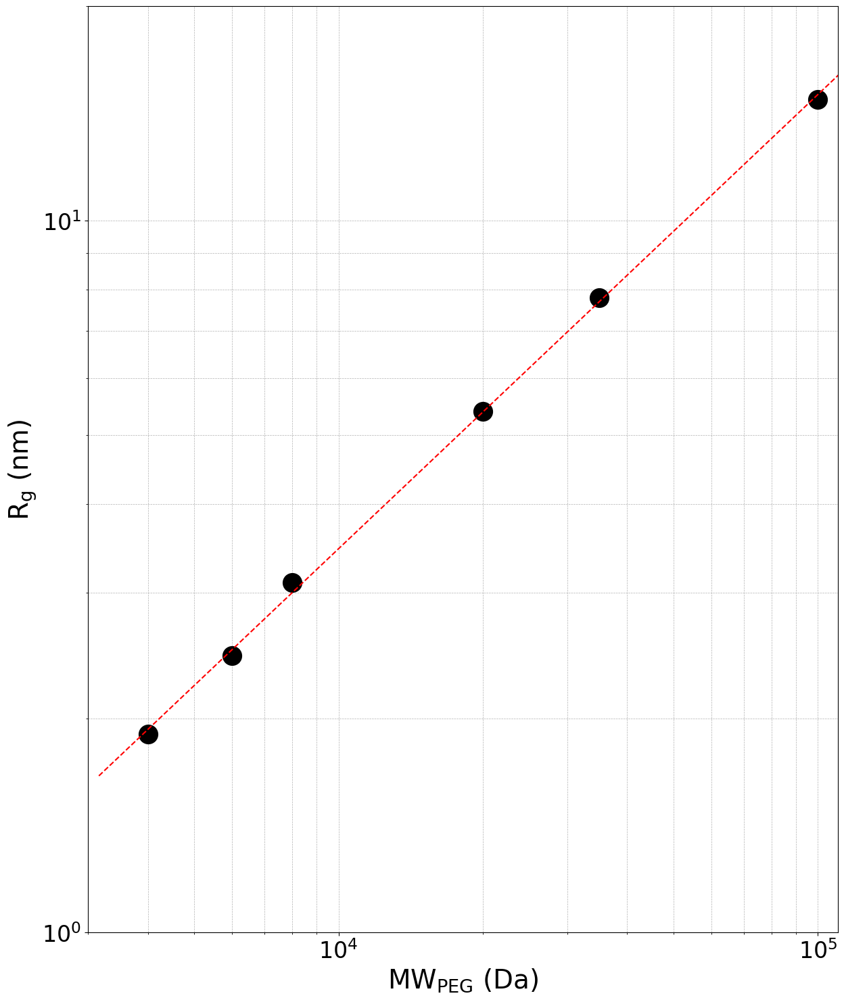

In [ ]:
figh, ax = plt.subplots(1, 1, figsize = (12.75,15))   #width x height, aspect ratio 0.85 (0.87)
# plt.xlim(3000,40000)
plt.xlim(3000,110000)
plt.ylim(1,20)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\mathrm{MW_{PEG}}$ (Da)',fontsize = 28)
plt.ylabel(r'$\mathrm{R_{g}}$ (nm)',fontsize = 28)
plt.tight_layout()

mwlist = [4000, 6000, 8000, 20000, 35000, 100000]
# Rplist = [1.9, 2.45,  3.1, 5.6, 8.4]
Rplist = [1.9, 2.45,  3.1, 5.4, 7.8, 14.8]


mwrange = np.logspace(3.5,110,100)

lgmw = np.asarray([np.log10(mw) for mw in mwlist])

lgRp = np.asarray([np.log10(rgpol) for rgpol in Rplist])

# Perform linear fit
logfit_rg,residuals,_,_,_ = np.polyfit(lgmw, lgRp, 1,full=True)  # Degree 1 polynomial (linear fit)
slope_rg, intercept_rg = logfit_rg
chi_squared = residuals[0]/(len(mwlist)-2)/0.05**2
print(f"Flory Exponent: {slope_rg}, Prefactor: {10**intercept_rg}")
print(f'Chi squared (power): {chi_squared:.4f}')

lgrp_fit =  [10**intercept_rg*x**slope_rg for x in mwrange]
# lgrp_PEG =  [intercept_rg_lin + x*slope_rg_lin for x in mwrange]

plt.loglog(mwlist,Rplist,'ok',markersize=20)
plt.loglog(mwrange, lgrp_fit,'--r')

# ax.xaxis.set_major_locator(mticker.LogLocator(numticks=999))
# ax.xaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
# ax.yaxis.set_major_locator(mticker.LogLocator(numticks=999))
# ax.yaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
ax.grid(True, which='both', ls='--', lw=0.5)

[10**intercept_rg*x**slope_rg for x in [25000, 7300, 6700]]

# plt.savefig(date_string+'_MW_Rg_Z0_good_Fig02C.png')
# plt.savefig(date_string+'_MW_Rg_Z0_good_Fig02C.eps')

# Fig. 3

## mM

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_77741/1056002744.py:55: RuntimeWarning: divide by zero encountered in scalar divide
  ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*q**0.88/(3.95*Phi_pol**1.54)**0.44 for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


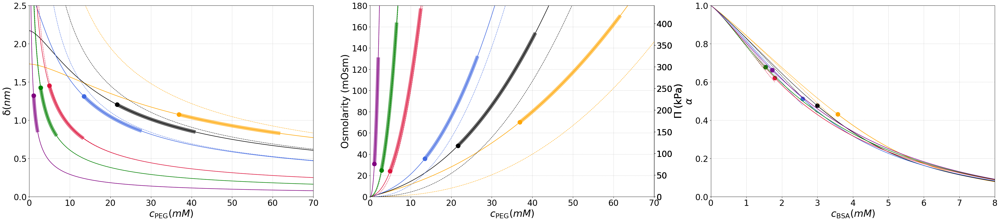

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(50, 10))

axes[0].set_xlim(0,70)
axes[0].set_ylim(0,2.5)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[0].set_ylabel(r'$\mathrm{\delta} (nm)$',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

axes[1].set_xlim(0,70)
axes[1].set_ylim(0,180)
axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[1].set_ylabel("Osmolarity (mOsm)",fontsize = 28)
axes[1].grid(True, which='both', ls='--', lw=0.5)

axes[2].set_xlim(0,8)
axes[2].set_ylim(0,1)
axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[2].set_ylabel(r'$\alpha$',fontsize = 28)
axes[2].grid(True, which='both', ls='--', lw=0.5)

# axes[1][0].set_xlim(0,200)
# axes[1][0].set_ylim(0.1,1e5)
# axes[1][0].tick_params(axis='x', labelsize=24)
# axes[1][0].tick_params(axis='y', labelsize=24)
# axes[1][0].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
# axes[1][0].set_ylabel(r'$\mathrm{\Pi}$',fontsize = 28)
# axes[1][0].grid(True, which='both', ls='--', lw=0.5)
# axes[1][0].set_yscale('log')

def d_Rg(gfvt_out, pcolor, plabel, ax, plim=100):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rp = {rpeg*1e9:.2f} nm'

    q=rpeg/rbsa
    # qq=q**-1.3
    
    # qq=q**-(1/gamma)

    idx = np.abs(np.array(PEG_Sup) - plim).argmin()

    # print(f'Index of PEG concentration closest to {plim:.0f} mM: {idx}, PEG concentration at this index: {phi_R[idx]*phix_peg:.0f} mM and {rbsa*1e9*qx_Sup_p[idx]:.2f} nm')

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(0), 2000, 100000)
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [rbsa*1e9*0.865*q**0.88/(1 + 3.95*Phi_pol**1.54)**0.44 for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*q**0.88/(3.95*Phi_pol**1.54)**0.44 for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.scatter(phi_R[-1]*phix_peg, rbsa*1e9*qx_Drop_p[-1], label='Droplet Total', color=pcolor, s=150)
    ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R[idx:]], [rbsa*1e9*qx for qx in qx_Sup_p[idx:]], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.6)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PEG_Drop], [rbsa*1e9*qx for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=5)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PEG_Sup], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=5)


def pi_scale(gfvt_out, pcolor, plabel, ax, plim=100):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;
    # gamma = 0.698
    gamma = 0.77

    idx = np.abs(np.array(PEG_Sup) - plim).argmin()

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(phi_R[0]/3), 2000, 100000)
    pinu = [q**-3*(y + 1.62*y**(3*gamma)) for y in PhiR]

    Rb = 8.314
    T = 273.15 + TC # temperature
    rt = Rb*T

    def inverse(x):
        Rb = 8.314
        # TC = 22
        T = 273.15 + TC # temperature
        return 1000*x/Rb/T
    
    def forward(x):
        Rb = 8.314
        # TC = 22
        T = 273.15 + TC # temperature
        return x*Rb*T/1000
    
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [phix_peg*(y + 1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR[:idx]], [phix_peg*(y + 1.62*y**(3*gamma)) for y in PhiR[:idx]], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [phix_peg*(1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [phix_peg*(1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R[idx:]], [phix_peg*(y + 1.62*y**(3*gamma)) for y in phi_R[idx:]], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.6)
    ax.scatter(phi_R[-1]*phix_peg, phix_peg*(phi_R[-1] + 1.62*phi_R[-1]**(3*gamma)), color=pcolor, s=150, marker='o')
    # ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*(q/(3.95*Phi_pol**1.54)**(1/2))**(0.88) for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    secay = ax.secondary_yaxis('right', functions=(forward, inverse))
    secay.set_ylabel(r'$\Pi$ (kPa)', fontsize=28)
    secay.tick_params(axis='y', labelsize=24)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    
def a_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;
    Phi_BSA_range = np.linspace(0, 0.6, 1000)
    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]
    # plt.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    ax.scatter(BSA_Drop[-1], a_Drop[-1], color=pcolor, s=150, marker='o')
    ax.plot([phi for phi in BSA_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor)
    ax.plot([phi for phi in BSA_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=1)
    ax.plot(BSA_Sup, [1-phi*(1+qx)**3 for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')
    # ax.plot([phi*phix_bsa for phi in Phi_BSA_range], [1-phi*(1+q)**3 for phi in Phi_BSA_range], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')
    # ax.plot([phi for phi in BSA_Drop], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Drop_p, Phi_BSA_Drop)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')
    # ax.plot([phi for phi in BSA_Sup], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')

def a_plot_peg(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]
    # plt.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    ax.scatter(PEG_Drop[-1], a_Drop[-1], color=pcolor ,s=150, marker='o')
    ax.plot([phi for phi in PEG_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor)
    ax.plot([phi for phi in PEG_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=1)
    # ax.plot([phi for phi in BSA_Drop], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Drop_p, Phi_BSA_Drop)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')
    # ax.plot([phi for phi in BSA_Sup], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')


d_Rg(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[0], plim=60)
d_Rg(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[0], plim=40)
d_Rg(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[0], plim=27)
d_Rg(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[0], plim=13)
d_Rg(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[0], plim=6.5)
d_Rg(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[0], plim=2)
# d_Rg(gfvtQ10_200mM_Z0_full, 'magenta', 'Q10', axes[0])
# d_Rg(gfvtQ16_200mM_Z0_full, 'cyan', 'Q15', axes[0])

pi_scale(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[1], plim=60)
pi_scale(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[1], plim=40)
pi_scale(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[1], plim=26)
pi_scale(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[1], plim=12.4)
pi_scale(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[1], plim=6.5)
pi_scale(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[1], plim=2)
# pi_scale(gfvtQ10_200mM_Z0_full, 'magenta', 'Q10', axes[1])
# pi_scale(gfvtQ16_200mM_Z0_full, 'cyan', 'Q15', axes[1])

a_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[2])
a_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[2])
a_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[2])
a_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[2])
a_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[2])
a_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[2])
# a_plot(gfvtQ10_200mM_Z0_full, 'magenta', 'Q10', axes[2])
# a_plot(gfvtQ16_200mM_Z0_full, 'cyan', 'Q15', axes[2])

# a_plot_peg(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[0][2])
# a_plot_peg(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[0][2])
# a_plot_peg(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[0][2])
# a_plot_peg(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[0][2])
# a_plot_peg(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[0][2])
# a_plot_peg(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[0][2])
# a_plot_peg(gfvtQ10_200mM_Z0_full, 'magenta', 'Q10', axes[0][2])
# a_plot_peg(gfvtQ16_200mM_Z0_full, 'cyan', 'Q15', axes[0][2])

plt.savefig(date_string+'_d_Pi_a.png')
plt.savefig(date_string+'_d_Pi_a.eps')

## g/L

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


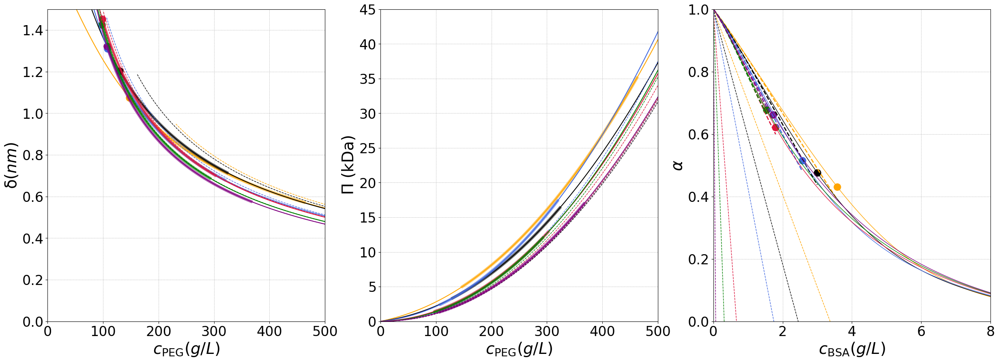

In [ ]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)

fig, axes = plt.subplots(1, 3, figsize=(30, 10))

axes[0].set_xlim(0,500)
axes[0].set_ylim(0,1.5)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[0].set_ylabel(r'$\mathrm{\delta} (nm)$',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

axes[1].set_xlim(0,500)
axes[1].set_ylim(0,45)
axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_xlabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[1].set_ylabel(r'$\Pi$ (kDa)',fontsize = 28)
axes[1].grid(True, which='both', ls='--', lw=0.5)

axes[2].set_xlim(0,8)
axes[2].set_ylim(0,1)
axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
axes[2].set_ylabel(r'$\alpha$',fontsize = 28)
axes[2].grid(True, which='both', ls='--', lw=0.5)

def d_Rg(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rp = {rpeg*1e9:.2f} nm'

    q=rpeg/rbsa

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(phi_R[0]/3), 2000, 100000)
    
    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in PhiR], [rbsa*1e9*0.865*q**0.88/(1 + 3.95*Phi_pol**1.54)**0.44 for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*q**0.88/(3.95*Phi_pol**1.54)**0.44 for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.scatter(phi_R[-1]*phix_peg*mpeg_in, rbsa*1e9*qx_Drop_p[-1], label='Droplet Total', color=pcolor, s=150)
    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=5, alpha=0.6)


def pi_scale(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;
    gamma = 0.698

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(phi_R[0]/3), 2000, 100000)
    pinu = [q**-3*(y + 1.62*y**(3*gamma)) for y in PhiR]

    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in PhiR], [q**-3*(y + 1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in PhiR], [q**-3*(1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in phi_R], [q**-3*(y + 1.62*y**(3*gamma)) for y in phi_R], label='Droplet Total', color=pcolor, linewidth=5, alpha=0.6)


def a_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    Phi_BSA_range = np.linspace(0, 0.6, 1000)
    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]

    ax.scatter(BSA_Drop[-1], a_Drop[-1], color=pcolor, s=150, marker='o')
    ax.plot([phi for phi in BSA_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor, linewidth=1)
    ax.plot([phi for phi in BSA_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=1)
    ax.plot(BSA_Sup, [1-phi*(1+qx)**3 for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=2, linestyle='--')
    ax.plot([phi*phix_bsa for phi in Phi_BSA_range], [1-phi*(1+q)**3 for phi in Phi_BSA_range], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')


d_Rg(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[0])
d_Rg(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[0])
d_Rg(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[0])
d_Rg(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[0])
d_Rg(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[0])
d_Rg(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[0])

pi_scale(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[1])
pi_scale(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[1])
pi_scale(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[1])
pi_scale(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[1])
pi_scale(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[1])
pi_scale(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[1])

a_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[2])
a_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[2])
a_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[2])
a_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[2])
a_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[2])
a_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[2])

plt.savefig(date_string+'_d_Pi_a_mass.png')
plt.savefig(date_string+'_d_Pi_a_mass.eps')

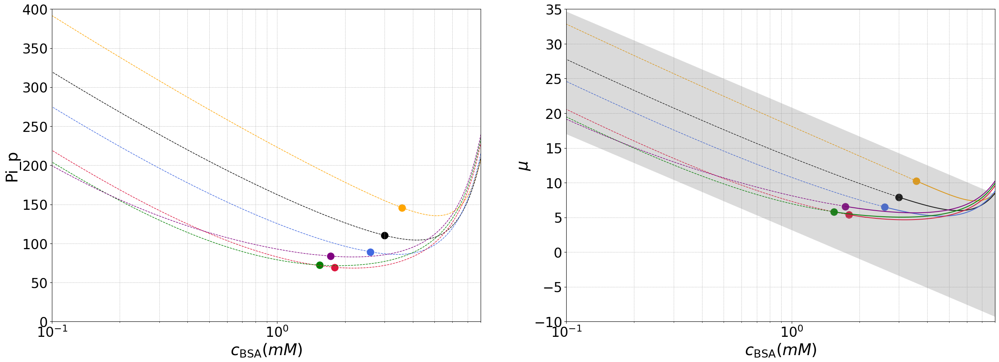

In [214]:
def g_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    Rb = 8.314
    T = 273.15 + TC # temperature
    rt = Rb*T

    gamma=0.77
    
    ax.semilogx(BSA_Drop, [phix_peg*(y + 1.62*y**(3*gamma))*g for y,g in zip(phi_R,g_Drop)], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.semilogx(BSA_Sup, [phix_peg*(y + 1.62*y**(3*gamma))*g for y,g in zip(phi_R,g_Sup)], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.scatter(BSA_Drop[-1], phix_peg*(phi_R[-1] + 1.62*phi_R[-1]**(3*gamma))*g_Drop[-1], color=pcolor, s=150, marker='o')
    # ax.semilogx(BSA_Sup, [phix_peg*(1.62*y**(3*gamma)) for y in phi_R], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)

    # ax.scatter(BSA_Drop[-1], Pp_Drop[-1], color=pcolor, s=150, marker='o')

    # ax.semilogx(BSA_Drop, [p for g,p in zip(g_Drop, Pp_Drop)], label='Droplet Total', color=pcolor, linewidth=2)
    # ax.semilogx(BSA_Sup, [p for g,p in zip(g_Sup, Pp_Sup)], label='Droplet Total', color=pcolor, linewidth=2)

    # ax.semilogx(BSA_Drop, [g*p for g,p in zip(g_Drop, Pp_Drop)], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')
    # ax.semilogx(BSA_Sup, [g*p for g,p in zip(g_Sup, Pp_Sup)], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')

def h_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    ax.scatter(BSA_Drop[-1], h_Drop[-1], color=pcolor, s=150, marker='o')
    ax.plot(BSA_Drop, h_Drop, label='Droplet Total', color=pcolor)
    ax.plot(BSA_Sup, h_Sup, label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')

def mu_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    mu_dat_Drop = [mu - mu0 for mu, mu0 in zip(Mu_Drop, Mu0_Drop)]
    mu_dat_Sup = [mu - mu0 for mu, mu0 in zip(Mu_Sup, Mu0_Sup)]

    tmpx = np.linspace(1e-3, 10, 1000)
    tmpy = [12-6*np.log(tmp) for tmp in tmpx]

    ax.scatter(BSA_Drop[-1], mu_dat_Drop[-1], color=pcolor, s=150, marker='o')
    ax.semilogx(BSA_Drop, mu_dat_Drop, label='Droplet Total', color=pcolor)
    ax.semilogx(BSA_Sup, mu_dat_Sup, label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')
    ax.semilogx(tmpx, tmpy, label='Droplet Total', color='gray',linewidth=200, alpha=0.05)
    # ax.plot(BSA_Sup, [1-phi*(1+qx)**3 for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')

fig, axes = plt.subplots(1, 2, figsize=(30, 10))

axes[0].set_xlim(0.1,8)
axes[0].set_ylim(0,400)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[0].set_ylabel(r'Pi_p',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

axes[1].set_xlim(0.1,8)
axes[1].set_ylim(-10,35)
axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[1].set_ylabel(r'$\mu$',fontsize = 28)
axes[1].grid(True, which='both', ls='--', lw=0.5)

# h_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[0])
# h_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[0])
# h_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[0])
# h_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[0])
# h_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[0])
# h_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[0])

g_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[0])
g_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[0])
g_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[0])
g_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[0])
g_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[0])
g_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[0])

mu_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', axes[1])
mu_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', axes[1])
mu_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', axes[1])
mu_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', axes[1])
mu_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', axes[1])
mu_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', axes[1])

# Fig. 4

<>:3: SyntaxWarning: invalid escape sequence '\P'
<>:3: SyntaxWarning: invalid escape sequence '\P'
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_77741/3846766085.py:3: SyntaxWarning: invalid escape sequence '\P'
  axes[0][0].set_title("$\Pi$ (mOsm/L)")
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


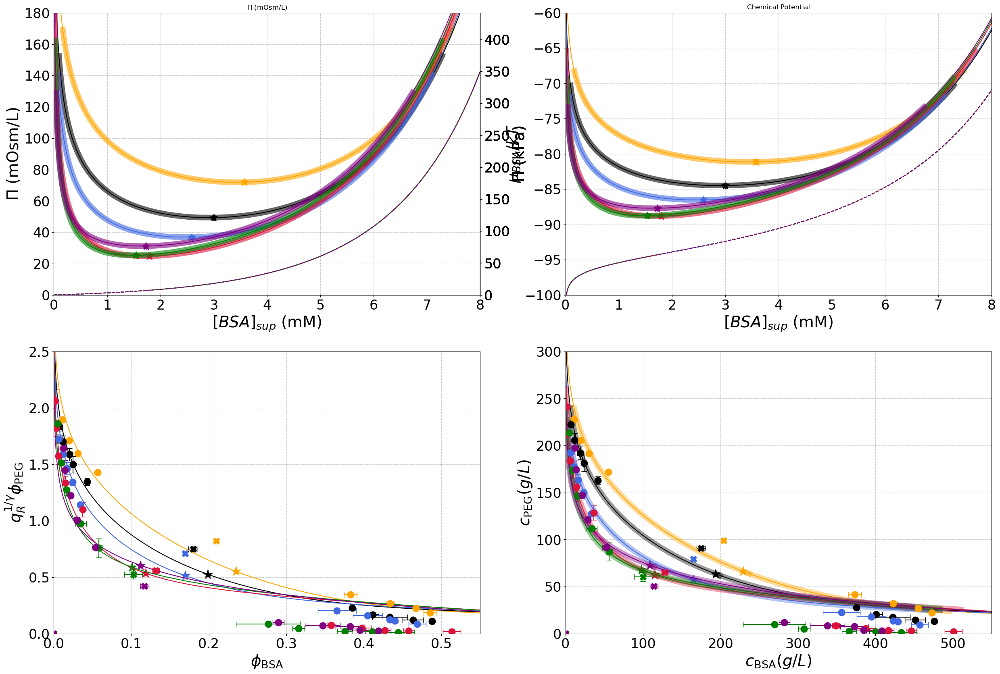

In [276]:
fig, axes = plt.subplots(2,2, figsize=(30, 20))

axes[0][0].set_title("$\Pi$ (mOsm/L)")
axes[0][0].set_xlim(0,8)
axes[0][0].set_ylim(0,180)
axes[0][0].tick_params(axis='x', labelsize=24)
axes[0][0].tick_params(axis='y', labelsize=24)
axes[0][0].set_xlabel(r'$[BSA]_{sup}$ (mM)',fontsize = 28)
axes[0][0].set_ylabel(r'$\Pi$ (mOsm/L)',fontsize = 28)
axes[0][0].grid(True, which='both', ls='--', lw=0.5)

axes[0][1].set_title("Chemical Potential")
axes[0][1].set_xlabel(r'$[BSA]_{sup}$ (mM)',fontsize = 28)
axes[0][1].set_ylabel(r'$\mu_{BSA}/kT$',fontsize = 28)
axes[0][1].set_xlim(0,8)
axes[0][1].set_ylim(-100,-60)
axes[0][1].tick_params(axis='x', labelsize=24)
axes[0][1].tick_params(axis='y', labelsize=24)
# axes[0][1].axhline(0, color='black', linestyle='--', linewidth=1)
# axes[0][1].set_xscale('log')
# axes[0][1].legend(fontsize = 14)
axes[0][1].grid(True, which='both', ls='--', lw=0.5)

axes[1][0].set_xlim(0,0.55)
axes[1][0].set_ylim(0,2.5)
axes[1][0].tick_params(axis='x', labelsize=24)
axes[1][0].tick_params(axis='y', labelsize=24)
axes[1][0].set_xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
axes[1][0].set_ylabel(r'$q_R^{1/\gamma}\phi_\mathrm{PEG}$',fontsize = 28)
axes[1][0].grid(True, which='both', ls='--', lw=0.5)

# axes[1][0].set_xlim(0,0.45)
# axes[1][0].set_ylim(0,2.1)
# axes[1][0].tick_params(axis='x', labelsize=24)
# axes[1][0].tick_params(axis='y', labelsize=24)
# axes[1][0].set_xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
# axes[1][0].set_ylabel(r'$q_R^{1/\gamma}\phi_\mathrm{PEG}$',fontsize = 28)
# axes[1][0].grid(True, which='both', ls='--', lw=0.5)


plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$q_R^{-1/\gamma}\phi^R_\mathrm{PEG}$',fontsize = 28)
# plt.tight_layout()

axes[1][1].set_xlim(0,550)
axes[1][1].set_ylim(0,300)
axes[1][1].tick_params(axis='x', labelsize=24)
axes[1][1].tick_params(axis='y', labelsize=24)
axes[1][1].set_xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
axes[1][1].set_ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[1][1].grid(True, which='both', ls='--', lw=0.5)

def Pitot_plot(gfvt_out, pcolor, plabel, ax=None, plim=500):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    idx = np.abs(np.array(PEG_Sup) - plim).argmin()

    Rb = 8.314
    T = 273.15 + TC # temperature
    RT = Rb*T

    def inverse(x):
        Rb = 8.314
        # TC = 22
        T = 273.15 + TC # temperature
        return 1000*x/Rb/T
    
    def forward(x):
        Rb = 8.314
        # TC = 22
        T = 273.15 + TC # temperature
        return x*Rb*T/1000

    gamma = 0

    q=Rpol_in/Rpr_in
    # qq=q**-1/gamma
    qq=1

    ax.plot(BSA_Drop, Pi_Drop/RT, label='Droplet Total', color=pcolor)
    ax.plot(BSA_Drop[idx:], Pi_Drop[idx:]/RT, label='Droplet Total', color=pcolor, linewidth=10, alpha=0.6)
    ax.scatter(BSA_Drop[-1], Pi_Drop[-1]/RT, color=pcolor, marker='*', s=200)
    # ax.plot(BSA_Drop, (Pi_Drop-P0_Drop)/RT, label='Polymer', linestyle='--', color=pcolor)
    ax.plot(BSA_Drop, P0_Drop/RT, label='Droplet HS', linestyle='--', color=pcolor)

    ax.plot(BSA_Sup, Pi_Sup/RT, label='Supernatant Total', color=pcolor)
    # ax.plot(BSA_Sup, (Pi_Sup-P0_Sup)/RT, label='Polymer', linestyle='--', color=pcolor)
    ax.plot(BSA_Sup, P0_Sup/RT, label='Sup HS', linestyle='--', color=pcolor)
    ax.plot(BSA_Sup[idx:], Pi_Sup[idx:]/RT, label='Supernatant Total', color=pcolor, linewidth=10, alpha=0.6)

    secay = ax.secondary_yaxis('right', functions=(forward, inverse))
    secay.set_ylabel(r'$\Pi$ (kPa)', fontsize=28)
    secay.tick_params(axis='y', labelsize=24)

def mu_plot(gfvt_out, pcolor, plabel, ax=None, plim=500):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, g_Drop, g_Sup, h_Drop, h_Sup, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    idx = np.abs(np.array(PEG_Sup) - plim).argmin()

    gamma = 0

    q=Rpol_in/Rpr_in
    # qq=q**-1/gamma
    qq=1

    ax.plot(BSA_Sup, Mu_Sup, label='Mu Total Supernatant', color=pcolor)
    ax.plot(BSA_Drop, Mu_Drop, label='Mu Total Drop', color=pcolor)
    ax.plot(BSA_Sup[idx:], Mu_Sup[idx:], label='Mu Total Supernatant', color=pcolor, linewidth=10, alpha=0.6)
    ax.plot(BSA_Drop[idx:], Mu_Drop[idx:], label='Mu Total Drop', color=pcolor, linewidth=10, alpha=0.6)
    ax.scatter(BSA_Sup[-1], Mu_Sup[-1], color=pcolor, marker='*', s=200)

    # ax.plot(BSA_Sup, [np.exp(-(c/phix_bsa/(1-c/phix_bsa))*(1+q)**3) for c in BSA_Sup], label='Mu Total Supernatant', color=pcolor, linestyle='-.')
    # ax.plot(BSA_Drop, [np.exp(-(c/phix_bsa/(1-c/phix_bsa))*(1+q)**3) for c in BSA_Drop], label='Mu Total Drop', color=pcolor, linestyle='-.')
    
    # ax.plot(BSA_Sup, MuR_Sup, label='Mu Depletion Supernatant', color=pcolor, linestyle='--')
    # ax.plot(BSA_Drop, MuR_Drop, label='Mu Depletion Drop', color=pcolor, linestyle='--')
    
    ax.plot(BSA_Sup, Mu0_Sup, label='Mu HS Supernatant', color=pcolor, linestyle='--')
    ax.plot(BSA_Drop, Mu0_Drop, label='Mu HS Drop', color=pcolor, linestyle='--')


Pitot_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', ax=axes[0][0], plim=60)
Pitot_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', ax=axes[0][0], plim=40)
Pitot_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', ax=axes[0][0], plim=27)
Pitot_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', ax=axes[0][0], plim=13)
Pitot_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', ax=axes[0][0], plim=6.5)
Pitot_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', ax=axes[0][0], plim=2)
# Pitot_plot(gfvtQ10_200mM_Z0_full, 'gray', 'Q10', ax=axes[0][0])
# Pitot_plot(gfvtQ16_200mM_Z0_full, 'black', 'Q16', ax=axes[0][0])

mu_plot(gfvt4K_200mM_Z0_full, 'orange', 'PEG 4K', ax=axes[0][1], plim=60)
mu_plot(gfvt6K_200mM_Z0_full, 'black', 'PEG 6K', ax=axes[0][1], plim=40)
mu_plot(gfvt8K_200mM_Z0_full, 'royalblue', 'PEG 8K', ax=axes[0][1], plim=27)
mu_plot(gfvt20K_200mM_Z0_full, 'crimson', 'PEG 20K', ax=axes[0][1], plim=13)
mu_plot(gfvt35K_200mM_Z0_full, 'green', 'PEG 35K', ax=axes[0][1], plim=6.5)
mu_plot(gfvt100K_200mM_Z0_full, 'purple', 'PEG 100K', ax=axes[0][1], plim=2)
# mu_plot(gfvtQ10_200mM_Z0_full, 'gray', 'Q10', ax=axes[0][1])
# mu_plot(gfvtQ16_200mM_Z0_full, 'black', 'Q16', ax=axes[0][1])

molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa=mbsa, mpeg=mpeg4, ax=axes[1][0])
molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa=mbsa, mpeg=mpeg6, ax=axes[1][0])
molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa=mbsa, mpeg=mpeg8, ax=axes[1][0])
molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa=mbsa, mpeg=mpeg20, ax=axes[1][0])
molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa=mbsa, mpeg=mpeg35, ax=axes[1][0])
molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa=mbsa, mpeg=mpeg100, ax=axes[1][0])
molplot_phi(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', ax=axes[1][0])
molplot_phi(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', ax=axes[1][0])
molplot_phi(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', ax=axes[1][0])
molplot_phi(gfvt20K_200mM_Z0_full, '20K, pH 7, 200 mM KCl, ', 'crimson', ax=axes[1][0])
molplot_phi(gfvt35K_200mM_Z0_full, '35K, pH 7, 200 mM KCl, ', 'green', ax=axes[1][0])
molplot_phi(gfvt100K_200mM_Z0_full, '100K, pH 7, 200 mM KCl, ', 'purple', ax=axes[1][0])
# molplot_phi(gfvtQ8_200mM_Z0, 'Q=8, pH 7, 200 mM KCl, ', 'orange', ax=axes[1][0])
# molplot_phi(gfvtQ10_200mM_Z0, 'Q=10, pH 7, 200 mM KCl, ', 'royalblue', ax=axes[1][0])
# molplot_phi(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'magenta', ax=axes[1][0])
# molplot_phi(gfvtQ16_GFP, 'GFP, ', 'cyan', crit_color='black')

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', ax=axes[1][1])
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', ax=axes[1][1])
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', ax=axes[1][1])
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', ax=axes[1][1])
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', ax=axes[1][1])
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', ax=axes[1][1])

molplot(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', mbsa=mbsa, mpeg=mpeg4, ax=axes[1][1], mass=True, plim=60)
molplot(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', mbsa=mbsa, mpeg=mpeg6, ax=axes[1][1], mass=True, plim=40)
molplot(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', mbsa=mbsa, mpeg=mpeg8, ax=axes[1][1], mass=True, plim=27)
molplot(gfvt20K_200mM_Z0_full, '20K, pH 7, 200 mM KCl, ', 'crimson', mbsa=mbsa, mpeg=mpeg20, ax=axes[1][1], mass=True, plim=13)
molplot(gfvt35K_200mM_Z0_full, '35K, pH 7, 200 mM KCl, ', 'green', mbsa=mbsa, mpeg=mpeg35, ax=axes[1][1], mass=True, plim=6.5)
molplot(gfvt100K_200mM_Z0_full, '100K, pH 7, 200 mM KCl, ', 'purple', mbsa=mbsa, mpeg=mpeg100, ax=axes[1][1], mass=True, plim=2)
# molplot(gfvtQ8_200mM_Z0, 'Q=8, pH 7, 200 mM KCl, ', 'orange', mbsa=mbsa, mpeg=mpegQ8, ax=axes[1][1], mass=True)
# molplot(gfvtQ10_200mM_Z0, 'Q=10, pH 7, 200 mM KCl, ', 'royalblue', mbsa=mbsa, mpeg=mpegQ10, ax=axes[1][1], mass=True)
# molplot(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'magenta', mbsa=mbsa, mpeg=mpegQ16, ax=axes[1][1], mass=True)

# plt.yscale('log')

plt.savefig(date_string+'_Y_good_mOsmM_Fig04.png')
plt.savefig(date_string+'_Y_good_mOsM_Fig04.eps')

# Fig. 5

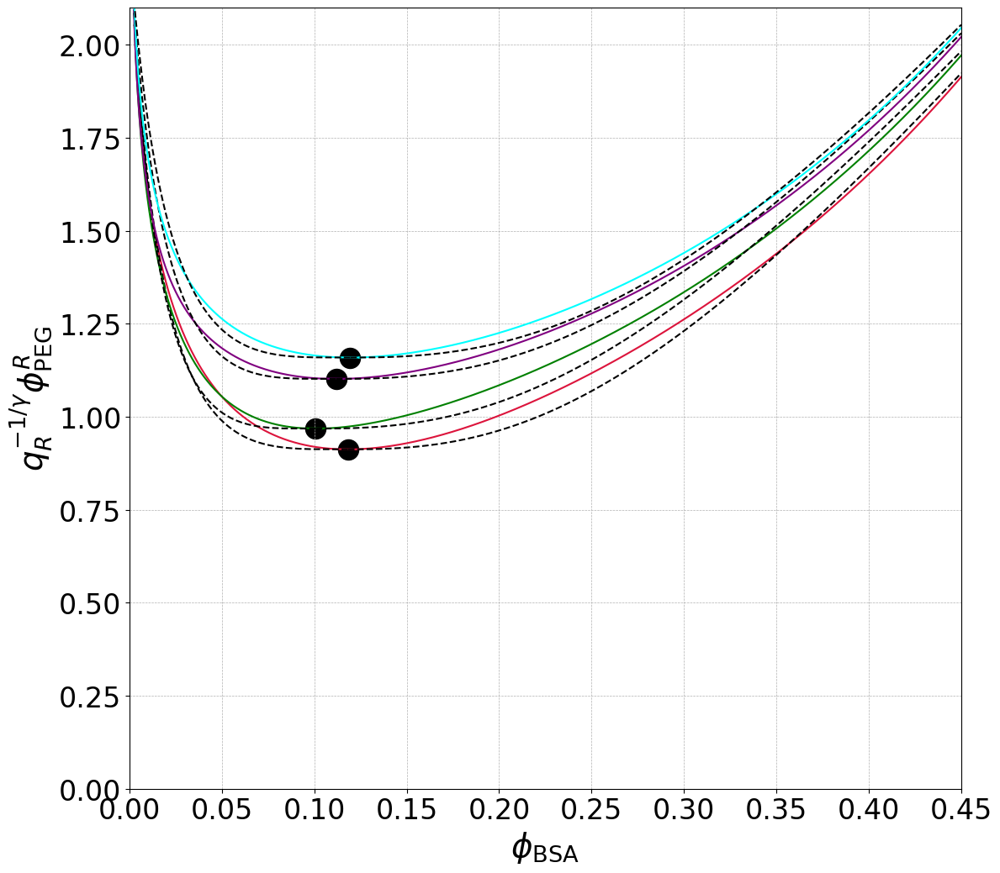

In [ ]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
fig, axes = plt.subplots(2,2, figsize=(30, 20))
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,0.45)
plt.ylim(0,2.1)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$q_R^{-1/\gamma}\phi^R_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa, mpeg4,False)
# molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa, mpeg6, False)
# molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa, mpeg8, False)
# molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa, mpeg20, False)
# molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa, mpeg35, False)
# molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa, mpeg100, False)

# molplot_phiR(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', crit_color='red')
# molplot_phiR(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', crit_color='red')
# molplot_phiR(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', crit_color='red')
molplot_phiR(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='black')
molplot_phiR(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green', crit_color='black')
molplot_phiR(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple', crit_color='black')
# molplot_phiR(gfvtQ8_200mM_Z0_full, 'Q=8, pH 7, 200 mM KCl, ', 'red', crit_color='black')
# molplot_phiR(gfvtQ10_200mM_Z0_full, 'Q=10, pH 7, 200 mM KCl, ', 'magenta', crit_color='black')
molplot_phiR(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'cyan', crit_color='black')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

# GFP

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


q = 3.71, Rbsa = 2.10 nm, Rp = 7.80 nm
BSA_crit = 0.1052, PEG_crit = 5.8172
[BSA]_crit = 4.50 mM, [PEG]_crit = 3.36 mM

BSA_tp_G = 0.0024, BSA_tp_L = 0.4631, BSA_tp_S = 0.5668, PEG_tp = 11.4367
[BSA]_tp_G = 0.10 mM, [BSA]_tp_L = 19.83 mM, [BSA]_tp_S = 24.26 mM, [PEG]_tp_G = 9.51 mM, [PEG]_tp_L = 1.33 mM, [PEG]_tp_S = 0.38 mM



Calculating Binodal: 100%|██████████| 50/50 [00:07<00:00,  6.86step/s]


q = 2.44, Rbsa = 3.20 nm, Rp = 7.80 nm
BSA_crit = 0.1025, PEG_crit = 3.0314
[BSA]_crit = 1.24 mM, [PEG]_crit = 1.73 mM

BSA_tp_G = 0.0027, BSA_tp_L = 0.4642, BSA_tp_S = 0.5660, PEG_tp = 6.5092
[BSA]_tp_G = 0.03 mM, [BSA]_tp_L = 5.62 mM, [BSA]_tp_S = 6.85 mM, [PEG]_tp_G = 5.41 mM, [PEG]_tp_L = 0.74 mM, [PEG]_tp_S = 0.21 mM



Calculating Binodal: 100%|██████████| 50/50 [00:04<00:00, 12.12step/s]


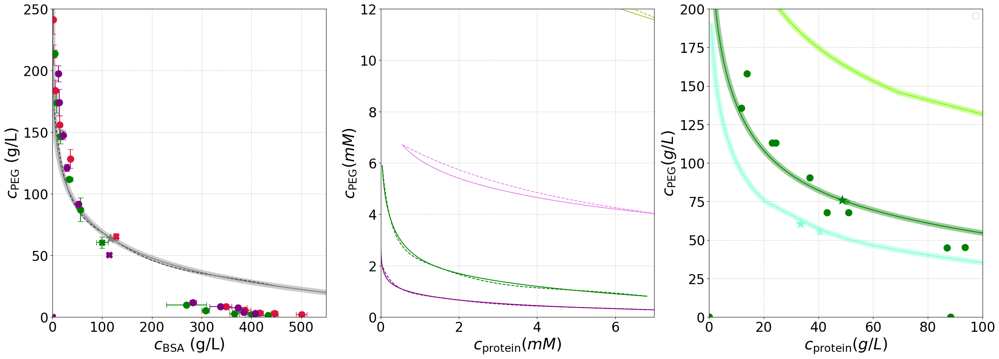

In [55]:
fig, axes = plt.subplots(1,3, figsize=(30, 10))

axes[0].set_xlim(0,550)
axes[0].set_ylim(0,250)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{BSA}$ (g/L)',fontsize = 28)
axes[0].set_ylabel(r'$c_\mathrm{PEG}$ (g/L)',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

axes[1].set_xlim(0,7)
axes[1].set_ylim(0,12)
axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_xlabel(r'$c_\mathrm{protein} (mM)$',fontsize = 28)
axes[1].set_ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[1].grid(True, which='both', ls='--', lw=0.5)

axes[2].set_xlim(0,100)
axes[2].set_ylim(0,200)
axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_xlabel(r'$c_\mathrm{protein} (g/L)$',fontsize = 28)
axes[2].set_ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[2].grid(True, which='both', ls='--', lw=0.5)
axes[2].legend(fontsize=14)

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K', 'orange', ax=axes[0])
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K', 'black', ax=axes[0])
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K', 'royalblue', ax=axes[0])
molplot_dat_err_csv(data_20K_pH7_200mM, '20K', 'crimson', ax=axes[0])
molplot_dat_err_csv(data_35K_pH7_200mM, '35K', 'green', ax=axes[0])
molplot_dat_err_csv(data_100K_pH7_200mM, '100K', 'purple', ax=axes[0])
# molplot_analytical(gfvt4K_200mM_Z0_full, '4K', 'orange', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt6K_200mM_Z0_full, '6K', 'black', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt8K_200mM_Z0_full, '8K', 'royalblue', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt20K_200mM_Z0_full, '20K', 'crimson', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt35K_200mM_Z0_full, '35K', 'green', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt100K_200mM_Z0_full, '100K', 'purple', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvtQ8_200mM_Z0_full, 'Q=8, ', 'red', ax=axes[0], crit_color='black', mass=True)
# molplot_analytical(gfvtQ10_200mM_Z0_full, 'Q=10, ', 'magenta', ax=axes[0], crit_color='black', mass=True)
molplot_analytical(gfvtQ16_200mM_Z0_full, 'Q=16, ', 'cyan', ax=axes[0], crit_color='black', mass=True)
molplot(gfvtQ16_200mM_Z0_full, 'Q=16, ', 'gray', ax=axes[0], crit_color='black', mass=True)


N_steps = 2000 # number of points between PhiP_max and PhiP_min 
solvent = 'good'
guess_c = [0.24, 0.7];
rgfp = 1.2e-9
mgfp=27

rPEG_GFP_4K = rpeg4K/rbsa*rgfp
mpeg_GFP_4K = (rPEG_GFP_4K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_6K = rpeg6K/rbsa*rgfp
mpeg_GFP_6K = (rPEG_GFP_6K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_8K = rpeg8K/rbsa*rgfp
mpeg_GFP_8K = (rPEG_GFP_8K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_20K = rpeg20K/rbsa*rgfp
mpeg_GFP_20K = (rPEG_GFP_20K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_35K = rpeg35K/rbsa*rgfp
mpeg_GFP_35K = (rPEG_GFP_35K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_100K = rpeg100K/rbsa*rgfp
mpeg_GFP_100K = (rPEG_GFP_100K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q8 = 8*rgfp
mpeg_GFP_Q8 = (rPEG_GFP_Q8/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q10 = 10*rgfp
mpeg_GFP_Q10 = (rPEG_GFP_Q10/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q16 = 16*rgfp
mpeg_GFP_Q16 = (rPEG_GFP_Q16/14.8e-9)**(1/0.6379)*mpeg100

# gfvt4K_GFP = GFVT(rgfp, rPEG_GFP_4K, mgfp, mpeg_GFP_4K, solvent, N_steps, guess_c)
# gfvt4K_GFP_real = GFVT(rgfp, rpeg4K, mgfp, mpeg4, solvent, N_steps, guess_c)
# gfvt6K_GFP = GFVT(rgfp, rPEG_GFP_6K, mgfp, mpeg_GFP_6K, solvent, N_steps, guess_c)
# gfvt6K_GFP_real = GFVT(rgfp, rpeg6K, mgfp, mpeg6, solvent, N_steps, guess_c)
# gfvt8K_GFP = GFVT(rgfp, rPEG_GFP_8K, mgfp, mpeg_GFP_8K, solvent, N_steps, guess_c)
# gfvt8K_GFP_real = GFVT(rgfp, rpeg8K, mgfp, mpeg8, solvent, N_steps, guess_c)

# gfvt20K_GFP_real = GFVT(rgfp, rpeg20K, mgfp, mpeg20, solvent, N_steps, guess_c)

# gfvt35K_GFP_real = GFVT(rgfp, rpeg35K, mgfp, mpeg35, solvent, N_steps, guess_c)

# gfvt100K_GFP_real = GFVT(rgfp, rpeg100K, mgfp, mpeg100, solvent, N_steps, guess_c, critical=True)
# gfvtQ8_GFP = GFVT(rgfp, rPEG_GFP_Q8, mgfp, mpeg_GFP_Q8, solvent, N_steps, guess_c)
# gfvtQ10_GFP = GFVT(rgfp, rPEG_GFP_Q10, mgfp, mpeg_GFP_Q10, solvent, N_steps, guess_c)
# guess_c = [0.1, 50]

# gfvt20K_GFP = GFVT(2.8e-9, rpeg20K, mgfp, mpeg20, solvent, N_steps, guess_c)
# gfvt35K_GFP = GFVT(2.8e-9, rpeg35K, mgfp, mpeg35, solvent, N_steps, guess_c)
# gfvt100K_GFP = GFVT(2.8e-9, rpeg100K, mgfp, mpeg100, solvent, N_steps, guess_c, critical=True)
# gfvtQ16_GFP = GFVT(2.8e-9, 25e-9, rpegQ16, mpegQ16, solvent, N_steps, guess_c)

gfvt35K_GFP_s = GFVT(2.1e-9, rpeg35K, mgfp, mpeg35, solvent, 50, guess_c)
gfvt35K_GFP_s2 = GFVT(3.2e-9, rpeg35K, mgfp, mpeg35, solvent, 50, guess_c)
# gfvtQ16_GFP_s = GFVT(2.8e-9, rpeg35K, mgfp, mpeg35, solvent, 50, guess_c)
# gfvtQ16_GFP_s2 = GFVT(2.8e-9, rpeg100K, mgfp, mpeg100, solvent, 50, guess_c)


# molplot_analytical(gfvt4K_200mM_Z0_full, 'BSA, 4K, ', 'orange', crit_color='black', ax=axes[1])
molplot_analytical(gfvt35K_200mM_Z0, 'BSA, 35K, ', 'green', crit_color='green', ax=axes[1])
molplot_analytical(gfvt100K_200mM_Z0_full, 'BSA, 100K, ', 'purple', crit_color='purple', ax=axes[1])
# molplot_analytical(gfvtQ8_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1]))
# molplot_analytical(gfvtQ16_200mM_Z0, 'BSA, ', 'blue', crit_color='blue', ax=axes[1])

# molplot_analytical(gfvt4K_GFP, 'GFP, 4K, ', 'red', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt4K_GFP_real, 'GFP, 4K real, ', 'red', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt6K_GFP, 'GFP, 6K, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt6K_GFP_real, 'GFP, 6K real, ', 'gray', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt8K_GFP, 'GFP, 8K, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt8K_GFP_real, 'GFP, 8K real, ', 'dodgerblue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt20K_GFP, 'GFP, 20K, ', 'hotpink', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt35K_GFP, 'GFP, 35K, ', 'lime', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, ', 'lawngreen', crit_color='lawngreen', ax=axes[1])
molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, 1.8 nm', 'yellowgreen', crit_color='yellowgreen', ax=axes[1])
molplot_analytical(gfvt100K_GFP_real, 'GFP, 100K real, 1.8 nm ', 'violet', crit_color='violet', ax=axes[1])
# molplot_analytical(gfvtQ8_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvtQ10_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvtQ16_GFP, 'GFP, ', 'cyan', ax=axes[1], crit_color='cyan')


# molplot_analytical(gfvt4K_200mM_Z0_full, 'BSA, 4K, ', 'orange', crit_color='orange', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_200mM_Z0, 'BSA, 35K, ', 'green', crit_color='green', ax=axes[2], mass=True)
# molplot_analytical(gfvt100K_200mM_Z0_full, 'BSA, 100K, ', 'purple', ax=axes[2], crit_color='purple', mass=True)
# molplot_analytical(gfvtQ16_200mM_Z0, 'BSA, Q16, ', 'blue', ax=axes[2], crit_color='blue', mass=True)

# molplot_analytical(gfvt4K_GFP_real, 'GFP, 4K real, ', 'red', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt6K_GFP_real, 'GFP, 6K real, ', 'gray', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt8K_GFP_real, 'GFP, 8K real, ', 'dodgerblue', crit_color='black', ax=axes[2], mass=True)

# molplot_analytical(gfvt20K_GFP_real, 'GFP, 20K real, ', 'hotpink', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_GFP, 'GFP, 35K, ', 'lime', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, ', 'yellowgreen', crit_color='yellowgreen', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, 1.8 nm', 'yellowgreen', crit_color='yellowgreen', ax=axes[2], mass=True)
# molplot_analytical(gfvt100K_GFP_real, 'GFP, 100K real, 1.8 nm', 'violet', crit_color='violet', ax=axes[2], mass=True)

# molplot_analytical(gfvtQ16_GFP_s, 'GFP, 35K, 2.8 nm', 'blue', crit_color='blue', ax=axes[2], mass=True)
# molplot_analytical(gfvtQ16_GFP_s2, 'GFP, 100K, 2.8 nm', 'cyan', crit_color='cyan', ax=axes[2], mass=True)

# molplot_analytical(gfvt20K_GFP, 'GFP, 20K, ', 'red', crit_color='crimson', ax=axes[2], mass=True)
molplot(gfvt35K_GFP, 'GFP, 35K, ', 'green', crit_color='green', ax=axes[2], mass=True)
molplot(gfvt35K_GFP_s, 'GFP, 35K, ', 'lawngreen', crit_color='green', ax=axes[2], mass=True)
molplot(gfvt35K_GFP_s2, 'GFP, 35K, ', 'aquamarine', crit_color='green', ax=axes[2], mass=True)

# molplot_analytical(gfvt100K_GFP, 'GFP, 100K, ', 'red', crit_color='purple', ax=axes[2], mass=True)
# molplot_analytical(gfvtQ16_GFP, 'GFP, Q16', 'yellow', crit_color='gray', ax=axes[2], mass=True)

molplot_dat_err_csv(data_35K_GFP, '35K GFP', 'green', ax=axes[2])
# molplot_dat_err_csv(data_20K_GFP, '20K GFP', 'crimson', ax=axes[2])



# molplot_analytical(gfvt100K_GFP_real, 'GFP, 100K real, ', 'violet', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvtQ16_GFP, 'GFP, ', 'cyan', ax=axes[2], crit_color='cyan', mass=True)
# plt.yscale('log')

# plt.savefig(date_string+'_analytical_good_Fig05_mass.png')
# plt.savefig(date_string+'_analytical_good_Fig05_mass.eps')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


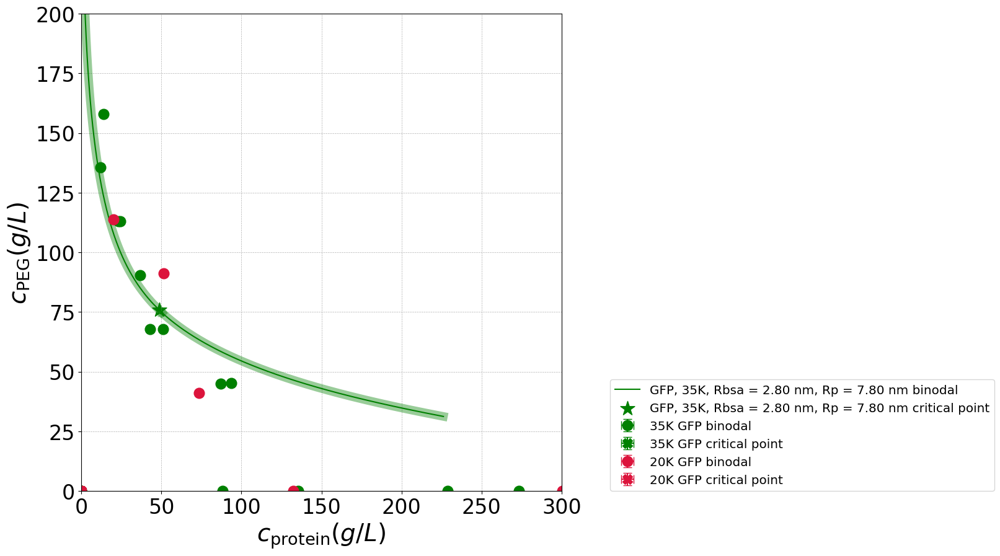

In [57]:
fig= plt.figure(figsize=(10, 10))

plt.xlim(0,300)
plt.ylim(0,200)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{protein} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(fontsize=14)


N_steps = 2000 # number of points between PhiP_max and PhiP_min 
solvent = 'good'
guess_c = [0.24, 0.7];
rgfp = 1.2e-9
mgfp=27

# gfvt8K_GFP = GFVT(2.8e-9, rpeg8K, mgfp, mpeg8, solvent, N_steps, guess_c)
# gfvt20K_GFP = GFVT(2.8e-9, rpeg20K, mgfp, mpeg20, solvent, N_steps, guess_c)
# gfvt35K_GFP = GFVT(2.8e-9, rpeg35K, mgfp, mpeg35, solvent, N_steps, guess_c)
# gfvt100K_GFP = GFVT(2.8e-9, rpeg100K, mgfp, mpeg100, solvent, N_steps, guess_c, critical=True)
# gfvtQ16_GFP = GFVT(2.8e-9, 25e-9, rpegQ16, mpegQ16, solvent, N_steps, guess_c)


# molplot_analytical(gfvt8K_GFP, 'GFP, 8K, ', 'royalblue', crit_color='royalblue', mass=True)
# molplot_analytical(gfvt20K_GFP, 'GFP, 20K, ', 'crimson', crit_color='crimson', mass=True)
# molplot_analytical(gfvt35K_GFP, 'GFP, 35K, ', 'green', crit_color='green', mass=True)
molplot(gfvt35K_GFP, 'GFP, 35K, ', 'green', crit_color='green', mass=True)
# molplot_analytical(gfvt100K_GFP, 'GFP, 100K, ', 'purple', crit_color='purple', mass=True)
# molplot_analytical(gfvtQ16_GFP, 'GFP, Q16, ', 'gray', crit_color='gray', mass=True)

molplot_dat_err_csv(data_35K_GFP, '35K GFP', 'green')
molplot_dat_err_csv(data_20K_GFP, '20K GFP', 'crimson')



# plt.yscale('log')

plt.savefig('../output/'+date_string+'_GFP_mass.png')
plt.savefig('../output/'+date_string+'_GFP_mass.eps')

In [49]:
np.exp(-1)

0.36787944117144233

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


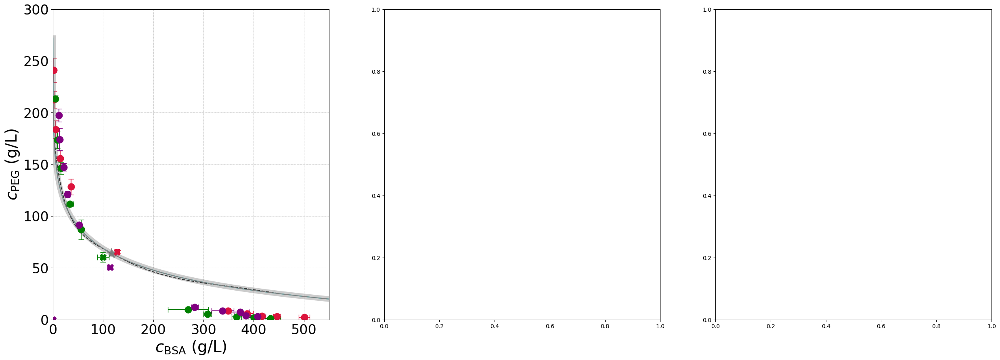

In [50]:
fig, axes = plt.subplots(1,3, figsize=(30, 10))

axes[0].set_xlim(0,550)
axes[0].set_ylim(0,300)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{BSA}$ (g/L)',fontsize = 28)
axes[0].set_ylabel(r'$c_\mathrm{PEG}$ (g/L)',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K', 'orange', ax=axes[0])
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K', 'black', ax=axes[0])
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K', 'royalblue', ax=axes[0])
molplot_dat_err_csv(data_20K_pH7_200mM, '20K', 'crimson', ax=axes[0])
molplot_dat_err_csv(data_35K_pH7_200mM, '35K', 'green', ax=axes[0])
molplot_dat_err_csv(data_100K_pH7_200mM, '100K', 'purple', ax=axes[0])
# molplot_analytical(gfvt4K_200mM_Z0_full, '4K', 'orange', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt6K_200mM_Z0_full, '6K', 'black', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt8K_200mM_Z0_full, '8K', 'royalblue', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt20K_200mM_Z0_full, '20K', 'crimson', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt35K_200mM_Z0_full, '35K', 'green', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvt100K_200mM_Z0_full, '100K', 'purple', ax=axes[0], crit_color='gray', mass=True)
# molplot_analytical(gfvtQ8_200mM_Z0_full, 'Q=8, ', 'red', ax=axes[0], crit_color='black', mass=True)
# molplot_analytical(gfvtQ10_200mM_Z0_full, 'Q=10, ', 'magenta', ax=axes[0], crit_color='black', mass=True)
molplot_analytical(gfvtQ16_200mM_Z0_full, 'Q=16, ', 'cyan', ax=axes[0], crit_color='black', mass=True)
molplot(gfvtQ16_200mM_Z0_full, 'Q=16, ', 'gray', ax=axes[0], crit_color='black', mass=True)

plt.savefig(date_string+'_analytical_good_Fig05_mass.png')
plt.savefig(date_string+'_analytical_good_Fig05_mass.eps')

ValueError: not enough values to unpack (expected 32, got 28)

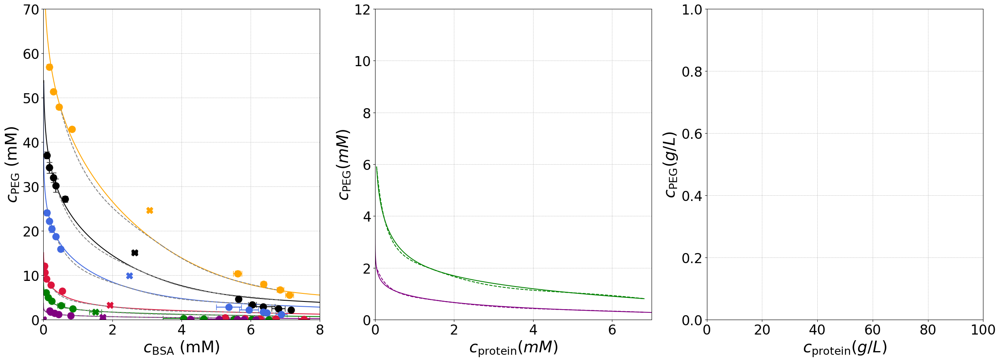

In [51]:
fig, axes = plt.subplots(1,3, figsize=(30, 10))

axes[0].set_xlim(0,8)
axes[0].set_ylim(0,70)
axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_xlabel(r'$c_\mathrm{BSA}$ (mM)',fontsize = 28)
axes[0].set_ylabel(r'$c_\mathrm{PEG}$ (mM)',fontsize = 28)
axes[0].grid(True, which='both', ls='--', lw=0.5)

axes[1].set_xlim(0,7)
axes[1].set_ylim(0,12)
axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_xlabel(r'$c_\mathrm{protein} (mM)$',fontsize = 28)
axes[1].set_ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[1].grid(True, which='both', ls='--', lw=0.5)

axes[2].set_xlim(0,100)
# axes[2].set_ylim(0,400)
axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_xlabel(r'$c_\mathrm{protein} (g/L)$',fontsize = 28)
axes[2].set_ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
axes[2].grid(True, which='both', ls='--', lw=0.5)

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K', 'orange', ax=axes[0], mbsa=mbsa, mpeg=mpeg4)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K', 'black', ax=axes[0], mbsa=mbsa, mpeg=mpeg6)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K', 'royalblue', ax=axes[0], mbsa=mbsa, mpeg=mpeg8)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K', 'crimson', ax=axes[0], mbsa=mbsa, mpeg=mpeg20)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K', 'green', ax=axes[0], mbsa=mbsa, mpeg=mpeg35)
molplot_dat_err_csv(data_100K_pH7_200mM, '100K', 'purple', ax=axes[0], mbsa=mbsa, mpeg=mpeg100)
molplot_analytical(gfvt4K_200mM_Z0_full, '4K', 'orange', ax=axes[0], crit_color='gray')
molplot_analytical(gfvt6K_200mM_Z0_full, '6K', 'black', ax=axes[0], crit_color='gray')
molplot_analytical(gfvt8K_200mM_Z0_full, '8K', 'royalblue', ax=axes[0], crit_color='gray')
molplot_analytical(gfvt20K_200mM_Z0_full, '20K', 'crimson', ax=axes[0], crit_color='gray')
molplot_analytical(gfvt35K_200mM_Z0_full, '35K', 'green', ax=axes[0], crit_color='gray')
molplot_analytical(gfvt100K_200mM_Z0_full, '100K', 'purple', ax=axes[0], crit_color='gray')
# molplot_analytical(gfvtQ8_200mM_Z0_full, 'Q=8, ', 'red', ax=axes[0], crit_color='black')
# molplot_analytical(gfvtQ10_200mM_Z0_full, 'Q=10, ', 'magenta', ax=axes[0], crit_color='black')
# molplot_analytical(gfvtQ16_200mM_Z0_full, 'Q=16, ', 'cyan', ax=axes[0], crit_color='black')


N_steps = 2000 # number of points between PhiP_max and PhiP_min 
solvent = 'good'
guess_c = [0.24, 0.7];
rgfp = 1.2e-9
mgfp=27

rPEG_GFP_4K = rpeg4K/rbsa*rgfp
mpeg_GFP_4K = (rPEG_GFP_4K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_6K = rpeg6K/rbsa*rgfp
mpeg_GFP_6K = (rPEG_GFP_6K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_8K = rpeg8K/rbsa*rgfp
mpeg_GFP_8K = (rPEG_GFP_8K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_20K = rpeg20K/rbsa*rgfp
mpeg_GFP_20K = (rPEG_GFP_20K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_35K = rpeg35K/rbsa*rgfp
mpeg_GFP_35K = (rPEG_GFP_35K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_100K = rpeg100K/rbsa*rgfp
mpeg_GFP_100K = (rPEG_GFP_100K/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q8 = 8*rgfp
mpeg_GFP_Q8 = (rPEG_GFP_Q8/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q10 = 10*rgfp
mpeg_GFP_Q10 = (rPEG_GFP_Q10/14.8e-9)**(1/0.6379)*mpeg100

rPEG_GFP_Q16 = 16*rgfp
mpeg_GFP_Q16 = (rPEG_GFP_Q16/14.8e-9)**(1/0.6379)*mpeg100

# gfvt4K_GFP = GFVT(rgfp, rPEG_GFP_4K, mgfp, mpeg_GFP_4K, solvent, N_steps, guess_c)
# gfvt4K_GFP_real = GFVT(rgfp, rpeg4K, mgfp, mpeg4, solvent, N_steps, guess_c)
# gfvt6K_GFP = GFVT(rgfp, rPEG_GFP_6K, mgfp, mpeg_GFP_6K, solvent, N_steps, guess_c)
# gfvt6K_GFP_real = GFVT(rgfp, rpeg6K, mgfp, mpeg6, solvent, N_steps, guess_c)
# gfvt8K_GFP = GFVT(rgfp, rPEG_GFP_8K, mgfp, mpeg_GFP_8K, solvent, N_steps, guess_c)
# gfvt8K_GFP_real = GFVT(rgfp, rpeg8K, mgfp, mpeg8, solvent, N_steps, guess_c)
# gfvt20K_GFP = GFVT(rgfp, rPEG_GFP_20K, mgfp, mpeg_GFP_20K, solvent, N_steps, guess_c)
# gfvt20K_GFP_real = GFVT(rgfp, rpeg20K, mgfp, mpeg20, solvent, N_steps, guess_c)
# gfvt35K_GFP = GFVT(rgfp, rPEG_GFP_35K, mgfp, mpeg_GFP_35K, solvent, N_steps, guess_c)
# gfvt35K_GFP_real = GFVT(rgfp, rpeg35K, mgfp, mpeg35, solvent, N_steps, guess_c)
# gfvt100K_GFP = GFVT(rgfp, rPEG_GFP_100K, mgfp, mpeg_GFP_100K, solvent, N_steps, guess_c, critical=True)
# gfvt100K_GFP_real = GFVT(rgfp, rpeg100K, mgfp, mpeg100, solvent, N_steps, guess_c, critical=True)
# gfvtQ8_GFP = GFVT(rgfp, rPEG_GFP_Q8, mgfp, mpeg_GFP_Q8, solvent, N_steps, guess_c)
# gfvtQ10_GFP = GFVT(rgfp, rPEG_GFP_Q10, mgfp, mpeg_GFP_Q10, solvent, N_steps, guess_c)
guess_c = [0.1, 50]
# gfvtQ16_GFP = GFVT(rgfp, rPEG_GFP_Q16, mgfp, mpeg_GFP_Q16, solvent, N_steps, guess_c)

# molplot_analytical(gfvt4K_200mM_Z0_full, 'BSA, 4K, ', 'orange', crit_color='black', ax=axes[1])
molplot_analytical(gfvt35K_200mM_Z0, 'BSA, 35K, ', 'green', crit_color='green', ax=axes[1])
molplot_analytical(gfvt100K_200mM_Z0_full, 'BSA, 100K, ', 'purple', crit_color='purple', ax=axes[1])
# molplot_analytical(gfvtQ8_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1]))
# molplot_analytical(gfvtQ16_200mM_Z0, 'BSA, ', 'blue', crit_color='blue', ax=axes[1])

# molplot_analytical(gfvt4K_GFP, 'GFP, 4K, ', 'red', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt4K_GFP_real, 'GFP, 4K real, ', 'red', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt6K_GFP, 'GFP, 6K, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt6K_GFP_real, 'GFP, 6K real, ', 'gray', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt8K_GFP, 'GFP, 8K, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt8K_GFP_real, 'GFP, 8K real, ', 'dodgerblue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt20K_GFP, 'GFP, 20K, ', 'hotpink', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt35K_GFP, 'GFP, 35K, ', 'lime', crit_color='black', ax=axes[1])
# molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, ', 'lawngreen', crit_color='lawngreen', ax=axes[1])
molplot_analytical(gfvt35K_GFP1p8_real, 'GFP, 35K real, 1.8 nm', 'yellowgreen', crit_color='yellowgreen', ax=axes[1])
molplot_analytical(gfvt100K_GFP1p8_real, 'GFP, 100K real, 1.8 nm ', 'violet', crit_color='violet', ax=axes[1])
# molplot_analytical(gfvtQ8_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvtQ10_GFP, 'GFP, ', 'blue', crit_color='black', ax=axes[1])
# molplot_analytical(gfvtQ16_GFP, 'GFP, ', 'cyan', ax=axes[1], crit_color='cyan')


# molplot_analytical(gfvt4K_200mM_Z0_full, 'BSA, 4K, ', 'orange', crit_color='orange', ax=axes[2], mass=True)
molplot_analytical(gfvt35K_200mM_Z0, 'BSA, 35K, ', 'green', crit_color='green', ax=axes[2], mass=True)
molplot_analytical(gfvt100K_200mM_Z0_full, 'BSA, 100K, ', 'purple', ax=axes[2], crit_color='purple', mass=True)
# molplot_analytical(gfvtQ16_200mM_Z0, 'BSA, Q16, ', 'blue', ax=axes[2], crit_color='blue', mass=True)

# molplot_analytical(gfvt4K_GFP_real, 'GFP, 4K real, ', 'red', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt6K_GFP_real, 'GFP, 6K real, ', 'gray', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt8K_GFP_real, 'GFP, 8K real, ', 'dodgerblue', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt20K_GFP, 'GFP, 20K, ', 'red', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt20K_GFP_real, 'GFP, 20K real, ', 'hotpink', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_GFP, 'GFP, 35K, ', 'lime', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvt35K_GFP_real, 'GFP, 35K real, ', 'yellowgreen', crit_color='yellowgreen', ax=axes[2], mass=True)
molplot_analytical(gfvt35K_GFP1p8_real, 'GFP, 35K real, 1.8 nm', 'yellowgreen', crit_color='yellowgreen', ax=axes[2], mass=True)
molplot_analytical(gfvt100K_GFP1p8_real, 'GFP, 100K real, 1.8 nm', 'violet', crit_color='violet', ax=axes[2], mass=True)
# molplot_analytical(gfvtQ16_GFP1p8, 'GFP, Q16, 1.8 nm', 'yellow', crit_color='yellow', ax=axes[2], mass=True)

axes[2].scatter([2.36,1.29,0.64],[255,325,417])
axes[2].scatter([1.93,0.86],[230,391])
axes[2].scatter([2.8,1.9,0.9],[161,184,322])

# molplot_analytical(gfvt100K_GFP_real, 'GFP, 100K real, ', 'violet', crit_color='black', ax=axes[2], mass=True)
# molplot_analytical(gfvtQ16_GFP, 'GFP, ', 'cyan', ax=axes[2], crit_color='cyan', mass=True)
# plt.yscale('log')

plt.savefig(date_string+'_analytical_good_Fig05_mass.png')
plt.savefig(date_string+'_analytical_good_Fig05_mass.eps')

In [ ]:
N_steps = 2000 # number of points between PhiP_max and PhiP_min 
solvent = 'good'
guess_c = [0.24, 0.7];
rgfp_1p8 = 1.8e-9
mgfp=27

rPEG1p8_GFP_4K = rpeg4K/rbsa*rgfp_1p8
mpeg1p8_GFP_4K = (rPEG1p8_GFP_4K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_6K = rpeg6K/rbsa*rgfp_1p8
mpeg1p8_GFP_6K = (rPEG1p8_GFP_6K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_8K = rpeg8K/rbsa*rgfp_1p8
mpeg1p8_GFP_8K = (rPEG1p8_GFP_8K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_20K = rpeg20K/rbsa*rgfp_1p8
mpeg1p8_GFP_20K = (rPEG1p8_GFP_20K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_35K = rpeg35K/rbsa*rgfp_1p8
mpeg1p8_GFP_35K = (rPEG1p8_GFP_35K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_100K = rpeg100K/rbsa*rgfp_1p8
mpeg1p8_GFP_100K = (rPEG1p8_GFP_100K/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_Q8 = 8*rgfp_1p8
mpeg1p8_GFP_Q8 = (rPEG1p8_GFP_Q8/14.8e-9)**(1/0.6379)*mpeg100

rPEG_1p8GFP_Q10 = 10*rgfp_1p8
mpeg1p8_GFP_Q10 = (rPEG_1p8GFP_Q10/14.8e-9)**(1/0.6379)*mpeg100

rPEG1p8_GFP_Q16 = 16*rgfp_1p8
mpeg1p8_GFP_Q16 = (rPEG1p8_GFP_Q16/14.8e-9)**(1/0.6379)*mpeg100

gfvt4K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_4K, mgfp, mpeg1p8_GFP_4K, solvent, N_steps, guess_c)
gfvt4K_GFP1p8_real = GFVT(rgfp_1p8, rpeg4K, mgfp, mpeg4, solvent, N_steps, guess_c)
gfvt6K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_6K, mgfp, mpeg1p8_GFP_6K, solvent, N_steps, guess_c)
gfvt6K_GFP1p8_real = GFVT(rgfp_1p8, rpeg6K, mgfp, mpeg6, solvent, N_steps, guess_c)
gfvt8K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_8K, mgfp, mpeg1p8_GFP_8K, solvent, N_steps, guess_c)
gfvt8K_GFP1p8_real = GFVT(rgfp_1p8, rpeg8K, mgfp, mpeg8, solvent, N_steps, guess_c)
gfvt20K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_20K, mgfp, mpeg1p8_GFP_20K, solvent, N_steps, guess_c)
gfvt20K_GFP1p8_real = GFVT(rgfp_1p8, rpeg20K, mgfp, mpeg20, solvent, N_steps, guess_c)
gfvt35K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_35K, mgfp, mpeg1p8_GFP_35K, solvent, N_steps, guess_c)
gfvt35K_GFP1p8_real = GFVT(rgfp_1p8, rpeg35K, mgfp, mpeg35, solvent, N_steps, guess_c)
gfvt100K_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_100K, mgfp, mpeg1p8_GFP_100K, solvent, N_steps, guess_c)
gfvt100K_GFP1p8_real = GFVT(rgfp_1p8, rpeg100K, mgfp, mpeg100, solvent, N_steps, guess_c, critical=True)
gfvtQ8_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_Q8, mgfp, mpeg1p8_GFP_Q8, solvent, N_steps, guess_c)
gfvtQ10_GFP1p8 = GFVT(rgfp_1p8, rPEG_1p8GFP_Q10, mgfp, mpeg1p8_GFP_Q10, solvent, N_steps, guess_c)
guess_c = [0.1, 50]
gfvtQ16_GFP1p8 = GFVT(rgfp_1p8, rPEG1p8_GFP_Q16, mgfp, mpeg1p8_GFP_Q16, solvent, N_steps, guess_c)

q = 0.63, Rbsa = 1.80 nm, Rp = 1.14 nm
BSA_crit = 0.2348, PEG_crit = 0.6382
[BSA]_crit = 15.96 mM, [PEG]_crit = 76.68 mM

BSA_tp_G = 0.0309, BSA_tp_L = 0.4611, BSA_tp_S = 0.5662, PEG_tp = 0.9063
[BSA]_tp_G = 2.10 mM, [BSA]_tp_L = 31.34 mM, [BSA]_tp_S = 38.49 mM, [PEG]_tp_G = 226.03 mM, [PEG]_tp_L = 30.86 mM, [PEG]_tp_S = 7.86 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:40<00:00, 49.85step/s]


q = 1.06, Rbsa = 1.80 nm, Rp = 1.90 nm
BSA_crit = 0.1671, PEG_crit = 1.0371
[BSA]_crit = 11.36 mM, [PEG]_crit = 31.97 mM

BSA_tp_G = 0.0066, BSA_tp_L = 0.4669, BSA_tp_S = 0.5634, PEG_tp = 2.0028
[BSA]_tp_G = 0.45 mM, [BSA]_tp_L = 31.74 mM, [BSA]_tp_S = 38.30 mM, [PEG]_tp_G = 114.10 mM, [PEG]_tp_L = 14.27 mM, [PEG]_tp_S = 4.12 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:52<00:00, 38.14step/s]


q = 0.82, Rbsa = 1.80 nm, Rp = 1.47 nm
BSA_crit = 0.1987, PEG_crit = 0.8031
[BSA]_crit = 13.51 mM, [PEG]_crit = 49.01 mM

BSA_tp_G = 0.0125, BSA_tp_L = 0.4663, BSA_tp_S = 0.5634, PEG_tp = 1.3551
[BSA]_tp_G = 0.85 mM, [BSA]_tp_L = 31.70 mM, [BSA]_tp_S = 38.30 mM, [PEG]_tp_G = 164.46 mM, [PEG]_tp_L = 20.46 mM, [PEG]_tp_S = 5.75 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:46<00:00, 42.69step/s]


q = 1.36, Rbsa = 1.80 nm, Rp = 2.45 nm
BSA_crit = 0.1409, PEG_crit = 1.3760
[BSA]_crit = 9.58 mM, [PEG]_crit = 21.54 mM

BSA_tp_G = 0.0043, BSA_tp_L = 0.4662, BSA_tp_S = 0.5642, PEG_tp = 2.9018
[BSA]_tp_G = 0.29 mM, [BSA]_tp_L = 31.69 mM, [BSA]_tp_S = 38.35 mM, [PEG]_tp_G = 77.49 mM, [PEG]_tp_L = 9.97 mM, [PEG]_tp_S = 2.89 mM



Calculating Binodal: 100%|██████████| 2000/2000 [01:04<00:00, 31.24step/s]


q = 1.03, Rbsa = 1.80 nm, Rp = 1.86 nm
BSA_crit = 0.1695, PEG_crit = 1.0143
[BSA]_crit = 11.52 mM, [PEG]_crit = 33.08 mM

BSA_tp_G = 0.0068, BSA_tp_L = 0.4670, BSA_tp_S = 0.5634, PEG_tp = 1.9402
[BSA]_tp_G = 0.47 mM, [BSA]_tp_L = 31.74 mM, [BSA]_tp_S = 38.30 mM, [PEG]_tp_G = 117.74 mM, [PEG]_tp_L = 14.70 mM, [PEG]_tp_S = 4.24 mM



Calculating Binodal: 100%|██████████| 2000/2000 [00:53<00:00, 37.25step/s]


q = 1.72, Rbsa = 1.80 nm, Rp = 3.10 nm
BSA_crit = 0.1213, PEG_crit = 1.8455
[BSA]_crit = 8.25 mM, [PEG]_crit = 15.36 mM

BSA_tp_G = 0.0033, BSA_tp_L = 0.4654, BSA_tp_S = 0.5650, PEG_tp = 4.0437
[BSA]_tp_G = 0.23 mM, [BSA]_tp_L = 31.63 mM, [BSA]_tp_S = 38.41 mM, [PEG]_tp_G = 53.42 mM, [PEG]_tp_L = 7.06 mM, [PEG]_tp_S = 2.04 mM



Calculating Binodal: 100%|██████████| 2000/2000 [01:23<00:00, 23.96step/s]


q = 1.80, Rbsa = 1.80 nm, Rp = 3.24 nm
BSA_crit = 0.1182, PEG_crit = 1.9575
[BSA]_crit = 8.03 mM, [PEG]_crit = 14.46 mM

BSA_tp_G = 0.0032, BSA_tp_L = 0.4652, BSA_tp_S = 0.5652, PEG_tp = 4.2995
[BSA]_tp_G = 0.22 mM, [BSA]_tp_L = 31.62 mM, [BSA]_tp_S = 38.42 mM, [PEG]_tp_G = 49.76 mM, [PEG]_tp_L = 6.61 mM, [PEG]_tp_S = 1.90 mM



Calculating Binodal: 100%|██████████| 2000/2000 [01:20<00:00, 24.78step/s]


q = 3.00, Rbsa = 1.80 nm, Rp = 5.40 nm
BSA_crit = 0.0999, PEG_crit = 4.1901
[BSA]_crit = 6.79 mM, [PEG]_crit = 7.36 mM

BSA_tp_G = 0.0025, BSA_tp_L = 0.4636, BSA_tp_S = 0.5665, PEG_tp = 8.6057
[BSA]_tp_G = 0.17 mM, [BSA]_tp_L = 31.51 mM, [BSA]_tp_S = 38.51 mM, [PEG]_tp_G = 21.55 mM, [PEG]_tp_L = 2.98 mM, [PEG]_tp_S = 0.85 mM



Calculating Binodal: 100%|██████████| 2000/2000 [02:28<00:00, 13.50step/s]


q = 2.60, Rbsa = 1.80 nm, Rp = 4.68 nm
BSA_crit = 0.1008, PEG_crit = 3.3485
[BSA]_crit = 6.85 mM, [PEG]_crit = 8.94 mM

BSA_tp_G = 0.0026, BSA_tp_L = 0.4640, BSA_tp_S = 0.5662, PEG_tp = 7.1017
[BSA]_tp_G = 0.18 mM, [BSA]_tp_L = 31.54 mM, [BSA]_tp_S = 38.49 mM, [PEG]_tp_G = 27.31 mM, [PEG]_tp_L = 3.75 mM, [PEG]_tp_S = 1.07 mM



Calculating Binodal: 100%|██████████| 2000/2000 [02:09<00:00, 15.45step/s]


q = 4.33, Rbsa = 1.80 nm, Rp = 7.80 nm
BSA_crit = 0.1094, PEG_crit = 7.2857
[BSA]_crit = 7.43 mM, [PEG]_crit = 4.16 mM

BSA_tp_G = 0.0023, BSA_tp_L = 0.4629, BSA_tp_S = 0.5671, PEG_tp = 14.0243
[BSA]_tp_G = 0.16 mM, [BSA]_tp_L = 31.46 mM, [BSA]_tp_S = 38.55 mM, [PEG]_tp_G = 11.66 mM, [PEG]_tp_L = 1.64 mM, [PEG]_tp_S = 0.46 mM



Calculating Binodal: 100%|██████████| 2000/2000 [03:55<00:00,  8.50step/s]


q = 4.93, Rbsa = 1.80 nm, Rp = 8.88 nm
BSA_crit = 0.1118, PEG_crit = 8.7548
[BSA]_crit = 7.60 mM, [PEG]_crit = 3.36 mM

BSA_tp_G = 0.0023, BSA_tp_L = 0.4627, BSA_tp_S = 0.5672, PEG_tp = 16.6386
[BSA]_tp_G = 0.16 mM, [BSA]_tp_L = 31.45 mM, [BSA]_tp_S = 38.56 mM, [PEG]_tp_G = 9.37 mM, [PEG]_tp_L = 1.32 mM, [PEG]_tp_S = 0.37 mM



Calculating Binodal: 100%|██████████| 2000/2000 [04:35<00:00,  7.27step/s]


q = 8.22, Rbsa = 1.80 nm, Rp = 14.80 nm
BSA_crit = 0.1169, PEG_crit = 17.5874
[BSA]_crit = 7.95 mM, [PEG]_crit = 1.44 mM

BSA_tp_G = 0.0023, BSA_tp_L = 0.4622, BSA_tp_S = 0.5676, PEG_tp = 32.4983
[BSA]_tp_G = 0.16 mM, [BSA]_tp_L = 31.42 mM, [BSA]_tp_S = 38.58 mM, [PEG]_tp_G = 3.95 mM, [PEG]_tp_L = 0.57 mM, [PEG]_tp_S = 0.16 mM



Calculating Binodal: 100%|██████████| 2000/2000 [07:55<00:00,  4.20step/s]


q = 8.00, Rbsa = 1.80 nm, Rp = 14.40 nm
BSA_crit = 0.1167, PEG_crit = 16.9529
[BSA]_crit = 7.94 mM, [PEG]_crit = 1.51 mM

BSA_tp_G = 0.0023, BSA_tp_L = 0.4622, BSA_tp_S = 0.5675, PEG_tp = 31.3556
[BSA]_tp_G = 0.16 mM, [BSA]_tp_L = 31.42 mM, [BSA]_tp_S = 38.58 mM, [PEG]_tp_G = 4.14 mM, [PEG]_tp_L = 0.59 mM, [PEG]_tp_S = 0.17 mM



Calculating Binodal: 100%|██████████| 2000/2000 [07:40<00:00,  4.34step/s]


q = 10.00, Rbsa = 1.80 nm, Rp = 18.00 nm
BSA_crit = 0.1180, PEG_crit = 22.8355
[BSA]_crit = 8.02 mM, [PEG]_crit = 1.04 mM

BSA_tp_G = 0.0023, BSA_tp_L = 0.4621, BSA_tp_S = 0.5676, PEG_tp = 41.9581
[BSA]_tp_G = 0.16 mM, [BSA]_tp_L = 31.41 mM, [BSA]_tp_S = 38.59 mM, [PEG]_tp_G = 2.84 mM, [PEG]_tp_L = 0.41 mM, [PEG]_tp_S = 0.11 mM



Calculating Binodal: 100%|██████████| 2000/2000 [10:03<00:00,  3.31step/s]


q = 16.00, Rbsa = 1.80 nm, Rp = 28.80 nm
BSA_crit = 0.1195, PEG_crit = 42.4572
[BSA]_crit = 8.12 mM, [PEG]_crit = 0.47 mM

BSA_tp_G = 0.0025, BSA_tp_L = 0.4619, BSA_tp_S = 0.5678, PEG_tp = 77.3901
[BSA]_tp_G = 0.17 mM, [BSA]_tp_L = 31.40 mM, [BSA]_tp_S = 38.59 mM, [PEG]_tp_G = 1.28 mM, [PEG]_tp_L = 0.18 mM, [PEG]_tp_S = 0.05 mM



Calculating Binodal: 100%|██████████| 2000/2000 [18:15<00:00,  1.83step/s]


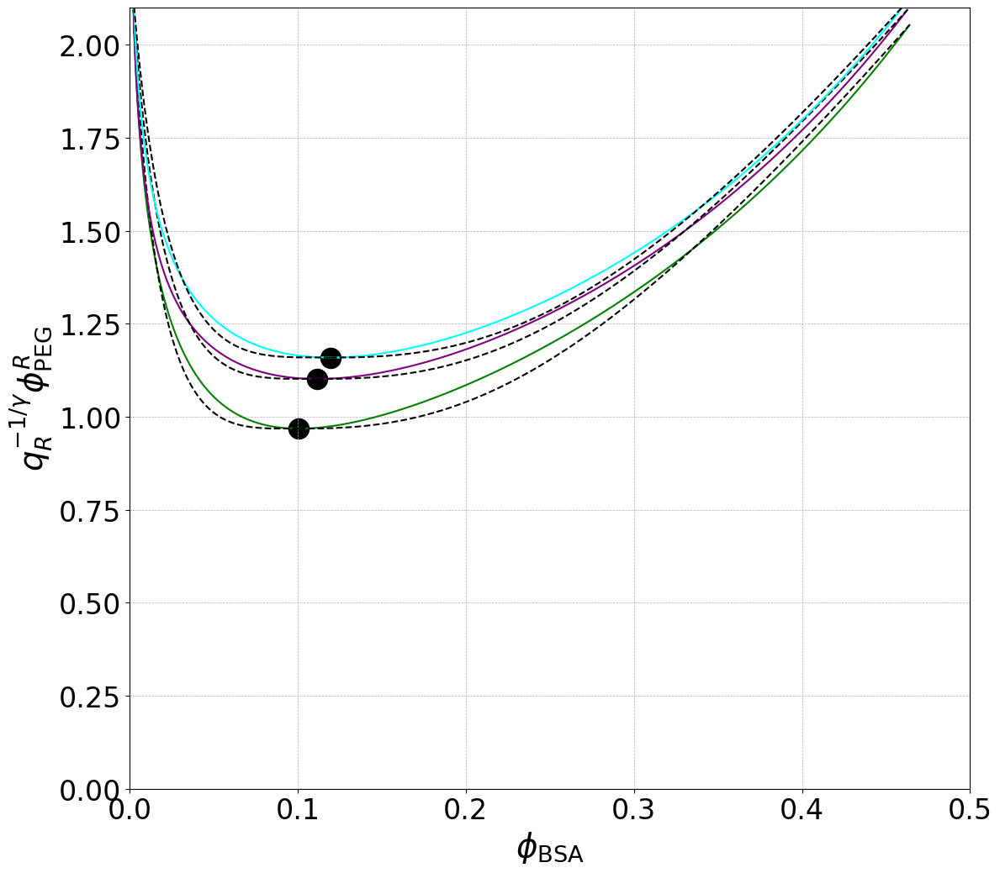

In [ ]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,0.5)
plt.ylim(0,2.1)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\phi_\mathrm{BSA}$',fontsize = 28)
plt.ylabel(r'$q_R^{-1/\gamma}\phi^R_\mathrm{PEG}$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv_phi(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange', gfvt4K_200mM_Z0, mbsa, mpeg4,False)
# molplot_dat_err_csv_phi(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', gfvt6K_200mM_Z0, mbsa, mpeg6, False)
# molplot_dat_err_csv_phi(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', gfvt8K_200mM_Z0, mbsa, mpeg8, False)
# molplot_dat_err_csv_phi(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', gfvt20K_200mM_Z0, mbsa, mpeg20, False)
# molplot_dat_err_csv_phi(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', gfvt35K_200mM_Z0, mbsa, mpeg35, False)
# molplot_dat_err_csv_phi(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple', gfvt100K_200mM_Z0, mbsa, mpeg100, False)

# molplot_phiR(gfvt4K_200mM_Z0_full, '4K, pH 7, 200 mM KCl, ', 'orange', crit_color='red')
# molplot_phiR(gfvt6K_200mM_Z0_full, '6K, pH 7, 200 mM KCl, ', 'black', crit_color='red')
# molplot_phiR(gfvt8K_200mM_Z0_full, '8K, pH 7, 200 mM KCl, ', 'royalblue', crit_color='red')
# molplot_phiR(gfvt20K_200mM_Z0, '20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='black')
molplot_phiR(gfvt35K_200mM_Z0, '35K, pH 7, 200 mM KCl, ', 'green', crit_color='black')
molplot_phiR(gfvt100K_200mM_Z0, '100K, pH 7, 200 mM KCl, ', 'purple', crit_color='black')
# molplot_phiR(gfvtQ8_200mM_Z0_full, 'Q=8, pH 7, 200 mM KCl, ', 'red', crit_color='black')
# molplot_phiR(gfvtQ10_200mM_Z0_full, 'Q=10, pH 7, 200 mM KCl, ', 'magenta', crit_color='black')
molplot_phiR(gfvtQ16_200mM_Z0, 'Q=16, pH 7, 200 mM KCl, ', 'cyan', crit_color='black')
# molplot_phiR(gfvtQ16_GFP, 'GFP, ', 'blue', crit_color='black')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

# Other various plots

<>:21: SyntaxWarning: invalid escape sequence '\P'
<>:23: SyntaxWarning: invalid escape sequence '\P'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\P'
<>:23: SyntaxWarning: invalid escape sequence '\P'
<>:49: SyntaxWarning: invalid escape sequence '\m'
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_76116/2879267231.py:21: SyntaxWarning: invalid escape sequence '\P'
  axes[0].set_title("$\Pi$ (kPa)")
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_76116/2879267231.py:23: SyntaxWarning: invalid escape sequence '\P'
  axes[0].set_ylabel("$\Pi$ (kPa)")
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_76116/2879267231.py:49: SyntaxWarning: invalid escape sequence '\m'
  axes[1].set_ylabel("$\mu_{BSA}/kT$")
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_76116/2879267231.py:50: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  axes[1].set_xlim(0,8)


14.682732120363791
57.797604206126586
rescale with q = 0.63, phix_peg/q**3=14.68
14.682732120363791
26.957051381640124
rescale with q = 0.82, phix_peg/q**3=14.68
14.682732120363791
13.307165494606506
rescale with q = 1.03, phix_peg/q**3=14.68
14.682732120363791
2.5176152469759585
rescale with q = 1.80, phix_peg/q**3=14.68
14.682732120363791
0.8353853049820089
rescale with q = 2.60, phix_peg/q**3=14.68
14.682732120363791
0.1222884649137953
rescale with q = 4.93, phix_peg/q**3=14.68
14.682732120363791
0.012098198463434517
rescale with q = 10.67, phix_peg/q**3=14.68
14.682732120363791
0.0035846513965731913
rescale with q = 16.00, phix_peg/q**3=14.68


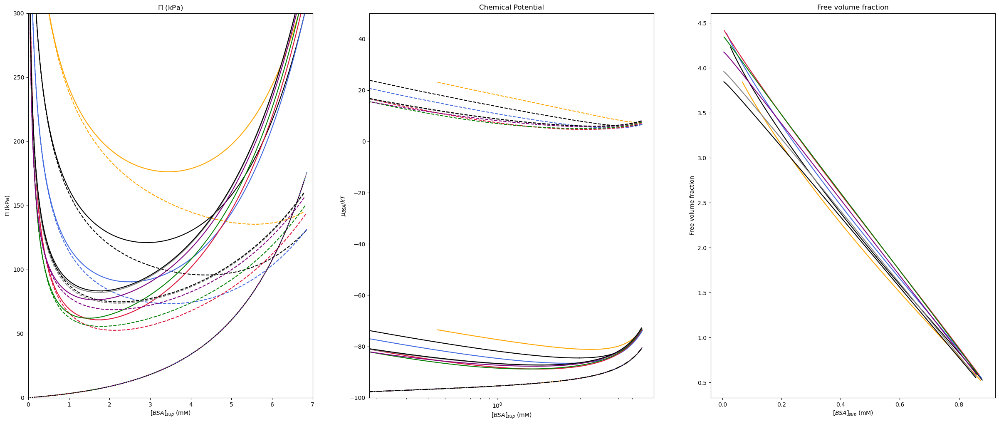

In [119]:
def Pi_Mu_a_plots(gfvt_out, axes, pcolor, plabel, mpeg):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    Rpr_in, Rpol_in, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {Rpr_in*1e9:.2f} nm, Rp = {Rpol_in*1e9:.2f} nm'

    gamma = 0

    q=Rpol_in/Rpr_in
    # qq=q**-1/gamma
    qq=1

    axes[0].plot(BSA_Drop, Pi_Drop/1000, label='Droplet Total', color=pcolor)
    axes[0].plot(BSA_Drop, (Pi_Drop-P0_Drop)/1000, label='Polymer', linestyle='--', color=pcolor)
    axes[0].plot(BSA_Drop, P0_Drop/1000, label='Droplet HS', linestyle=':', color=pcolor)

    axes[0].plot(BSA_Sup, Pi_Sup/1000, label='Supernatant Total', color=pcolor)
    axes[0].plot(BSA_Sup, (Pi_Sup-P0_Sup)/1000, label='Polymer', linestyle='--', color=pcolor)
    axes[0].plot(BSA_Sup, P0_Sup/1000, label='Sup HS', linestyle=':', color=pcolor)
    axes[0].set_title("$\Pi$ (kPa)")
    axes[0].set_xlabel("$[BSA]_{sup}$ (mM)")
    axes[0].set_ylabel("$\Pi$ (kPa)")
    axes[0].set_xlim(0,7)
    axes[0].set_ylim(0,300)
    # axes[0].legend(fontsize = 14)

    phi_BSA_Sup = BSA_Sup/phix_bsa
    phi_BSA_Drop = BSA_Drop/phix_bsa

    phi_PEG_Sup = PEG_Sup/phix_peg
    phi_PEG_Drop = PEG_Drop/phix_peg

    print(phix_bsa)
    print(phix_peg)
    print(f'rescale with q = {q:.2f}, phix_peg/q**3={phix_peg*q**3:.2f}')
    
    axes[1].plot(BSA_Sup, Mu_Sup, label='Mu Total Supernatant', color=pcolor)
    axes[1].plot(BSA_Drop, Mu_Drop, label='Mu Total Drop', color=pcolor)
    
    axes[1].plot(BSA_Sup, MuR_Sup, label='Mu Depletion Supernatant', color=pcolor, linestyle='--')
    axes[1].plot(BSA_Drop, MuR_Drop, label='Mu Depletion Drop', color=pcolor, linestyle='--')

    axes[1].plot(BSA_Sup, Mu0_Sup, label='Mu HS Supernatant', color=pcolor, linestyle='-.')
    axes[1].plot(BSA_Drop, Mu0_Drop, label='Mu HS Drop', color=pcolor, linestyle='-.')
    
    axes[1].set_title("Chemical Potential")
    axes[1].set_xlabel("$[BSA]_{sup}$ (mM)")
    axes[1].set_ylabel("$\mu_{BSA}/kT$")
    axes[1].set_xlim(0,8)
    axes[1].set_ylim(-100,50)
    # axes[1].axhline(0, color='black', linestyle='--', linewidth=1)
    axes[1].set_xscale('log')
    # axes[1].legend(fontsize = 14)

    Q_BSA_A1 = [1-a for a in a_Drop]
    Q_BSA_B1 = [1-a for a in a_Sup]
    
    # c_PEG_A1 = [fPEG*rpeg**-3*(rpeg/rbsa)**2.41 for fPEG, fBSA in zip(phi_PEG_Drop, phi_BSA_Drop)]
    # c_PEG_B1 = [fPEG*rpeg**-3*(rpeg/rbsa)**2.41 for fPEG, fBSA in zip(phi_PEG_Sup, phi_BSA_Sup)]

    c_PEG_A1 = [fPEG*q**1.63*qx**1.5 for qx, fPEG in zip(qx_Drop_p, PEG_Drop)]
    c_PEG_B1 = [fPEG*q**1.63*qx**1.5 for qx, fPEG in zip(qx_Sup_p, PEG_Sup)]

    axes[2].plot(Q_BSA_A1, c_PEG_A1, label='Droplet alpha', linestyle='-', color=pcolor)
    axes[2].plot(Q_BSA_B1, c_PEG_B1, label='Supernatant alpha', linestyle='-', color=pcolor)

    # axes[2].plot(BSA_Drop, c_PEG_A1, label='Droplet alpha', linestyle='--', color=pcolor)
    # axes[2].plot(BSA_Sup, c_PEG_B1, label='Supernatant alpha', linestyle='--', color=pcolor)

    # axes[2].plot(BSA_Drop, [phig*q**1.7 for a, phi, phig, phiR in zip(a_Drop, phi_BSA_Drop, PEG_Drop, phi_R)], label='Droplet alpha', linestyle='-', color=pcolor)

# axes[2].plot(BSA_Drop, [phig*a*rpeg**2 for a, phi, phig in zip(a_Drop, phi_BSA_Drop, PEG_Drop)], label='Droplet alpha', linestyle='-', color=pcolor)
    # axes[2].plot(BSA_Drop, [np.log(phig/a) for a, phi, phig, phi_R in zip(a_Drop, phi_BSA_Drop, PEG_Drop, phi_R)], label='Droplet alpha', linestyle='-', color=pcolor)
    # axes[2].plot(PEG_Drop, [qx for a, phi_peg, phi_bsa, qx in zip(a_Drop, phi_PEG_Drop, phi_BSA_Drop, qx_Drop_p)], label='Droplet alpha', linestyle='-', color=pcolor)
    # axes[2].plot(BSA_Drop, [phi_bsa for phi_bsa in phi_BSA_Drop], label='Droplet Phi_BSA', linestyle='--', color=pcolor)
    # axes[2].plot(BSA_Drop, PEG_Drop/phixpeg, label='Phi PEG', linestyle='-', color=pcolor)

    # axes[2].plot(BSA_Sup, [phig*q**1.7 for a, phi, phig, phiR in zip(a_Sup, phi_BSA_Sup, PEG_Sup, phi_R)], label='Supernatant alpha', linestyle='-', color=pcolor)

# axes[2].plot(BSA_Sup, [phig*a*rpeg**2 for a, phi, phig in zip(a_Sup, phi_BSA_Sup, PEG_Sup)], label='Supernatant alpha', linestyle='-', color=pcolor)
    # axes[2].plot(BSA_Sup, [np.log(phig/a) for a, phi, phig, phiR in zip(a_Sup, phi_BSA_Sup, PEG_Sup, phi_R)], label='Supernatant alpha', linestyle='-', color=pcolor)
    # axes[2].plot(PEG_Sup, [qx for a, phi_peg, phi_bsa, qx in zip(a_Sup, phi_PEG_Sup, phi_BSA_Sup, qx_Sup_p)], label='Supernatant alpha', linestyle='-', color=pcolor)
    # axes[2].plot(BSA_Sup, [phi_bsa for phi_bsa in phi_BSA_Sup], label='Supernatant Phi_BSA', linestyle='--', color=pcolor)
    # a_approx = [1-eta*(1+qx)**3 for eta, qx in zip(phi_BSA_Sup, qx_Sup_p)]
    
    # a_norm_drop = [1-3*(1-a)/((1+qx)**3) for a, eta, qx in zip(a_Drop, phi_BSA_Drop, qx_Drop_p)]
    # a_norm_sup = [1-3*(1-a)/((1+qx)**3) for a, eta, qx in zip(a_Sup, phi_BSA_Sup, qx_Sup_p)]
    
    # axes[2].plot(BSA_Sup, a_approx, label='Supernatant approx', linestyle='--', color=pcolor)
    # axes[2].plot(BSA_Sup, a_norm_sup, label='Supernatant norm', linestyle='-.', color=pcolor)
    # axes[2].plot(BSA_Drop, a_norm_drop, label='Droplet norm', linestyle='-.', color=pcolor)
    # axes[2].plot(BSA_Sup, PEG_Sup/phixpeg, label='Phi PEG', linestyle='-', color=pcolor)

    axes[2].set_title("Free volume fraction")
    axes[2].set_xlabel("$[BSA]_{sup}$ (mM)")
    axes[2].set_ylabel("Free volume fraction")
    # axes[2].set_yscale('log')
    # axes[2].set_xlim(0,8)
    # axes[2].set_ylim(1,30)
    # axes[2].legend(fontsize = 14)
    
fig, axes = plt.subplots(1, 3, figsize=(30, 12))
Pi_Mu_a_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', 4)
Pi_Mu_a_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', 6)
Pi_Mu_a_plots(gfvt8K_200mM_Z0, axes, 'royalblue', 'PEG 8K', 8)
Pi_Mu_a_plots(gfvt20K_200mM_Z0, axes, 'crimson', 'PEG 20K', 20)
Pi_Mu_a_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', 35)
Pi_Mu_a_plots(gfvt100K_200mM_Z0, axes, 'purple', 'PEG 100K', 100)
Pi_Mu_a_plots(gfvtQ10_200mM_Z0, axes, 'gray', 'Q10', 100)
Pi_Mu_a_plots(gfvtQ16_200mM_Z0, axes, 'black', 'Q16', 100)

# plt.savefig(date_string+'_Pi_Mu_a_Z0_hiQ.png')
# plt.savefig(date_string+'_Pi_Mu_a_Z0_hiQ.eps')

## Depletion Length

### (delta/Rg, mM)

### Delta, rescaled

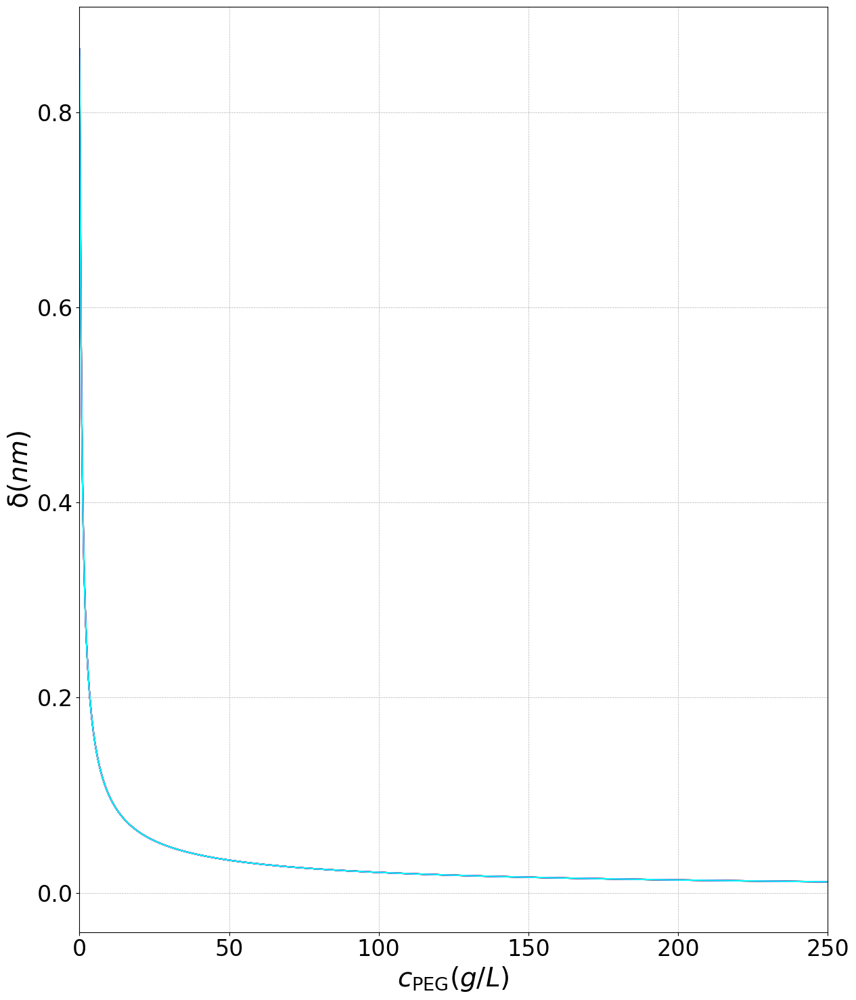

In [ ]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)

plt.xlim(0,250)
# plt.ylim(0,2)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.ylabel(r'$\mathrm{\delta} (nm)$',fontsize = 28)
plt.tight_layout()

def d_Rg(gfvt_out, pcolor, plabel):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, tp, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    PhiR = np.linspace(0, 2000, 100000)
    # plt.plot([phi_PEG for phi_PEG in PhiR], [q**(0.44)*0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    plt.plot([phi_PEG for phi_PEG in PhiR], [(q**0.12)*0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in PhiR], [rpeg*1e9*0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in phi_R], [rpeg*1e9*qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg*mpeg_in for phi_PEG in phi_R], [rpeg*1e9*qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)   
    # plt.scatter(phix_peg*mpeg_in, rpeg*1e9*0.865*(q/(1 + 3.95*1**1.54)**(1/2))**(0.88)/q, color=pcolor ,s=200)
    # plt.plot([phi_PEG for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor)


d_Rg(gfvt4K_200mM_Z0, 'orange', 'PEG 4K')
d_Rg(gfvt6K_200mM_Z0, 'black', 'PEG 6K')
d_Rg(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K')
d_Rg(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K')
d_Rg(gfvt35K_200mM_Z0, 'green', 'PEG 35K')
d_Rg(gfvt100K_200mM_Z0, 'purple', 'PEG 100K')
d_Rg(gfvtQ10_200mM_Z0, 'magenta', 'Q10')
d_Rg(gfvtQ16_200mM_Z0, 'cyan', 'Q15')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.savefig(date_string+'_Pi_Mu_a_Z0.png')
# plt.savefig(date_string+'_Pi_Mu_a_Z0.eps')

### Depletion scaling plots

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_3542/4058633529.py:55: RuntimeWarning: divide by zero encountered in scalar divide
  ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*q**0.88/(3.95*Phi_pol**1.54)**0.44 for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)


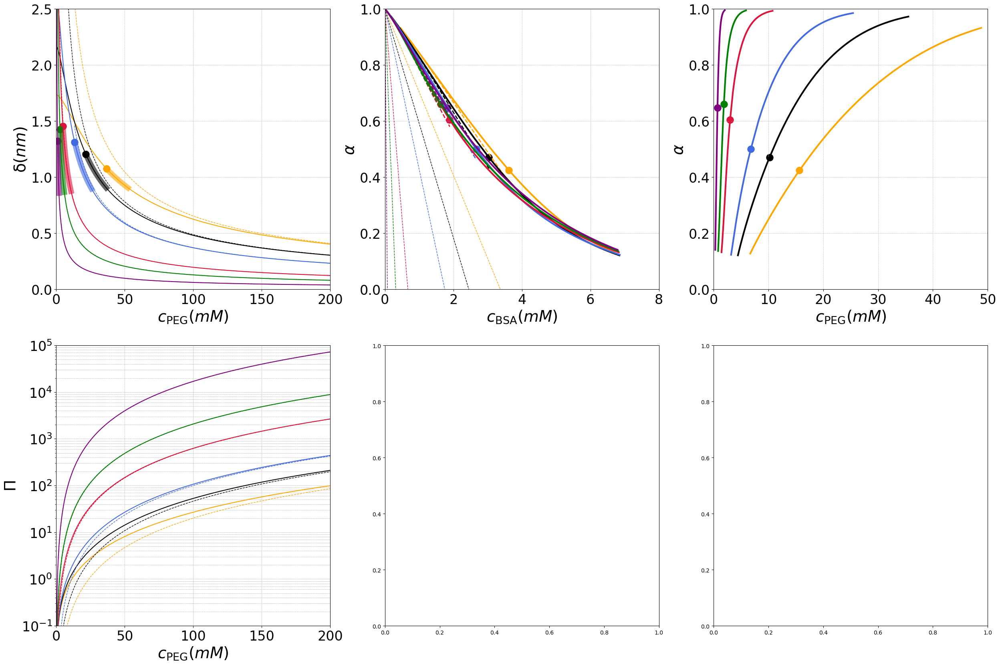

In [ ]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

axes[0][0].set_xlim(0,200)
axes[0][0].set_ylim(0,2.5)
axes[0][0].tick_params(axis='x', labelsize=24)
axes[0][0].tick_params(axis='y', labelsize=24)
axes[0][0].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[0][0].set_ylabel(r'$\mathrm{\delta} (nm)$',fontsize = 28)
axes[0][0].grid(True, which='both', ls='--', lw=0.5)

axes[0][1].set_xlim(0,8)
axes[0][1].set_ylim(0,1)
axes[0][1].tick_params(axis='x', labelsize=24)
axes[0][1].tick_params(axis='y', labelsize=24)
axes[0][1].set_xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
axes[0][1].set_ylabel(r'$\alpha$',fontsize = 28)
axes[0][1].grid(True, which='both', ls='--', lw=0.5)

axes[0][2].set_xlim(0,50)
axes[0][2].set_ylim(0,1)
axes[0][2].tick_params(axis='x', labelsize=24)
axes[0][2].tick_params(axis='y', labelsize=24)
axes[0][2].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[0][2].set_ylabel(r'$\alpha$',fontsize = 28)
axes[0][2].grid(True, which='both', ls='--', lw=0.5)

axes[1][0].set_xlim(0,200)
axes[1][0].set_ylim(0.1,1e5)
axes[1][0].tick_params(axis='x', labelsize=24)
axes[1][0].tick_params(axis='y', labelsize=24)
axes[1][0].set_xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
axes[1][0].set_ylabel(r'$\mathrm{\Pi}$',fontsize = 28)
axes[1][0].grid(True, which='both', ls='--', lw=0.5)
axes[1][0].set_yscale('log')

def d_Rg(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rp = {rpeg*1e9:.2f} nm'

    q=rpeg/rbsa
    # qq=q**-1.3
    
    # qq=q**-(1/gamma)

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(phi_R[0]/3), 2000, 100000)
    # plt.plot([phi_PEG for phi_PEG in PhiR], [q**(0.44)*0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG for phi_PEG in PhiR], [(q**0.12)*0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [rbsa*1e9*0.865*q**0.88/(1 + 3.95*Phi_pol**1.54)**0.44 for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*q**0.88/(3.95*Phi_pol**1.54)**0.44 for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    ax.scatter(phi_R[-1]*phix_peg, rbsa*1e9*qx_Drop_p[-1], label='Droplet Total', color=pcolor, s=150)
    ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.6)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PEG_Drop], [rbsa*1e9*qx for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=5)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in PEG_Sup], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=5)


def pi_scale(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;
    gamma = 0.698

    PhiR = np.linspace(0, 2000, 100000)
    Phi_R_approx = np.linspace(np.round(phi_R[0]/3), 2000, 100000)
    pinu = [q**-3*(y + 1.62*y**(3*gamma)) for y in PhiR]
    
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [q**-3*(y + 1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor)
    ax.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [q**-3*(1.62*y**(3*gamma)) for y in PhiR], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in Phi_R_approx], [rbsa*1e9*0.865*(q/(3.95*Phi_pol**1.54)**(1/2))**(0.88) for Phi_pol in Phi_R_approx], label='Droplet Total', color=pcolor,linestyle='--', linewidth=1)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # ax.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [rbsa*1e9*qx for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)


def a_plot(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;
    Phi_BSA_range = np.linspace(0, 0.6, 1000)
    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]
    # plt.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    ax.scatter(BSA_Drop[-1], a_Drop[-1], color=pcolor, s=150, marker='o')
    ax.plot([phi for phi in BSA_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor, linewidth=3)
    ax.plot([phi for phi in BSA_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=3)
    ax.plot(BSA_Sup, [1-phi*(1+qx)**3 for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=2, linestyle='--')
    ax.plot([phi*phix_bsa for phi in Phi_BSA_range], [1-phi*(1+q)**3 for phi in Phi_BSA_range], label='Droplet Total', color=pcolor, linewidth=1, linestyle='--')
    # ax.plot([phi for phi in BSA_Drop], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Drop_p, Phi_BSA_Drop)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')
    # ax.plot([phi for phi in BSA_Sup], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')

def a_plot_peg(gfvt_out, pcolor, plabel, ax):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, cp_list, tp, tp_list, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, guess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]
    # plt.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    ax.scatter(PEG_Drop[-1], a_Drop[-1], color=pcolor ,s=150, marker='o')
    ax.plot([phi for phi in PEG_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor, linewidth=3)
    ax.plot([phi for phi in PEG_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=3)
    # ax.plot([phi for phi in BSA_Drop], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Drop_p, Phi_BSA_Drop)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')
    # ax.plot([phi for phi in BSA_Sup], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')


d_Rg(gfvt4K_200mM_Z0, 'orange', 'PEG 4K', axes[0][0])
d_Rg(gfvt6K_200mM_Z0, 'black', 'PEG 6K', axes[0][0])
d_Rg(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K', axes[0][0])
d_Rg(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K', axes[0][0])
d_Rg(gfvt35K_200mM_Z0, 'green', 'PEG 35K', axes[0][0])
d_Rg(gfvt100K_200mM_Z0, 'purple', 'PEG 100K', axes[0][0])
# d_Rg(gfvtQ10_200mM_Z0, 'magenta', 'Q10', axes[0][0])
# d_Rg(gfvtQ16_200mM_Z0, 'cyan', 'Q15', axes[0][0])

pi_scale(gfvt4K_200mM_Z0, 'orange', 'PEG 4K', axes[1][0])
pi_scale(gfvt6K_200mM_Z0, 'black', 'PEG 6K', axes[1][0])
pi_scale(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K', axes[1][0])
pi_scale(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K', axes[1][0])
pi_scale(gfvt35K_200mM_Z0, 'green', 'PEG 35K', axes[1][0])
pi_scale(gfvt100K_200mM_Z0, 'purple', 'PEG 100K', axes[1][0])
# pi_scale(gfvtQ10_200mM_Z0, 'magenta', 'Q10', axes[1][0])
# pi_scale(gfvtQ16_200mM_Z0, 'cyan', 'Q15', axes[1][0])

a_plot(gfvt4K_200mM_Z0, 'orange', 'PEG 4K', axes[0][1])
a_plot(gfvt6K_200mM_Z0, 'black', 'PEG 6K', axes[0][1])
a_plot(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K', axes[0][1])
a_plot(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K', axes[0][1])
a_plot(gfvt35K_200mM_Z0, 'green', 'PEG 35K', axes[0][1])
a_plot(gfvt100K_200mM_Z0, 'purple', 'PEG 100K', axes[0][1])
# a_plot(gfvtQ10_200mM_Z0, 'magenta', 'Q10', axes[0][1])
# a_plot(gfvtQ16_200mM_Z0, 'cyan', 'Q15', axes[0][1])

a_plot_peg(gfvt4K_200mM_Z0, 'orange', 'PEG 4K', axes[0][2])
a_plot_peg(gfvt6K_200mM_Z0, 'black', 'PEG 6K', axes[0][2])
a_plot_peg(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K', axes[0][2])
a_plot_peg(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K', axes[0][2])
a_plot_peg(gfvt35K_200mM_Z0, 'green', 'PEG 35K', axes[0][2])
a_plot_peg(gfvt100K_200mM_Z0, 'purple', 'PEG 100K', axes[0][2])
# a_plot_peg(gfvtQ10_200mM_Z0, 'magenta', 'Q10', axes[0][2])
# a_plot_peg(gfvtQ16_200mM_Z0, 'cyan', 'Q15', axes[0][2])



# plt.savefig(date_string+'_Pi_Mu_a_Z0.png')
# plt.savefig(date_string+'_Pi_Mu_a_Z0.eps')

## Volume Fraction

### Free Volume Fraction

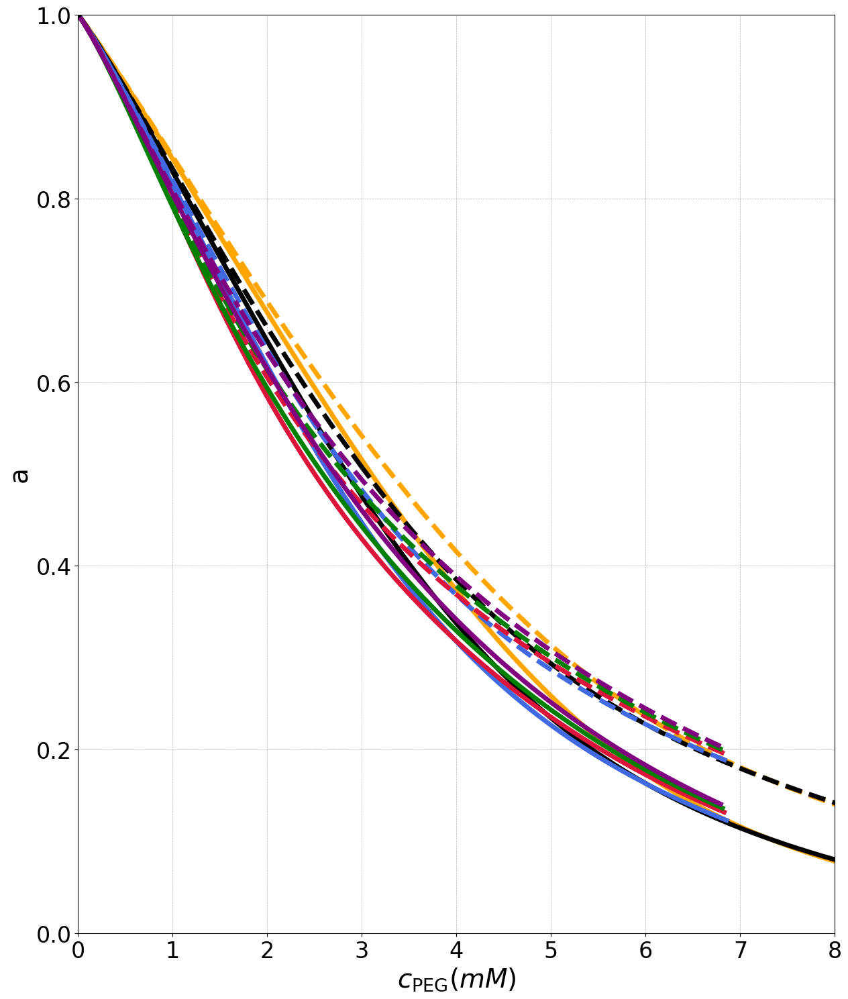

In [ ]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)

plt.xlim(0,8)
plt.ylim(0,1)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.ylabel(r'a',fontsize = 28)
plt.tight_layout()

def a_plot(gfvt_out, pcolor, plabel):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, cp, tp, params = gfvt_out

    rbsa, rpeg, mbsa_in, mpeg_in, solvent, N_steps, PhiP_min, PhiP_max, outguess_c, outguess_tp, guess_b, TC, phix_bsa, phix_peg = params
    q = rpeg/rbsa;

    Phi_BSA_Drop = [phi/phix_bsa for phi in BSA_Drop]
    Phi_BSA_Sup = [phi/phix_bsa for phi in BSA_Sup]
    # plt.plot([phi_PEG*phix_peg for phi_PEG in PhiR], [0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)/q for Phi_pol in PhiR], label='Droplet Total', color=pcolor)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Drop_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    # plt.plot([phi_PEG*phix_peg for phi_PEG in phi_R], [qx/q for qx in qx_Sup_p], label='Droplet Total', color=pcolor, linewidth=10, alpha=0.3)
    plt.plot([phi for phi in BSA_Drop], [a for a, phi in zip(a_Drop, PEG_Drop)], label='Droplet Total', color=pcolor, linewidth=5)
    plt.plot([phi for phi in BSA_Sup], [a for a, phi in zip(a_Sup,PEG_Sup)], label='Droplet Total', color=pcolor, linewidth=5)
    plt.plot([phi for phi in BSA_Drop], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Drop_p, Phi_BSA_Drop)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')
    plt.plot([phi for phi in BSA_Sup], [(1-phi)*np.exp(-((1+qx)**3-1)*(phi/(1-phi))) for qx, phi in zip(qx_Sup_p, Phi_BSA_Sup)], label='Droplet Total', color=pcolor, linewidth=5, linestyle='--')


a_plot(gfvt4K_200mM_Z0, 'orange', 'PEG 4K')
a_plot(gfvt6K_200mM_Z0, 'black', 'PEG 6K')
a_plot(gfvt8K_200mM_Z0, 'royalblue', 'PEG 8K')
a_plot(gfvt20K_200mM_Z0, 'crimson', 'PEG 20K')
a_plot(gfvt35K_200mM_Z0, 'green', 'PEG 35K')
a_plot(gfvt100K_200mM_Z0, 'purple', 'PEG 100K')
# a_plot(gfvtQ10_200mM_Z0, 'magenta', 'Q10')
# a_plot(gfvtQ16_200mM_Z0, 'cyan', 'Q15')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.savefig(date_string+'_Pi_Mu_a_Z0.png')
# plt.savefig(date_string+'_Pi_Mu_a_Z0.eps')

# Old Scaling Codes

## SIM Jungbauer

ValueError: too many values to unpack (expected 25)

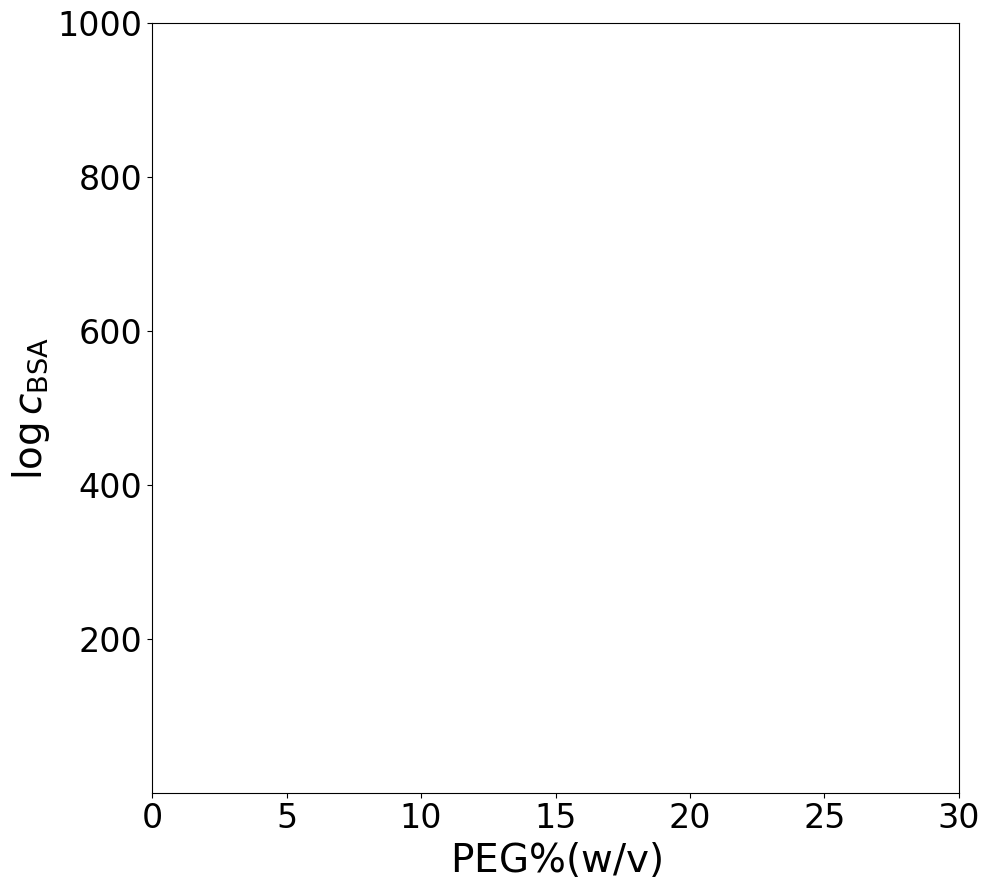

In [121]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (10,9))  #width x height, aspect ratio 0.85 (0.87)

plt.xlim(0,30)
plt.ylim(1e0,1e3)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$\mathrm{PEG \%(w/v)}$',fontsize = 28)
plt.ylabel(r'$\log c_\mathrm{BSA}$',fontsize = 28)
plt.tight_layout()

def logy(gfvt_out, mbsa, mpeg, fitrange, pcolor, plabel):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, params = gfvt_out

    params = gfvt_out[-1];
    rbsa = params[0]*1e9;
    rpeg = params[1]*1e9;
    q = rpeg/rbsa;

    # print(rpeg)
    
    k1 = 24*np.pi/np.log(10)
    beta = k1*rpeg**2/(mpeg*1000)*rbsa

    phixbsa = params[-2];
    phixpeg = params[-1];
    rbsa = params[0];
    rpeg = params[1];
    solvent = params[3];

    PEGrange = np.linspace(0,50,100)
    PEGrange_lim = np.linspace(fitrange[0],fitrange[1],100)

    cPEG = np.asarray([c_PEG*mpeg/10 for c_PEG in PEG_Sup])
    S = np.asarray([c_BSA*mbsa for c_BSA in BSA_Sup])
    lgS = np.asarray([np.log(s) for s in S])
    
    cPEG_lim = [c for c, s in zip(cPEG, lgS) if fitrange[0] < c < fitrange[1]]
    lgS_lim = [s for c, s in zip(cPEG, lgS) if fitrange[0] < c < fitrange[1]]
        
    # Perform linear fit
    logfit_S,residuals,_,_,_ = np.polyfit(cPEG_lim, lgS_lim, 1,full=True)  # Degree 1 polynomial (linear fit)
    slope_S, intercept_S = logfit_S
    print(f"Beta: {slope_S:.2f}, Intercept: {intercept_S:.2f}")
    print(f"Beta Theory: {beta:.2f}")

    lgS_fit =  [np.exp(intercept_S+x*slope_S) for x in PEGrange]
    lgS_fit_lim =  [np.exp(intercept_S+x*slope_S) for x in PEGrange_lim]
    # lgrp_PEG =  [intercept_rg_lin + x*slope_rg_lin for x in mwrange]
    
    plt.semilogy(cPEG, S, label='Sup', color=pcolor)
    # plt.semilogy(cPEG, [10**(-beta*c_PEG*mpeg/10+2) for c_PEG in PEG_Sup], linestyle='--', label='Sup', color=pcolor)
    plt.semilogy(PEGrange, lgS_fit, linestyle='--', label='Sup', color=pcolor)
    plt.semilogy(PEGrange_lim, lgS_fit_lim, linestyle='--', label='Sup', color='red')


def logS_plot_dat(data, plabel, pcolor):
    
    BN_BSA_sup = data[:,2]
    BN_BSA_sup_err = data[:,3]

    BN_PEG_sup = data[:,8]/10
    BN_PEG_sup_err = data[:,9]/10
    
    # Plot with adjusted cap thickness
    # plt.errorbar(BN_PEG_sup, BN_BSA_sup, yerr=BN_PEG_sup_err, xerr=BN_BSA_sup_err, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')
    plt.scatter(BN_PEG_sup, BN_BSA_sup, s=250, c=pcolor, label=plabel + ' binodal')
    plt.yscale('log')
    # plt.semilogy(BN_PEG_sup, BN_BSA_sup, markersize=12,fmt='o', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' binodal')

logy(gfvt4K_200mM_Z0, mbsa, mpeg4, [15, 25], 'orange', 'PEG 4K')
logy(gfvt6K_200mM_Z0, mbsa, mpeg6, [15, 25], 'black', 'PEG 6K')
logy(gfvt8K_200mM_Z0, mbsa, mpeg8, [12, 22], 'royalblue', 'PEG 8K')
logy(gfvt20K_200mM_Z0, mbsa, mpeg20, [8, 25], 'crimson', 'PEG 20K')
logy(gfvt35K_200mM_Z0, mbsa, mpeg35, [8, 25], 'green', 'PEG 35K')
logy(gfvt100K_200mM_Z0, mbsa, mpeg100, [8, 25], 'purple', 'PEG 100K')

logS_plot_dat(data_4K_pH7_200mM_MA3, f'4K, pH 7, 200 mM KCl, ', 'orange')
logS_plot_dat(data_6K_pH7_200mM_SD, f'6K, pH 7, 200 mM KCl, ', 'black')
logS_plot_dat(data_8K_pH7_200mM_SD, f'8K, pH 7, 200 mM KCl, ', 'royalblue')
logS_plot_dat(data_20K_pH7_200mM, f'20K, pH 7, 200 mM KCl, ', 'crimson')
logS_plot_dat(data_35K_pH7_200mM, f'35K, pH 7, 200 mM KCl, ', 'green')
logS_plot_dat(data_100K_pH7_200mM, f'100K, pH 7, 200 mM KCl, ', 'purple')

plt.grid(True, which='both', ls='--', lw=0.5)

# plt.savefig(date_string+'_Pi_Mu_a_Z0.png')
# plt.savefig(date_string+'_Pi_Mu_a_Z0.eps')

## scale_dat_binodal()

In [ ]:
def scale_dat_binodal(data, ax, plabel, pcolor, rbsa, rpeg, solvent, mbsa=0, mpeg=0):
    
    q = rpeg/rbsa

    rpeg = rpeg*1e9
    rbsa = rbsa*1e9
    
    vbsa = (4/3*np.pi*rbsa**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)

    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            
        a = 3*qx+3*qx**2 + qx**3
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        return a*y + b*y**2 + c*y**3
    
    
    if mbsa == 0 or mpeg == 0:

        BN_BSA_sup = data[:,2]
        BN_BSA_sup_err = data[:,3]
        BN_BSA_drop = data[:,4]
        BN_BSA_drop_err = data[:,5]

        BN_PEG_sup = data[:,8]
        BN_PEG_sup_err = data[:,9]
        BN_PEG_drop = data[:,10]
        BN_PEG_drop_err = data[:,11]
        
        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]
        
    else:

        BN_BSA_sup = data[:,2]/mbsa
        BN_BSA_sup_err = data[:,3]/mbsa
        BN_BSA_drop = data[:,4]/mbsa
        BN_BSA_drop_err = data[:,5]/mbsa

        BN_PEG_sup = data[:,8]/mpeg
        BN_PEG_sup_err = data[:,9]/mpeg
        BN_PEG_drop = data[:,10]/mpeg
        BN_PEG_drop_err = data[:,11]/mpeg


        CP_BSA = data[:,12]/mbsa
        # CP_BSA_err = data[:,13]/mbsa
        CP_PEG = data[:,14]/mpeg
        # CP_PEG_err = data[:,15]/mpeg

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vbsa
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))
    
    BN_BSA_sup_exc = [np.log10(cbsa) for cbsa in BN_BSA_sup]
    PEG_Sup_exc = [cpeg*(rpeg/(rbsa+rbsa*0.865*(q/(1 + 3.95*(cpeg*vpeg)**1.54)**(1/2))**(0.88)))**3 for cpeg, cbsa in zip(BN_PEG_sup,BN_BSA_sup)]
    # PhiR_Sup = [cpeg/get_a0(cbsa, cpeg, q, solvent)*vpeg for cpeg, cbsa in zip(BN_PEG_sup,BN_BSA_sup)]
    
    
    BN_BSA_drop_exc = [np.log10(cbsa) for cbsa in BN_BSA_drop]
    PEG_Drop_exc = [cpeg*(rpeg/(rbsa+rbsa*0.865*(q/(1 + 3.95*(cpeg*vpeg)**1.54)**(1/2))**(0.88)))**3 for cpeg, cbsa in zip(BN_PEG_drop,BN_BSA_drop)]
    # PhiR_Drop = [cpeg/get_a0(cbsa, cpeg, q, solvent)*vpeg for cpeg, cbsa in zip(BN_PEG_drop,BN_BSA_drop)]
    
    # Plot with adjusted cap thickness
    ax[0].scatter(BN_BSA_sup, PEG_Sup_exc, c=pcolor, label=full_label, s=240)
    # ax[0].scatter(BN_BSA_sup, PEG_Sup_exc2, c=pcolor, marker="X", s=240)
    # ax[0].scatter(BN_BSA_sup, PEG_Sup_exc3, c=pcolor, marker="s", s=240)

    ax[0].scatter(BN_BSA_drop, PEG_Drop_exc, c=pcolor, label=full_label, s=240)
    # ax[0].scatter(BN_BSA_drop, PEG_Drop_exc2, c=pcolor, marker="X", s=240)
    # ax[0].scatter(BN_BSA_drop, PEG_Drop_exc3, c=pcolor, marker="s", s=240)

    ax[0].grid(True, which='both', ls='--', lw=0.5)
    ax[1].grid(True, which='both', ls='--', lw=0.5)

    ax[1].scatter(BN_BSA_sup, PEG_Sup_exc, c=pcolor, label=full_label)
    ax[1].scatter(BN_BSA_drop, PEG_Drop_exc, c=pcolor,)
    
    return

def scale_dat_binodal_a(data, ax, plabel, pcolor, rbsa, rpeg, solvent, mbsa=0, mpeg=0):
    
    q = rpeg/rbsa

    vbsa = (4/3*np.pi*rbsa**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)
    
    rpeg = rpeg*1e9
    rbsa = rbsa*1e9


    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)

    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            
        a = 3*qx+3*qx**2 + qx**3
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        return a*y + b*y**2 + c*y**3
    
    
    if mbsa == 0 or mpeg == 0:

        BN_BSA_sup = data[:,2]
        BN_BSA_sup_err = data[:,3]
        BN_BSA_drop = data[:,4]
        BN_BSA_drop_err = data[:,5]

        BN_PEG_sup = data[:,8]
        BN_PEG_sup_err = data[:,9]
        BN_PEG_drop = data[:,10]
        BN_PEG_drop_err = data[:,11]
        
        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]
        
    else:

        BN_BSA_sup = data[:,2]/mbsa
        BN_BSA_sup_err = data[:,3]/mbsa
        BN_BSA_drop = data[:,4]/mbsa
        BN_BSA_drop_err = data[:,5]/mbsa

        BN_PEG_sup = data[:,8]/mpeg
        BN_PEG_sup_err = data[:,9]/mpeg
        BN_PEG_drop = data[:,10]/mpeg
        BN_PEG_drop_err = data[:,11]/mpeg


        CP_BSA = data[:,12]/mbsa
        # CP_BSA_err = data[:,13]/mbsa
        CP_PEG = data[:,14]/mpeg
        # CP_PEG_err = data[:,15]/mpeg

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vbsa
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))
    
    BN_BSA_sup_exc = [cbsa for cbsa in BN_BSA_sup]
    PEG_Sup_exc = [get_a(cbsa, cpeg, q, solvent)*cpeg*rpeg**2 for cpeg, cbsa in zip(BN_PEG_sup,BN_BSA_sup)]
    
    BN_BSA_drop_exc = [cbsa for cbsa in BN_BSA_drop]
    PEG_Drop_exc = [get_a(cbsa, cpeg, q, solvent)*cpeg*rpeg**2 for cpeg, cbsa in zip(BN_PEG_drop,BN_BSA_drop)]
    
    # Plot with adjusted cap thickness
    ax[0].scatter(BN_BSA_sup, PEG_Sup_exc, c=pcolor, label=full_label, s=240)
    ax[0].scatter(BN_BSA_drop, PEG_Drop_exc, c=pcolor, label=full_label, s=240)

    ax[0].grid(True, which='both', ls='--', lw=0.5)
    ax[1].grid(True, which='both', ls='--', lw=0.5)

    ax[1].scatter(BN_BSA_sup, PEG_Sup_exc, c=pcolor, label=full_label, s=240)
    ax[1].scatter(BN_BSA_drop, PEG_Drop_exc, c=pcolor, s=240)

    
    return

## binodal_scaling_plots()

In [ ]:
def binodal_scaling_plots(gfvt_out, axes, pcolor, plabel, form, scheme = 'gfvt'):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, params = gfvt_out

    # params = [Rpr_in, Rpol_in, mbsa, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg]
    params = gfvt_out[-1];

    phixbsa = params[-2];
    phixpeg = params[-1];
    rbsa = params[0];
    rpeg = params[1];
    solvent = params[3]
    
    q = rpeg/rbsa;

    rpeg = rpeg*1e9
    rbsa = rbsa*1e9

    phi_BSA_Sup = BSA_Sup/phixbsa
    phi_BSA_Drop = BSA_Drop/phixbsa

    phi_PEG_Sup = PEG_Sup/phixpeg
    phi_PEG_Drop = PEG_Drop/phixpeg

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)


    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            
        a = (1+qx)**3 -1
        a = 3*qx
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        Q3 = a*y + b*y**2 + c*y**3
        Q2 = a*y + b*y**2
        Q1 = a*y
        
        return [Q1, Q2, Q3]

    def Qfvt(Phi, Phi_pol, q):
        
        y = Phi/(1-Phi)
            
        a = 3*q+3*q**2 + q**3
        b = 9/2*q**2+3*q**3
        c = 3*q**3

        Q3 = a*y + b*y**2 + c*y**3
        Q2 = a*y + b*y**2
        Q1 = a*y
        
        return [Q1, Q2, Q3]
    
    def get_a(cbsa, Phi_pol_R, q, solvent, ii):

        Phi = cbsa/phixbsa

        Q1, Q2, Q3 = Qf(Phi, Phi_pol_R, q, solvent)

        if ii == 3:
            a = (1 - Phi)*np.exp(-Q3)
        elif ii == 2:
            a = (1 - Phi)*np.exp(-Q2)
        elif ii == 1:
            a = (1 - Phi)*np.exp(-Q1)
        
        return a

    def get_a_fvt(cbsa, Phi_pol_R, q, ii):

        Phi = cbsa/phixbsa

        Q1, Q2, Q3 = Qfvt(Phi, Phi_pol_R, q)

        if ii == 3:
            a = (1 - Phi)*np.exp(-Q3)
        elif ii == 2:
            a = (1 - Phi)*np.exp(-Q2)
        elif ii == 1:
            a = (1 - Phi)*np.exp(-Q1)
        
        return a
        
    PEG_Sup_exc = [a*cpeg*rpeg**2 for cpeg, cbsa, a, phiR in zip(PEG_Sup, BSA_Sup, a_Sup, phi_R)]
    BSA_Sup_exc = [cbsa for cbsa in BSA_Sup]
        
    PEG_Drop_exc = [a*cpeg*rpeg**2 for cpeg, cbsa, a, phiR in zip(PEG_Drop,BSA_Drop, a_Drop, phi_R)]
    BSA_Drop_exc = [cbsa for cbsa in BSA_Drop]

    axes[0].loglog(BSA_Sup_exc, PEG_Sup_exc, label=plabel + ' Supernatant', color=pcolor, linestyle=form)
    axes[0].loglog(BSA_Drop_exc, PEG_Drop_exc, label=plabel + ' Drop', color=pcolor, linestyle=form)
    
    axes[1].plot(BSA_Sup_exc, PEG_Sup_exc, label=plabel + ' Supernatant', color=pcolor, linestyle=form)
    axes[1].plot(BSA_Drop_exc, PEG_Drop_exc, label=plabel + ' Drop', color=pcolor, linestyle=form)



## good solvent scaling plots

PEG 4KRbsa = 3000000000.00 nm, Rpol = 1900000000.00 nm, q = 0.63, good solvent GFVT binodal
PEG 6KRbsa = 3000000000.00 nm, Rpol = 2450000000.00 nm, q = 0.82, good solvent GFVT binodal
PEG 8KRbsa = 3000000000.00 nm, Rpol = 3100000000.00 nm, q = 1.03, good solvent GFVT binodal
PEG 20KRbsa = 3000000000.00 nm, Rpol = 5400000000.00 nm, q = 1.80, good solvent GFVT binodal
PEG 35KRbsa = 3000000000.00 nm, Rpol = 7800000000.00 nm, q = 2.60, good solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 1850000000.00 nm, q = 0.62, good solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 1850000000.00 nm, q = 0.62, good solvent GFVT binodal
6K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 2450000000.00 nm, q = 0.82, good solvent GFVT binodal
8K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 3100000000.00 nm, q = 1.03, good solvent GFVT binodal
20K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 5000000000.00 nm, q = 1.67, good solvent GFVT binodal
35K, pH

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


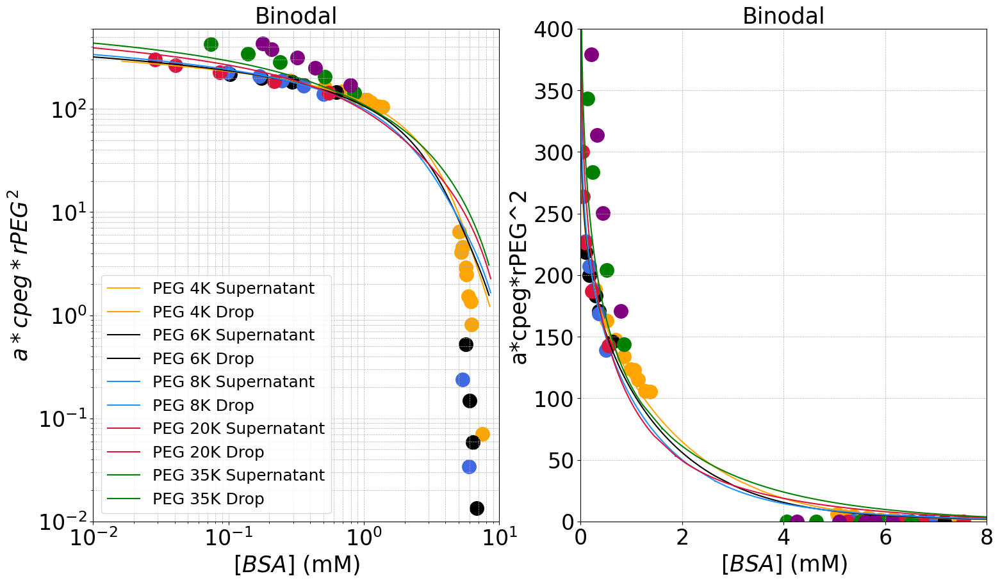

In [ ]:
# fig, axes = plt.subplots(1, 3, figsize=(30, 12))
fig, axes = plt.subplots(1, 2, figsize=(18, 10))

scheme = 'a'

binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-', scheme)
binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-', scheme)
binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-', scheme)
binodal_scaling_plots(gfvt20K_200mM_Z0, axes, 'crimson', 'PEG 20K', '-', scheme)
binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-', scheme)

axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_title("Binodal", fontsize = 25)
axes[0].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[0].set_ylabel("$a*cpeg*rPEG^2$", fontsize = 25)
axes[0].set_xlim(1e-2,1e1)
axes[0].set_ylim(1e-2,6e2)
axes[0].legend(fontsize = 18)
axes[0].grid(True, which='both', ls='--', lw=0.5)

scale_dat_binodal_a(data_4K_pH7_200mM, axes, '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal_a(data_4K_pH7_200mM_MA2, axes, '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal_a(data_6K_pH7_200mM_SD, axes, '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'good', mbsa, mpeg6)
scale_dat_binodal_a(data_8K_pH7_200mM_SD, axes, '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'good', mbsa, mpeg8)
scale_dat_binodal_a(data_20K_pH7_200mM, axes, '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'good', mbsa, mpeg20)
scale_dat_binodal_a(data_35K_pH7_200mM, axes, '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'good', mbsa, mpeg35)
scale_dat_binodal_a(data_100K_pH7_200mM, axes, '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'good', mbsa, mpeg100)

axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_title("Binodal", fontsize = 25)
axes[1].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[1].set_ylabel("a*cpeg*rPEG^2", fontsize = 25)
axes[1].set_xlim(0,8)
axes[1].set_ylim(0,400)
axes[1].grid(True, which='both', ls='--', lw=0.5)

plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.png')
plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.eps')

## calculate free volume fraction for phi_pol = 0

PEG 4KRbsa = 3.00 nm, Rpol = 1.90 nm, q = 0.63, good solvent GFVT binodal
PEG 6KRbsa = 3.00 nm, Rpol = 2.45 nm, q = 0.82, good solvent GFVT binodal
PEG 8KRbsa = 3.00 nm, Rpol = 3.10 nm, q = 1.03, good solvent GFVT binodal
PEG 20KRbsa = 3.00 nm, Rpol = 5.40 nm, q = 1.80, good solvent GFVT binodal
PEG 35KRbsa = 3.00 nm, Rpol = 7.80 nm, q = 2.60, good solvent GFVT binodal
PEG 100KRbsa = 3.00 nm, Rpol = 14.80 nm, q = 4.93, good solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 1850000000.00 nm, q = 0.62, good solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 1850000000.00 nm, q = 0.62, good solvent GFVT binodal
6K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 2450000000.00 nm, q = 0.82, good solvent GFVT binodal
8K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 3100000000.00 nm, q = 1.03, good solvent GFVT binodal
20K, pH 7, 200 mM KClRbsa = 3000000000.00 nm, Rpol = 5000000000.00 nm, q = 1.67, good solvent GFVT binodal
35K, pH 7, 200 mM KC

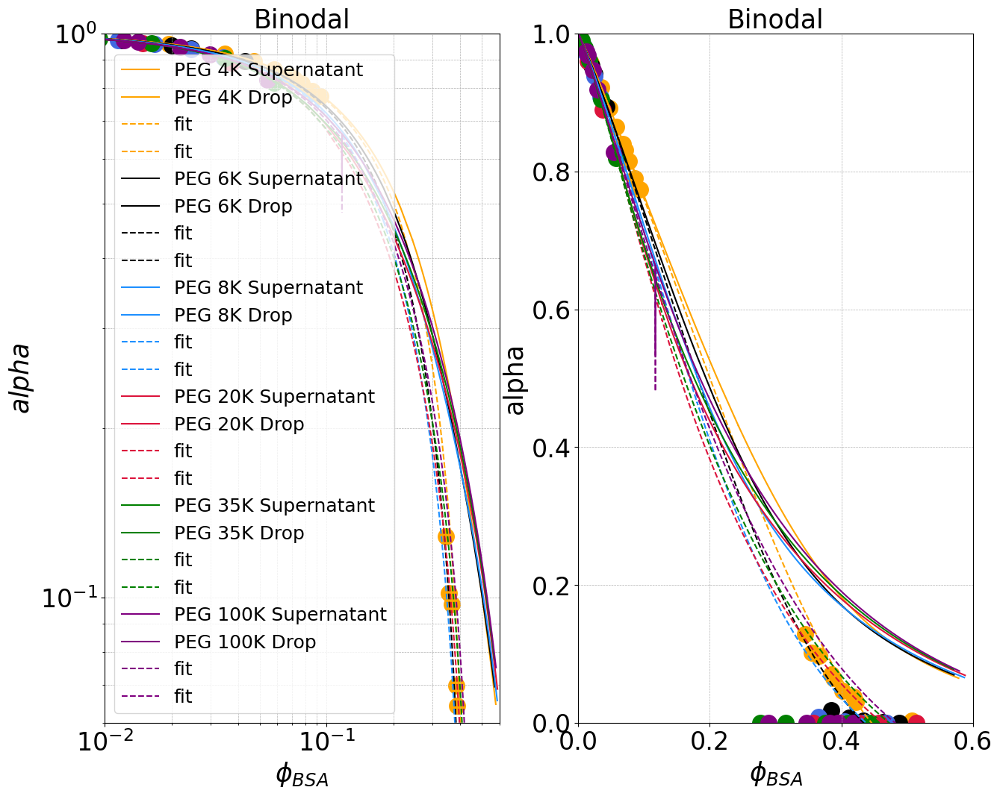

In [ ]:
def alpha_plots(gfvt_out, axes, pcolor, plabel, form, fitrange):
    phi_R, BSA_Drop, PEG_Drop, a_Drop, BSA_Sup, PEG_Sup, a_Sup, qx_Drop_p, dPidPhiP_Drop_p, qx_Sup_p, dPidPhiP_Sup_p, Pi_Drop, P0_Drop, Pp_Drop, Mu_Drop, Mu_Drop, Mu0_Drop, MuR_Drop, Pi_Sup, P0_Sup, Pp_Sup, Mu_Sup, Mu0_Sup, MuR_Sup, params = gfvt_out

    # params = [Rpr_in, Rpol_in, mbsa, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b, TC, phix_bsa, phix_peg]
    params = gfvt_out[-1];

    phixbsa = params[-2];
    phixpeg = params[-1];
    rbsa = params[0];
    rpeg = params[1];
    solvent = params[3]
    
    q = rpeg/rbsa;

    phi_BSA_Sup = BSA_Sup/phixbsa
    phi_BSA_Drop = BSA_Drop/phixbsa

    phi_PEG_Sup = PEG_Sup/phixpeg
    phi_PEG_Drop = PEG_Drop/phixpeg

    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)

    rpeg = rpeg*1e9
    rbsa = rbsa*1e9


    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            
        a = (1+qx)**3 -1
        a = 3*qx
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        Q3 = a*y + b*y**2 + c*y**3
        Q2 = a*y + b*y**2
        Q1 = a*y
        
        return [Q1, Q2, Q3]

    def Qfvt(Phi, Phi_pol, q):
        
        y = Phi/(1-Phi)
            
        a = 3*q+3*q**2 + q**3
        b = 9/2*q**2+3*q**3
        c = 3*q**3

        Q3 = a*y + b*y**2 + c*y**3
        Q2 = a*y + b*y**2
        Q1 = a*y
        
        return [Q1, Q2, Q3]
    
    def get_a(cbsa, Phi_pol_R, q, solvent, ii):

        Phi = cbsa/phixbsa

        Q1, Q2, Q3 = Qf(Phi, Phi_pol_R, q, solvent)

        if ii == 3:
            a = (1 - Phi)*np.exp(-Q3)
        elif ii == 2:
            a = (1 - Phi)*np.exp(-Q2)
        elif ii == 1:
            a = (1 - Phi)*np.exp(-Q1)
        
        return a

    def get_a_fvt(cbsa, Phi_pol_R, q, ii):

        Phi = cbsa/phixbsa

        Q1, Q2, Q3 = Qfvt(Phi, Phi_pol_R, q)

        if ii == 3:
            a = (1 - Phi)*np.exp(-Q3)
        elif ii == 2:
            a = (1 - Phi)*np.exp(-Q2)
        elif ii == 1:
            a = (1 - Phi)*np.exp(-Q1)
        
        return a
        
    PEG_Sup_exc = [a for cpeg, cbsa, a, phiR in zip(PEG_Sup, phi_BSA_Sup, a_Sup, phi_R)]
    BSA_Sup_exc = [cbsa for cbsa in phi_BSA_Sup]
        
    PEG_Drop_exc = [a for cpeg, cbsa, a, phiR in zip(PEG_Drop, phi_BSA_Drop, a_Drop, phi_R)]
    BSA_Drop_exc = [cbsa for cbsa in phi_BSA_Drop]

    axes[0].loglog(BSA_Sup_exc, PEG_Sup_exc, label=plabel + ' Supernatant', color=pcolor, linestyle=form)
    axes[0].loglog(BSA_Drop_exc, PEG_Drop_exc, label=plabel + ' Drop', color=pcolor, linestyle=form)
    
    axes[1].plot(BSA_Sup_exc, PEG_Sup_exc, label=plabel + ' Supernatant', color=pcolor, linestyle=form)
    axes[1].plot(BSA_Drop_exc, PEG_Drop_exc, label=plabel + ' Drop', color=pcolor, linestyle=form)

    PHIrange = np.linspace(0,1,100)
    # PEGrange_lim = np.linspace(fitrange[0],fitrange[1],100)
    
    BSA_Sup_fit = [c for c, s in zip(BSA_Sup_exc, PEG_Sup_exc) if fitrange[0] < c < fitrange[1]]
    PEG_Sup_fit = [s for c, s in zip(BSA_Sup_exc, PEG_Sup_exc) if fitrange[0] < c < fitrange[1]]
        
    # # Perform linear fit
    fit_a,residuals,_,_,_ = np.polyfit(BSA_Sup_fit, PEG_Sup_fit, 1,full=True)  # Degree 1 polynomial (linear fit)
    slope_a, intercept_a = fit_a
    # print(f"Beta: {slope_S:.2f}, Intercept: {intercept_S:.2f}")
    # print(f"Beta Theory: {beta:.2f}")

    # lgS_fit =  [np.exp(intercept_S+x*slope_S) for x in PEGrange]
    a_fit_lin =  [intercept_a + x*slope_a for x in PHIrange]
    # # lgrp_PEG =  [intercept_rg_lin + x*slope_rg_lin for x in mwrange]
    
    # plt.plot(PHIrange, a_fit_lin, label='fit', color=pcolor, linestyle='--')

    a_lin_Sup = [1-cbsa*(1 + qq)**3 for cbsa, qq in zip(BSA_Sup_exc,qx_Sup_p)]
    a_lin_Drop = [1-cbsa*(1 + qq)**3 for cbsa, qq in zip(BSA_Drop_exc, qx_Drop_p)]

    axes[0].loglog(BSA_Sup_exc, a_lin_Sup, label='fit', color=pcolor, linestyle='--')
    axes[0].loglog(BSA_Drop_exc, a_lin_Drop, label='fit', color=pcolor, linestyle='--')
    axes[1].plot(BSA_Sup_exc, a_lin_Sup, label='fit', color=pcolor, linestyle='--')
    axes[1].plot(BSA_Drop_exc, a_lin_Drop, label='fit', color=pcolor, linestyle='--')
    # # plt.semilogy(cPEG, [10**(-beta*c_PEG*mpeg/10+2) for c_PEG in PEG_Sup], linestyle='--', label='Sup', color=pcolor)
    # plt.semilogy(PEGrange, lgS_fit, linestyle='--', label='Sup', color=pcolor)
    # plt.semilogy(PEGrange_lim, lgS_fit_lim, linestyle='--', label='Sup', color='red')


def dat_a(data, ax, plabel, pcolor, rbsa, rpeg, solvent, mbsa=0, mpeg=0):
    
    q = rpeg/rbsa

    vbsa = (4/3*np.pi*rbsa**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)
    
    rpeg = rpeg*1e9
    rbsa = rbsa*1e9


    full_label = plabel + f'Rbsa = {rbsa*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)

    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
            
        a = 3*qx+3*qx**2 + qx**3
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        return a*y + b*y**2 + c*y**3
    
    
    if mbsa == 0 or mpeg == 0:

        BN_BSA_sup = data[:,2]
        BN_BSA_sup_err = data[:,3]
        BN_BSA_drop = data[:,4]
        BN_BSA_drop_err = data[:,5]

        BN_PEG_sup = data[:,8]
        BN_PEG_sup_err = data[:,9]
        BN_PEG_drop = data[:,10]
        BN_PEG_drop_err = data[:,11]
        
        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]

        CP_BSA = data[:,12]
        CP_BSA_err = data[:,13]
        CP_PEG = data[:,14]
        CP_PEG_err = data[:,15]
        
    else:

        BN_BSA_sup = data[:,2]/mbsa
        BN_BSA_sup_err = data[:,3]/mbsa
        BN_BSA_drop = data[:,4]/mbsa
        BN_BSA_drop_err = data[:,5]/mbsa

        BN_PEG_sup = data[:,8]/mpeg
        BN_PEG_sup_err = data[:,9]/mpeg
        BN_PEG_drop = data[:,10]/mpeg
        BN_PEG_drop_err = data[:,11]/mpeg


        CP_BSA = data[:,12]/mbsa
        # CP_BSA_err = data[:,13]/mbsa
        CP_PEG = data[:,14]/mpeg
        # CP_PEG_err = data[:,15]/mpeg

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vbsa
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))
    
    BN_BSA_sup_exc = [cbsa*vbsa for cbsa in BN_BSA_sup]
    PEG_Sup_exc = [get_a(cbsa, cpeg, q, solvent) for cpeg, cbsa in zip(BN_PEG_sup,BN_BSA_sup)]
    
    BN_BSA_drop_exc = [cbsa*vbsa for cbsa in BN_BSA_drop]
    PEG_Drop_exc = [get_a(cbsa, cpeg, q, solvent) for cpeg, cbsa in zip(BN_PEG_drop,BN_BSA_drop)]
    
    # Plot with adjusted cap thickness
    ax[0].scatter(BN_BSA_sup_exc, PEG_Sup_exc, c=pcolor, label=full_label, s=240)
    ax[0].scatter(BN_BSA_drop_exc, PEG_Drop_exc, c=pcolor, label=full_label, s=240)
    
    ax[0].grid(True, which='both', ls='--', lw=0.5)
    ax[1].grid(True, which='both', ls='--', lw=0.5)

    ax[1].scatter(BN_BSA_sup_exc, PEG_Sup_exc, c=pcolor, label=full_label, s=240)
    ax[1].scatter(BN_BSA_drop_exc, PEG_Drop_exc, c=pcolor, s=240)
    
    return

fig, axes = plt.subplots(1, 2, figsize=(15, 12))

alpha_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-', [0, 0.2])
alpha_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-', [0, 0.2])
alpha_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-', [0, 0.15])
alpha_plots(gfvt20K_200mM_Z0, axes, 'crimson', 'PEG 20K', '-', [0, 0.1])
alpha_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-', [0, 0.1])
alpha_plots(gfvt100K_200mM_Z0, axes, 'purple', 'PEG 100K', '-', [0, 0.1])

axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_title("Binodal", fontsize = 25)
axes[0].set_xlabel("$\phi_{BSA}$", fontsize = 25)
axes[0].set_ylabel("$alpha$", fontsize = 25)
axes[0].set_xlim(1e-2,6e-1)
axes[0].set_ylim(6e-2,1)
axes[0].legend(fontsize = 18)
axes[0].grid(True, which='both', ls='--', lw=0.5)

dat_a(data_4K_pH7_200mM, axes, '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
dat_a(data_4K_pH7_200mM_MA2, axes, '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
dat_a(data_6K_pH7_200mM_SD, axes, '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'good', mbsa, mpeg6)
dat_a(data_8K_pH7_200mM_SD, axes, '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'good', mbsa, mpeg8)
dat_a(data_20K_pH7_200mM, axes, '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'good', mbsa, mpeg20)
dat_a(data_35K_pH7_200mM, axes, '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'good', mbsa, mpeg35)
dat_a(data_100K_pH7_200mM, axes, '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'good', mbsa, mpeg100)

axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_title("Binodal", fontsize = 25)
axes[1].set_xlabel("$\phi_{BSA}$", fontsize = 25)
axes[1].set_ylabel("alpha", fontsize = 25)
axes[1].set_xlim(0,0.6)
axes[1].set_ylim(0,1)
axes[1].grid(True, which='both', ls='--', lw=0.5)

# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.png')
# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.eps')

## calculate free volume fraction for phi_pol = 0

## theta solvent scaling plots

PEG 4KRbsa = 3.00 nm, Rpol = 1.52 nm, q = 0.51, theta solvent GFVT binodal
Assuming theta solvent.

PEG 6KRbsa = 3.00 nm, Rpol = 1.95 nm, q = 0.65, theta solvent GFVT binodal
Assuming theta solvent.

PEG 8KRbsa = 3.00 nm, Rpol = 2.35 nm, q = 0.78, theta solvent GFVT binodal
Assuming theta solvent.

PEG 20KRbsa = 3.00 nm, Rpol = 3.70 nm, q = 1.23, theta solvent GFVT binodal
Assuming theta solvent.

PEG 35KRbsa = 3.00 nm, Rpol = 4.80 nm, q = 1.60, theta solvent GFVT binodal
Assuming theta solvent.

4K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 1.85 nm, q = 0.62, theta solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 1.85 nm, q = 0.62, theta solvent GFVT binodal
6K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 2.45 nm, q = 0.82, theta solvent GFVT binodal
8K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 3.10 nm, q = 1.03, theta solvent GFVT binodal
20K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 5.00 nm, q = 1.67, theta solvent GFVT binodal
35K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 8.40 nm,

(0.0, 1.0)

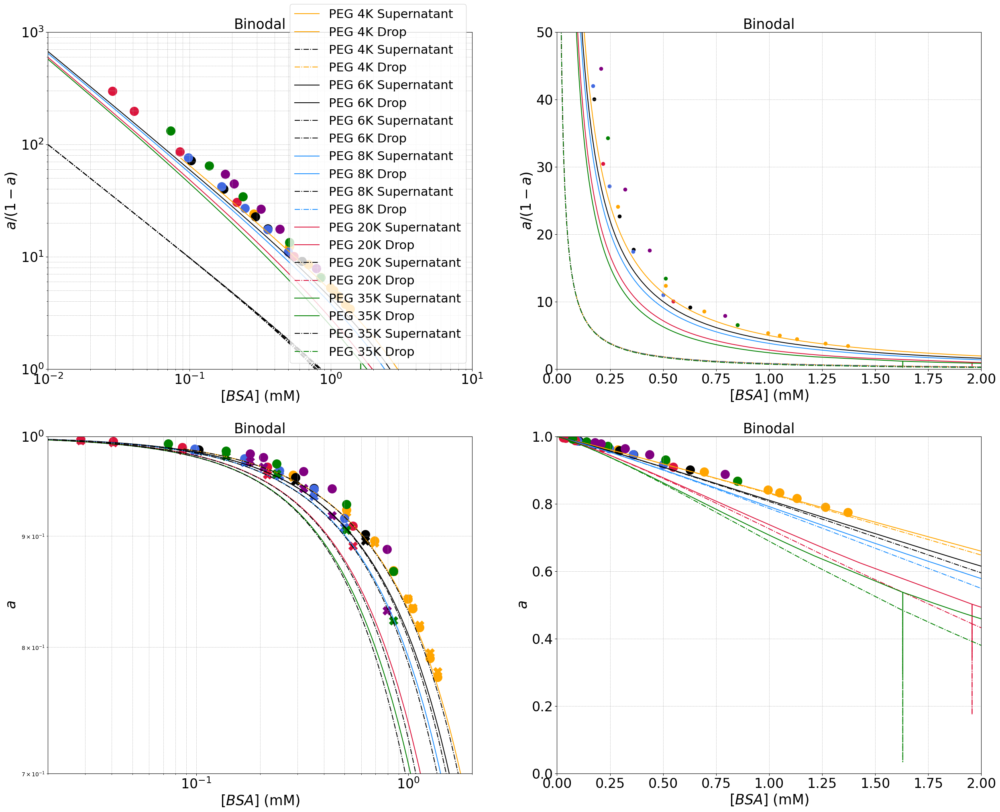

In [ ]:
# fig, axes = plt.subplots(1, 3, figsize=(30, 12))
fig, axes = plt.subplots(2, 2, figsize=(30, 24))

scheme = 'a/(1-a)'

binodal_scaling_plots(gfvt4K_200mM_Z0_theta, axes[0], 'orange', 'PEG 4K', '-', scheme)
binodal_scaling_plots(gfvt6K_200mM_Z0_theta, axes[0], 'black', 'PEG 6K', '-', scheme)
binodal_scaling_plots(gfvt8K_200mM_Z0_theta, axes[0], 'dodgerblue', 'PEG 8K', '-', scheme)
binodal_scaling_plots(gfvt20K_200mM_Z0_theta, axes[0], 'crimson', 'PEG 20K', '-', scheme)
binodal_scaling_plots(gfvt35K_200mM_Z0_theta, axes[0], 'green', 'PEG 35K', '-', scheme)

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-.', 'gfvt')

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '--', 'simple')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '--', 'simple')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '--', 'simple')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '--', 'simple')

axes[0][0].tick_params(axis='x', labelsize=24)
axes[0][0].tick_params(axis='y', labelsize=24)
axes[0][0].set_title("Binodal", fontsize = 25)
axes[0][0].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[0][0].set_ylabel("$a$/$(1-a)$", fontsize = 25)
axes[0][0].set_xlim(1e-2,1e1)
axes[0][0].set_ylim(1e-0,1e3)
axes[0][0].legend(fontsize = 22)

scale_dat_binodal(data_4K_pH7_200mM, axes[0], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'theta', mbsa, mpeg4)
scale_dat_binodal(data_4K_pH7_200mM_MA2, axes[0], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'theta', mbsa, mpeg4)
scale_dat_binodal(data_6K_pH7_200mM_SD, axes[0], '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'theta', mbsa, mpeg6)
scale_dat_binodal(data_8K_pH7_200mM_SD, axes[0], '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'theta', mbsa, mpeg8)
scale_dat_binodal(data_20K_pH7_200mM, axes[0], '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'theta', mbsa, mpeg20)
scale_dat_binodal(data_35K_pH7_200mM, axes[0], '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'theta', mbsa, mpeg35)
scale_dat_binodal(data_100K_pH7_200mM, axes[0], '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'theta', mbsa, mpeg100)

axes[0][1].tick_params(axis='x', labelsize=24)
axes[0][1].tick_params(axis='y', labelsize=24)
axes[0][1].set_title("Binodal", fontsize = 25)
axes[0][1].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[0][1].set_ylabel("$a$/$(1-a)$", fontsize = 25)
axes[0][1].set_xlim(0,2)
axes[0][1].set_ylim(0,50)

scheme = 'a'

binodal_scaling_plots(gfvt4K_200mM_Z0_theta, axes[1], 'orange', 'PEG 4K', '-', scheme)
binodal_scaling_plots(gfvt6K_200mM_Z0_theta, axes[1], 'black', 'PEG 6K', '-', scheme)
binodal_scaling_plots(gfvt8K_200mM_Z0_theta, axes[1], 'dodgerblue', 'PEG 8K', '-', scheme)
binodal_scaling_plots(gfvt20K_200mM_Z0_theta, axes[1], 'crimson', 'PEG 20K', '-', scheme)
binodal_scaling_plots(gfvt35K_200mM_Z0_theta, axes[1], 'green', 'PEG 35K', '-', scheme)

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-.', 'gfvt')

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '--', 'simple')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '--', 'simple')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '--', 'simple')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '--', 'simple')

axes[1][0].tick_params(axis='x', labelsize=24)
axes[1][0].tick_params(axis='y', labelsize=24)
axes[1][0].set_title("Binodal", fontsize = 25)
axes[1][0].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[1][0].set_ylabel("$a$", fontsize = 25)
axes[1][0].set_xlim(2e-2,2e0)
axes[1][0].set_ylim(7e-1,1)
# axes[0][0].legend(fontsize = 22)

scale_dat_binodal_a(data_4K_pH7_200mM, axes[1], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'theta', mbsa, mpeg4)
scale_dat_binodal_a(data_4K_pH7_200mM_MA2, axes[1], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'theta', mbsa, mpeg4)
scale_dat_binodal_a(data_6K_pH7_200mM_SD, axes[1], '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'theta', mbsa, mpeg6)
scale_dat_binodal_a(data_8K_pH7_200mM_SD, axes[1], '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'theta', mbsa, mpeg8)
scale_dat_binodal_a(data_20K_pH7_200mM, axes[1], '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'theta', mbsa, mpeg20)
scale_dat_binodal_a(data_35K_pH7_200mM, axes[1], '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'theta', mbsa, mpeg35)
scale_dat_binodal_a(data_100K_pH7_200mM, axes[1], '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'theta', mbsa, mpeg100)

axes[1][1].tick_params(axis='x', labelsize=24)
axes[1][1].tick_params(axis='y', labelsize=24)
axes[1][1].set_title("Binodal", fontsize = 25)
axes[1][1].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[1][1].set_ylabel("$a$", fontsize = 25)
axes[1][1].set_xlim(0,2)
axes[1][1].set_ylim(0,1)
# axes[1].legend(loc=(1.1,0), fontsize = 22)

# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.png')
# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.eps')

## plotIDR_dat()

In [ ]:
def plotIDR_dat(data, axes, plabel, pcolor, mark, siz, mpr=0, mpeg=0):
    if mpr == 0 or mpeg == 0:

        BN_pr_sup = data[:,0]
        BN_pr_sup_err = data[:,1]
        
        BN_PEG_sup = data[:,2]
        BN_PEG_sup_err = data[:,3]
        
    else:

        BN_pr_sup = data[:,0]/mpr
        BN_pr_sup_err = data[:,1]/mpr
        
        BN_PEG_sup = data[:,2]/mpeg
        BN_PEG_sup_err = data[:,3]/mpeg
        
    axes.errorbar(BN_PEG_sup, BN_pr_sup, xerr=BN_PEG_sup_err, yerr=BN_pr_sup_err, c=pcolor, ecolor=pcolor, capsize=5, capthick=1, fmt=mark, markersize=siz, label=plabel + ' binodal Simplest')
    axes.grid(True, which='both', ls='--', lw=0.5)
    # axes.loglog(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
    
    # axes.legend(loc=(1.1,0), fontsize='x-large')
    
    return

## plotIDR_dat_rescale_a()

In [ ]:
def plotIDR_dat_rescale_a(data, axes, plabel, pcolor, mark, siz, rpr, rpeg, mpr=0, mpeg=0):
    
    q = rpeg/rpr
    
    vpr = (4/3*np.pi*rpr**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)
    
    phix_peg = 1/vpeg
    phix_pr= 1/vpr
    
    if mpr == 0 or mpeg == 0:

        BN_pr_sup = data[:,0]
        BN_pr_sup_err = data[:,1]
        
        BN_PEG_sup = data[:,2]
        BN_PEG_sup_err = data[:,3]
        
    else:

        BN_pr_sup = data[:,0]/mpr
        BN_pr_sup_err = data[:,1]/mpr
        
        BN_PEG_sup = data[:,2]/mpeg
        BN_PEG_sup_err = data[:,3]/mpeg

    
    full_label = plabel + f'Rpr = {rpr*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)

    
    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        
        a = 3*qx+3*qx**2 + qx**3
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        return a*y# + b*y**2 + c*y**3

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vpr
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))
    
    BN_pr_sup_exc = [cpr for cpr in BN_pr_sup]
    PEG_Sup_exc = [get_a(cbsa, cpeg, q, solvent)/cbsa for cpeg, cbsa in zip(BN_PEG_sup, BN_pr_sup)]
    
    # BN_pr_sup_exc_err = [cpr for cpr in BN_pr_sup_err]
        
    # PEG_Sup_exc_1 = [cpeg/cpr*a for cpeg, cpr in zip(BN_PEG_sup,BN_pr_sup)]
    # PEG_Sup_exc_1_err = [a*np.sqrt((1/cpr)**2*s_peg**2 + (cpeg/cpr**2)*2*s_pr**2) for cpeg, cpr, s_peg, s_pr in zip(BN_PEG_sup, BN_pr_sup, BN_PEG_sup_err, BN_pr_sup_err)]

    
    axes.scatter(PEG_Sup_exc, BN_pr_sup_exc, c=pcolor, s=siz, marker=mark, label=full_label)
    plt.xscale('log')
    plt.yscale('log')
    axes.grid(True, which='both', ls='--', lw=0.5)
    # axes.loglog(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
    
    return [BN_pr_sup_exc, PEG_Sup_exc]

## plotBSA_dat_rescale_a()

In [ ]:
def plotBSA_dat_rescale_a(data, axes, plabel, pcolor, mark, siz, rpr, rpeg, mpr=0, mpeg=0):
    
    q = rpeg/rpr
    
    vpr = (4/3*np.pi*rpr**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)
    
    phix_peg = 1/vpeg
    phix_pr= 1/vpr
    
    if mpr == 0 or mpeg == 0:

        BN_pr_sup = data[:,2]
        BN_pr_sup_err = data[:,3]
        
        BN_PEG_sup = data[:,8]
        BN_PEG_sup_err = data[:,8]
        
    else:

        BN_pr_sup = data[:,2]/mpr
        BN_pr_sup_err = data[:,3]/mpr
        
        BN_PEG_sup = data[:,8]/mpeg
        BN_PEG_sup_err = data[:,9]/mpeg
        
    full_label = plabel + f'Rbsa = {rpr*1e9:.2f} nm, Rpol = {rpeg*1e9:.2f} nm, q = {q:.2f}, ' + solvent + ' solvent GFVT binodal'
    print(full_label)
    
    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9) 
        
        a = 3*qx+3*qx**2 + qx**3
        b = 9/2*qx**2+3*qx**3
        c = 3*qx**3

        return a*y #+ b*y**2 + c*y**3

    def get_a0(cbsa, cpeg, q, solvent):

        Phi = cbsa*vpr
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vpr
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))
    
    BN_pr_sup_exc = [cpr for cpr in BN_pr_sup]
    PEG_Sup_exc = [get_a(cbsa, cpeg, q, solvent)/cbsa for cpeg, cbsa in zip(BN_PEG_sup, BN_pr_sup)]
    
    axes.scatter(PEG_Sup_exc, BN_pr_sup_exc, c=pcolor, s=siz, marker=mark, label=full_label)
    plt.xscale('log')
    plt.yscale('log')
    axes.grid(True, which='both', ls='--', lw=0.5)
    # axes.loglog(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
    
    axes.legend(loc=(1.1,0), fontsize='x-large')
    
    return [BN_pr_sup_exc, PEG_Sup_exc]

## fitIDR_dat_rescale_a

In [ ]:
def fitIDR_dat_rescale_a(scaledat, axes):

    tmpx=[]
    tmp = [dat[0] for dat in scaledat]
    for row in tmp:
        tmpx += row

    tmpy=[]
    tmp = [dat[1] for dat in scaledat]
    for row in tmp:
        tmpy += row
    
    xrange = np.logspace(-3,0.5,100)

    lgx = np.asarray([np.log10(x) for x in tmpx])
    
    lgy = np.asarray([np.log10(y) for y in tmpy])
    
    # Perform linear fit
    logfit_phi,residuals,_,_,_ = np.polyfit(lgx, lgy, 1,full=True)  # Degree 1 polynomial (linear fit)
    slope_phi, intercept_phi = logfit_phi
    # chi_squared = residuals[0]/(len(mwlist)-2)/0.05**2
    print(f"Slope: {slope_phi}, Intercept: {intercept_phi}")
    # print(f'Chi squared (power): {chi_squared:.4f}')
    
    lgphi_fit =  [10**intercept_phi*x**slope_phi for x in xrange]
    
    axes.plot(lgphi_fit, xrange, '--r')
    # axes.xscale('log')
    # axes.yscale('log')
    
    return [intercept_phi, slope_phi]

## fitIDR_dat_rescale_a_linear()

In [ ]:
def fitIDR_dat_rescale_a_linear(scaledat, axes):

    tmpx=[]
    tmp = [dat[0] for dat in scaledat]
    for row in tmp:
        tmpx += row

    tmpy=[]
    tmp = [dat[1] for dat in scaledat]
    for row in tmp:
        tmpy += row
    
    xrange = np.logspace(-3,0.5,100)

    lgx = np.asarray([np.log10(x) for x in tmpx])
    
    lgy = np.asarray([np.log10(y) for y in tmpy])
    
    # Perform linear fit
    logfit_phi,residuals,_,_,_ = np.polyfit(lgx, lgy, 1,full=True)  # Degree 1 polynomial (linear fit)
    slope_phi, intercept_phi = logfit_phi
    # chi_squared = residuals[0]/(len(mwlist)-2)/0.05**2
    print(f"Slope: {slope_phi}, Intercept: {intercept_phi}")
    # print(f'Chi squared (power): {chi_squared:.4f}')
    
    lgphi_fit =  [10**intercept_phi*x**slope_phi for x in xrange]
    
    axes.plot(lgphi_fit, xrange, '--r')
    
    return [intercept_phi, slope_phi]

## plotsolfit()

In [ ]:
def plotsolfit(PEG_range, fitparams, rpeg, rpr, axes, pcolor):

    b, g = fitparams;
    
    q = rpeg/rpr;

    c0 = 0.01;
    
    vpr = (4/3*np.pi*rpr**3*6.022e23)
    vpeg = (4/3*np.pi*rpeg**3*6.022e23)

    Pr_range = np.empty(PEG_range.size)

    def Qf(Phi, Phi_pol, q, solvent):
        
        y = Phi/(1-Phi)
        
        if solvent =='good':
            qx = 0.865*(q/(1 + 3.95*Phi_pol**1.54)**(1/2))**(0.88)
        else:
            qx = 0.938*(q/(1 + 6.02*Phi_pol**2)**(1/2))**(0.9)
        
        a = 3*qx + 3*qx**2 + qx**3
        b = 9/2*qx**2 + 3*qx**3
        c = 3*qx**3

        return a*y + b*y**2 + c*y**3

    def get_a(cbsa, cpeg, q, solvent):

        Phi = cbsa*vpr
        Phi_pol = cpeg*vpeg

        return (1 - Phi)*np.exp(-Qf(Phi, Phi_pol, q, solvent))

    def f(cbsa, q, solvent, b, g, cpeg):
        f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
        return f_out

    for i, cpeg in enumerate(PEG_range):
        sol = root(f, c0, args=(q, solvent, b, g, cpeg), method = 'hybr')
        # print(sol.x)
        Pr_range[i] = sol.x[0]
    
    axes.plot(PEG_range, Pr_range, c=pcolor)
    
    return

DDX4 4KRpr = 1.20 nm, Rpol = 1.90 nm, q = 1.58, good solvent GFVT binodal
DDX4 6KRpr = 1.20 nm, Rpol = 2.45 nm, q = 2.04, good solvent GFVT binodal
DDX4 8KRpr = 1.20 nm, Rpol = 3.10 nm, q = 2.58, good solvent GFVT binodal
FUS 4KRpr = 1.50 nm, Rpol = 1.90 nm, q = 1.27, good solvent GFVT binodal
FUS 6KRpr = 1.50 nm, Rpol = 2.45 nm, q = 1.63, good solvent GFVT binodal
YTHDF1 4KRpr = 1.10 nm, Rpol = 1.90 nm, q = 1.73, good solvent GFVT binodal
YTHDF1 6KRpr = 1.10 nm, Rpol = 2.45 nm, q = 2.23, good solvent GFVT binodal
YTHDF1 8KRpr = 1.10 nm, Rpol = 3.10 nm, q = 2.82, good solvent GFVT binodal
SUMO1 4KRpr = 1.50 nm, Rpol = 1.90 nm, q = 1.27, good solvent GFVT binodal
SUMO1 6KRpr = 1.50 nm, Rpol = 2.45 nm, q = 1.63, good solvent GFVT binodal
SUMO1 8KRpr = 1.50 nm, Rpol = 3.10 nm, q = 2.07, good solvent GFVT binodal
SUMO3 4KRpr = 1.30 nm, Rpol = 1.90 nm, q = 1.46, good solvent GFVT binodal
SUMO3 6KRpr = 1.30 nm, Rpol = 2.45 nm, q = 1.88, good solvent GFVT binodal
SUMO3 8KRpr = 1.30 nm, Rpol =

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)


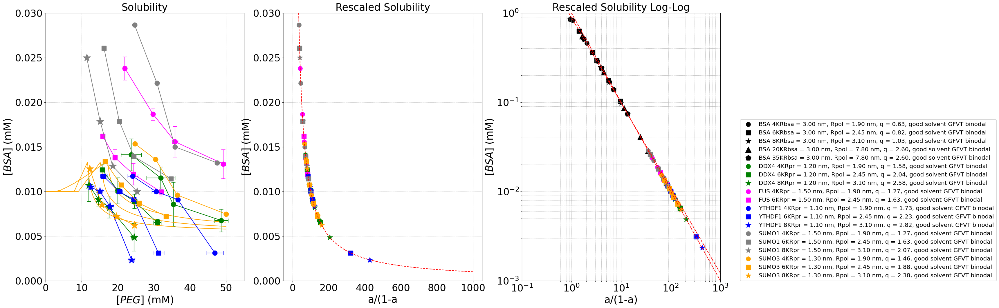

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(30, 12))

# Good Solvent
rpeg4 = 1.90e-9
rpeg6 = 2.45e-9
rpeg8 = 3.1e-9
rpeg20 = 5.4e-9
rpeg35 = 7.8e-9
rpeg100 = 14.8e-9

rfus = 1.5e-9
rdf1 = 1.1e-9
rbsa = 3.0e-9
rrod10 = 1.8e-9
rddx4 = 1.2e-9
rsumo1 = 1.5e-9
rsumo3 = 1.3e-9

mfus = 26.4
mdf1 = 60
mrod10 = 63
mddx4 = 56
msumo1 = 44.2
msumo3 = 67

scaledat = []
scaledatbsa = []

plotIDR_dat(data_DDX4_4K, axes[0], 'DDX4 4K', 'green', '-o', 12, mddx4, mpeg4)
plotIDR_dat(data_DDX4_6K, axes[0], 'DDX4 6K', 'green', '-s', 12, mddx4, mpeg6)
plotIDR_dat(data_DDX4_8K, axes[0], 'DDX4 8K', 'green', '-*', 20, mddx4, mpeg8)

plotIDR_dat(data_FUSNTD_4K, axes[0], 'FUS 4K', 'magenta', '-o', 12, mfus, mpeg4)
plotIDR_dat(data_FUSNTD_6K, axes[0], 'FUS 6K', 'magenta', '-s', 12, mfus, mpeg6)
# plotIDR_dat(data_FUSNTD_8K, axes[0], 'FUS 8K', 'magenta', '-*', 20, mfus, mpeg8)

plotIDR_dat(data_YTHDF1_4K, axes[0], 'YTHDF1 4K', 'blue', '-o', 12, mdf1, mpeg4)
plotIDR_dat(data_YTHDF1_6K, axes[0], 'YTHDF1 6K', 'blue', '-s', 12, mdf1, mpeg6)
plotIDR_dat(data_YTHDF1_8K, axes[0], 'YTHDF1 8K', 'blue', '-*', 20, mdf1, mpeg8)

plotIDR_dat(data_SUMO1_4K, axes[0], 'SUMO1 4K', 'gray', '-o', 12, msumo1, mpeg4)
plotIDR_dat(data_SUMO1_6K, axes[0], 'SUMO1 6K', 'gray', '-s', 12, msumo1, mpeg6)
plotIDR_dat(data_SUMO1_8K, axes[0], 'SUMO1 8K', 'gray', '-*', 20, msumo1, mpeg8)

plotIDR_dat(data_SUMO3_4K, axes[0], 'SUMO3 4K', 'orange', '-o', 12, msumo3, mpeg4)
plotIDR_dat(data_SUMO3_6K, axes[0], 'SUMO3 6K', 'orange', '-s', 12, msumo3, mpeg6)
plotIDR_dat(data_SUMO3_8K, axes[0], 'SUMO3 8K', 'orange', '-*', 20, msumo3, mpeg8)

plotIDR_dat_rescale_a(data_DDX4_4K, axes[1], 'DDX4 4K', 'green', 'o', 120, rddx4, rpeg4, mddx4, mpeg4)
plotIDR_dat_rescale_a(data_DDX4_6K, axes[1], 'DDX4 6K', 'green', 's', 120, rddx4, rpeg6, mddx4, mpeg6)
plotIDR_dat_rescale_a(data_DDX4_8K, axes[1], 'DDX4 8K', 'green', '*', 200, rddx4, rpeg8, mddx4, mpeg8)

plotIDR_dat_rescale_a(data_FUSNTD_4K, axes[1], 'FUS 4K', 'magenta', 'o', 120, rfus, rpeg4, mfus, mpeg4)
plotIDR_dat_rescale_a(data_FUSNTD_6K, axes[1], 'FUS 6K', 'magenta', 's', 120, rfus, rpeg6, mfus, mpeg6)
# plotIDR_dat_rescale_a(data_FUSNTD_8K, axes[1], 'FUS 8K', 'magenta', '*', 200, rfus, rpeg8, mfus, mpeg8)

plotIDR_dat_rescale_a(data_YTHDF1_4K, axes[1], 'YTHDF1 4K', 'blue', 'o', 120, rdf1, rpeg4, mdf1, mpeg4)
plotIDR_dat_rescale_a(data_YTHDF1_6K, axes[1], 'YTHDF1 6K', 'blue', 's', 120, rdf1, rpeg6, mdf1, mpeg6)
plotIDR_dat_rescale_a(data_YTHDF1_8K, axes[1], 'YTHDF1 8K', 'blue', '*', 200, rdf1, rpeg8, mdf1, mpeg8)

plotIDR_dat_rescale_a(data_SUMO1_4K, axes[1], 'SUMO1 4K', 'gray', 'o', 120, rsumo1, rpeg4, msumo1, mpeg4)
plotIDR_dat_rescale_a(data_SUMO1_6K, axes[1], 'SUMO1 6K', 'gray', 's', 120, rsumo1, rpeg6, msumo1, mpeg6)
plotIDR_dat_rescale_a(data_SUMO1_8K, axes[1], 'SUMO1 8K', 'gray', '*', 200, rsumo1, rpeg8, msumo1, mpeg8)

plotIDR_dat_rescale_a(data_SUMO3_4K, axes[1], 'SUMO3 4K', 'orange', 'o', 120, rsumo3, rpeg4, msumo3, mpeg4)
plotIDR_dat_rescale_a(data_SUMO3_6K, axes[1], 'SUMO3 6K', 'orange', 's', 120, rsumo3, rpeg6, msumo3, mpeg6)
plotIDR_dat_rescale_a(data_SUMO3_8K, axes[1], 'SUMO3 8K', 'orange', '*', 200, rsumo3, rpeg8, msumo3, mpeg8)


scaledatbsa.append(plotBSA_dat_rescale_a(data_4K_pH7_200mM_MA3, axes[2], 'BSA 4K', 'black', 'o', 120, rbsa,  rpeg4, mbsa, mpeg4))
# scaledatbsa.append(plotBSA_dat_rescale_a(data_4K_pH7_200mM_MA2, axes[2], 'BSA 4K', 'black', 'o', 12, rbsa,  rpeg4, mbsa, mpeg4))
scaledatbsa.append(plotBSA_dat_rescale_a(data_6K_pH7_200mM_SD, axes[2], 'BSA 6K', 'black', 's', 120, rbsa,   rpeg6, mbsa, mpeg6))
scaledatbsa.append(plotBSA_dat_rescale_a(data_8K_pH7_200mM_SD, axes[2], 'BSA 8K', 'black', '*', 200, rbsa,  rpeg8, mbsa, mpeg8))
scaledatbsa.append(plotBSA_dat_rescale_a(data_20K_pH7_200mM, axes[2], 'BSA 20K', 'black', '^', 200, rbsa,  rpeg35, mbsa, mpeg35))
scaledatbsa.append(plotBSA_dat_rescale_a(data_35K_pH7_200mM, axes[2], 'BSA 35K', 'black', 'p', 200, rbsa,  rpeg35, mbsa, mpeg35))

scaledat.append(plotIDR_dat_rescale_a(data_DDX4_4K, axes[2], 'DDX4 4K', 'green', 'o', 120, rddx4, rpeg4, mddx4, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_DDX4_6K, axes[2], 'DDX4 6K', 'green', 's', 120, rddx4, rpeg6, mddx4, mpeg6))
scaledat.append(plotIDR_dat_rescale_a(data_DDX4_8K, axes[2], 'DDX4 8K', 'green', '*', 200, rddx4, rpeg8, mddx4, mpeg8))

scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_4K, axes[2], 'FUS 4K', 'magenta', 'o', 120, rfus, rpeg4, mfus, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_6K, axes[2], 'FUS 6K', 'magenta', 's', 120, rfus, rpeg6, mfus, mpeg6))
# scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_8K, axes[2], 'FUS 8K', 'magenta', '*', 200, rfus, rpeg8, mfus, mpeg8))

scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_4K, axes[2], 'YTHDF1 4K', 'blue', 'o', 120, rdf1, rpeg4, mdf1, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_6K, axes[2], 'YTHDF1 6K', 'blue', 's', 120, rdf1, rpeg6, mdf1, mpeg6))
scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_8K, axes[2], 'YTHDF1 8K', 'blue', '*', 200, rdf1, rpeg8, mdf1, mpeg8))

scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_4K, axes[2], 'SUMO1 4K', 'gray', 'o', 120, rsumo1, rpeg4, msumo1, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_6K, axes[2], 'SUMO1 6K', 'gray', 's', 120, rsumo1, rpeg6, msumo1, mpeg6))
scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_8K, axes[2], 'SUMO1 8K', 'gray', '*', 200, rsumo1, rpeg8, msumo1, mpeg8))

scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_4K, axes[2], 'SUMO3 4K', 'orange', 'o', 120, rsumo3, rpeg4, msumo3, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_6K, axes[2], 'SUMO3 6K', 'orange', 's', 120, rsumo3, rpeg6, msumo3, mpeg6))
scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_8K, axes[2], 'SUMO3 8K', 'orange', '*', 200, rsumo3, rpeg8, msumo3, mpeg8))

fitIDR_dat_rescale_a(scaledatbsa, axes[2])
fitIDR_dat_rescale_a(scaledat, axes[2])
fitparams = fitIDR_dat_rescale_a_linear(scaledat, axes[1])

plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg4, rsumo3, axes[0], 'orange')
plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg6, rsumo3, axes[0], 'orange')
plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg8, rsumo3, axes[0], 'orange')

axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_ylim(0,0.03)
axes[0].set_xlim(0,55)
axes[0].set_title("Solubility", fontsize = 25)
axes[0].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[0].set_xlabel("$[PEG]$ (mM)", fontsize = 25)

axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_ylim(0,0.03)
# axes[1].set_xlim(0,2.5e4)
axes[1].set_title("Rescaled Solubility", fontsize = 25)
axes[1].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[1].set_xlabel("a/(1-a", fontsize = 25)

axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_ylim(1e-3,1)
axes[2].set_xlim(1e-1,1e3)
axes[2].set_title("Rescaled Solubility Log-Log", fontsize = 25)
axes[2].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[2].set_xlabel("a/(1-a)", fontsize = 25)

axes[2].xaxis.set_major_locator(mticker.LogLocator(numticks=999))
axes[2].xaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
axes[2].legend(loc=(1.1,0), fontsize='x-large')

# plt.savefig(date_string+'_phase_diagram_IDR_scaling_good.png')
# plt.savefig(date_string+'_phase_diagram_IDR_scaling_good.eps')

## align BSA and IDRs

TypeError: plotIDR_dat() takes from 5 to 7 positional arguments but 8 were given

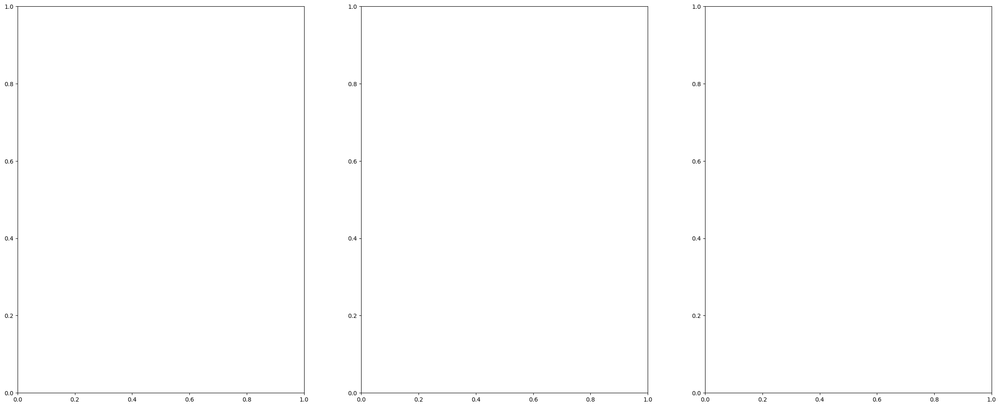

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(30, 12))

rfus = 1.5e-9
rdf1 = 1.1e-9
rbsa = 3.0e-9
rrod10 = 1.8e-9
rddx4 = 2.6e-9
rsumo1 = 1.5e-9
rsumo3 = 1.3e-9

mfus = 26.4
mdf1 = 60
mrod10 = 63
mddx4 = 56
msumo1 = 44.2
msumo3 = 67

scaledat = []
scaledatbsa = []

plotIDR_dat(data_DDX4_4K, axes[0], 'DDX4 4K', 'green', '-o', 12, mddx4, mpeg4)
plotIDR_dat(data_DDX4_6K, axes[0], 'DDX4 6K', 'green', '-s', 12, mddx4, mpeg6)
plotIDR_dat(data_DDX4_8K, axes[0], 'DDX4 8K', 'green', '-*', 20, mddx4, mpeg8)

plotIDR_dat(data_FUSNTD_4K, axes[0], 'FUS 4K', 'magenta', '-o', 12, mfus, mpeg4)
plotIDR_dat(data_FUSNTD_6K, axes[0], 'FUS 6K', 'magenta', '-s', 12, mfus, mpeg6)
# plotIDR_dat(data_FUSNTD_8K, axes[0], 'FUS 8K', 'magenta', '-*', 20, mfus, mpeg8)

plotIDR_dat(data_YTHDF1_4K, axes[0], 'YTHDF1 4K', 'blue', '-o', 12, mdf1, mpeg4)
plotIDR_dat(data_YTHDF1_6K, axes[0], 'YTHDF1 6K', 'blue', '-s', 12, mdf1, mpeg6)
plotIDR_dat(data_YTHDF1_8K, axes[0], 'YTHDF1 8K', 'blue', '-*', 20, mdf1, mpeg8)

plotIDR_dat(data_SUMO1_4K, axes[0], 'SUMO1 4K', 'gray', '-o', 12, msumo1, mpeg4)
plotIDR_dat(data_SUMO1_6K, axes[0], 'SUMO1 6K', 'gray', '-s', 12, msumo1, mpeg6)
plotIDR_dat(data_SUMO1_8K, axes[0], 'SUMO1 8K', 'gray', '-*', 20, msumo1, mpeg8)

plotIDR_dat(data_SUMO3_4K, axes[0], 'SUMO3 4K', 'orange', '-o', 12, msumo3, mpeg4)
plotIDR_dat(data_SUMO3_6K, axes[0], 'SUMO3 6K', 'orange', '-s', 12, msumo3, mpeg6)
plotIDR_dat(data_SUMO3_8K, axes[0], 'SUMO3 8K', 'orange', '-*', 20, msumo3, mpeg8)

plotIDR_dat_rescale_a(data_DDX4_4K, axes[1], 'DDX4 4K', 'green', 'o', 120, rddx4, rpeg4, mddx4, mpeg4)
plotIDR_dat_rescale_a(data_DDX4_6K, axes[1], 'DDX4 6K', 'green', 's', 120, rddx4, rpeg6, mddx4, mpeg6)
plotIDR_dat_rescale_a(data_DDX4_8K, axes[1], 'DDX4 8K', 'green', '*', 200, rddx4, rpeg8, mddx4, mpeg8)

plotIDR_dat_rescale_a(data_FUSNTD_4K, axes[1], 'FUS 4K', 'magenta', 'o', 120, rfus, rpeg4, mfus, mpeg4)
plotIDR_dat_rescale_a(data_FUSNTD_6K, axes[1], 'FUS 6K', 'magenta', 's', 120, rfus, rpeg6, mfus, mpeg6)
# plotIDR_dat_rescale_a(data_FUSNTD_8K, axes[1], 'FUS 8K', 'magenta', '*', 200, rfus, rpeg8, mfus, mpeg8)

plotIDR_dat_rescale_a(data_YTHDF1_4K, axes[1], 'YTHDF1 4K', 'blue', 'o', 120, rdf1, rpeg4, mdf1, mpeg4)
plotIDR_dat_rescale_a(data_YTHDF1_6K, axes[1], 'YTHDF1 6K', 'blue', 's', 120, rdf1, rpeg6, mdf1, mpeg6)
plotIDR_dat_rescale_a(data_YTHDF1_8K, axes[1], 'YTHDF1 8K', 'blue', '*', 200, rdf1, rpeg8, mdf1, mpeg8)

plotIDR_dat_rescale_a(data_SUMO1_4K, axes[1], 'SUMO1 4K', 'gray', 'o', 120, rsumo1, rpeg4, msumo1, mpeg4)
plotIDR_dat_rescale_a(data_SUMO1_6K, axes[1], 'SUMO1 6K', 'gray', 's', 120, rsumo1, rpeg6, msumo1, mpeg6)
plotIDR_dat_rescale_a(data_SUMO1_8K, axes[1], 'SUMO1 8K', 'gray', '*', 200, rsumo1, rpeg8, msumo1, mpeg8)

plotIDR_dat_rescale_a(data_SUMO3_4K, axes[1], 'SUMO3 4K', 'orange', 'o', 120, rsumo3, rpeg4, msumo3, mpeg4)
plotIDR_dat_rescale_a(data_SUMO3_6K, axes[1], 'SUMO3 6K', 'orange', 's', 120, rsumo3, rpeg6, msumo3, mpeg6)
plotIDR_dat_rescale_a(data_SUMO3_8K, axes[1], 'SUMO3 8K', 'orange', '*', 200, rsumo3, rpeg8, msumo3, mpeg8)


scaledatbsa.append(plotBSA_dat_rescale_a(data_4K_pH7_200mM_MA3, axes[2], 'BSA 4K', 'black', 'o', 120, rbsa,  rpeg4, mbsa, mpeg4))
# scaledatbsa.append(plotBSA_dat_rescale_a(data_4K_pH7_200mM_MA2, axes[2], 'BSA 4K', 'black', 'o', 12, rbsa,  rpeg4, mbsa, mpeg4))
scaledatbsa.append(plotBSA_dat_rescale_a(data_6K_pH7_200mM_SD, axes[2], 'BSA 6K', 'black', 's', 120, rbsa,   rpeg6, mbsa, mpeg6))
scaledatbsa.append(plotBSA_dat_rescale_a(data_8K_pH7_200mM_SD, axes[2], 'BSA 8K', 'black', '*', 200, rbsa,  rpeg8, mbsa, mpeg8))
scaledatbsa.append(plotBSA_dat_rescale_a(data_20K_pH7_200mM, axes[2], 'BSA 20K', 'black', '^', 200, rbsa,  rpeg35, mbsa, mpeg35))
scaledatbsa.append(plotBSA_dat_rescale_a(data_35K_pH7_200mM, axes[2], 'BSA 35K', 'black', 'p', 200, rbsa,  rpeg35, mbsa, mpeg35))

scaledat.append(plotIDR_dat_rescale_a(data_DDX4_4K, axes[2], 'DDX4 4K', 'green', 'o', 120, rddx4, rpeg4, mddx4, mpeg4))
scaledat.append(plotIDR_dat_rescale_a(data_DDX4_6K, axes[2], 'DDX4 6K', 'green', 's', 120, rddx4, rpeg6, mddx4, mpeg6))
scaledat.append(plotIDR_dat_rescale_a(data_DDX4_8K, axes[2], 'DDX4 8K', 'green', '*', 200, rddx4, rpeg8, mddx4, mpeg8))

# scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_4K, axes[2], 'FUS 4K', 'magenta', 'o', 120, rfus, rpeg4, mfus, mpeg4))
# scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_6K, axes[2], 'FUS 6K', 'magenta', 's', 120, rfus, rpeg6, mfus, mpeg6))
# # scaledat.append(plotIDR_dat_rescale_a(data_FUSNTD_8K, axes[2], 'FUS 8K', 'magenta', '*', 200, rfus, rpeg8, mfus, mpeg8))

# scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_4K, axes[2], 'YTHDF1 4K', 'blue', 'o', 120, rdf1, rpeg4, mdf1, mpeg4))
# scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_6K, axes[2], 'YTHDF1 6K', 'blue', 's', 120, rdf1, rpeg6, mdf1, mpeg6))
# scaledat.append(plotIDR_dat_rescale_a(data_YTHDF1_8K, axes[2], 'YTHDF1 8K', 'blue', '*', 200, rdf1, rpeg8, mdf1, mpeg8))

# scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_4K, axes[2], 'SUMO1 4K', 'gray', 'o', 120, rsumo1, rpeg4, msumo1, mpeg4))
# scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_6K, axes[2], 'SUMO1 6K', 'gray', 's', 120, rsumo1, rpeg6, msumo1, mpeg6))
# scaledat.append(plotIDR_dat_rescale_a(data_SUMO1_8K, axes[2], 'SUMO1 8K', 'gray', '*', 200, rsumo1, rpeg8, msumo1, mpeg8))

# scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_4K, axes[2], 'SUMO3 4K', 'orange', 'o', 120, rsumo3, rpeg4, msumo3, mpeg4))
# scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_6K, axes[2], 'SUMO3 6K', 'orange', 's', 120, rsumo3, rpeg6, msumo3, mpeg6))
# scaledat.append(plotIDR_dat_rescale_a(data_SUMO3_8K, axes[2], 'SUMO3 8K', 'orange', '*', 200, rsumo3, rpeg8, msumo3, mpeg8))

fitIDR_dat_rescale_a(scaledatbsa, axes[2])
fitIDR_dat_rescale_a(scaledat, axes[2])
fitparams = fitIDR_dat_rescale_a_linear(scaledat, axes[1])

plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg4, rddx4, axes[0], 'green')
plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg6, rddx4, axes[0], 'green')
plotsolfit(np.linspace(1e-3,50,100), fitparams, rpeg8, rddx4, axes[0], 'green')

axes[0].tick_params(axis='x', labelsize=24)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].set_ylim(0,0.03)
axes[0].set_xlim(0,55)
axes[0].set_title("Solubility", fontsize = 25)
axes[0].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[0].set_xlabel("$[PEG]$ (mM)", fontsize = 25)

axes[1].tick_params(axis='x', labelsize=24)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].set_ylim(0,0.03)
# axes[1].set_xlim(0,2.5e4)
axes[1].set_title("Rescaled Solubility", fontsize = 25)
axes[1].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[1].set_xlabel("a/(1-a", fontsize = 25)

axes[2].tick_params(axis='x', labelsize=24)
axes[2].tick_params(axis='y', labelsize=24)
axes[2].set_ylim(1e-3,2)
axes[2].set_xlim(1,1e5)
axes[2].set_title("Rescaled Solubility Log-Log", fontsize = 25)
axes[2].set_ylabel("$[BSA]$ (mM)", fontsize = 25)
axes[2].set_xlabel("a/(1-a)", fontsize = 25)

axes[2].xaxis.set_major_locator(mticker.LogLocator(numticks=999))
axes[2].xaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))
axes[2].legend(loc=(1.1,0), fontsize='x-large')

# plt.savefig(date_string+'_phase_diagram_IDR_scaling_good.png')
# plt.savefig(date_string+'_phase_diagram_IDR_scaling_good.eps')

In [ ]:
def plotIDR_dat(data, plabel, pcolor, mark, siz, mpr=0, mpeg=0):
    if mpr == 0 or mpeg == 0:

        BN_pr_sup = data[:,0]
        BN_pr_sup_err = data[:,1]
        
        BN_PEG_sup = data[:,2]
        BN_PEG_sup_err = data[:,3]
        
    else:

        BN_pr_sup = 1000*data[:,0]/mpr
        BN_pr_sup_err = 1000*data[:,1]/mpr
        
        BN_PEG_sup = data[:,2]/mpeg
        BN_PEG_sup_err = data[:,3]/mpeg
        
    plt.errorbar(BN_pr_sup, BN_PEG_sup, xerr=BN_pr_sup_err, yerr=BN_PEG_sup_err, c=pcolor, ecolor=pcolor, capsize=5, capthick=1, fmt=mark, markersize=siz, label=plabel + ' binodal Simplest')
    plt.grid(True, which='both', ls='--', lw=0.5)
    # axes.loglog(CP_BSA, CP_PEG, xerr=CP_BSA_err, yerr=CP_PEG_err, markersize=12,fmt='X', c=pcolor, ecolor=pcolor, capsize=5, capthick=1, label=plabel + ' critical point')
    
    # axes.legend(loc=(1.1,0), fontsize='x-large')
    
    return

Calculating Binodal:   1%|█▏                                                                                      | 7/500 [00:00<00:15, 32.40step/s]

0.0005441004591735031
0.5622545139904304


Calculating Binodal: 100%|██████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:09<00:00, 50.71step/s]
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


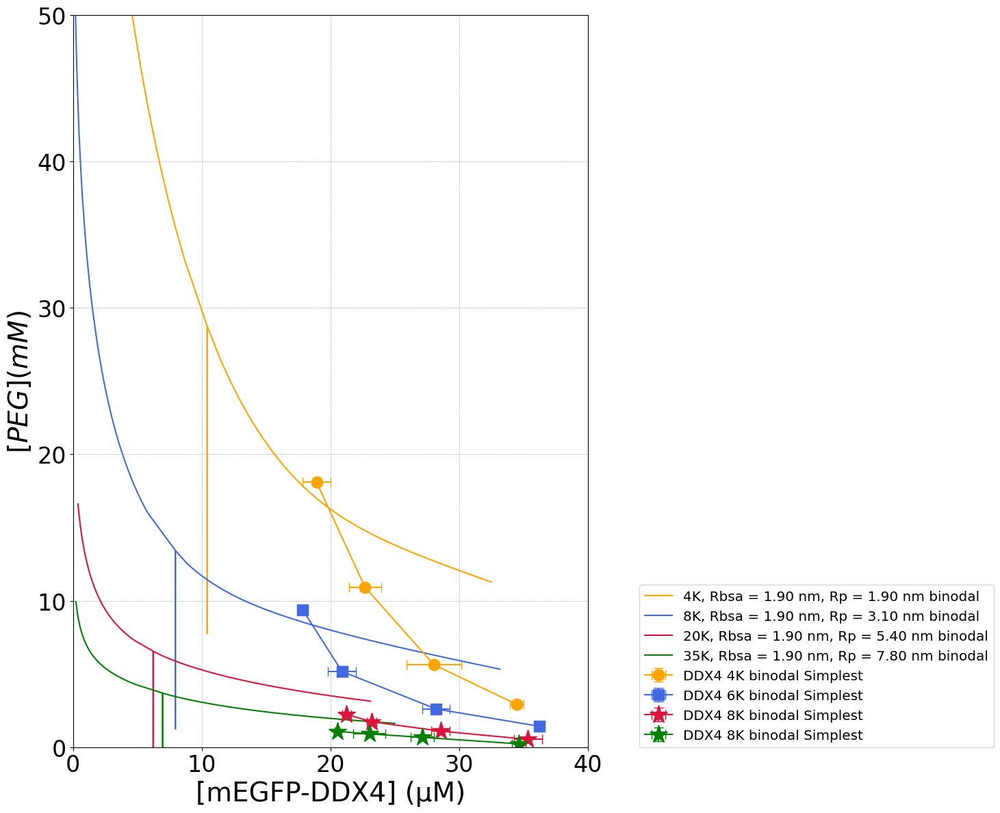

In [ ]:
figh = plt.figure(2, figsize = (9,12))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,40)
plt.ylim(0,50)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'[mEGFP-DDX4] (µM)',fontsize = 28)
plt.ylabel(r'$[PEG] (mM)$',fontsize = 28)
plt.tight_layout()

plotIDR_dat(data_GFP_DDX4_4K, 'DDX4 4K', 'orange', '-o', 12, mddx4, mpeg4)
plotIDR_dat(data_GFP_DDX4_8K, 'DDX4 6K', 'royalblue', '-s', 12, mddx4, mpeg8)
plotIDR_dat(data_GFP_DDX4_20K, 'DDX4 8K', 'crimson', '-*', 20, mddx4, mpeg20)
plotIDR_dat(data_GFP_DDX4_35K, 'DDX4 8K', 'green', '-*', 20, mddx4, mpeg35)

g1 = 0.0001 # guess protein volume fraction in phase A
g2 = 0.3 # guess protein volume fraction in phase B
N_steps = 500 # number of points between PhiP_max and PhiP_min 
PhiP_max = 8.5# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.39 # 
solvent = 'good'

# guess_b = [g1, g2];
# guess_c = 0;
# guess_b = [1e-4, 0.5];
PhiP_max = 2.6# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 # 
guess_c = DDX4K_Z0[-1][7]
guess_b = DDX4K_Z0[-1][8]
DDX4K_Z0 = GFVT(1.9e-9, 1.9e-9, mddx4, mpeg4, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 5.4 # Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.4 #
guess_c = DDX8K_Z0[-1][7]
guess_b = DDX8K_Z0[-1][8]
# DDX8K_Z0 = GFVT(1.9e-9, 3.1e-9, mddx4, mpeg8, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 6.7# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
guess_c = DDX20K_Z0[-1][7]
guess_b = DDX20K_Z0[-1][8]
# DDX20K_Z0 = GFVT(1.9e-9, 5.4e-9, mddx4, mpeg20, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

PhiP_max = 12# Starting point: maximum relative volume fraction of polymer in reservoir
PhiP_min = 0.2 # 
guess_c = DDX35K_Z0[-1][7]
guess_b = DDX35K_Z0[-1][8]
c1 = guess_c
c2 = guess_b
# DDX35K_Z0 = GFVT(1.9e-9, 7.8e-9, mddx4, mpeg35, solvent, N_steps, PhiP_min, PhiP_max, guess_c, guess_b)

molplot(DDX4K_Z0, f'4K, ', 'orange', 'red')
molplot(DDX8K_Z0, f'8K, ', 'royalblue', 'red')
molplot(DDX20K_Z0, f'20K, ', 'crimson', 'red')
molplot(DDX35K_Z0, f'35K, ', 'green', 'red')

plt.savefig(date_string+'_phase_diagram_IDR_good.png')
plt.savefig(date_string+'_phase_diagram_IDR_good.eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


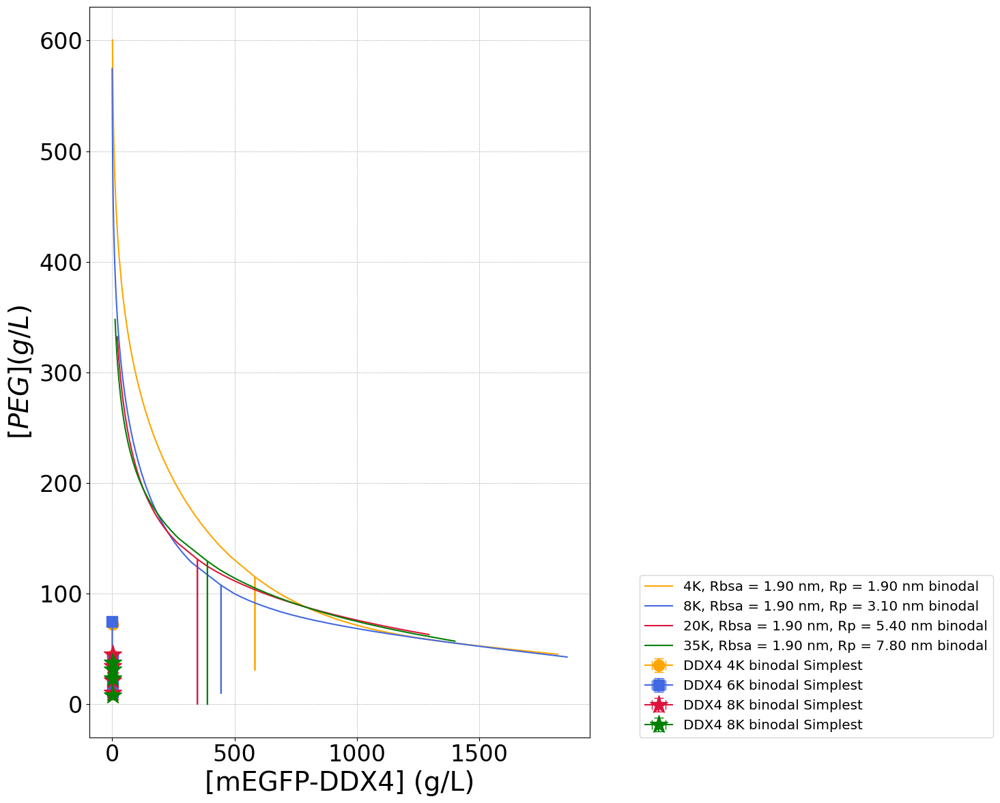

In [ ]:
figh = plt.figure(2, figsize = (9,12))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
# plt.xlim(0,40)
# plt.ylim(0,50)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'[mEGFP-DDX4] (g/L)',fontsize = 28)
plt.ylabel(r'$[PEG] (g/L)$',fontsize = 28)
plt.tight_layout()

plotIDR_dat(data_GFP_DDX4_4K, 'DDX4 4K', 'orange', '-o', 12)
plotIDR_dat(data_GFP_DDX4_8K, 'DDX4 6K', 'royalblue', '-s', 12)
plotIDR_dat(data_GFP_DDX4_20K, 'DDX4 8K', 'crimson', '-*', 20)
plotIDR_dat(data_GFP_DDX4_35K, 'DDX4 8K', 'green', '-*', 20)

molplot(DDX4K_Z0, f'4K, ', 'orange', 'red', False, mddx4, mpeg4)
molplot(DDX8K_Z0, f'8K, ', 'royalblue', 'red', False, mddx4, mpeg8)
molplot(DDX20K_Z0, f'20K, ', 'crimson', 'red', False, mddx4, mpeg20)
molplot(DDX35K_Z0, f'35K, ', 'green', 'red', False, mddx4, mpeg35)

plt.savefig(date_string+'_phase_diagram_IDR_mass_good.png')
plt.savefig(date_string+'_phase_diagram_IDR_mass_good.eps')

## Fig. S3

In [ ]:
def plot_IDR_all(data4k, data6k, data8k, axes, plabel, pcolor4k, pcolor6k, pcolor8k, rpr, rp4, rp6, rp8, mpr, mp4, mp6, mp8, xlims=0, ylims=0):
    
    scaledat = []
    PEG_range = np.linspace(10,55,100)

    plotIDR_dat(data4k, axes[2], plabel + ' 4K', pcolor4k, '-o', 12, mpr, mp4)
    plotIDR_dat(data6k, axes[2], plabel + ' 6K', pcolor6k, '-s', 12, mpr, mp6)
    plotIDR_dat(data8k, axes[2], plabel + ' 8K', pcolor8k, '-*', 20, mpr, mp8)
    
    plotIDR_dat_rescale_a(data4k, axes[1], plabel + ' 4K', pcolor4k, 'o', 120, rpr, rp4, mpr, mp4)
    plotIDR_dat_rescale_a(data6k, axes[1], plabel + ' 6K', pcolor6k, 's', 120, rpr, rp6, mpr, mp6)
    plotIDR_dat_rescale_a(data8k, axes[1], plabel + ' 8K', pcolor8k, '*', 200, rpr, rp8, mpr, mp8)
    
    scaledat.append(plotIDR_dat_rescale_a(data4k, axes[0], plabel + ' 4K', pcolor4k, 'o', 120, rpr, rp4, mpr, mp4))
    scaledat.append(plotIDR_dat_rescale_a(data6k, axes[0], plabel + ' 6K', pcolor6k, 's', 120, rpr, rp6, mpr, mp6))
    scaledat.append(plotIDR_dat_rescale_a(data8k, axes[0], plabel + ' 8K', pcolor8k, '*', 200, rpr, rp8, mpr, mp8))
    
    fitIDR_dat_rescale_a(scaledat, axes[0])
    fitparams = fitIDR_dat_rescale_a_linear(scaledat, axes[1])
    
    plotsolfit(PEG_range, fitparams, rp4, rpr, axes[2], pcolor4k)
    plotsolfit(PEG_range,fitparams, rp6, rpr, axes[2], pcolor6k)
    plotsolfit(PEG_range, fitparams, rp8, rpr, axes[2], pcolor8k)
    
    axes[2].tick_params(axis='x', labelsize=24)
    axes[2].tick_params(axis='y', labelsize=24)
    axes[2].set_ylim(2e-3,0.03)
    axes[2].set_xlim(4,55)
    axes[2].set_title("Solubility", fontsize = 25)
    axes[2].set_ylabel('['+plabel+'] (mM)', fontsize = 25)
    axes[2].set_xlabel("$[PEG]$ (mM)", fontsize = 25)
    axes[2].legend(loc=(1.1,0), fontsize='x-large')
    
    axes[1].tick_params(axis='x', labelsize=24)
    axes[1].tick_params(axis='y', labelsize=24)
    axes[1].set_ylim(0,0.03)
    axes[1].set_xlim(0,1e3)
    # axes[0][1].set_xlim(-10000,2.5e5)
    # axes[0][1].set_ylim(0,3e-1)
    axes[1].set_title("Rescaled Solubility", fontsize = 25)
    axes[1].set_ylabel('['+plabel+'] (mM)', fontsize = 25)
    axes[1].set_xlabel("a/(1-a)", fontsize = 25)

    axes[0].tick_params(axis='x', labelsize=24)
    axes[0].tick_params(axis='y', labelsize=24)
    axes[0].set_ylim(1e-3,0.04)
    axes[0].set_xlim(3e1,1e3)
    axes[0].set_title("Rescaled Solubility Log-Log", fontsize = 25)
    axes[0].set_ylabel('['+plabel+'] (mM)', fontsize = 25)
    axes[0].set_xlabel("a/(1-a)", fontsize = 25)
    axes[0].set_xscale('log')
    axes[0].set_yscale('log')
    axes[2].set_xscale('linear')
    axes[2].set_yscale('linear')
    # axes[2].xaxis.set_major_locator(mticker.LogLocator(numticks=999))
    # axes[2].xaxis.set_minor_locator(mticker.LogLocator(numticks=999, subs="auto"))

DDX4 4KRpr = 2.60 nm, Rpol = 1.90 nm, q = 0.73, good solvent GFVT binodal
DDX4 6KRpr = 2.60 nm, Rpol = 2.45 nm, q = 0.94, good solvent GFVT binodal
DDX4 8KRpr = 2.60 nm, Rpol = 3.10 nm, q = 1.19, good solvent GFVT binodal
DDX4 4KRpr = 2.60 nm, Rpol = 1.90 nm, q = 0.73, good solvent GFVT binodal
DDX4 6KRpr = 2.60 nm, Rpol = 2.45 nm, q = 0.94, good solvent GFVT binodal
DDX4 8KRpr = 2.60 nm, Rpol = 3.10 nm, q = 1.19, good solvent GFVT binodal
Slope: -1.0015475111829621, Intercept: -0.0037203462976635607
Slope: -1.0015475111829621, Intercept: -0.0037203462976635607
DDX4 4KRpr = 2.60 nm, Rpol = 1.90 nm, q = 0.73, good solvent GFVT binodal
DDX4 6KRpr = 2.60 nm, Rpol = 3.10 nm, q = 1.19, good solvent GFVT binodal
DDX4 8KRpr = 2.60 nm, Rpol = 5.40 nm, q = 2.08, good solvent GFVT binodal
DDX4 4KRpr = 2.60 nm, Rpol = 1.90 nm, q = 0.73, good solvent GFVT binodal
DDX4 6KRpr = 2.60 nm, Rpol = 3.10 nm, q = 1.19, good solvent GFVT binodal
DDX4 8KRpr = 2.60 nm, Rpol = 5.40 nm, q = 2.08, good solvent G

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)


FUS 4KRpr = 1.50 nm, Rpol = 1.90 nm, q = 1.27, good solvent GFVT binodal
FUS 6KRpr = 1.50 nm, Rpol = 2.45 nm, q = 1.63, good solvent GFVT binodal
FUS 8KRpr = 1.50 nm, Rpol = 3.10 nm, q = 2.07, good solvent GFVT binodal
FUS 4KRpr = 1.50 nm, Rpol = 1.90 nm, q = 1.27, good solvent GFVT binodal
FUS 6KRpr = 1.50 nm, Rpol = 2.45 nm, q = 1.63, good solvent GFVT binodal
FUS 8KRpr = 1.50 nm, Rpol = 3.10 nm, q = 2.07, good solvent GFVT binodal
Slope: -1.0009574576696318, Intercept: -0.0020529716598524017
Slope: -1.0009574576696318, Intercept: -0.0020529716598524017
YTHDF1 4KRpr = 1.10 nm, Rpol = 1.90 nm, q = 1.73, good solvent GFVT binodal
YTHDF1 6KRpr = 1.10 nm, Rpol = 2.45 nm, q = 2.23, good solvent GFVT binodal
YTHDF1 8KRpr = 1.10 nm, Rpol = 3.10 nm, q = 2.82, good solvent GFVT binodal
YTHDF1 4KRpr = 1.10 nm, Rpol = 1.90 nm, q = 1.73, good solvent GFVT binodal
YTHDF1 6KRpr = 1.10 nm, Rpol = 2.45 nm, q = 2.23, good solvent GFVT binodal
YTHDF1 8KRpr = 1.10 nm, Rpol = 3.10 nm, q = 2.82, good sol

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get

SUMO 6KRpr = 1.50 nm, Rpol = 2.45 nm, q = 1.63, good solvent GFVT binodal
SUMO 8KRpr = 1.50 nm, Rpol = 3.10 nm, q = 2.07, good solvent GFVT binodal
Slope: -1.0011319622068162, Intercept: -0.0023537774397957745
Slope: -1.0011319622068162, Intercept: -0.0023537774397957745
SUMO3 4KRpr = 1.30 nm, Rpol = 1.90 nm, q = 1.46, good solvent GFVT binodal
SUMO3 6KRpr = 1.30 nm, Rpol = 2.45 nm, q = 1.88, good solvent GFVT binodal
SUMO3 8KRpr = 1.30 nm, Rpol = 3.10 nm, q = 2.38, good solvent GFVT binodal
SUMO3 4KRpr = 1.30 nm, Rpol = 1.90 nm, q = 1.46, good solvent GFVT binodal
SUMO3 6KRpr = 1.30 nm, Rpol = 2.45 nm, q = 1.88, good solvent GFVT binodal
SUMO3 8KRpr = 1.30 nm, Rpol = 3.10 nm, q = 2.38, good solvent GFVT binodal
Slope: -1.0004935008734461, Intercept: -0.0011410307587796393
Slope: -1.0004935008734461, Intercept: -0.0011410307587796393


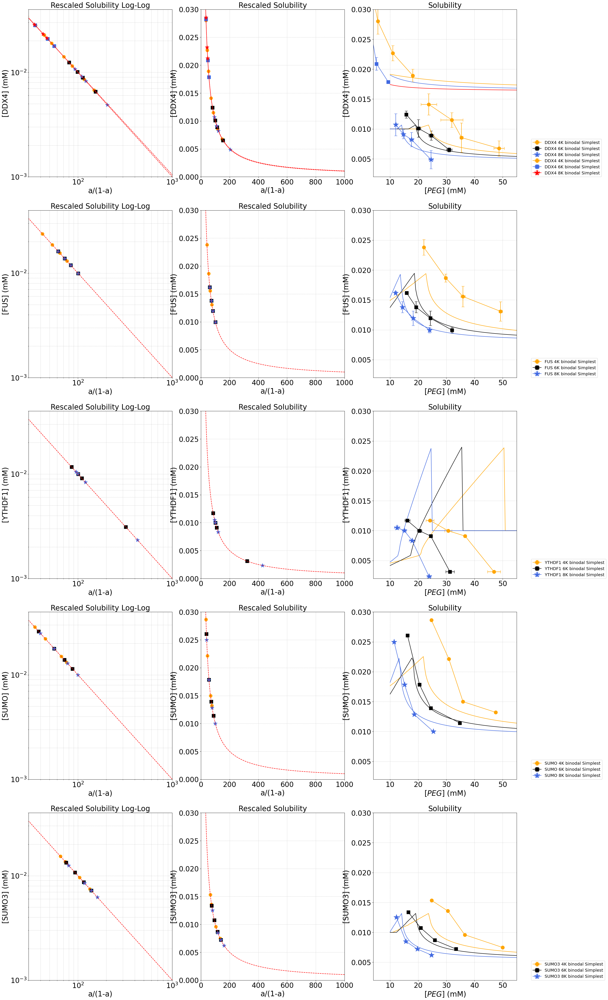

In [ ]:
fig, axes = plt.subplots(5, 3, figsize=(30, 60))

plot_IDR_all(data_DDX4_4K, data_DDX4_6K, data_DDX4_8K, axes[0], 'DDX4', 'orange', 'black', 'royalblue', rddx4, rpeg4, rpeg6, rpeg8, mddx4, mpeg4, mpeg6, mpeg8)
plot_IDR_all(data_GFP_DDX4_4K, data_GFP_DDX4_8K, data_GFP_DDX4_20K, axes[0], 'DDX4', 'orange', 'royalblue', 'red', rddx4, rpeg4, rpeg8, rpeg20, mddx4, mpeg4, mpeg8, mpeg20)

plot_IDR_all(data_FUSNTD_4K, data_FUSNTD_6K, data_FUSNTD_6K, axes[1], 'FUS', 'orange', 'black', 'royalblue', rfus, rpeg4, rpeg6, rpeg8, mfus, mpeg4, mpeg6, mpeg8)
plot_IDR_all(data_YTHDF1_4K, data_YTHDF1_6K, data_YTHDF1_8K, axes[2], 'YTHDF1', 'orange', 'black', 'royalblue', rdf1, rpeg4, rpeg6, rpeg8, mdf1, mpeg4, mpeg6, mpeg8)
plot_IDR_all(data_SUMO1_4K, data_SUMO1_6K, data_SUMO1_8K, axes[3], 'SUMO', 'orange', 'black', 'royalblue', rsumo1, rpeg4, rpeg6, rpeg8, msumo1, mpeg4, mpeg6, mpeg8)
plot_IDR_all(data_SUMO3_4K, data_SUMO3_6K, data_SUMO3_8K, axes[4], 'SUMO3', 'orange', 'black', 'royalblue', rsumo3, rpeg4, rpeg6, rpeg8, msumo3, mpeg4, mpeg6, mpeg8)

# plt.savefig(date_string+'_binodal_scaling_a_FigS3.png')
# plt.savefig(date_string+'_binodal_scaling_simple_FigS3.eps')

/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get_a(cbsa, cpeg, q, solvent)) - b - (1+g)*np.log10(cbsa)
/var/folders/jl/hhm7fywx471fm4g9gf4wkgy80000gq/T/ipykernel_16463/2400337199.py:37: RuntimeWarning: invalid value encountered in log10
  f_out = np.log10(get

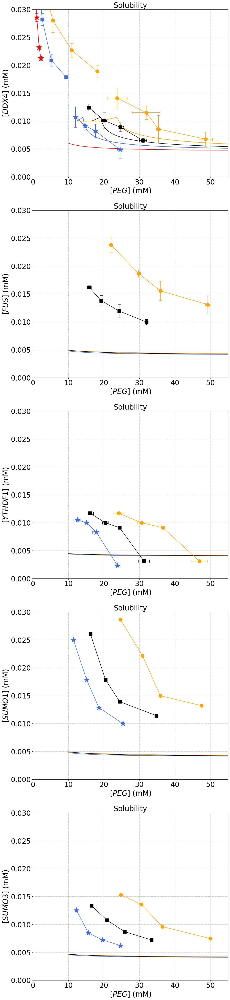

In [ ]:
fig, axes = plt.subplots(5, 1, figsize=(12, 60))

PEG_range = np.linspace(10,55,100)

plotIDR_dat(data_DDX4_4K, axes[0], 'DDX4 4K', 'orange', '-o', 12, mddx4, mpeg4)
plotIDR_dat(data_DDX4_6K, axes[0], 'DDX4 6K', 'black', '-s', 12, mddx4, mpeg6)
plotIDR_dat(data_DDX4_8K, axes[0], 'DDX4 8K', 'royalblue', '-*', 20, mddx4, mpeg8)
plotsolfit(PEG_range, fitparams, rpeg4, rddx4, axes[0], 'orange')
plotsolfit(PEG_range, fitparams, rpeg6, rddx4, axes[0], 'black')
plotsolfit(PEG_range, fitparams, rpeg8, rddx4, axes[0], 'royalblue')

plotIDR_dat(data_GFP_DDX4_4K, axes[0], 'DDX4 4K', 'orange', '-o', 12, mddx4, mpeg4)
plotIDR_dat(data_GFP_DDX4_8K, axes[0], 'DDX4 8K', 'royalblue', '-s', 12, mddx4, mpeg8)
plotIDR_dat(data_GFP_DDX4_20K, axes[0], 'DDX4 20K', 'red', '-*', 20, mddx4, mpeg20)
plotsolfit(PEG_range, fitparams, rpeg4, rddx4, axes[0], 'orange')
plotsolfit(PEG_range, fitparams, rpeg8, rddx4, axes[0], 'royalblue')
plotsolfit(PEG_range, fitparams, rpeg20, rddx4, axes[0], 'red')
axes[0].set_ylabel("$[DDX4]$ (mM)", fontsize = 25)

plotIDR_dat(data_FUSNTD_4K, axes[1], 'FUS 4K', 'orange', '-o', 12, mfus, mpeg4)
plotIDR_dat(data_FUSNTD_6K, axes[1], 'FUS 6K', 'black', '-s', 12, mfus, mpeg6)
# plotIDR_dat(data_FUSNTD_8K, axes[0], 'FUS 8K', 'magenta', '-*', 20, mfus, mpeg8)
plotsolfit(PEG_range, fitparams, rpeg4, rfus, axes[1], 'orange')
plotsolfit(PEG_range, fitparams, rpeg6, rfus, axes[1], 'black')
plotsolfit(PEG_range, fitparams, rpeg8, rfus, axes[1], 'royalblue')
axes[1].set_ylabel("$[FUS]$ (mM)", fontsize = 25)

plotIDR_dat(data_YTHDF1_4K, axes[2], 'YTHDF1 4K', 'orange', '-o', 12, mdf1, mpeg4)
plotIDR_dat(data_YTHDF1_6K, axes[2], 'YTHDF1 6K', 'black', '-s', 12, mdf1, mpeg6)
plotIDR_dat(data_YTHDF1_8K, axes[2], 'YTHDF1 8K', 'royalblue', '-*', 20, mdf1, mpeg8)
plotsolfit(PEG_range, fitparams, rpeg4, rdf1, axes[2], 'orange')
plotsolfit(PEG_range, fitparams, rpeg6, rdf1, axes[2], 'black')
plotsolfit(PEG_range, fitparams, rpeg8, rdf1, axes[2], 'royalblue')
axes[2].set_ylabel("$[YTHDF1]$ (mM)", fontsize = 25)


plotIDR_dat(data_SUMO1_4K, axes[3], 'SUMO1 4K', 'orange', '-o', 12, msumo1, mpeg4)
plotIDR_dat(data_SUMO1_6K, axes[3], 'SUMO1 6K', 'black', '-s', 12, msumo1, mpeg6)
plotIDR_dat(data_SUMO1_8K, axes[3], 'SUMO1 8K', 'royalblue', '-*', 20, msumo1, mpeg8)
plotsolfit(PEG_range, fitparams, rpeg4, rsumo1, axes[3], 'orange')
plotsolfit(PEG_range, fitparams, rpeg6, rsumo1, axes[3], 'black')
plotsolfit(PEG_range, fitparams, rpeg8, rsumo1, axes[3], 'royalblue')
axes[3].set_ylabel("$[SUMO1]$ (mM)", fontsize = 25)

plotIDR_dat(data_SUMO3_4K, axes[4], 'SUMO3 4K', 'orange', '-o', 12, msumo3, mpeg4)
plotIDR_dat(data_SUMO3_6K, axes[4], 'SUMO3 6K', 'black', '-s', 12, msumo3, mpeg6)
plotIDR_dat(data_SUMO3_8K, axes[4], 'SUMO3 8K', 'royalblue', '-*', 20, msumo3, mpeg8)
plotsolfit(PEG_range, fitparams, rpeg4, rsumo3, axes[4], 'orange')
plotsolfit(PEG_range, fitparams, rpeg6, rsumo3, axes[4], 'black')
plotsolfit(PEG_range, fitparams, rpeg8, rsumo3, axes[4], 'royalblue')
axes[4].set_ylabel("$[SUMO3]$ (mM)", fontsize = 25)

for ax in axes:
    ax.tick_params(axis='x', labelsize=24)
    ax.tick_params(axis='y', labelsize=24)
    ax.set_ylim(0,0.03)
    ax.set_xlim(0,55)
    ax.set_title("Solubility", fontsize = 25)
    ax.set_xlabel("$[PEG]$ (mM)", fontsize = 25)

plt.savefig(date_string+'_binodal_scaling_one_a_FigS3.png')

# Fig. S1

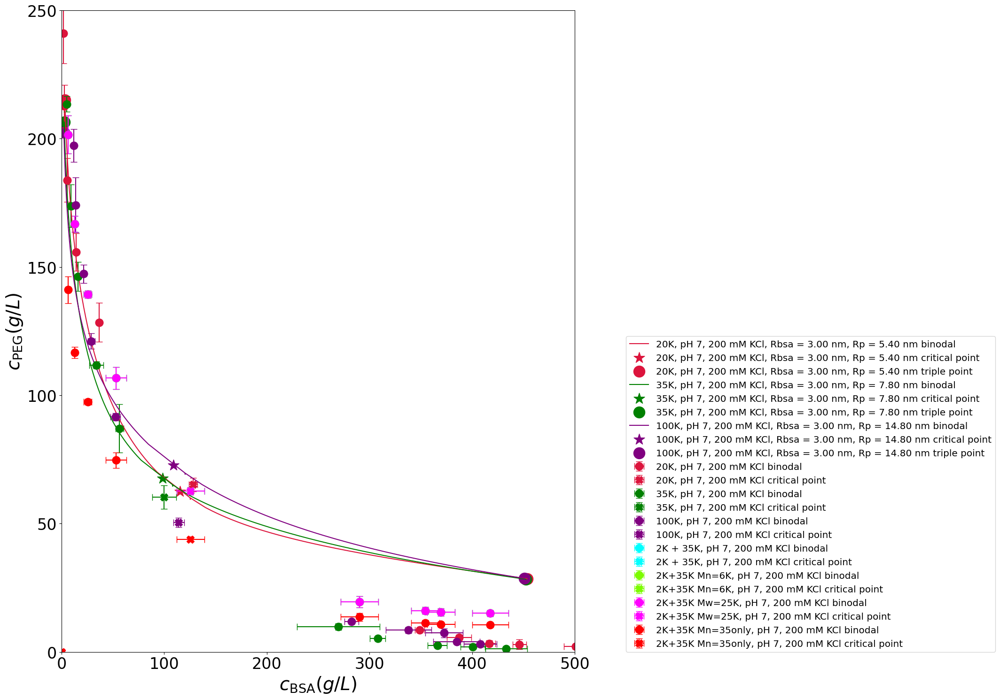

In [601]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,500)
plt.ylim(0,250)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange',False)
# molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', False)
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', False)
molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson')
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green')
molplot_dat_err_csv(data_100K_pH7_200mM, '100K, pH 7, 200 mM KCl', 'purple')
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K + 35K, pH 7, 200 mM KCl', 'cyan')

molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mn=6K, pH 7, 200 mM KCl', 'lawngreen')
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K+35K Mw=25K, pH 7, 200 mM KCl', 'magenta')
molplot_dat_err_csv(data_2K35K_pH7_200mM_35only, '2K+35K Mn=35only, pH 7, 200 mM KCl', 'red')

# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mn=6K, pH 7, 200 mM KCl', 'lawngreen')
# molplot_dat_err_csv(data_4K8K_pH7_200mM_n, '4K+8K Mw=6.7K, pH 7, 200 mM KCl', 'red')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mn=6K, pH 7, 200 mM KCl', 'blue')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW, '2K+8K Mw=7.3K, pH 7, 200 mM KCl', 'cyan')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n,'2K+8K Mn=5K, pH 7, 200 mM KCl', 'lawngreen')
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n,'2K+8K Mw=6.8K, pH 7, 200 mM KCl', 'yellowgreen')


# molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red', False, mbsa=mbsa, mpeg=mpeg4)
# molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'black', 'red', False, mbsa=mbsa, mpeg=mpeg6)
# molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red', False, mbsa=mbsa, mpeg=mpeg8)
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', crit_color='red', mbsa=mbsa, mpeg=mpeg20)
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', crit_color='red', mbsa=mbsa, mpeg=mpeg35)
molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', crit_color='red', mbsa=mbsa, mpeg=mpeg100)

# plt.yscale('log')

# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.png')
# plt.savefig(date_string+'_phase_diagram_MW_Z0_good_mass_Fig02A.eps')

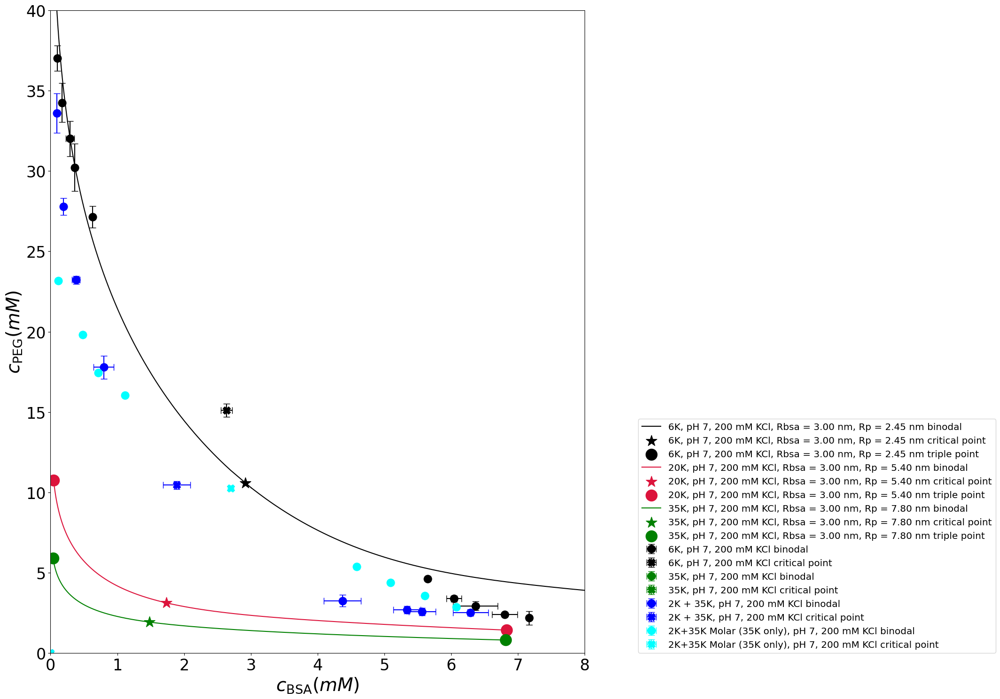

In [43]:
figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
# figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,8)
plt.ylim(0,40)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (mM)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (mM)$',fontsize = 28)
plt.tight_layout()

# molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange',False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', mbsa, mpeg6, False)
# molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', False)
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', False)
molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', False)
molplot_dat_err_csv(data_2K35K_pH7_200mM_n, '2K + 35K, pH 7, 200 mM KCl', 'blue', mbsa, mpeg6, False)
molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW,'2K+35K Molar (35K only), pH 7, 200 mM KCl', 'cyan', mbsa,  8.57, False)
# molplot_dat_err_csv(data_2K8K_pH7_200mM_n_MW,'2K+35K Molar (35K only), pH 7, 200 mM KCl', 'cyan', mbsa,  8.57, False)


# molplot(gfvt4K_200mM_Z0, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red')
molplot(gfvt6K_200mM_Z0, f'6K, pH 7, 200 mM KCl, ', 'black', 'red')
# molplot(gfvt8K_200mM_Z0, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red')
molplot(gfvt20K_200mM_Z0, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red')
molplot(gfvt35K_200mM_Z0, f'35K, pH 7, 200 mM KCl, ', 'green', 'red')
# molplot(gfvt100K_200mM_Z0, f'100K, pH 7, 200 mM KCl, ', 'purple', 'red')

## theta solvent

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


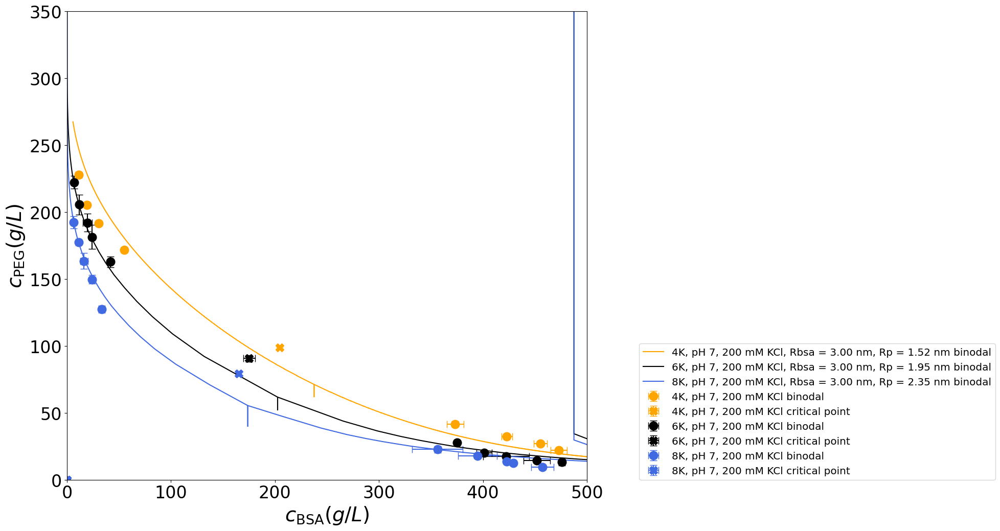

In [368]:
# figh = plt.figure(2, figsize = (12.75,15))  #width x height, aspect ratio 0.85 (0.87)
figh = plt.figure(2, figsize = (12,10.5)) #width x height, aspect ratio 1.14
plt.xlim(0,500)
plt.ylim(0,350)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.xlabel(r'$c_\mathrm{BSA} (g/L)$',fontsize = 28)
plt.ylabel(r'$c_\mathrm{PEG} (g/L)$',fontsize = 28)
plt.tight_layout()

molplot_dat_err_csv(data_4K_pH7_200mM_MA3, '4K, pH 7, 200 mM KCl', 'orange',False)
molplot_dat_err_csv(data_6K_pH7_200mM_SD, '6K, pH 7, 200 mM KCl', 'black', False)
molplot_dat_err_csv(data_8K_pH7_200mM_SD, '8K, pH 7, 200 mM KCl', 'royalblue', False)
# molplot_dat_err_csv(data_20K_pH7_200mM, '20K, pH 7, 200 mM KCl', 'crimson', False)
# molplot_dat_err_csv(data_35K_pH7_200mM, '35K, pH 7, 200 mM KCl', 'green', False)


molplot(gfvt4K_200mM_Z0_theta, f'4K, pH 7, 200 mM KCl, ', 'orange', 'red', False, mbsa, mpeg4)
molplot(gfvt6K_200mM_Z0_theta, f'6K, pH 7, 200 mM KCl, ', 'black', 'red', False, mbsa, mpeg6)
molplot(gfvt8K_200mM_Z0_theta, f'8K, pH 7, 200 mM KCl, ', 'royalblue', 'red', False, mbsa, mpeg8)
# molplot(gfvt20K_200mM_Z0_theta, f'20K, pH 7, 200 mM KCl, ', 'crimson', 'red', False, mbsa, mpeg20)
# molplot(gfvt35K_200mM_Z0_theta, f'35K, pH 7, 200 mM KCl, ', 'green', 'red', False, mbsa, mpeg35)

# plt.yscale('log')

plt.savefig(date_string+'_phase_diagram_MW_Z0_theta_mass_Fig02A.png')
plt.savefig(date_string+'_phase_diagram_MW_Z0_theta_mass_Fig02A.eps')

PEG 4KRbsa = 3.00 nm, Rpol = 1.90 nm, q = 0.63, good solvent GFVT binodal
Assuming good solvent.

PEG 6KRbsa = 3.00 nm, Rpol = 2.45 nm, q = 0.82, good solvent GFVT binodal
Assuming good solvent.

PEG 8KRbsa = 3.00 nm, Rpol = 3.10 nm, q = 1.03, good solvent GFVT binodal
Assuming good solvent.

PEG 20KRbsa = 3.00 nm, Rpol = 5.60 nm, q = 1.87, good solvent GFVT binodal
Assuming good solvent.

PEG 35KRbsa = 3.00 nm, Rpol = 8.40 nm, q = 2.80, good solvent GFVT binodal
Assuming good solvent.

4K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 1.85 nm, q = 0.62, good solvent GFVT binodal
4K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 1.85 nm, q = 0.62, good solvent GFVT binodal
6K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 2.45 nm, q = 0.82, good solvent GFVT binodal
8K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 3.10 nm, q = 1.03, good solvent GFVT binodal
20K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 5.00 nm, q = 1.67, good solvent GFVT binodal
35K, pH 7, 200 mM KClRbsa = 3.00 nm, Rpol = 8.40 nm, q = 2.80, good

(-1.0, 40.0)

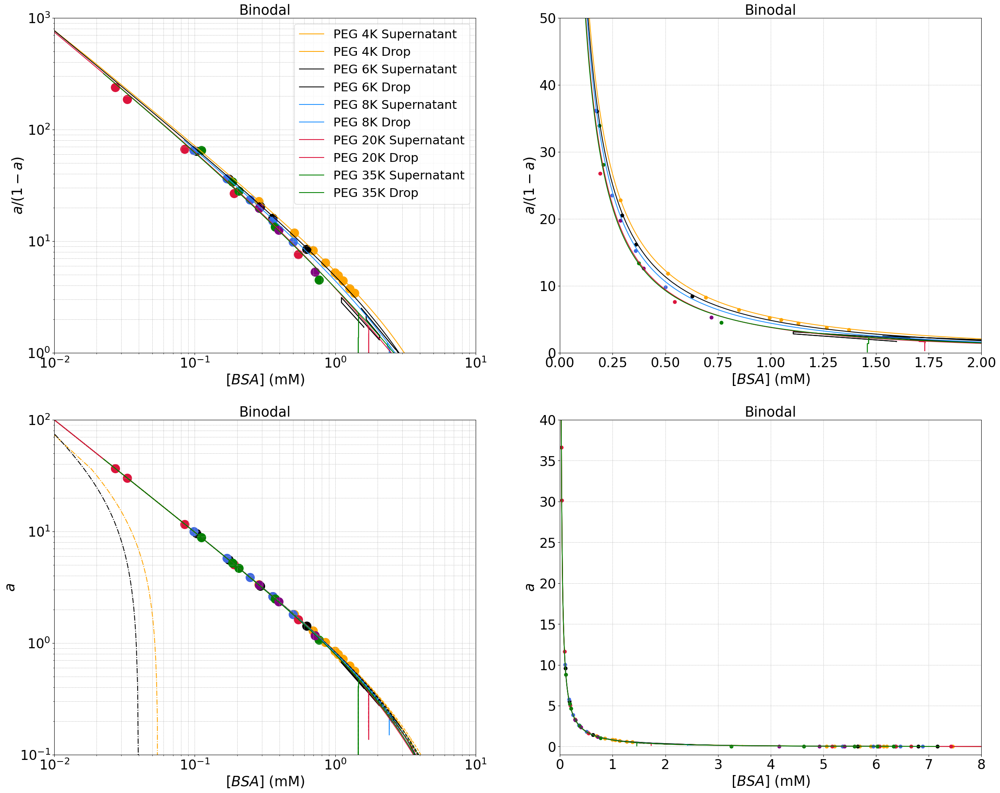

In [485]:
# fig, axes = plt.subplots(1, 3, figsize=(30, 12))
fig, axes = plt.subplots(2, 2, figsize=(30, 24))

scheme = 'a/(1-a)'

binodal_scaling_plots(gfvt4K_200mM_Z0, axes[0], 'orange', 'PEG 4K', '-', scheme)
binodal_scaling_plots(gfvt6K_200mM_Z0, axes[0], 'black', 'PEG 6K', '-', scheme)
binodal_scaling_plots(gfvt8K_200mM_Z0, axes[0], 'dodgerblue', 'PEG 8K', '-', scheme)
binodal_scaling_plots(gfvt20K_200mM_Z0, axes[0], 'crimson', 'PEG 20K', '-', scheme)
binodal_scaling_plots(gfvt35K_200mM_Z0, axes[0], 'green', 'PEG 35K', '-', scheme)

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-.', 'gfvt')

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '--', 'simple')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '--', 'simple')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '--', 'simple')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '--', 'simple')

axes[0][0].tick_params(axis='x', labelsize=24)
axes[0][0].tick_params(axis='y', labelsize=24)
axes[0][0].set_title("Binodal", fontsize = 25)
axes[0][0].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[0][0].set_ylabel("$a$/$(1-a)$", fontsize = 25)
axes[0][0].set_xlim(1e-2,1e1)
axes[0][0].set_ylim(1e-0,1e3)
axes[0][0].legend(fontsize = 22)

scale_dat_binodal(data_4K_pH7_200mM, axes[0], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal(data_4K_pH7_200mM_MA2, axes[0], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal(data_6K_pH7_200mM_SD, axes[0], '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'good', mbsa, mpeg6)
scale_dat_binodal(data_8K_pH7_200mM_SD, axes[0], '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'good', mbsa, mpeg8)
scale_dat_binodal(data_20K_pH7_200mM, axes[0], '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'good', mbsa, mpeg20)
scale_dat_binodal(data_35K_pH7_200mM, axes[0], '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'good', mbsa, mpeg35)
scale_dat_binodal(data_100K_pH7_200mM, axes[0], '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'good', mbsa, mpeg100)

axes[0][1].tick_params(axis='x', labelsize=24)
axes[0][1].tick_params(axis='y', labelsize=24)
axes[0][1].set_title("Binodal", fontsize = 25)
axes[0][1].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[0][1].set_ylabel("$a$/$(1-a)$", fontsize = 25)
axes[0][1].set_xlim(0,2)
axes[0][1].set_ylim(0,50)

scheme = 'a'

binodal_scaling_plots(gfvt4K_200mM_Z0, axes[1], 'orange', 'PEG 4K', '-', scheme)
binodal_scaling_plots(gfvt6K_200mM_Z0, axes[1], 'black', 'PEG 6K', '-', scheme)
binodal_scaling_plots(gfvt8K_200mM_Z0, axes[1], 'dodgerblue', 'PEG 8K', '-', scheme)
binodal_scaling_plots(gfvt20K_200mM_Z0, axes[1], 'crimson', 'PEG 20K', '-', scheme)
binodal_scaling_plots(gfvt35K_200mM_Z0, axes[1], 'green', 'PEG 35K', '-', scheme)

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '-.', 'gfvt')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '-.', 'gfvt')

# binodal_scaling_plots(gfvt4K_200mM_Z0, axes, 'orange', 'PEG 4K', '--', 'simple')
# binodal_scaling_plots(gfvt6K_200mM_Z0, axes, 'black', 'PEG 6K', '--', 'simple')
# binodal_scaling_plots(gfvt8K_200mM_Z0, axes, 'dodgerblue', 'PEG 8K', '--', 'simple')
# binodal_scaling_plots(gfvt35K_200mM_Z0, axes, 'green', 'PEG 35K', '--', 'simple')

axes[1][0].tick_params(axis='x', labelsize=24)
axes[1][0].tick_params(axis='y', labelsize=24)
axes[1][0].set_title("Binodal", fontsize = 25)
axes[1][0].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[1][0].set_ylabel("$a$", fontsize = 25)
axes[1][0].set_xlim(1e-2,1e1)
axes[1][0].set_ylim(1e-1,1e2)

# axes[1][0].set_xlim(8e-1,2e0)
# axes[1][0].set_ylim(5e-1,1)
# axes[0][0].legend(fontsize = 22)

scale_dat_binodal_a(data_4K_pH7_200mM, axes[1], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal_a(data_4K_pH7_200mM_MA2, axes[1], '4K, pH 7, 200 mM KCl', 'orange', 3e-9, 1.85e-9, 'good', mbsa, mpeg4)
scale_dat_binodal_a(data_6K_pH7_200mM_SD, axes[1], '6K, pH 7, 200 mM KCl', 'black', 3e-9, 2.45e-9, 'good', mbsa, mpeg6)
scale_dat_binodal_a(data_8K_pH7_200mM_SD, axes[1], '8K, pH 7, 200 mM KCl', 'royalblue', 3e-9, 3.1e-9, 'good', mbsa, mpeg8)
scale_dat_binodal_a(data_20K_pH7_200mM, axes[1], '20K, pH 7, 200 mM KCl', 'crimson', 3e-9,  5.0e-9, 'good', mbsa, mpeg20)
scale_dat_binodal_a(data_35K_pH7_200mM, axes[1], '35K, pH 7, 200 mM KCl', 'green', 3e-9,  8.4e-9, 'good', mbsa, mpeg35)
scale_dat_binodal_a(data_100K_pH7_200mM, axes[1], '100K, pH 7, 200 mM KCl', 'purple', 3e-9,  15e-9, 'good', mbsa, mpeg100)

axes[1][1].tick_params(axis='x', labelsize=24)
axes[1][1].tick_params(axis='y', labelsize=24)
axes[1][1].set_title("Binodal", fontsize = 25)
axes[1][1].set_xlabel("$[BSA]$ (mM)", fontsize = 25)
axes[1][1].set_ylabel("$a$", fontsize = 25)
axes[1][1].set_xlim(0,8)
axes[1][1].set_ylim(-1,40)
# axes[1].legend(loc=(1.1,0), fontsize = 22)

# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt_compare.png')
# plt.savefig(date_string+'_binodal_scaling_Z0_good_gfvt.eps')

In [41]:
(4/3*np.pi*(3e-9))**3*6.022e23/66400*1e6

17.99708898012197